In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import warnings
# Ignore warnings
warnings.filterwarnings("ignore")

Importing the Required Libraries for Data Preprocessing

In [ ]:
import pandas as pd
import matplotlib as plt
from scipy.stats import zscore
import seaborn as sns

In [ ]:
pip install scikit-learn-intelex

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.9/137.9 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.5/10.5 MB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.2/63.2 MB 4.3 MB/s eta 0:00:00


In [ ]:
import numpy as np
np.random.seed(42)

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_predict, cross_val_score
from sklearn.metrics import (accuracy_score, classification_report, confusion_matrix,
                             precision_score, recall_score, f1_score, roc_curve, auc, roc_auc_score)
from sklearn.preprocessing import label_binarize

In [ ]:
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from xgboost import XGBClassifier

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.covariance import EllipticEnvelope
from imblearn.over_sampling import SMOTE # smote for oversampling
from sklearn.utils import shuffle # data shuffling

Reading our dataset

In [ ]:
df= pd.read_csv("/content/drive/MyDrive/ML_Project/Heart_disease_cleveland.csv")

In [ ]:
df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,0,145,233,1,2,150,0,2.3,2,0,2,0
1,67,1,3,160,286,0,2,108,1,1.5,1,3,1,1
2,67,1,3,120,229,0,2,129,1,2.6,1,2,3,1
3,37,1,2,130,250,0,0,187,0,3.5,2,0,1,0
4,41,0,1,130,204,0,2,172,0,1.4,0,0,1,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        303 non-null    int64  
 12  thal      303 non-null    int64  
 13  target    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


### Basic Data Preprocessing before generating additional records

Missing Values

In [ ]:
# checking if there are any missing values in the dataset
missing_count = df.isnull().sum()
print('Number of missing values in the dataset: ' , missing_count.sum())

Number of missing values in the dataset:  0


Checking for Duplicates

In [ ]:
duplicate_records = df.duplicated()
print('Number of duplicate values in the dataset: ', duplicate_records.sum())
print(duplicate_records)

Number of duplicate values in the dataset:  0
0      False
1      False
2      False
3      False
4      False
       ...  
298    False
299    False
300    False
301    False
302    False
Length: 303, dtype: bool


Data Outlier Detection

In [ ]:
def detect_outliers(df):
  z_score = 3 # define the threshold for z-scores to identify the outliers in the dataframe
  columns = df.select_dtypes(include=['number']) # only detect the outliers in numeric columns and not the categorically encoded ones
  outliers = np.abs(zscore(columns)) > z_score
  outliers_indices = np.where(outliers)
  outliers_values = columns.iloc[outliers_indices]
  return outliers_values

In [ ]:
outliers_df = detect_outliers(df)
print("Values of outliers:")
print(outliers_df)

Values of outliers:
     chol  oldpeak  chol  oldpeak  trestbps  chol  chol  trestbps  thalach
48    417      0.8   417      0.8       140   417   417       140      157
91    164      6.2   164      6.2       160   164   164       160      145
121   407      4.0   407      4.0       150   407   407       150      154
123   217      5.6   217      5.6       140   217   217       140      111
126   288      4.0   288      4.0       200   288   288       200      133
152   564      1.6   564      1.6       115   564   564       115      160
181   409      1.9   409      1.9       134   409   409       134      150
188   283      0.0   283      0.0       192   283   283       192      195
245   237      1.0   237      1.0       120   237   237       120       71


Visualization for Outlier Detection

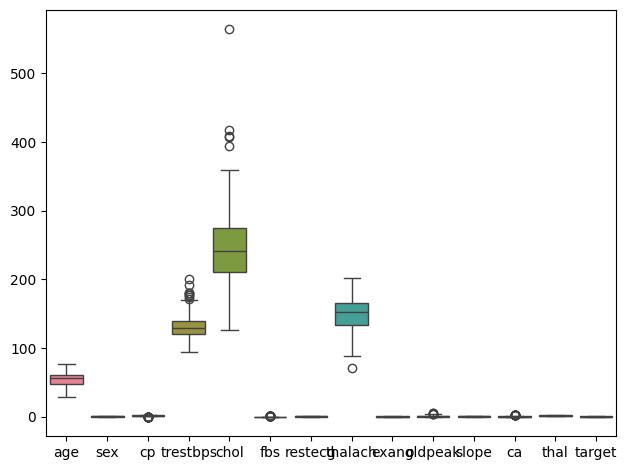

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.boxplot(df)
plt.tight_layout()
plt.show()


Summary :

* Using boxplot and calculating the z-score of our numeric columns, we deduce 'chol', 'oldpeak', 'trestbps' and 'thalach; have outliers present in them

* The following code is to experiment whether removing outliers or replacing them would increase the performance of our dataset by training it using a classifier.

Outlier Removal

In [ ]:
df_remove_outliers = df.copy()
df_cleaned_outliers = df_remove_outliers.drop(outliers_df.index)

# Print the cleaned DataFrame
print("DataFrame after removing outliers: ")
print(df_cleaned_outliers)

DataFrame after removing outliers: 
     age  sex  cp  trestbps  chol  fbs  restecg  thalach  exang  oldpeak  \
0     63    1   0       145   233    1        2      150      0      2.3   
1     67    1   3       160   286    0        2      108      1      1.5   
2     67    1   3       120   229    0        2      129      1      2.6   
3     37    1   2       130   250    0        0      187      0      3.5   
4     41    0   1       130   204    0        2      172      0      1.4   
..   ...  ...  ..       ...   ...  ...      ...      ...    ...      ...   
298   45    1   0       110   264    0        0      132      0      1.2   
299   68    1   3       144   193    1        0      141      0      3.4   
300   57    1   3       130   131    0        0      115      1      1.2   
301   57    0   1       130   236    0        2      174      0      0.0   
302   38    1   2       138   175    0        0      173      0      0.0   

     slope  ca  thal  target  
0        2   0     2

A total of 9 records were removed from our dataset and now we proceed to split the dataset to perform scaling and test the performance of our dataset

In [ ]:
# Splitting the dataset into X and Y
X_cleaned_outliers = df_cleaned_outliers.drop('target', axis=1).values
y_cleaned_outliers = df_cleaned_outliers['target'].values

# Data is split into training and testing sets in the ratio 80-20 respectively
X_train_cleaned_outliers, X_test_cleaned_outliers, y_train_cleaned_outliers, y_test_cleaned_outliers = train_test_split(X_cleaned_outliers, y_cleaned_outliers, test_size=0.2, random_state=42)

In [ ]:
X_train_cleaned_outliers

array([[69.,  1.,  2., ...,  1.,  3.,  3.],
       [46.,  0.,  3., ...,  1.,  0.,  1.],
       [64.,  1.,  3., ...,  1.,  2.,  2.],
       ...,
       [61.,  1.,  3., ...,  1.,  1.,  3.],
       [58.,  0.,  3., ...,  1.,  0.,  1.],
       [49.,  1.,  2., ...,  1.,  3.,  3.]])

In [ ]:
#scale_columns = ['trestbps', 'chol','thalach','oldpeak','age']
scale_columns = [0,3,4,7,9]
# Use the min-max scaler for scaling
scaler = MinMaxScaler()
# Copying the X train and X test into new variables so as to transform the numeric columns
X_train_scaled_cleaned = X_train_cleaned_outliers.copy()
X_test_scaled_cleaned = X_test_cleaned_outliers.copy()
# scale the feature
X_train_scaled_cleaned[:, scale_columns] = scaler.fit_transform(X_train_cleaned_outliers[:, scale_columns])
X_test_scaled_cleaned[:, scale_columns] = scaler.transform(X_test_cleaned_outliers[:, scale_columns])

Testing the performance

1. Without outliers

In [ ]:
gnb_model = GaussianNB()

# Fit the model
gnb_model.fit(X_train_scaled_cleaned, y_train_cleaned_outliers)
# Make predictions
y_pred = gnb_model.predict(X_test_scaled_cleaned)
# Evaluating the model
accuracy = accuracy_score(y_test_cleaned_outliers, y_pred)
classification_rep = classification_report(y_test_cleaned_outliers, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:", classification_rep)

Accuracy: 0.7796610169491526
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.73      0.79        33
           1       0.71      0.85      0.77        26

    accuracy                           0.78        59
   macro avg       0.78      0.79      0.78        59
weighted avg       0.79      0.78      0.78        59



2. On scaled data without removing outliers

In [ ]:
df_scaled = df.copy()
X_scaled = df_scaled.drop('target', axis=1).values
y_scaled = df_scaled['target'].values

X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=42)

In [ ]:
#scale_columns = ['trestbps', 'chol','thalach','oldpeak','age']
scale_columns = [0,3,4,7,9]

scaler = MinMaxScaler()
# Copy the X train and X test into new variables so as to transform the numeric columns
X_train_scaled_copy = X_train_scaled.copy()
X_test_scaled_copy = X_test_scaled.copy()
# scale the feature
X_train_scaled_copy[:, scale_columns] = scaler.fit_transform(X_train_scaled[:, scale_columns])
X_test_scaled_copy[:, scale_columns] = scaler.transform(X_test_scaled[:, scale_columns])

In [ ]:
gnb_model = GaussianNB()
# Fit the model
gnb_model.fit(X_train_scaled_copy, y_train_scaled)
# Make predictions
y_pred = gnb_model.predict(X_test_scaled_copy)
# Evaluating the model
accuracy = accuracy_score(y_test_scaled, y_pred)
classification_rep = classification_report(y_test_scaled, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy: 0.8524590163934426
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.90      0.85        29
           1       0.90      0.81      0.85        32

    accuracy                           0.85        61
   macro avg       0.85      0.85      0.85        61
weighted avg       0.86      0.85      0.85        61



From the above results, we can conclude that the accuracy of the Gaussian Bayes classifier only reaches 77% after removing outliers and scaling the features, whereas without dealing with the outliers and performing scaling only, the accuracy of the model reaches 85%.

Alternative to removal of outliers : Clipping

In [ ]:
def clip_outliers(df):

    # get X and Y features
    X = df.drop('target', axis=1).values
    y = df['target'].values
    mean = np.mean(X, axis=0) # Calculate mean
    std_dev = np.std(X, axis=0) # Calculate standard deviation
    z_scores = (X - mean) / std_dev # Calculate Z-scores
    clip_range = 3 # defining the clip range
    z_scores_clipped = np.clip(z_scores, -clip_range, clip_range) # Clip Z-scores to the specified range
    X_clipped = z_scores_clipped * std_dev + mean # Transform clipped Z-scores back to original scale

    # return a new DataFrame with the clipped values
    df_clipped = pd.DataFrame(X_clipped, columns=df.columns[:-1])
    df_clipped['target'] = y
    return df_clipped

In [ ]:
df_clipped = clip_outliers(df)

In [ ]:
X_clipped= df_clipped.drop('target', axis=1).values
y_clipped = df_clipped['target'].values

# Splitting the data into training and testing sets in the ratio 80-20 respectively
X_train_clipped, X_test_clipped, y_train_clipped, y_test_clipped = train_test_split(X_clipped, y_clipped, test_size=0.2, random_state=42)

In [ ]:
#scale_columns = ['trestbps', 'chol','thalach','oldpeak','age']
scale_columns = [0,3,4,7,9]
# Use the min-max scaler
scaler = MinMaxScaler()
# Copy the X train and X test into new variables so as to transform the numeric columns
X_train_clipped_scaled = X_train_clipped.copy()
X_test_clipped_scaled = X_test_clipped.copy()
# scale the feature
X_train_clipped_scaled[:, scale_columns] = scaler.fit_transform(X_train_clipped[:, scale_columns])
X_test_clipped_scaled[:, scale_columns] = scaler.transform(X_test_clipped[:, scale_columns])

In [ ]:
gnb_model = GaussianNB()
# Fit the model on the training data
gnb_model.fit(X_train_clipped_scaled, y_train_clipped)
# Make predictions on the test data
y_pred = gnb_model.predict(X_test_clipped_scaled)
# Evaluate the model
accuracy = accuracy_score(y_test_clipped, y_pred)
classification_rep = classification_report(y_test_clipped, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy: 0.8524590163934426
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.90      0.85        29
           1       0.90      0.81      0.85        32

    accuracy                           0.85        61
   macro avg       0.85      0.85      0.85        61
weighted avg       0.86      0.85      0.85        61



With this, we have achieved the same accuracy as our model on scaled data and we have also dealt with outliers.

Final Data Preprocessing Steps

* Step 1 - Do clipping for dealing with outliers
* Step 2 - Do Min-Max Scaling

In [ ]:
# Combining all of X and Y features to get our final preprocessed dataframe

X_combined = np.concatenate([X_train_clipped_scaled, X_test_clipped_scaled])
y_combined = np.concatenate([y_train_clipped, y_test_clipped])
X_combined_df = pd.DataFrame(X_combined)
y_combined_df = pd.DataFrame(y_combined)

final_df = pd.concat([X_combined_df, y_combined_df], axis=1)
final_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,0
0,0.000000,1.0,1.0,0.398222,0.282847,0.0,2.0,1.000000,0.0,0.000000,0.0,0.0,1.0,0
1,0.583333,1.0,2.0,0.619457,0.000000,1.0,0.0,0.760141,0.0,0.044276,0.0,1.0,3.0,0
2,0.833333,1.0,0.0,0.730074,0.391635,1.0,2.0,0.412759,0.0,0.022138,1.0,1.0,1.0,0
3,0.750000,0.0,2.0,0.730074,0.848542,0.0,2.0,0.578179,0.0,0.177106,0.0,0.0,1.0,0
4,0.479167,1.0,3.0,0.154864,0.388008,1.0,0.0,0.545095,0.0,0.022138,0.0,3.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,0.687500,1.0,1.0,0.376099,0.297352,1.0,2.0,0.487198,0.0,0.000000,0.0,0.0,1.0,0
299,0.416667,1.0,2.0,0.287605,0.224827,0.0,0.0,0.478927,0.0,0.442764,1.0,3.0,3.0,1
300,0.583333,1.0,3.0,0.398222,0.018131,0.0,0.0,0.280423,1.0,0.265659,1.0,1.0,3.0,1
301,0.687500,0.0,3.0,0.486716,0.609209,1.0,0.0,0.205984,0.0,0.420626,1.0,3.0,1.0,1


In [ ]:
# Rename all columns to the original column names
final_df.columns = ['age','sex', 'cp', 'trestbps', 'chol', 'fbs',	'restecg', 'thalach', 'exang', 'oldpeak',	'slope', 'ca',	'thal', 'target']
print("Preprocessed DataFrame")
final_df


Preprocessed DataFrame


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,0.000000,1.0,1.0,0.398222,0.282847,0.0,2.0,1.000000,0.0,0.000000,0.0,0.0,1.0,0
1,0.583333,1.0,2.0,0.619457,0.000000,1.0,0.0,0.760141,0.0,0.044276,0.0,1.0,3.0,0
2,0.833333,1.0,0.0,0.730074,0.391635,1.0,2.0,0.412759,0.0,0.022138,1.0,1.0,1.0,0
3,0.750000,0.0,2.0,0.730074,0.848542,0.0,2.0,0.578179,0.0,0.177106,0.0,0.0,1.0,0
4,0.479167,1.0,3.0,0.154864,0.388008,1.0,0.0,0.545095,0.0,0.022138,0.0,3.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,0.687500,1.0,1.0,0.376099,0.297352,1.0,2.0,0.487198,0.0,0.000000,0.0,0.0,1.0,0
299,0.416667,1.0,2.0,0.287605,0.224827,0.0,0.0,0.478927,0.0,0.442764,1.0,3.0,3.0,1
300,0.583333,1.0,3.0,0.398222,0.018131,0.0,0.0,0.280423,1.0,0.265659,1.0,1.0,3.0,1
301,0.687500,0.0,3.0,0.486716,0.609209,1.0,0.0,0.205984,0.0,0.420626,1.0,3.0,1.0,1


In [ ]:
final_df.to_csv('preprocessed_cleveland_dataset.csv', index=False)

,0,1,2,3,4,5,6,7,8,9,10,11,12,0
0,0.000000,1.0,1.0,0.398222,0.282847,0.0,2.0,1.000000,0.0,0.000000,0.0,0.0,1.0,0
1,0.583333,1.0,2.0,0.619457,0.000000,1.0,0.0,0.760141,0.0,0.044276,0.0,1.0,3.0,0
2,0.833333,1.0,0.0,0.730074,0.391635,1.0,2.0,0.412759,0.0,0.022138,1.0,1.0,1.0,0
3,0.750000,0.0,2.0,0.730074,0.848542,0.0,2.0,0.578179,0.0,0.177106,0.0,0.0,1.0,0
4,0.479167,1.0,3.0,0.154864,0.388008,1.0,0.0,0.545095,0.0,0.022138,0.0,3.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,0.687500,1.0,1.0,0.376099,0.297352,1.0,2.0,0.487198,0.0,0.000000,0.0,0.0,1.0,0
299,0.416667,1.0,2.0,0.287605,0.224827,0.0,0.0,0.478927,0.0,0.442764,1.0,3.0,3.0,1
300,0.583333,1.0,3.0,0.398222,0.018131,0.0,0.0,0.280423,1.0,0.265659,1.0,1.0,3.0,1
301,0.687500,0.0,3.0,0.486716,0.609209,1.0,0.0,0.205984,0.0,0.420626,1.0,3.0,1.0,1


### Synthetic Data Generation

Generated 50,000 records with our preprocessed dataset

In [ ]:
# Reading our synthetic dataset
df = pd.read_csv("/content/drive/MyDrive/ML_Project/synthetic_dataset.csv")

In [ ]:
df

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,0.250000,0.0,1.0,0.353975,0.123292,0.0,0.0,0.677431,0.0,0.000000,0.0,0.0,1.0,0
1,0.520833,1.0,3.0,0.154864,0.638219,0.0,2.0,0.710515,0.0,0.000000,0.0,0.0,1.0,0
2,0.312500,1.0,2.0,0.508839,0.395261,0.0,0.0,0.818038,0.0,0.000000,0.0,0.0,1.0,0
3,0.333333,1.0,3.0,0.110617,0.413392,0.0,2.0,0.553366,1.0,0.664146,1.0,0.0,1.0,0
4,0.333333,0.0,2.0,0.398222,0.054394,0.0,0.0,0.776683,0.0,0.132829,1.0,0.0,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0.625000,1.0,2.0,0.619457,0.311857,1.0,0.0,0.627805,0.0,0.354211,0.0,0.0,1.0,0
49996,0.458333,1.0,2.0,0.066370,0.348120,0.0,0.0,0.512011,1.0,0.265659,1.0,0.0,1.0,0
49997,0.791667,0.0,2.0,0.232296,1.000000,0.0,2.0,0.652618,0.0,0.354211,1.0,0.0,3.0,0
49998,0.833333,1.0,0.0,0.730074,0.391635,1.0,2.0,0.412759,0.0,0.022138,1.0,1.0,1.0,0


In [ ]:
df.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.00000,50000.000000,50000.000000,50000.000000
mean,0.525719,0.648380,2.119840,0.417174,0.432527,0.134680,0.944700,0.581410,0.314420,0.230266,0.58648,0.576920,1.738780,0.407860
std,0.186485,0.477481,0.965162,0.185903,0.178184,0.341385,0.989839,0.178716,0.464289,0.236619,0.61713,0.861474,0.937764,0.491442
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,1.000000,0.000000
25%,0.354167,0.000000,1.000000,0.287605,0.315483,0.000000,0.000000,0.487198,0.000000,0.000000,0.00000,0.000000,1.000000,0.000000
50%,0.541667,1.000000,2.000000,0.398222,0.409766,0.000000,0.000000,0.619534,0.000000,0.177106,1.00000,0.000000,1.000000,0.000000
75%,0.645833,1.000000,3.000000,0.508839,0.536684,0.000000,2.000000,0.696041,1.000000,0.354211,1.00000,1.000000,3.000000,1.000000
max,1.000000,1.000000,3.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,2.00000,3.000000,3.000000,1.000000


Checking for any missing values or outliers after generating data

In [ ]:
# checking if there are any missing values in the dataset
missing_count = df.isnull().sum()
print('Number of missing values in the dataset: ' , missing_count.sum())

Number of missing values in the dataset:  0


In [ ]:
def detect_outliers_iqr(df):
  threshold = 3
  q1 = np.percentile(df, 25) # calculate q1 (1/4) quartile
  q3 = np.percentile(df, 75) # calculate q3 (3/4) quartile
  iqr = q3 - q1
  outliers = df[(df < q1 - threshold * iqr) | (df > q3 + threshold * iqr)] # calculate outliers formula
  print("Number of Outliers:", outliers.sum().sum())
  return outliers

In [ ]:
outliers_df = detect_outliers_iqr(df)
print(outliers_df.sum())

Number of Outliers: 0.0
age         0.0
sex         0.0
cp          0.0
trestbps    0.0
chol        0.0
fbs         0.0
restecg     0.0
thalach     0.0
exang       0.0
oldpeak     0.0
slope       0.0
ca          0.0
thal        0.0
target      0.0
dtype: float64


Helper Functions

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
# Helper function to plot ROC curves
def plot_roc_for_classes(true_bin_labels, score, classes, title="ROC Curve"):
    fpr, tpr, _ = roc_curve(true_bin_labels, score)
    roc_auc = auc(fpr, tpr)

    # Plot the ROC
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(title)
    plt.legend(loc="lower right")
    plt.show()

# Helper function to find specificity
def specificity(cm):
    FP = cm.sum(axis=0) - np.diag(cm)
    FN = cm.sum(axis=1) - np.diag(cm)
    TP = np.diag(cm)
    TN = cm.sum() - (FP + FN + TP)
    specificity = TN/(TN+FP)
    return np.mean(specificity)

# Helper functions to print overall metrics
def print_overall_metrics(true_labels, pred_labels):
    acc = accuracy_score(true_labels, pred_labels)
    presc = precision_score(true_labels, pred_labels, average='weighted', zero_division=0)
    rec = recall_score(true_labels, pred_labels, average='weighted', zero_division=1)
    f1 = f1_score(true_labels, pred_labels, average='weighted', zero_division=1)
    tpr = rec
    # Calculate FPR correctly using roc_curve
    s = specificity(confusion_matrix(true_labels, pred_labels))
    fpr = 1 - s

    print('Accuracy:', acc)
    print('Precision:', presc)
    print('Recall (TPR):', tpr)
    print('False Positive Rate (FPR):', fpr)
    print('F1 score (F-measure):', f1)
    print('Specificity:', s)
    print("------------------------------------------------------------------------------------------------")

# Helper functions to print class-wise metrics
def get_classwise_metrics_dataframe(true_labels, pred_labels, unique_labels):
    metrics_data = []
    matrix = confusion_matrix(true_labels, pred_labels, labels=unique_labels)

    for i, label in enumerate(unique_labels):
        tp = matrix[i, i]
        fp = np.sum(matrix[:, i]) - tp
        fn = np.sum(matrix[i, :]) - tp
        tn = np.sum(matrix) - tp - fp - fn

        tpr = tp / (tp + fn) if (tp + fn) != 0 else 0
        fpr = fp / (fp + tn) if (fp + tn) != 0 else 0
        precision = tp / (tp + fp) if (tp + fp) != 0 else 0
        recall = tpr
        f_measure = (2 * precision * recall) / (precision + recall) if (precision + recall) != 0 else 0
        accuracy = (tp + tn) / (tp + tn + fp + fn)

        metrics_data.append([label, accuracy, precision, recall, fpr, f_measure, tp, fp, tn, fn])

    df = pd.DataFrame(metrics_data, columns=['Class', 'Accuracy', 'Precision', 'Recall (TPR)', 'FPR', 'F1 Score (F-measure)', 'TP', 'FP', 'TN', 'FN'])

    return df

# Helper function to plot confusion matrix
def plot_confusion_matrix(matrix, dataset_name, unique_labels):
    plt.figure(figsize=(8,6))
    sns.heatmap(matrix, annot=True, fmt='d', cmap='Blues')
    tick_marks = np.arange(len(unique_labels))
    plt.xticks(tick_marks + 0.5, unique_labels, rotation=45)  # +0.5 to center the label
    plt.yticks(tick_marks + 0.5, unique_labels)  # +0.5 to center the label
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(f'Confusion Matrix')
    plt.show()

In [ ]:
def runclassifier(model, X_train, y_train, X_test, y_test):

    labels_series = y_train['target']
    unique_labels = sorted(labels_series.unique())

    # Binarize the labels for ROC curve generation
    y_train_bin = label_binarize(y_train, classes=unique_labels)
    y_test_bin = label_binarize(y_test, classes=unique_labels)

    model.fit(X_train, y_train)
    y_train_pred = cross_val_predict(model, X_train, y_train, cv=10)
    y_test_pred = model.predict(X_test)

    # Overall metrics for training set
    print("Overall Metrics for Training set:")
    print("------------------------------------------------------------------------------------------------")
    print_overall_metrics(y_train, y_train_pred)

    # Display metrics in tabular format for each class
    classwise_df_train = get_classwise_metrics_dataframe(y_train, y_train_pred, unique_labels)
    print("\nClasswise Metrics for Training Set:")
    display(classwise_df_train)

    print("------------------------------------------------------------------------------------------------")
    print("Confusion Matrix for Train Set")
    print("------------------------------------------------------------------------------------------------")
    plot_confusion_matrix(confusion_matrix(y_train, y_train_pred), 'Training Set', unique_labels)
    print("------------------------------------------------------------------------------------------------")
    #print("ROC Curve for Train Set")
    #print("------------------------------------------------------------------------------------------------")
    #plot_roc_for_classes(y_train_bin, model.predict_proba(X_train)[:, 1], unique_labels, title="ROC Curve (Training Data)")
    #print("------------------------------------------------------------------------------------------------")
    # Overall metrics for test set
    print("\nOverall Metrics for Test set:")
    print("------------------------------------------------------------------------------------------------")
    print_overall_metrics(y_test, y_test_pred)

    # Display metrics in tabular format for each class
    classwise_df_test = get_classwise_metrics_dataframe(y_test, y_test_pred, unique_labels)
    print("\nClasswise Metrics for Test Set:")
    display(classwise_df_test)

    print("------------------------------------------------------------------------------------------------")
    print("Confusion Matrix for Test Set")
    print("------------------------------------------------------------------------------------------------")
    plot_confusion_matrix(confusion_matrix(y_test, y_test_pred), 'Test Set', unique_labels)
   # print("------------------------------------------------------------------------------------------------")
    #print("ROC Curve for Test Set")
    #print("------------------------------------------------------------------------------------------------")
    #plot_roc_for_classes(y_test_bin, model.predict_proba(X_test)[:, 1], unique_labels, title="ROC Curve (Test Data)")

     # Create metrics dictionary
    metrics_dict = {
        "Model": model.__class__.__name__,
        "Training Metrics": {
            "Accuracy": accuracy_score(y_train, y_train_pred),
            "Precision": precision_score(y_train, y_train_pred, average='weighted',zero_division=0),
            "Recall": recall_score(y_train, y_train_pred, average='weighted'),
            "F1 score": f1_score(y_train, y_train_pred, average='weighted'),
            "TP": np.diag(confusion_matrix(y_train, y_train_pred)),
            "FP": confusion_matrix(y_train, y_train_pred).sum(axis=0) - np.diag(confusion_matrix(y_train, y_train_pred)),
            "TN": confusion_matrix(y_train, y_train_pred).sum() - (confusion_matrix(y_train, y_train_pred).sum(axis=1) + confusion_matrix(y_train, y_train_pred).sum(axis=0)- np.diag(confusion_matrix(y_train, y_train_pred))),
            "FN": confusion_matrix(y_train, y_train_pred).sum(axis=1)-np.diag(confusion_matrix(y_train, y_train_pred)),
            "Sensitivity (TPR)": recall_score(y_train, y_train_pred, average='weighted'),
            "Specificity": specificity(confusion_matrix(y_train, y_train_pred)),
            "FPR": 1 - specificity(confusion_matrix(y_train, y_train_pred))
        },
        "Test Metrics": {
            "Accuracy": accuracy_score(y_test, y_test_pred),
            "Precision": precision_score(y_test, y_test_pred, average='weighted',zero_division=0),
            "Recall": recall_score(y_test, y_test_pred,average='weighted'),
            "F1 score": f1_score(y_test, y_test_pred, average='weighted'),
            "TP": np.diag(confusion_matrix(y_test, y_test_pred)),
            "FP": confusion_matrix(y_test, y_test_pred).sum(axis=0) - np.diag(confusion_matrix(y_test, y_test_pred)),
            "TN": confusion_matrix(y_test, y_test_pred).sum() - (confusion_matrix(y_test, y_test_pred).sum(axis=1) + confusion_matrix(y_test, y_test_pred).sum(axis=0)- np.diag(confusion_matrix(y_test, y_test_pred))),
            "FN": confusion_matrix(y_test, y_test_pred).sum(axis=1)-np.diag(confusion_matrix(y_test, y_test_pred)),
            #"TP": confusion_matrix(y_test, y_test_pred).sum(axis=1),
            #"FP": confusion_matrix(y_test, y_test_pred).sum(axis=0) - np.diag(confusion_matrix(y_test, y_test_pred)),
            #"TN": confusion_matrix(y_test, y_test_pred).sum() - (confusion_matrix(y_test, y_test_pred).sum(axis=1) + confusion_matrix(y_test, y_test_pred).sum(axis=0)),
            #"FN": np.diag(confusion_matrix(y_test, y_test_pred)),
            "Sensitivity (TPR)": recall_score(y_test, y_test_pred, average='weighted'),
            "Specificity": specificity(confusion_matrix(y_test, y_test_pred)),
            "FPR": 1 - specificity(confusion_matrix(y_test, y_test_pred))
        }
    }

    return metrics_dict

Compare the difference between our original and synthetic dataset in terms of performance

Original Dataset

In [ ]:
# Reading our original preprocessed dataset
df_original = pd.read_csv('/content/drive/MyDrive/ML_Project/preprocessed_cleveland_dataset.csv')

In [ ]:
df_original

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,0.708333,1.0,0.0,0.564148,0.388008,1.0,2.0,0.569908,0.0,0.509179,2.0,0.0,2.0,0
1,0.791667,1.0,3.0,0.730074,0.580199,0.0,2.0,0.222526,1.0,0.332073,1.0,3.0,1.0,1
2,0.791667,1.0,3.0,0.287605,0.373503,0.0,2.0,0.396217,1.0,0.575594,1.0,2.0,3.0,1
3,0.166667,1.0,2.0,0.398222,0.449654,0.0,0.0,0.875935,0.0,0.774837,2.0,0.0,1.0,0
4,0.250000,0.0,1.0,0.398222,0.282847,0.0,2.0,0.751870,0.0,0.309935,0.0,0.0,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,0.333333,1.0,0.0,0.176988,0.500422,0.0,0.0,0.421030,0.0,0.265659,1.0,0.0,3.0,1
299,0.812500,1.0,3.0,0.553086,0.242958,1.0,0.0,0.495469,0.0,0.752699,1.0,2.0,3.0,1
300,0.583333,1.0,3.0,0.398222,0.018131,0.0,0.0,0.280423,1.0,0.265659,1.0,1.0,3.0,1
301,0.583333,0.0,1.0,0.398222,0.398887,0.0,2.0,0.768412,0.0,0.000000,1.0,1.0,1.0,1


In [ ]:
# Extract features and labels
X_old = df_original.drop('target', axis=1).values
y_old = df_original['target'].values

# Split the data into training and testing sets in the ratio 80-20 and shuffling
X_train_old, X_test_old, y_train_old, y_test_old = train_test_split(X_old, y_old, test_size=0.2, random_state=42)
X_train_old_shuffled, y_train_old_shuffled = shuffle(X_train_old, y_train_old, random_state=42)

In [ ]:
X_train_old_df = pd.DataFrame(X_train_old_shuffled)
y_train_old_df = pd.DataFrame(y_train_old_shuffled)
X_test_old_df = pd.DataFrame(X_test_old)
y_test_old_df = pd.DataFrame(y_test_old)

In [ ]:
y_train_old_df.columns = ['target']
y_test_old_df.columns = ['target']

Gaussian Naive Bayes

Gaussian Naive Bayes performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8347107438016529
Precision: 0.8349162316104465
Recall (TPR): 0.8347107438016529
False Positive Rate (FPR): 0.17140879196953962
F1 score (F-measure): 0.8338795063604095
Specificity: 0.8285912080304604
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.834711,0.832168,0.881481,0.224299,0.856115,119,24,83,16
1,1,0.834711,0.838384,0.775701,0.118519,0.805825,83,16,119,24


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


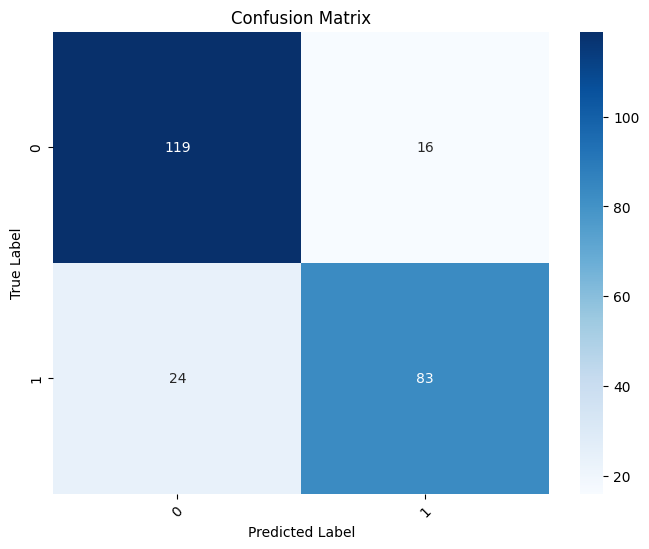

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8524590163934426
Precision: 0.8565927077444884
Recall (TPR): 0.8524590163934426
False Positive Rate (FPR): 0.14547413793103448
F1 score (F-measure): 0.8524590163934426
Specificity: 0.8545258620689655
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.852459,0.812500,0.896552,0.187500,0.852459,26,6,26,3
1,1,0.852459,0.896552,0.812500,0.103448,0.852459,26,3,26,6


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


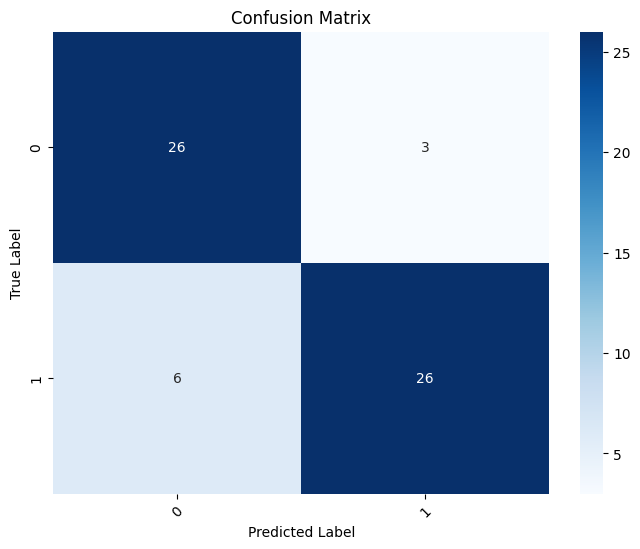

In [ ]:
print("Gaussian Naive Bayes performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = GaussianNB()
gb_result_1 = runclassifier(model,X_train_old_df, y_train_old_df, X_test_old_df, y_test_old_df)

Logistic Regression

Logistic Regression performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8305785123966942
Precision: 0.8323778983837011
Recall (TPR): 0.8305785123966942
False Positive Rate (FPR): 0.1780200761509173
F1 score (F-measure): 0.8289910143235869
Specificity: 0.8219799238490827
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.830579,0.817568,0.896296,0.252336,0.855124,121,27,80,14
1,1,0.830579,0.851064,0.747664,0.103704,0.796020,80,14,121,27


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


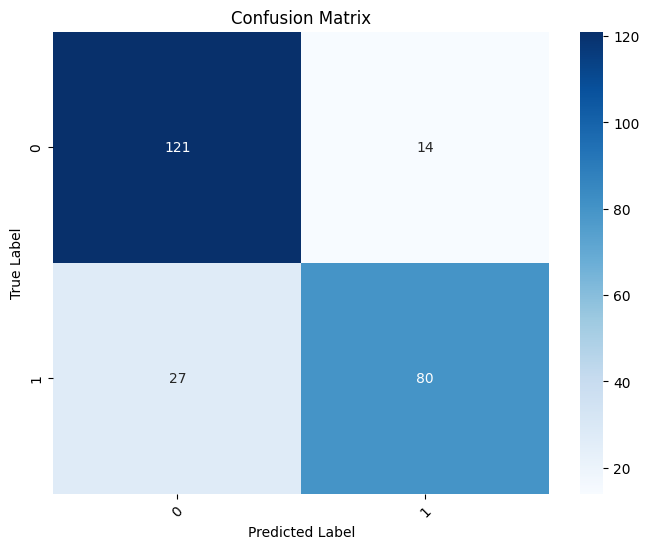

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9016393442622951
Precision: 0.9016393442622951
Recall (TPR): 0.9016393442622951
False Positive Rate (FPR): 0.09859913793103448
F1 score (F-measure): 0.9016393442622951
Specificity: 0.9014008620689655
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.901639,0.896552,0.896552,0.093750,0.896552,26,3,29,3
1,1,0.901639,0.906250,0.906250,0.103448,0.906250,29,3,26,3


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


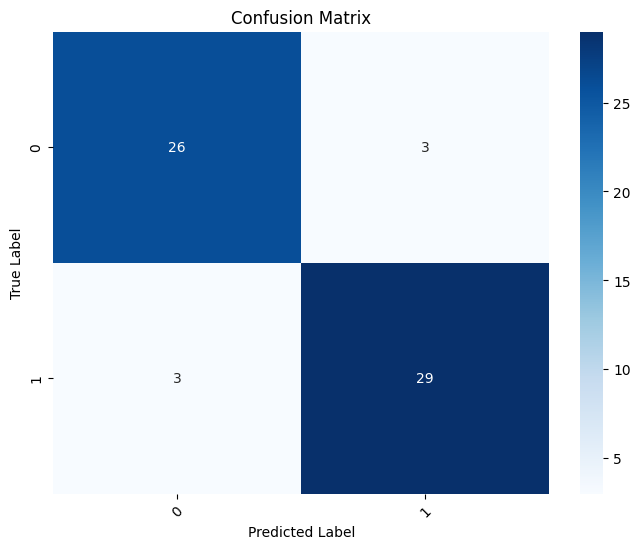

In [ ]:
print("Logistic Regression performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = LogisticRegression()
lr_result_1 = runclassifier(model,X_train_old_df, y_train_old_df, X_test_old_df, y_test_old_df)

Support Vector Machine

Support Vector Machine performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8264462809917356
Precision: 0.8296988983322516
Recall (TPR): 0.8264462809917356
False Positive Rate (FPR): 0.1836621668397369
F1 score (F-measure): 0.8242886589994028
Specificity: 0.8163378331602631
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.826446,0.807947,0.903704,0.271028,0.853147,122,29,78,13
1,1,0.826446,0.857143,0.728972,0.096296,0.787879,78,13,122,29


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


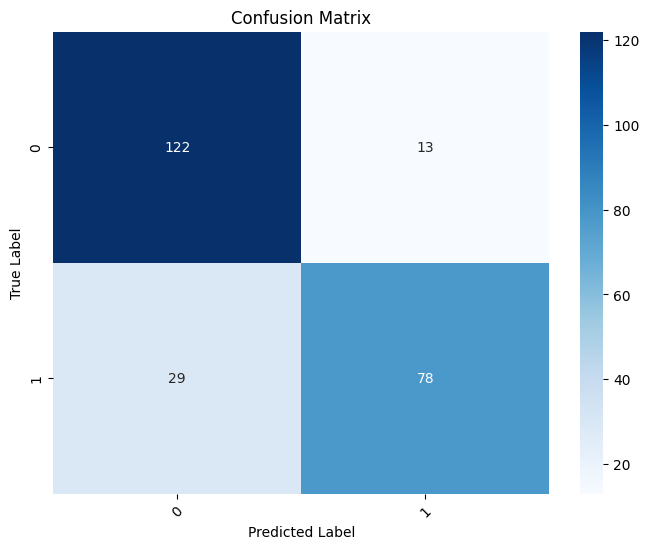

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8688524590163934
Precision: 0.8688524590163934
Recall (TPR): 0.8688524590163934
False Positive Rate (FPR): 0.13146551724137934
F1 score (F-measure): 0.8688524590163934
Specificity: 0.8685344827586207
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.868852,0.862069,0.862069,0.125000,0.862069,25,4,28,4
1,1,0.868852,0.875000,0.875000,0.137931,0.875000,28,4,25,4


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


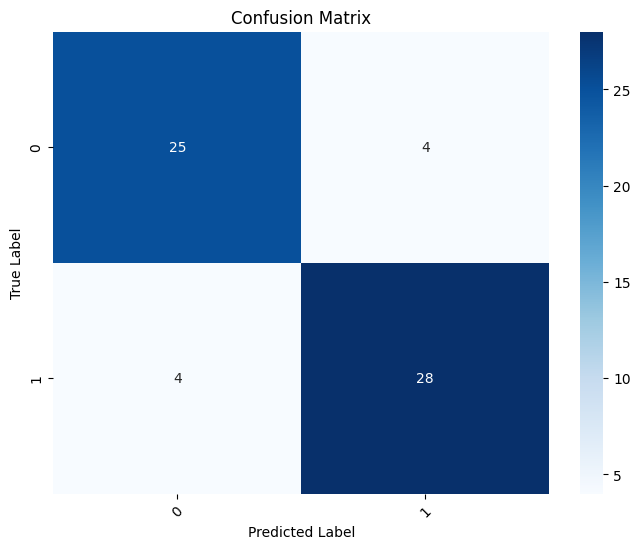

In [ ]:
print("Support Vector Machine performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = SVC(probability=True)
svc_result_1 = runclassifier(model,X_train_old_df, y_train_old_df, X_test_old_df, y_test_old_df)

RandomForest

RandomForest Machine performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.7975206611570248
Precision: 0.7978644241292123
Recall (TPR): 0.7975206611570248
False Positive Rate (FPR): 0.2105572862582208
F1 score (F-measure): 0.795997886471899
Specificity: 0.7894427137417792
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.797521,0.794521,0.859259,0.280374,0.825623,116,30,77,19
1,1,0.797521,0.802083,0.719626,0.140741,0.758621,77,19,116,30


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


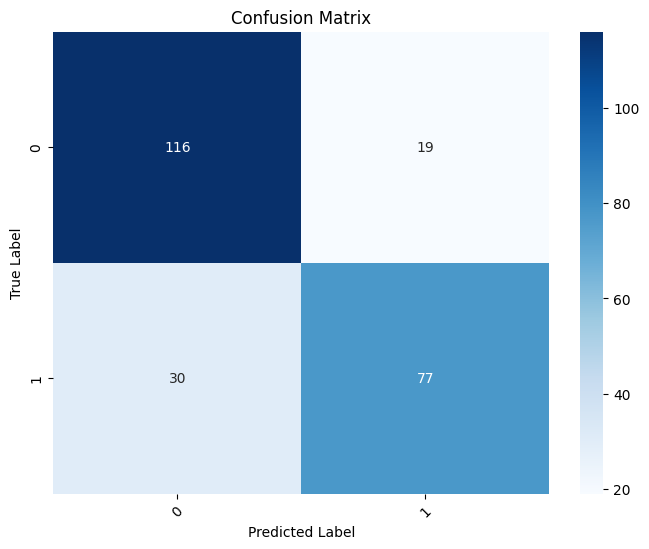

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8852459016393442
Precision: 0.8895385811192763
Recall (TPR): 0.8852459016393442
False Positive Rate (FPR): 0.11260775862068972
F1 score (F-measure): 0.8852459016393444
Specificity: 0.8873922413793103
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.885246,0.843750,0.931034,0.156250,0.885246,27,5,27,2
1,1,0.885246,0.931034,0.843750,0.068966,0.885246,27,2,27,5


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


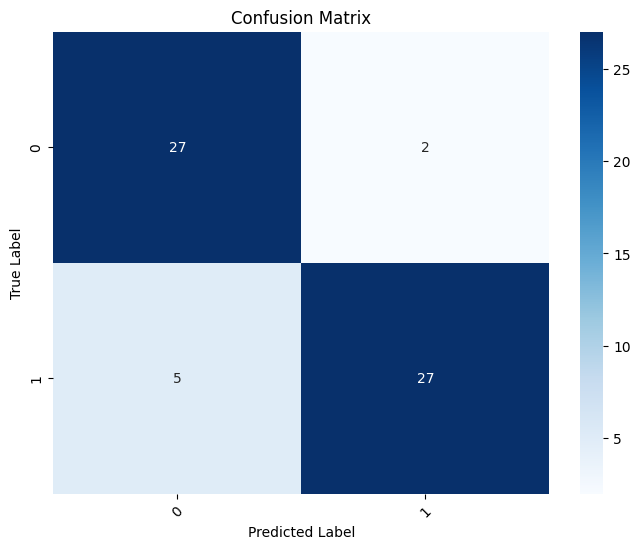

In [ ]:
print("RandomForest Machine performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = RandomForestClassifier()
rf_result_1 = runclassifier(model,X_train_old_df, y_train_old_df, X_test_old_df, y_test_old_df)

DecisionTree

Decision Tree performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.7148760330578512
Precision: 0.7158339594290009
Recall (TPR): 0.7148760330578512
False Positive Rate (FPR): 0.2875389408099689
F1 score (F-measure): 0.7152451160161463
Specificity: 0.7124610591900311
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.714876,0.750000,0.733333,0.308411,0.741573,99,33,74,36
1,1,0.714876,0.672727,0.691589,0.266667,0.682028,74,36,99,33


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


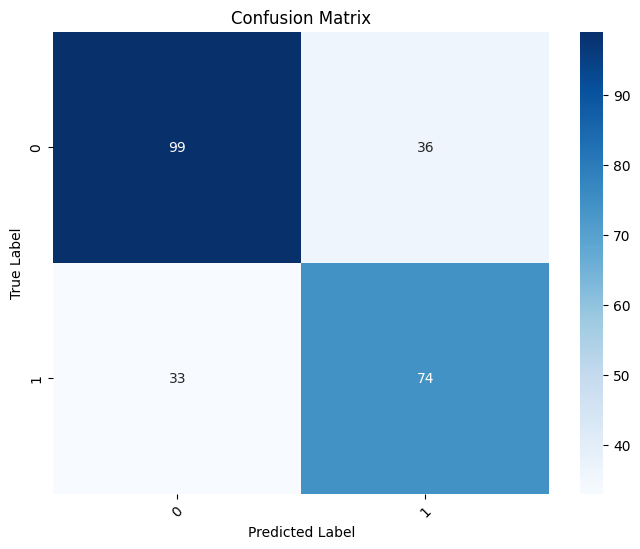

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.7213114754098361
Precision: 0.7296153434051217
Recall (TPR): 0.7213114754098361
False Positive Rate (FPR): 0.27532327586206895
F1 score (F-measure): 0.7205617080582348
Specificity: 0.724676724137931
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.721311,0.676471,0.793103,0.343750,0.730159,23,11,21,6
1,1,0.721311,0.777778,0.656250,0.206897,0.711864,21,6,23,11


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


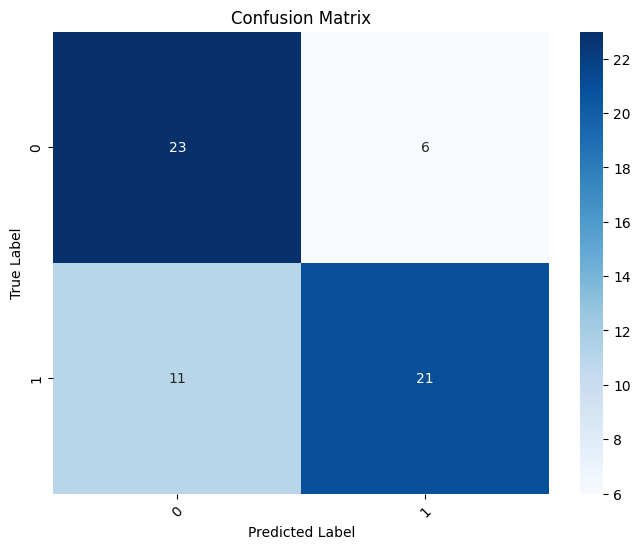

In [ ]:
print("Decision Tree performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = DecisionTreeClassifier()
dt_result_1 = runclassifier(model,X_train_old_df, y_train_old_df, X_test_old_df, y_test_old_df)

ExtraTree

Extra Tree performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.7107438016528925
Precision: 0.7098479124106636
Recall (TPR): 0.7107438016528925
False Positive Rate (FPR): 0.29511941848390455
F1 score (F-measure): 0.7101003398282761
Specificity: 0.7048805815160955
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.710744,0.733813,0.755556,0.345794,0.744526,102,37,70,33
1,1,0.710744,0.679612,0.654206,0.244444,0.666667,70,33,102,37


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


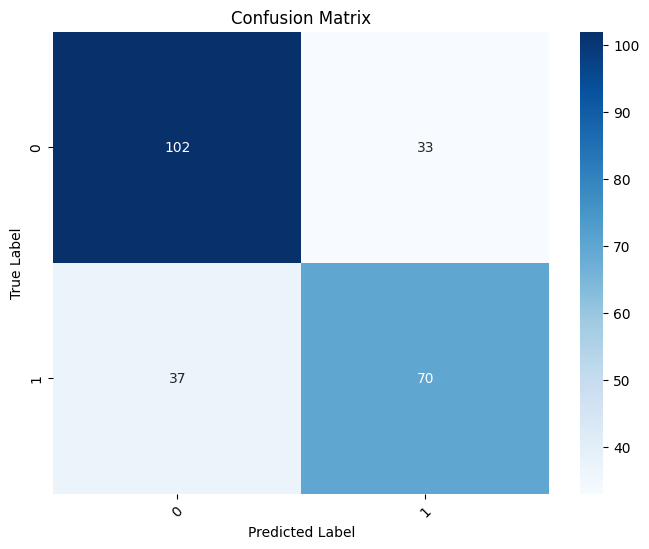

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.819672131147541
Precision: 0.8236468343697003
Recall (TPR): 0.819672131147541
False Positive Rate (FPR): 0.17834051724137934
F1 score (F-measure): 0.8196721311475409
Specificity: 0.8216594827586207
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.819672,0.781250,0.862069,0.218750,0.819672,25,7,25,4
1,1,0.819672,0.862069,0.781250,0.137931,0.819672,25,4,25,7


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


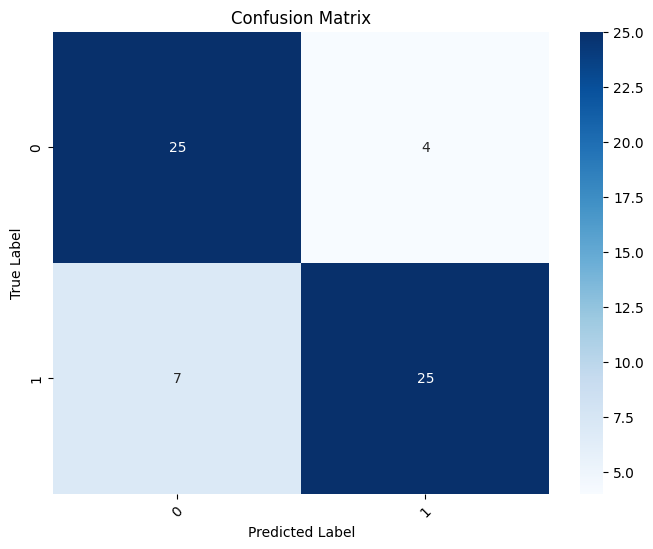

In [ ]:
print("Extra Tree performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = ExtraTreeClassifier()
et_result_1 = runclassifier(model,X_train_old_df, y_train_old_df, X_test_old_df, y_test_old_df)

AdaBoost

AdaBoost performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.7933884297520661
Precision: 0.7930678478787303
Recall (TPR): 0.7933884297520661
False Positive Rate (FPR): 0.21038421599169266
F1 score (F-measure): 0.7931734482347437
Specificity: 0.7896157840083073
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.793388,0.810219,0.822222,0.242991,0.816176,111,26,81,24
1,1,0.793388,0.771429,0.757009,0.177778,0.764151,81,24,111,26


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


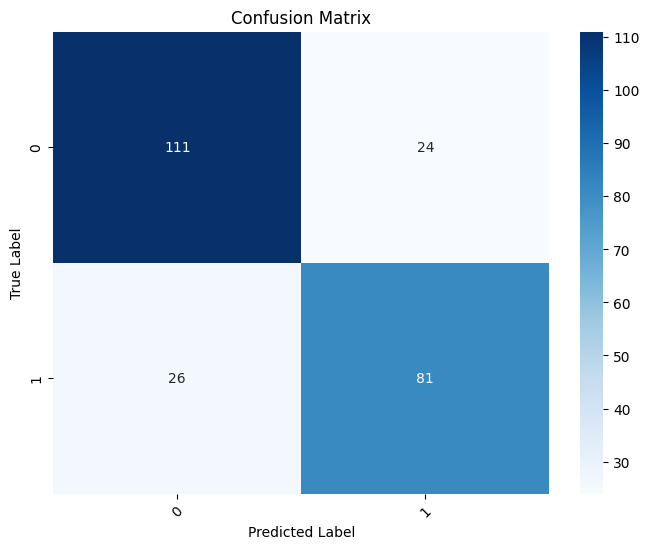

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8360655737704918
Precision: 0.8429494003264495
Recall (TPR): 0.8360655737704918
False Positive Rate (FPR): 0.16109913793103448
F1 score (F-measure): 0.835889300193901
Specificity: 0.8389008620689655
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.836066,0.787879,0.896552,0.218750,0.838710,26,7,25,3
1,1,0.836066,0.892857,0.781250,0.103448,0.833333,25,3,26,7


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


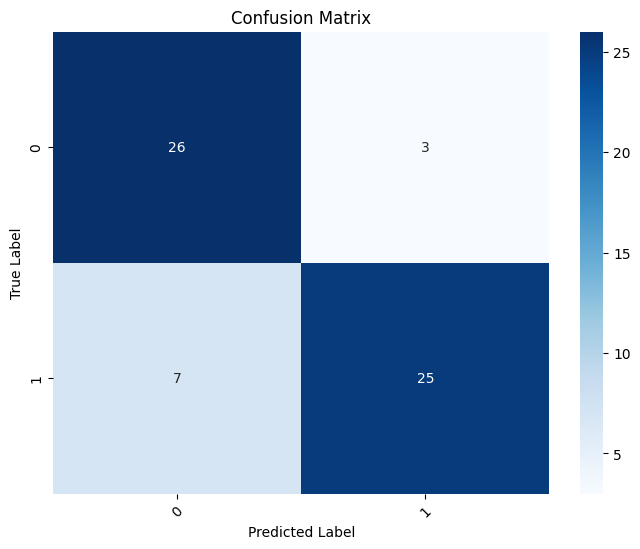

In [ ]:
print("AdaBoost performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = AdaBoostClassifier()
adb_result_1 = runclassifier(model,X_train_old_df, y_train_old_df, X_test_old_df, y_test_old_df)

XGBoost

XGBoost performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.7933884297520661
Precision: 0.7934178092856954
Recall (TPR): 0.7933884297520661
False Positive Rate (FPR): 0.21426098996192455
F1 score (F-measure): 0.7920139130032178
Specificity: 0.7857390100380754
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.793388,0.793103,0.851852,0.280374,0.821429,115,30,77,20
1,1,0.793388,0.793814,0.719626,0.148148,0.754902,77,20,115,30


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


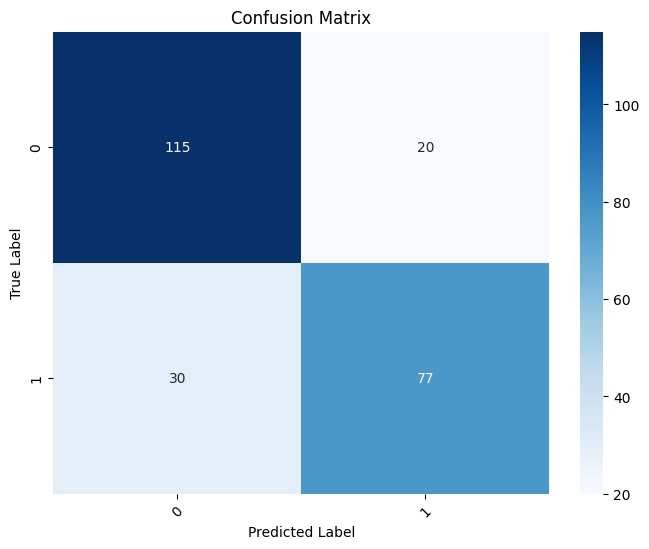

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8524590163934426
Precision: 0.8530759739115107
Recall (TPR): 0.8524590163934426
False Positive Rate (FPR): 0.14709051724137934
F1 score (F-measure): 0.8525384035247887
Specificity: 0.8529094827586207
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.852459,0.833333,0.862069,0.156250,0.847458,25,5,27,4
1,1,0.852459,0.870968,0.843750,0.137931,0.857143,27,4,25,5


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


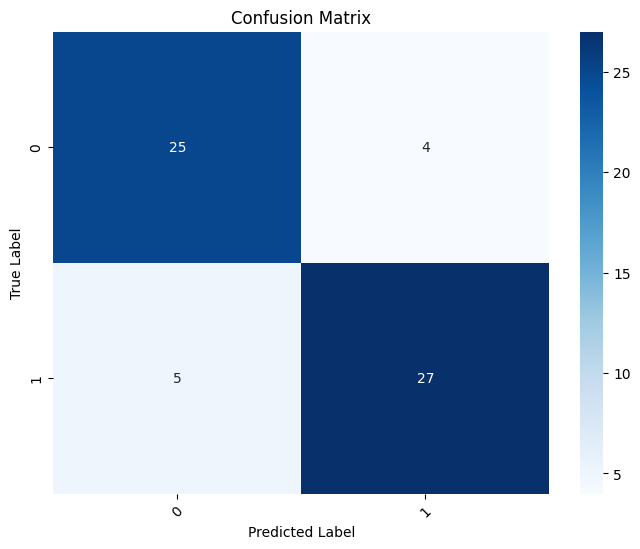

In [ ]:
print("XGBoost performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = XGBClassifier()
xgb_result_1 = runclassifier(model,X_train_old_df, y_train_old_df, X_test_old_df, y_test_old_df)

GradientBoosting

Gradient Boosting performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.7727272727272727
Precision: 0.7720906544435956
Recall (TPR): 0.7727272727272727
False Positive Rate (FPR): 0.23277950848044315
F1 score (F-measure): 0.772074815137016
Specificity: 0.7672204915195568
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.772727,0.785714,0.814815,0.280374,0.800000,110,30,77,25
1,1,0.772727,0.754902,0.719626,0.185185,0.736842,77,25,110,30


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


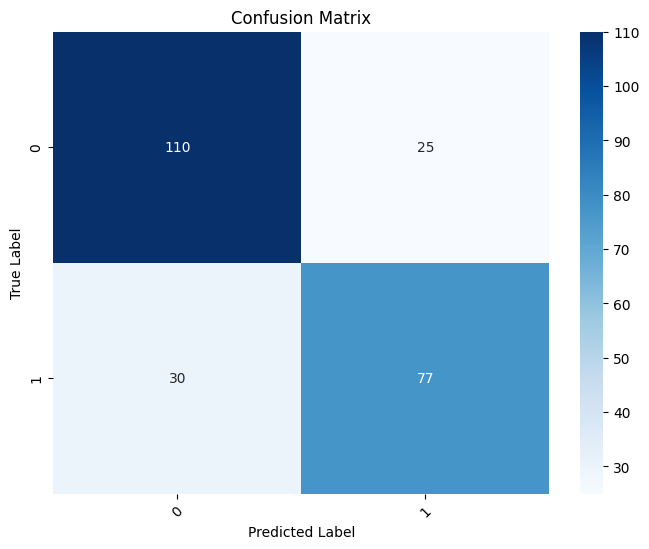

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8688524590163934
Precision: 0.8708619777895293
Recall (TPR): 0.8688524590163934
False Positive Rate (FPR): 0.12984913793103448
F1 score (F-measure): 0.8689229684470298
Specificity: 0.8701508620689655
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.868852,0.83871,0.896552,0.156250,0.866667,26,5,27,3
1,1,0.868852,0.90000,0.843750,0.103448,0.870968,27,3,26,5


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


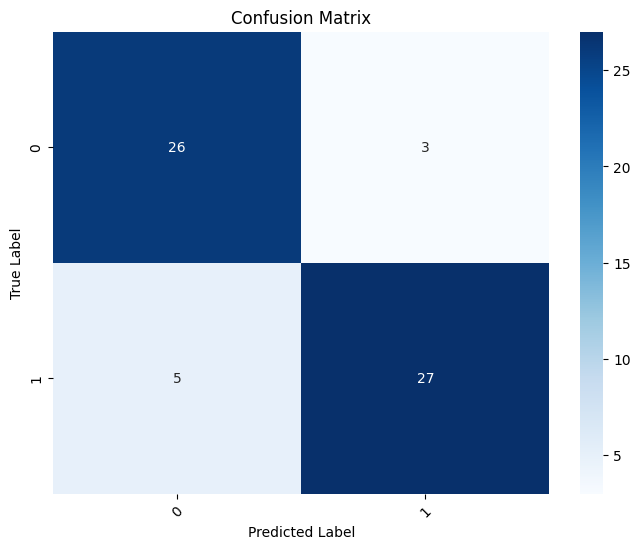

In [ ]:
print("Gradient Boosting performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = GradientBoostingClassifier()
gradboost_result_1 = runclassifier(model,X_train_old_df, y_train_old_df, X_test_old_df, y_test_old_df)

Synthetic Dataset

In [ ]:
# Extract features and labels
X_new = df.drop('target', axis=1).values
y_new = df['target'].values

# Split the data into training and testing sets
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y_new, test_size=0.2, random_state=42)
X_train_new_shuffled, y_train_new_shuffled = shuffle(X_train_new, y_train_new, random_state=42)

In [ ]:
X_train_new_df = pd.DataFrame(X_train_new_shuffled)
y_train_new_df = pd.DataFrame(y_train_new_shuffled)
X_test_new_df = pd.DataFrame(X_test_new)
y_test_new_df = pd.DataFrame(y_test_new)

In [ ]:
y_train_new_df.columns = ['target']
y_test_new_df.columns = ['target']

Gaussian Naive Bayes

Gaussian Naive Bayes performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.837575
Precision: 0.8376586284590816
Recall (TPR): 0.837575
False Positive Rate (FPR): 0.16777101072599265
F1 score (F-measure): 0.8376153145376504
Specificity: 0.8322289892740073
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.837575,0.863457,0.861522,0.197064,0.862489,20375,3222,13128,3275
1,1,0.837575,0.800341,0.802936,0.138478,0.801636,13128,3275,20375,3222


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


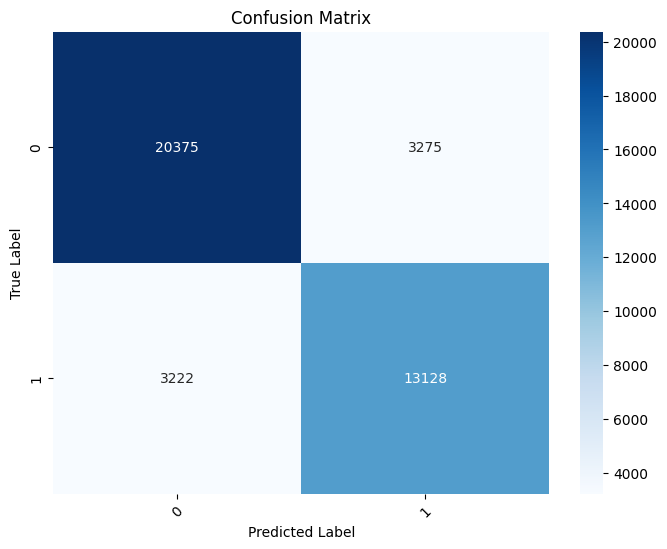

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8379
Precision: 0.8377944111434364
Recall (TPR): 0.8379
False Positive Rate (FPR): 0.16860193660137734
F1 score (F-measure): 0.8378447264130464
Specificity: 0.8313980633986227
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8379,0.862906,0.865368,0.202572,0.864135,5155,819,3224,802
1,1,0.8379,0.800795,0.797428,0.134632,0.799108,3224,802,5155,819


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


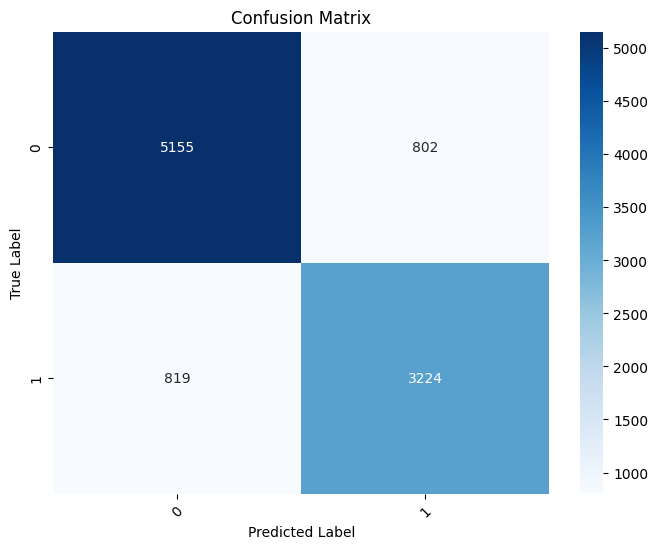

In [ ]:
print("Gaussian Naive Bayes performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = GaussianNB()
gb_result_2 = runclassifier(model,X_train_new_df, y_train_new_df, X_test_new_df, y_test_new_df)

Logistic Regression

Logistic Regression performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8393
Precision: 0.8387246803266954
Recall (TPR): 0.8393
False Positive Rate (FPR): 0.17187203806789897
F1 score (F-measure): 0.8382332781685647
Specificity: 0.828127961932101
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8393,0.846603,0.889345,0.233089,0.867448,21033,3811,12539,2617
1,1,0.8393,0.827329,0.766911,0.110655,0.795975,12539,2617,21033,3811


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


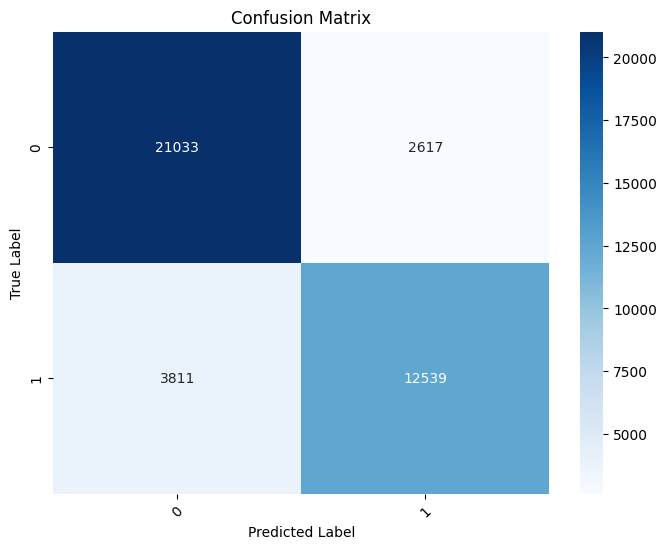

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8382
Precision: 0.8375887806914014
Recall (TPR): 0.8382
False Positive Rate (FPR): 0.17450916164742525
F1 score (F-measure): 0.8369383055623837
Specificity: 0.8254908383525748
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8382,0.845077,0.891892,0.240910,0.867854,5313,974,3069,644
1,1,0.8382,0.826555,0.759090,0.108108,0.791387,3069,644,5313,974


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


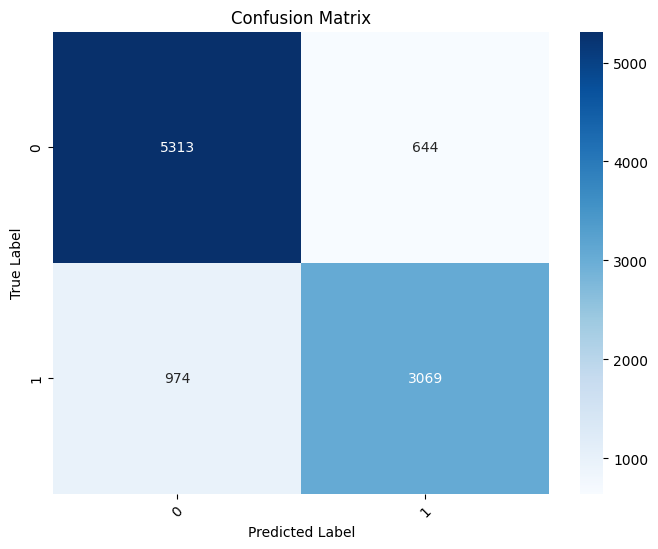

In [ ]:
print("Logistic Regression performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = LogisticRegression()
lr_result_2 = runclassifier(model,X_train_new_df, y_train_new_df, X_test_new_df, y_test_new_df)

Support Vector Machine

Support Vector Machine performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9285
Precision: 0.9283976556731904
Recall (TPR): 0.9285
False Positive Rate (FPR): 0.07554926262841777
F1 score (F-measure): 0.9283810090971352
Specificity: 0.9244507373715822
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9285,0.933378,0.946638,0.097737,0.939961,22388,1598,14752,1262
1,1,0.9285,0.921194,0.902263,0.053362,0.911630,14752,1262,22388,1598


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


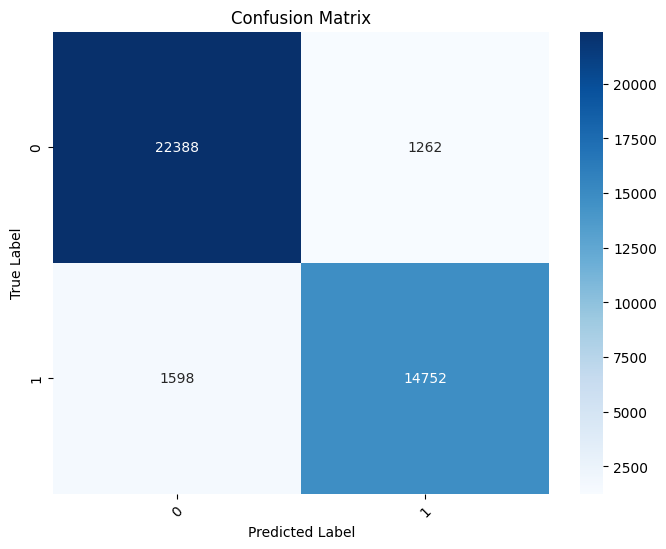

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9279
Precision: 0.9277895902275181
Recall (TPR): 0.9279
False Positive Rate (FPR): 0.07680866558260657
F1 score (F-measure): 0.9277502457788752
Specificity: 0.9231913344173934
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9279,0.932299,0.947793,0.101410,0.939982,5646,410,3633,311
1,1,0.9279,0.921146,0.898590,0.052207,0.909728,3633,311,5646,410


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


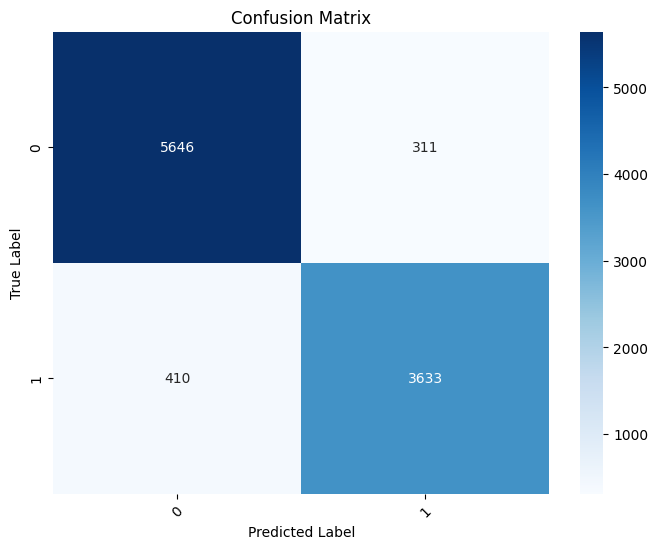

In [ ]:
print("Support Vector Machine performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = SVC(probability=True)
svc_result_2 = runclassifier(model,X_train_new_df, y_train_new_df, X_test_new_df, y_test_new_df)

RandomForest

RandomForest Machine performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.991075
Precision: 0.9910752336977228
Recall (TPR): 0.991075
False Positive Rate (FPR): 0.009558158930891958
F1 score (F-measure): 0.9910720640999098
Specificity: 0.990441841069108
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.991075,0.991020,0.993911,0.013028,0.992463,23506,213,16137,144
1,1,0.991075,0.991155,0.986972,0.006089,0.989059,16137,144,23506,213


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


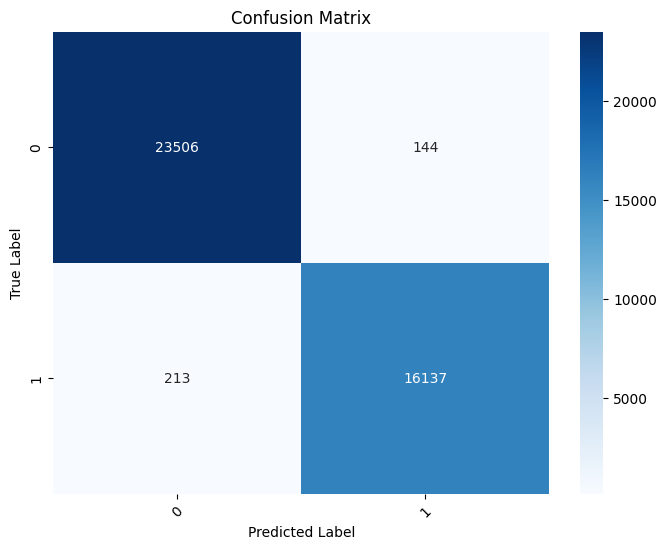

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9921
Precision: 0.9921024226822734
Recall (TPR): 0.9921
False Positive Rate (FPR): 0.008617638213611944
F1 score (F-measure): 0.9920966649637385
Specificity: 0.9913823617863881
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9921,0.991636,0.995132,0.012367,0.993381,5928,50,3993,29
1,1,0.9921,0.992790,0.987633,0.004868,0.990205,3993,29,5928,50


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


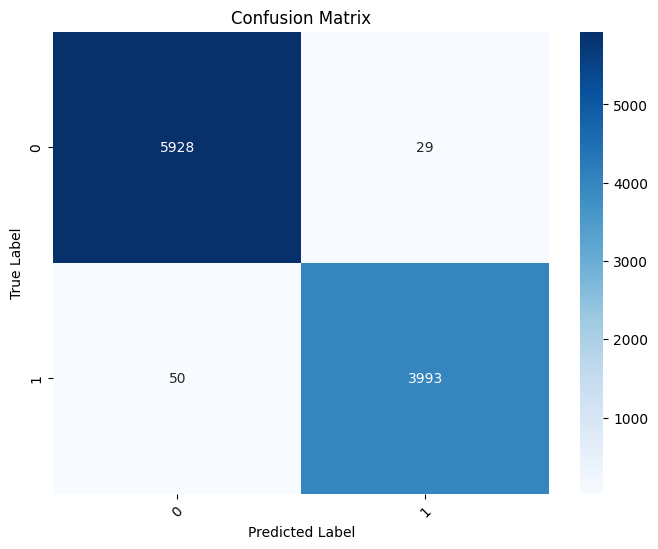

In [ ]:
print("RandomForest Machine performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = RandomForestClassifier()
rf_result_2 = runclassifier(model,X_train_new_df, y_train_new_df, X_test_new_df, y_test_new_df)

DecisionTree

Decision Tree performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.986325
Precision: 0.9863228430318821
Recall (TPR): 0.986325
False Positive Rate (FPR): 0.014245268990308535
F1 score (F-measure): 0.986323640452566
Specificity: 0.9857547310096915
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.986325,0.988002,0.988879,0.017370,0.988441,23387,284,16066,263
1,1,0.986325,0.983894,0.982630,0.011121,0.983261,16066,263,23387,284


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


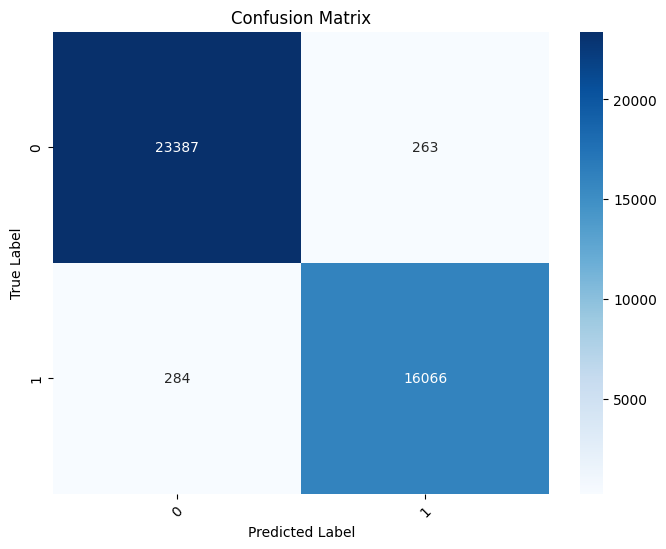

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9871
Precision: 0.9870986439298293
Recall (TPR): 0.9871
False Positive Rate (FPR): 0.013450152342924682
F1 score (F-measure): 0.9870992298176537
Specificity: 0.9865498476570753
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9871,0.988926,0.989424,0.016325,0.989175,5894,66,3977,63
1,1,0.9871,0.984406,0.983675,0.010576,0.984041,3977,63,5894,66


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


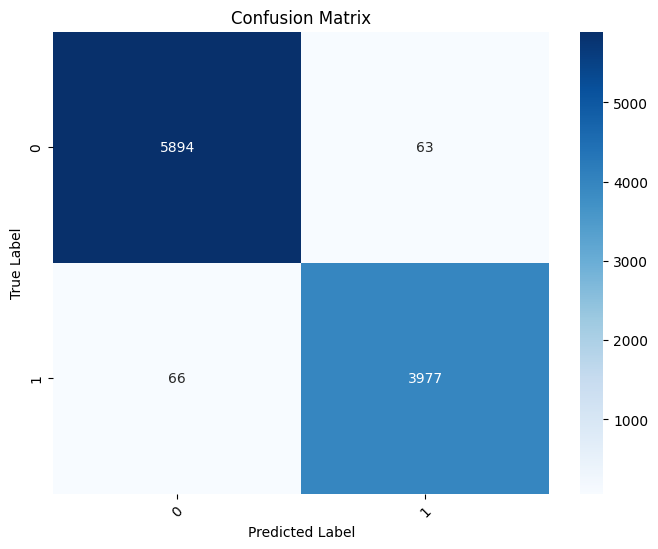

In [ ]:
print("Decision Tree performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = DecisionTreeClassifier()
dt_result_2 = runclassifier(model,X_train_new_df, y_train_new_df, X_test_new_df, y_test_new_df)

ExtraTree

Extra Tree performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9837
Precision: 0.9836980906044069
Recall (TPR): 0.9837
False Positive Rate (FPR): 0.01692767228504377
F1 score (F-measure): 0.9836989207572148
Specificity: 0.9830723277149562
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9837,0.985928,0.986512,0.020367,0.986220,23331,333,16017,319
1,1,0.9837,0.980473,0.979633,0.013488,0.980053,16017,319,23331,333


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


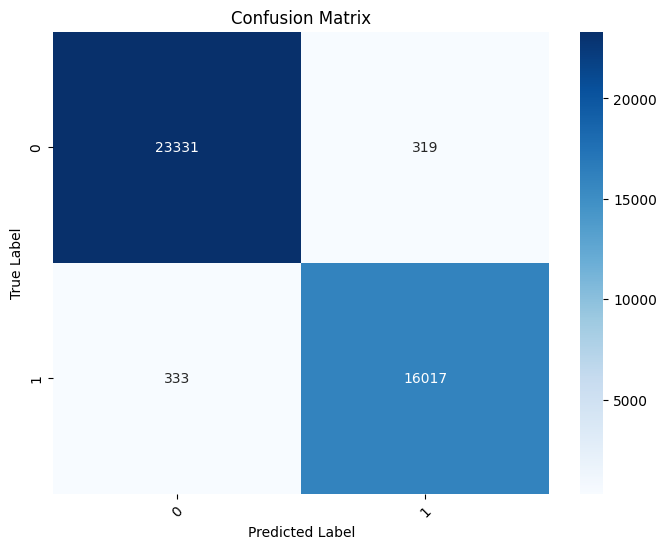

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9835
Precision: 0.983494782143817
Recall (TPR): 0.9835
False Positive Rate (FPR): 0.017504935091961604
F1 score (F-measure): 0.983493704826536
Specificity: 0.9824950649080384
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9835,0.984605,0.987746,0.022755,0.986173,5884,92,3951,73
1,1,0.9835,0.981859,0.977245,0.012254,0.979546,3951,73,5884,92


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


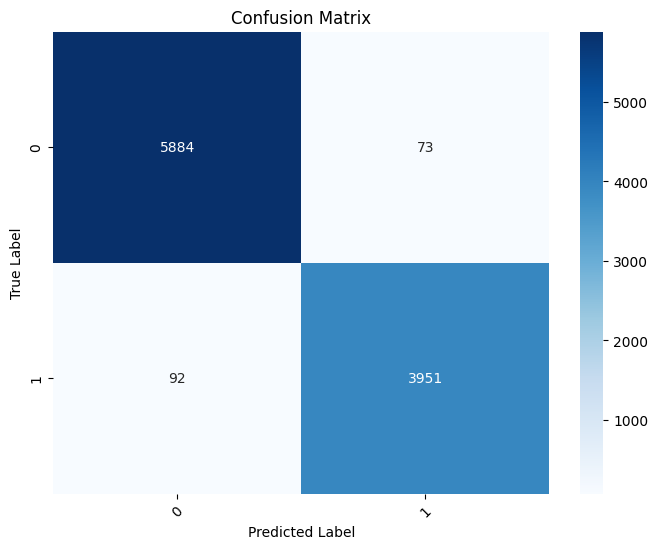

In [ ]:
print("Extra Tree performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = ExtraTreeClassifier()
et_result_2 = runclassifier(model,X_train_new_df, y_train_new_df, X_test_new_df, y_test_new_df)

AdaBoost

AdaBoost performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.87895
Precision: 0.8786295251072377
Recall (TPR): 0.87895
False Positive Rate (FPR): 0.1285999314674373
F1 score (F-measure): 0.8784976060693626
Specificity: 0.8714000685325627
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.87895,0.885948,0.912770,0.169969,0.899159,21587,2779,13571,2063
1,1,0.87895,0.868044,0.830031,0.087230,0.848612,13571,2063,21587,2779


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


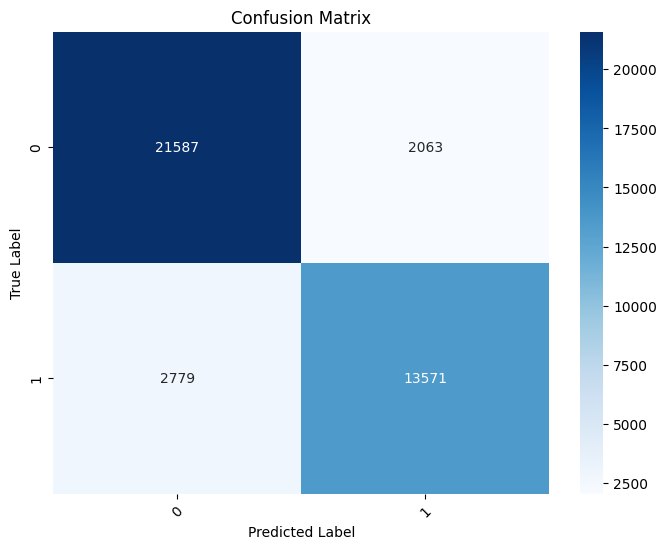

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8745
Precision: 0.8742648261458554
Recall (TPR): 0.8745
False Positive Rate (FPR): 0.1355373706135624
F1 score (F-measure): 0.8737391957786401
Specificity: 0.8644626293864376
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8745,0.877853,0.916904,0.187979,0.896954,5462,760,3283,495
1,1,0.8745,0.868978,0.812021,0.083096,0.839535,3283,495,5462,760


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


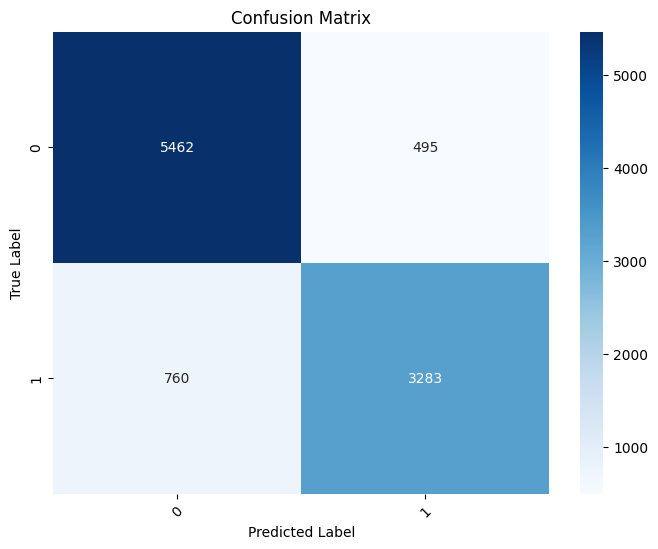

In [ ]:
print("AdaBoost performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = AdaBoostClassifier()
adb_result_2 = runclassifier(model,X_train_new_df, y_train_new_df, X_test_new_df, y_test_new_df)

XGBoost

XGBoost performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.992875
Precision: 0.9928750159327454
Recall (TPR): 0.992875
False Positive Rate (FPR): 0.007620627008295022
F1 score (F-measure): 0.9928732038834007
Specificity: 0.992379372991705
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.992875,0.992870,0.995095,0.010336,0.993981,23534,169,16181,116
1,1,0.992875,0.992882,0.989664,0.004905,0.991270,16181,116,23534,169


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


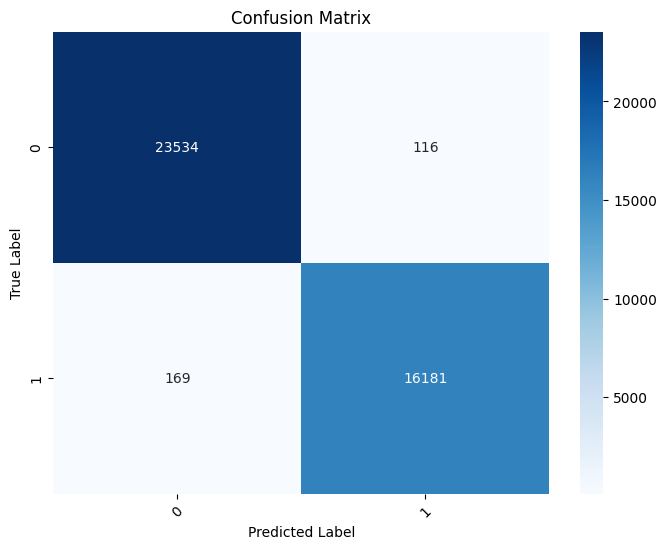

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9942
Precision: 0.994201567587211
Recall (TPR): 0.9942
False Positive Rate (FPR): 0.006338442239462783
F1 score (F-measure): 0.9941981396643578
Specificity: 0.9936615577605372
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9942,0.993805,0.996475,0.009152,0.995138,5936,37,4006,21
1,1,0.9942,0.994785,0.990848,0.003525,0.992813,4006,21,5936,37


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


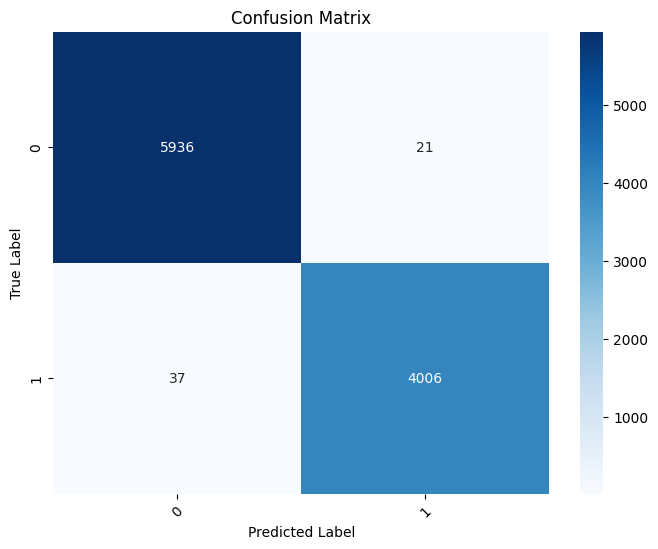

In [ ]:
print("XGBoost performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = XGBClassifier()
xgb_result_2 = runclassifier(model,X_train_new_df, y_train_new_df, X_test_new_df, y_test_new_df)

GradientBoosting

Gradient Boosting performance for Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9507
Precision: 0.9509099453787059
Recall (TPR): 0.9507
False Positive Rate (FPR): 0.05414188826606159
F1 score (F-measure): 0.9505297775738428
Specificity: 0.9458581117339384
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9507,0.945756,0.972389,0.080673,0.958888,22997,1319,15031,653
1,1,0.9507,0.958365,0.919327,0.027611,0.938440,15031,653,22997,1319


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


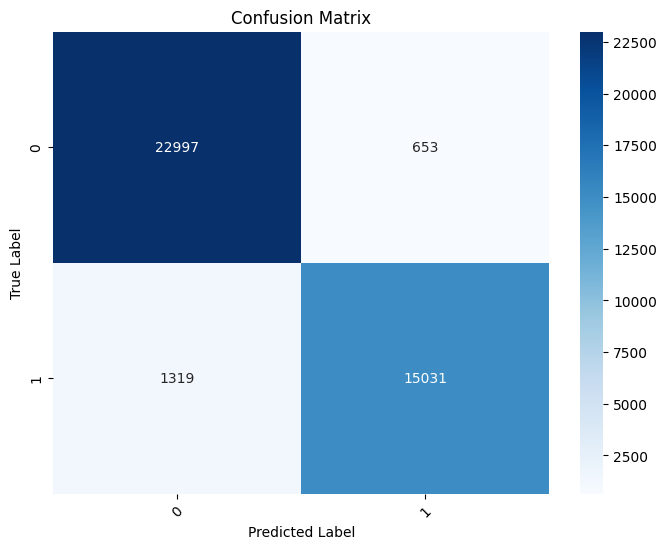

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9537
Precision: 0.9539686701854816
Recall (TPR): 0.9537
False Positive Rate (FPR): 0.051577259252360674
F1 score (F-measure): 0.9535208055752119
Specificity: 0.9484227407476393
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9537,0.947832,0.975995,0.079149,0.961707,5814,320,3723,143
1,1,0.9537,0.963011,0.920851,0.024005,0.941459,3723,143,5814,320


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


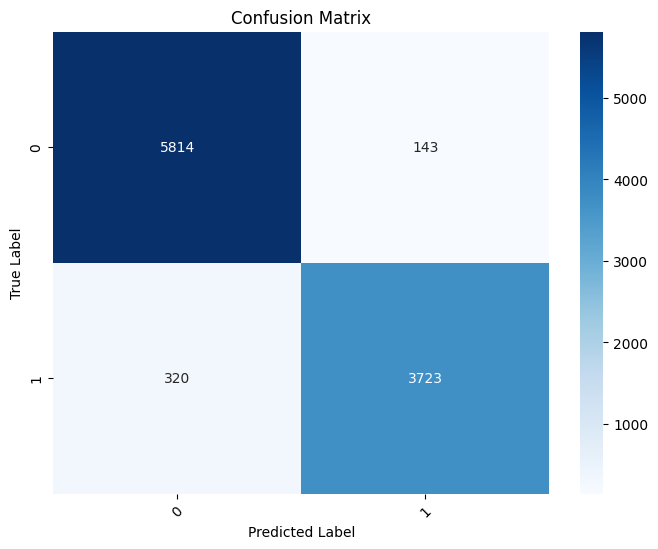

In [ ]:
print("Gradient Boosting performance for Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = GradientBoostingClassifier()
gradboost_result_2 = runclassifier(model,X_train_new_df, y_train_new_df, X_test_new_df, y_test_new_df)

### Model Plotting and Evaluation

In [ ]:
def extract_evaluation_metrics(d, metric_type):

    metrics = d[metric_type]
    # Check if TP, FP, TN, FN values are lists, and sum them to get scalar values
    TP = sum(metrics['TP']) if isinstance(metrics['TP'], (list, np.ndarray)) else metrics['TP']
    FP = sum(metrics['FP']) if isinstance(metrics['FP'], (list, np.ndarray)) else metrics['FP']
    TN = sum(metrics['TN']) if isinstance(metrics['TN'], (list, np.ndarray)) else metrics['TN']
    FN = sum(metrics['FN']) if isinstance(metrics['FN'], (list, np.ndarray)) else metrics['FN']

    return [ # Return all the metrics stored in the result dictionary
        d['Model'],
        metrics['Accuracy'],
        metrics['Precision'],
        metrics['Recall'],
        metrics['F1 score'],
        TP,
        FP,
        TN,
        FN,
        metrics['Sensitivity (TPR)'],
        metrics['Specificity'],
        metrics['FPR']
    ]

In [ ]:
# defining dataframe to store the results for training metrics for each classifier
training_results = pd.DataFrame({
    'Model': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1 score': [],
    'True Positive': [],
    'False Positive': [],
    'True Negative': [],
    'False Negative': [],
    'Sensitivity (TPR)': [],
    'Specificity': [],
    'False Positive Rate':[],
    'Dataset': [], # define a new variable to specify which dataset does the result belong to

})
# defining dataframe to store the results for testing metrics for each classifier
testing_results = pd.DataFrame({
    'Model': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1 score': [],
    'True Positive': [],
    'False Positive': [],
    'True Negative': [],
    'False Negative': [],
    'Sensitivity (TPR)': [],
    'Specificity': [],
    'False Positive Rate':[],
    'Dataset': [], # define a new variable to specify which dataset does the result belong to
})

In [ ]:
# Store the results dictionary of each classifier, along with their dataset into a new variable
datasets = [
    (gb_result_1,"Original Dataset"),
    (lr_result_1,"Original Dataset"),
    (svc_result_1,"Original Dataset"),
    (rf_result_1,"Original Dataset"),
    (dt_result_1,"Original Dataset"),
    (et_result_1,"Original Dataset"),
    (xgb_result_1,"Original Dataset"),
    (adb_result_1,"Original Dataset"),
    (gradboost_result_1,"Original Dataset"),
    (gb_result_2,"Synthetic Dataset"),
    (lr_result_2,"Synthetic Dataset"),
    (svc_result_2,"Synthetic Dataset"),
    (rf_result_2,"Synthetic Dataset"),
    (dt_result_2,"Synthetic Dataset"),
    (et_result_2,"Synthetic Dataset"),
    (xgb_result_2,"Synthetic Dataset"),
    (adb_result_2,"Synthetic Dataset"),
    (gradboost_result_2,"Synthetic Dataset"),
]

In [ ]:
for d, data_val in datasets:
    training_results.loc[len(training_results.index)] = extract_evaluation_metrics(d, "Training Metrics")+ [data_val]
    testing_results.loc[len(testing_results.index)] = extract_evaluation_metrics(d, "Test Metrics")+ [data_val]

In [ ]:
training_results

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset
0,GaussianNB,0.834711,0.834916,0.834711,0.833880,202,40,202,40,0.834711,0.828591,0.171409,Original Dataset
1,LogisticRegression,0.830579,0.832378,0.830579,0.828991,201,41,201,41,0.830579,0.821980,0.178020,Original Dataset
2,SVC,0.826446,0.829699,0.826446,0.824289,200,42,200,42,0.826446,0.816338,0.183662,Original Dataset
3,RandomForestClassifier,0.789256,0.789438,0.789256,0.787671,191,51,191,51,0.789256,0.781066,0.218934,Original Dataset
4,DecisionTreeClassifier,0.719008,0.719008,0.719008,0.719008,174,68,174,68,0.719008,0.715196,0.284804,Original Dataset
5,ExtraTreeClassifier,0.727273,0.727273,0.727273,0.727273,176,66,176,66,0.727273,0.723572,0.276428,Original Dataset
6,XGBClassifier,0.793388,0.793418,0.793388,0.792014,192,50,192,50,0.793388,0.785739,0.214261,Original Dataset
7,AdaBoostClassifier,0.797521,0.797115,0.797521,0.797194,193,49,193,49,0.797521,0.793319,0.206681,Original Dataset
8,GradientBoostingClassifier,0.772727,0.772091,0.772727,0.772075,187,55,187,55,0.772727,0.767220,0.232780,Original Dataset
9,GaussianNB,0.837575,0.837659,0.837575,0.837615,33503,6497,33503,6497,0.837575,0.832229,0.167771,Synthetic Dataset


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [ ]:
testing_results

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset
0,GaussianNB,0.852459,0.856593,0.852459,0.852459,52,9,52,9,0.852459,0.854526,0.145474,Original Dataset
1,LogisticRegression,0.901639,0.901639,0.901639,0.901639,55,6,55,6,0.901639,0.901401,0.098599,Original Dataset
2,SVC,0.868852,0.868852,0.868852,0.868852,53,8,53,8,0.868852,0.868534,0.131466,Original Dataset
3,RandomForestClassifier,0.885246,0.889539,0.885246,0.885246,54,7,54,7,0.885246,0.887392,0.112608,Original Dataset
4,DecisionTreeClassifier,0.754098,0.754768,0.754098,0.754231,46,15,46,15,0.754098,0.754310,0.245690,Original Dataset
5,ExtraTreeClassifier,0.770492,0.770920,0.770492,0.769871,47,14,47,14,0.770492,0.768319,0.231681,Original Dataset
6,XGBClassifier,0.852459,0.853076,0.852459,0.852538,52,9,52,9,0.852459,0.852909,0.147091,Original Dataset
7,AdaBoostClassifier,0.836066,0.842949,0.836066,0.835889,51,10,51,10,0.836066,0.838901,0.161099,Original Dataset
8,GradientBoostingClassifier,0.868852,0.870862,0.868852,0.868923,53,8,53,8,0.868852,0.870151,0.129849,Original Dataset
9,GaussianNB,0.837900,0.837794,0.837900,0.837845,8379,1621,8379,1621,0.837900,0.831398,0.168602,Synthetic Dataset


In [ ]:
def define_metrics(df):
    # Combine all metrics into a single column
    df_combined = pd.melt(df, id_vars=['Model', 'Dataset'], value_vars=[
        'Accuracy', 'Precision', 'Recall', 'F1 score',
        'Sensitivity (TPR)', 'Specificity', 'False Positive Rate'
    ], var_name='Metric', value_name='Value')
    return df_combined

def plot_metrics(df, title):
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Dataset', y='Value', hue='Model', data=df, palette='viridis', ci=None)
    plt.title(title)
    plt.ylabel('Value')
    plt.xticks(rotation=45)
    plt.show()


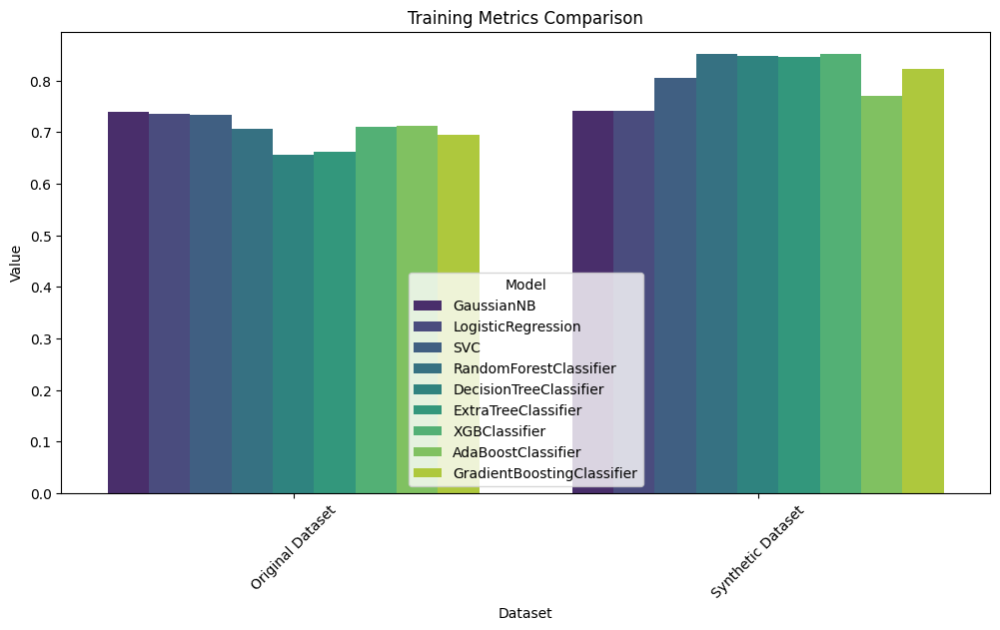

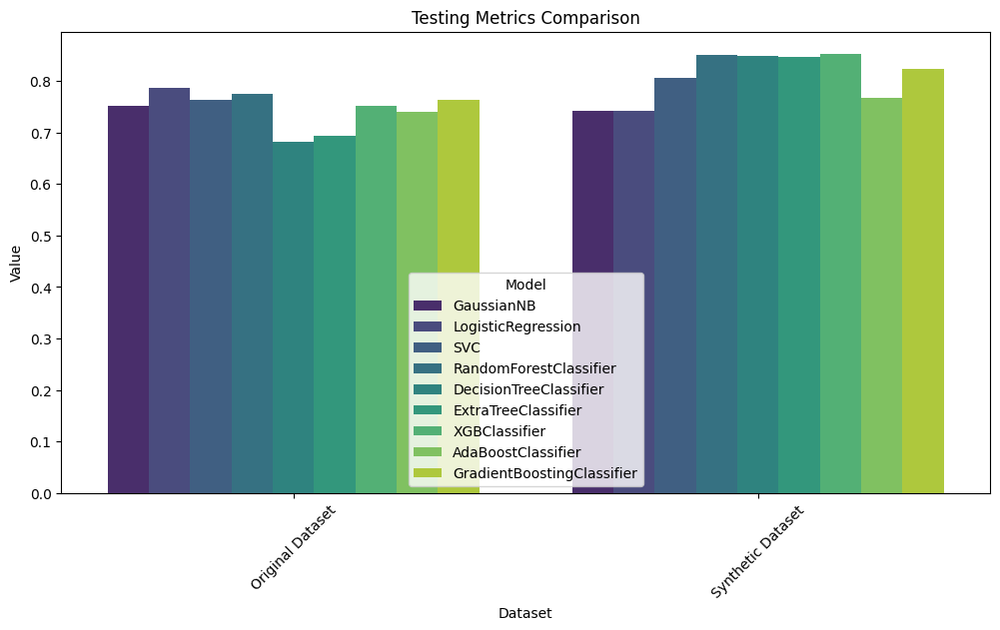

In [ ]:
# define metrics for training and testing results
training_results_combined = define_metrics(training_results)
testing_results_combined = define_metrics(testing_results)

# Plot the results
plot_metrics(training_results_combined, 'Training Metrics Comparison')
plot_metrics(testing_results_combined, 'Testing Metrics Comparison')

From the above we can see, 6 out of 9 classifiers has increased overall in performance for our synthetically generated dataset when compared to our original dataset. This could mean either the two remaining classifiers don't suit our dataset or there's work to be done on the model to enhance its performance further.

## DNN

### Feature Extraction Process

Importing Required Libraries

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

In [ ]:
pip install keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.3 MB/s eta 0:00:00


In [ ]:
import kerastuner
from kerastuner.tuners import GridSearch,RandomSearch
from kerastuner.engine.hyperparameters import HyperParameters
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import SGD, Adam
from typing import Tuple, Union

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.optimizers import SGD, Adam, RMSprop

In [ ]:
# Creating copies of our dataframes
X_train_dnn = X_train_new_df.copy()
X_test_dnn = X_test_new_df.copy()
y_train_dnn = y_train_new_df.copy()
y_test_dnn = y_test_new_df.copy()

In [ ]:
# converting categorical labels into a one-hot encoded format
y_train_keras_dnn = keras.utils.to_categorical(y_train_dnn, 2)
y_test_keras_dnn = keras.utils.to_categorical(y_test_dnn, 2)

In [ ]:
# creating a validation set
X_train_cv_dnn, X_val_cv_dnn, y_train_cv_dnn, y_val_cv_dnn = train_test_split(X_train_dnn, y_train_keras_dnn, test_size=0.2, random_state=42)

Building the neural network

In [ ]:
import random

# Set a fixed random seed
np.random.seed(42)
tf.random.set_seed(42)
random.seed(42)

def MLP_builder_Tuning(hp: HyperParameters):
    hidden_layers = hp.Int('hidden_layers', min_value=1, max_value=5)
    activation_function = hp.Choice('activation_function', values=['relu', 'sigmoid', 'tanh'])
    learning_rate = hp.Float('learning_rate', min_value=1e-4, max_value=1e-1, sampling='log')
    momentum_rate = hp.Float('momentum_rate', min_value=0.0, max_value=0.9)
    optimizer = hp.Choice('optimizer', values=['SGD', 'Adam', 'RMSprop'])
    # Use a custom initializer with a fixed seed
    initializer = tf.initializers.GlorotUniform(seed=42)

    model = Sequential()
    for _ in range(hidden_layers):
        model.add(Dense(units=hp.Int('units', min_value=32, max_value=512, step=32),
                        activation=activation_function,
                        kernel_initializer=initializer,  # Set the custom initializer
                        input_dim=X_train_dnn.shape[1]))
    model.add(Dense(2, activation='sigmoid'))
    if optimizer == 'SGD':
        model.compile(loss='binary_crossentropy', optimizer=SGD(learning_rate=learning_rate, momentum=momentum_rate), metrics=['accuracy'])
    elif optimizer == 'Adam':
        model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=learning_rate), metrics=['accuracy'])
    elif optimizer == 'RMSprop':
        model.compile(loss='binary_crossentropy', optimizer=RMSprop(learning_rate=learning_rate), metrics=['accuracy'])
    return model

# Create a GridSearch tuner
tuner = GridSearch(MLP_builder_Tuning, objective='val_accuracy', max_trials=20,  # Number of hyperparameter combinations to try
    directory='/content/drive/MyDrive/ML_Project/',  # Directory to save the tuning results
    project_name='heart_disease_dnn_grid_30',
    seed=42
)

# Perform the hyperparameter search
tuner.search(x=X_train_cv_dnn, y=y_train_cv_dnn, epochs=50, validation_data=(X_val_cv_dnn, y_val_cv_dnn))
# Get the best hyperparameters
best_hps = tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters
print("Best Hyperparameters:", best_hps.get_config()['values'])


Reloading Tuner from /content/drive/MyDrive/ML_Project/heart_disease_dnn_grid_30/tuner0.json
Best Hyperparameters: {'hidden_layers': 1, 'activation_function': 'relu', 'learning_rate': 0.0001, 'momentum_rate': 0.0, 'optimizer': 'Adam', 'units': 128}


In [ ]:
# the hyperparameter combinations tested, and the results for each trial:
tuner.results_summary()

Results summary
Results in /content/drive/MyDrive/ML_Project/heart_disease_dnn_grid_30
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 19 summary
Hyperparameters:
hidden_layers: 1
activation_function: relu
learning_rate: 0.0001
momentum_rate: 0.0
optimizer: Adam
units: 128
Score: 0.918749988079071

Trial 18 summary
Hyperparameters:
hidden_layers: 1
activation_function: relu
learning_rate: 0.0001
momentum_rate: 0.0
optimizer: Adam
units: 96
Score: 0.9178749918937683

Trial 17 summary
Hyperparameters:
hidden_layers: 1
activation_function: relu
learning_rate: 0.0001
momentum_rate: 0.0
optimizer: Adam
units: 64
Score: 0.9108750224113464

Trial 16 summary
Hyperparameters:
hidden_layers: 1
activation_function: relu
learning_rate: 0.0001
momentum_rate: 0.0
optimizer: Adam
units: 32
Score: 0.8970000147819519

Trial 06 summary
Hyperparameters:
hidden_layers: 1
activation_function: relu
learning_rate: 0.0001
momentum_rate: 0.0
optimizer: SGD
units: 224
Score: 0.8433

In [ ]:
# Model Summary
model_01 = tuner.hypermodel.build(best_hps)
model_01.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               1792      
                                                                 
 dense_1 (Dense)             (None, 2)                 258       
                                                                 
Total params: 2050 (8.01 KB)
Trainable params: 2050 (8.01 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Build the model with the optimal hyperparameters and train it on the data for 50 epochs
model_02 = tuner.hypermodel.build(best_hps)
history_02 = model_02.fit(X_train_cv_dnn, y_train_cv_dnn, epochs=50, validation_data=(X_val_cv_dnn, y_val_cv_dnn))

val_acc_per_epoch = history_02.history['val_accuracy']
best_epoch = val_acc_per_epoch.index(max(val_acc_per_epoch)) + 1
print('Best epoch: %d' % (best_epoch,))

Epoch 1/50
1000/1000 [==============================] - 11s 8ms/step - loss: 0.5748 - accuracy: 0.7828 - val_loss: 0.4650 - val_accuracy: 0.8413
Epoch 2/50
1000/1000 [==============================] - 5s 5ms/step - loss: 0.4145 - accuracy: 0.8467 - val_loss: 0.3845 - val_accuracy: 0.8501
Epoch 3/50
1000/1000 [==============================] - 6s 6ms/step - loss: 0.3738 - accuracy: 0.8515 - val_loss: 0.3631 - val_accuracy: 0.8497
Epoch 4/50
1000/1000 [==============================] - 3s 3ms/step - loss: 0.3587 - accuracy: 0.8540 - val_loss: 0.3506 - val_accuracy: 0.8554
Epoch 5/50
1000/1000 [==============================] - 3s 3ms/step - loss: 0.3478 - accuracy: 0.8562 - val_loss: 0.3408 - val_accuracy: 0.8562
Epoch 6/50
1000/1000 [==============================] - 5s 5ms/step - loss: 0.3388 - accuracy: 0.8570 - val_loss: 0.3324 - val_accuracy: 0.8568
Epoch 7/50
1000/1000 [==============================] - 3s 3ms/step - loss: 0.3305 - accuracy: 0.8601 - val_loss: 0.3240 - val_accuracy

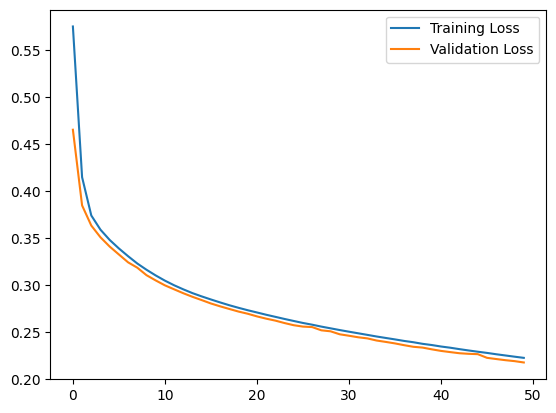

In [ ]:
plt.plot(history_02.history['loss'], label='Training Loss')
plt.plot(history_02.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

In [ ]:
# build the final model
hypermodel = tuner.hypermodel.build(best_hps)
# Retrain the model
history_hypermodel = hypermodel.fit(X_train_dnn, y_train_keras_dnn, epochs=best_epoch, validation_data=(X_test_dnn, y_test_keras_dnn))

Epoch 1/48
1250/1250 [==============================] - 3s 2ms/step - loss: 0.5505 - accuracy: 0.7825 - val_loss: 0.4334 - val_accuracy: 0.8374
Epoch 2/48
1250/1250 [==============================] - 2s 2ms/step - loss: 0.3943 - accuracy: 0.8471 - val_loss: 0.3786 - val_accuracy: 0.8423
Epoch 3/48
1250/1250 [==============================] - 3s 2ms/step - loss: 0.3643 - accuracy: 0.8496 - val_loss: 0.3596 - val_accuracy: 0.8475
Epoch 4/48
1250/1250 [==============================] - 5s 4ms/step - loss: 0.3491 - accuracy: 0.8523 - val_loss: 0.3460 - val_accuracy: 0.8509
Epoch 5/48
1250/1250 [==============================] - 3s 2ms/step - loss: 0.3368 - accuracy: 0.8545 - val_loss: 0.3344 - val_accuracy: 0.8537
Epoch 6/48
1250/1250 [==============================] - 3s 2ms/step - loss: 0.3264 - accuracy: 0.8596 - val_loss: 0.3242 - val_accuracy: 0.8590
Epoch 7/48
1250/1250 [==============================] - 3s 2ms/step - loss: 0.3178 - accuracy: 0.8619 - val_loss: 0.3157 - val_accuracy:

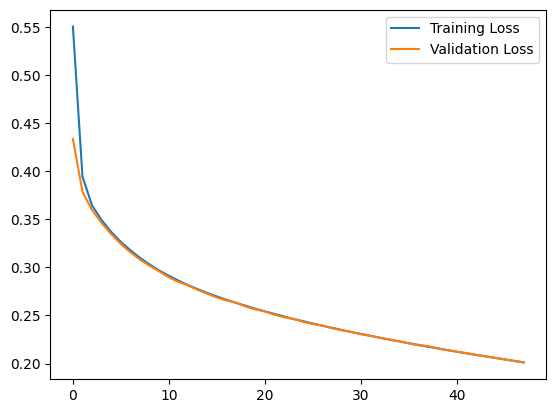

In [ ]:
plt.plot(history_hypermodel.history['loss'], label='Training Loss')
plt.plot(history_hypermodel.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

No Observed overfitting of the model

In [ ]:
eval_result = hypermodel.evaluate(X_test_dnn, y_test_keras_dnn)
print("[test loss, test accuracy]:", eval_result)

313/313 [==============================] - 1s 2ms/step - loss: 0.2011 - accuracy: 0.9269
[test loss, test accuracy]: [0.2010747492313385, 0.9269000291824341]


Extracting the Features

In [ ]:
model_nn = MLP_builder_Tuning(best_hps)

In [ ]:
model_nn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               1792      
                                                                 
 dense_1 (Dense)             (None, 2)                 258       
                                                                 
Total params: 2050 (8.01 KB)
Trainable params: 2050 (8.01 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
from keras.models import Model
intermediate_layer_model = Model(inputs=model_nn.input, outputs=model_nn.layers[-2].output)
model_nn.trainable = False # freezes the weights of the pre-trained model, ensuring that they are not modified during feature extraction.

# Predict the features for the X dataset
X_combined_dnn = np.concatenate([X_train_dnn, X_test_dnn])
X_extracted_dnn = intermediate_layer_model.predict(X_combined_dnn)

1563/1563 [==============================] - 4s 2ms/step


In [ ]:
X_extracted_dnn_df= pd.DataFrame(X_extracted_dnn)

In [ ]:
X_extracted_dnn_df

,0,1,2,3,4,5,6,7,8,9,...,118,119,120,121,122,123,124,125,126,127
0,0.000000,0.754833,0.891882,0.000000,0.340067,0.079278,0.0,0.000000,0.0,0.0,...,0.174317,0.0,0.592003,0.370473,0.663258,0.645709,0.000000,0.000000,0.079850,0.807621
1,0.000000,0.542737,0.156916,0.000000,0.068718,0.186625,0.0,0.070557,0.0,0.0,...,0.000000,0.0,0.190685,0.179089,0.884598,0.521029,0.000000,0.279799,0.000000,0.000000
2,0.231422,0.403964,0.563775,0.010890,0.277613,0.000000,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.644564,0.159369,0.693395,0.429721,0.000000,0.000000,0.000000,0.551501
3,0.000000,0.625730,0.685995,0.192783,0.436444,0.705223,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.223599,0.232280,0.609586,0.412777,0.251057,0.340129,0.447913,0.398844
4,0.209773,0.128038,0.328789,0.184251,0.309078,0.000000,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.353012,0.000000,0.301709,0.473152,0.000000,0.000000,0.000000,0.230697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0.000000,0.790938,0.680731,0.000000,0.168988,0.366705,0.0,0.000000,0.0,0.0,...,0.074459,0.0,0.273249,0.334295,0.997447,0.953499,0.000000,0.014642,0.000000,0.450481
49996,0.103308,0.463656,0.480037,0.000000,0.375361,0.272934,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.294975,0.159726,1.129113,0.816301,0.000000,0.218558,0.282767,0.277322
49997,0.414484,0.552413,0.805594,0.000000,0.387578,0.000000,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.784701,0.255646,0.759816,0.258649,0.000000,0.000000,0.000000,0.777834
49998,0.209773,0.128038,0.328789,0.184251,0.309078,0.000000,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.353012,0.000000,0.301709,0.473152,0.000000,0.000000,0.000000,0.230697


A total of 128 features were extracted

In [ ]:
# Check for outliers in the scaled data
outliers_extracted_dnn = detect_outliers_iqr(X_extracted_dnn)
outliers_extracted_dnn

Number of Outliers: 41035.78


array([1.4680634, 1.5115336, 2.090508 , ..., 1.4674172, 1.7046359,
       1.4637024], dtype=float32)

Comparing between logarithmic and square root transformation to transform the outliers

Text(0.5, 0, 'Square Root-Transformed Values')

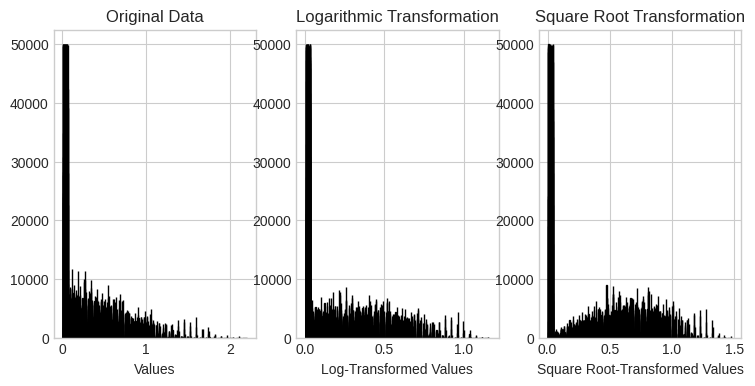

In [ ]:
# Plot the original data
plt.figure(figsize=(12, 4))
plt.subplot(1, 4, 1)
plt.title('Original Data')
plt.hist(X_extracted_dnn, bins=30, edgecolor='black')
plt.xlabel('Values')

# Logarithmic Transformation
log_transformed_data = np.log1p(X_extracted_dnn)
# plot the logarithmically transformed data
plt.subplot(1, 4, 2)
plt.title('Logarithmic Transformation')
plt.hist(log_transformed_data, bins=30, edgecolor='black')
plt.xlabel('Log-Transformed Values')

# Square Root Transformation
sqrt_transformed_data = np.sqrt(X_extracted_dnn)
# plot the square root transformed data
plt.subplot(1, 4, 3)
plt.title('Square Root Transformation')
plt.hist(sqrt_transformed_data, bins=30, edgecolor='black')
plt.xlabel('Square Root-Transformed Values')


In [ ]:
print("After log root transformation", detect_outliers_iqr(log_transformed_data))
print("After square root transformation", detect_outliers_iqr(sqrt_transformed_data))

Number of Outliers: 0.0
After log root transformation []
Number of Outliers: 0.0
After square root transformation []


In [ ]:
log_transformed_data_df = pd.DataFrame(log_transformed_data)
sqrt_transformed_data_df = pd.DataFrame(sqrt_transformed_data)

Comparing between log transformation and square root transformation, we see square root transformation has resulted in a more normal data distribution compared to the log transformation.

### Feature Selection

Importing required libraries

In [ ]:
!pip install deap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 2.3 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import random
import copy
from itertools import repeat
import shutil
import time
import math
import array

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools import add_constant

from sklearn.base import BaseEstimator
from sklearn.metrics import r2_score, mean_absolute_error

from joblib import Parallel, delayed, dump, load
from joblib.externals.loky import get_reusable_executor

from deap import algorithms
from deap import base
from deap import creator
from deap import tools
from tqdm.notebook import tqdm

plt.style.use('seaborn-v0_8-whitegrid')

In [ ]:
Y_dnn = np.concatenate([y_train_dnn,y_test_dnn])

In [ ]:
y_dnn_df = pd.DataFrame(Y_dnn)

Code reference : https://github.com/FlorinAndrei/fast_feature_selection/blob/main/feature_selection.ipynb

In [ ]:
# Define the fitness weights and other parameters
fitness_weights = -1.0
population_size = 100
n_gen = 100
n_jobs = os.cpu_count()

# Define the dataframes X_ga and y_ga
X_ga = sqrt_transformed_data_df.astype(float).copy()
y_ga = y_dnn_df.astype(float).copy()
X_features = X_ga.columns.to_list()[1:]


def evalMany(individuals):
    # - each individual is a list of feature selectors
    ind_list = [list(i) for i in list(individuals)]
    ret = []
    for ind in ind_list:
        cols_select = [i == 1 for i in list(ind)] + [False] # create a list of True/False feature selectors from each individual
        # fit model using the features selected from the individual
        lin_mod = sm.OLS(y_ga, X_ga.loc[:, cols_select], hasconst=True).fit()
        ret.append((lin_mod.bic,))
    return ret

# Define the custom selection function
def selElitistAndTournament(individuals, k_tournament, k_elitist=0, tournsize=3):
    return tools.selBest(individuals, k_elitist) + tools.selTournament(individuals, k_tournament, tournsize)

# multiprocess pool to evaluate individuals
def joblib_map(f, njobs, *iters):
    return Parallel(n_jobs=njobs)(delayed(f)(*args) for args in zip(*iters))

try:
    del creator.FitnessMax
    del creator.Individual
except Exception as e:
    pass

creator.create("FitnessMax", base.Fitness, weights=(fitness_weights,))
creator.create("Individual", array.array, typecode='b', fitness=creator.FitnessMax)

# Hyperparameters
population_size = 100
crossover_probability = 0.5
individual_mutation_probability = 0.2
gene_mutation_probability = 0.1
tournament_size = 3
elite_size = 0

try:
    del toolbox
except Exception as e:
    pass

toolbox = base.Toolbox()
toolbox.register("attr_bool", random.randint, 0, 1)
toolbox.register("individual", tools.initRepeat, creator.Individual, toolbox.attr_bool, len(X_features))
toolbox.register("population", tools.initRepeat, list, toolbox.individual)
toolbox.register("map_multi", joblib_map)
toolbox.register("evaluate", evalMany)
toolbox.register("mate", tools.cxTwoPoint)
toolbox.register("mutate", tools.mutFlipBit, indpb=gene_mutation_probability)
toolbox.register("select",selElitistAndTournament,k_tournament=population_size - elite_size,k_elitist=elite_size,tournsize=tournament_size,)

random.seed(42)
population = toolbox.population(n=population_size)
hall_of_fame = tools.HallOfFame(1)
objective_runs_ga = 0

# Evaluate the individuals with an invalid fitness
invalid_ind = [ind for ind in population if not ind.fitness.valid]
# split the population in a list with n_jobs elements where each element is an array containing multiple individuals
fitnesses_nested = toolbox.map_multi(
    toolbox.evaluate, n_jobs, np.array_split(invalid_ind, n_jobs) # send individuals to the evaluator
)
objective_runs_ga += len(invalid_ind)
fitnesses = []
for l in fitnesses_nested:
    fitnesses += l
for ind, fit in zip(invalid_ind, fitnesses):
    ind.fitness.values = fit

hall_of_fame.update(population)

n_gen = 100
best_objective_per_gen_ga = np.full(n_gen, np.nan)
best_objective_ga = np.nan
best_generation_ga = 0
gene_values_mean = np.zeros((n_gen, len(X_features)))
gene_maes = np.full(n_gen, np.nan)
time_to_best_ga = np.inf
# Begin the generational process
iterator = tqdm(range(1, n_gen + 1), desc='generation')
t_start = time.time()

for gen in iterator:
    t_start_loop = time.time()

    # Select the next generation of individuals
    offspring = toolbox.select(population)
    # Vary the pool of individuals via cross-over and mutation
    offspring = algorithms.varAnd(
        offspring,
        toolbox,
        crossover_probability,
        individual_mutation_probability,
    )
    # Evaluate the individuals with an invalid fitness
    invalid_ind = [ind for ind in offspring if not ind.fitness.valid]
    # split the population in a list with n_jobs elements
    # each element is an array containing multiple individuals
    # send list to the evaluator pool
    fitnesses_nested = toolbox.map_multi(
        toolbox.evaluate, n_jobs, np.array_split(invalid_ind, n_jobs)
    )
    objective_runs_ga += len(invalid_ind)
    fitnesses = []
    for l in fitnesses_nested:
        fitnesses += l
    for ind, fit in zip(invalid_ind, fitnesses):
        ind.fitness.values = fit
    # Update the hall of fame with the generated individuals
    hall_of_fame.update(offspring)
    # Replace the current population by the offspring
    population[:] = offspring

    t_end_loop = time.time()
    # record the mean gene values across the population
    gene_values_mean[gen - 1, :] = np.array(population).mean(axis=0)
    if gen >= 2:
        gene_maes[gen - 1] = mean_absolute_error(
            gene_values_mean[gen - 2, :], gene_values_mean[gen - 1, :]
        )
    # pick best individual for stats recording
    best_individual_ga = tools.selBest(population, 1)[0]
    best_objective_per_gen_ga[gen - 1] = best_individual_ga.fitness.values[0]
    if (
        best_objective_ga is np.nan
        or fitness_weights * best_individual_ga.fitness.values[0]
        > fitness_weights * best_objective_ga
    ):
        best_objective_ga = best_individual_ga.fitness.values[0]
        best_generation_ga = gen
        time_to_best_ga = t_end_loop - t_start
        print(
            f'gen: {gen:4n}, curr/prev gene MAE: {gene_maes[gen - 1]:.4f}, new best objective: {best_objective_ga:.4f}, time to best: {time_to_best_ga:.4f}'
        )

    if os.path.isfile('break'):
        # to gracefully break the loop, manually create a file called 'break'
        print(f'Found break file, stopping now.')
        iterator.close()
        break
g_completed_ga = gen

best_individual_ga = list(hall_of_fame[0])
best_features_ga = [
    X_features[i] for i, val in enumerate(best_individual_ga) if val == 1
]
best_objective_ga = (
    sm.OLS(y_ga, X_ga[best_features_ga], hasconst=True).fit().bic
)

generation:   0%|          | 0/100 [00:00<?, ?it/s]

gen:    1, curr/prev gene MAE: nan, new best objective: 25482.2259, time to best: 29.7112
gen:    2, curr/prev gene MAE: 0.0554, new best objective: 25403.0593, time to best: 52.3748
gen:    4, curr/prev gene MAE: 0.0569, new best objective: 24245.0073, time to best: 114.6058
gen:    5, curr/prev gene MAE: 0.0588, new best objective: 23916.0759, time to best: 141.5868
gen:    6, curr/prev gene MAE: 0.0761, new best objective: 23879.2763, time to best: 168.9586
gen:    7, curr/prev gene MAE: 0.0627, new best objective: 23825.4576, time to best: 200.1815
gen:    8, curr/prev gene MAE: 0.0547, new best objective: 23082.7741, time to best: 236.3036
gen:    9, curr/prev gene MAE: 0.0595, new best objective: 22838.8097, time to best: 270.4218
gen:   10, curr/prev gene MAE: 0.0405, new best objective: 22566.8342, time to best: 310.5100
gen:   11, curr/prev gene MAE: 0.0394, new best objective: 22069.2223, time to best: 347.5423
gen:   14, curr/prev gene MAE: 0.0483, new best objective: 22039.

best objective:  25703.998698493568
best generation: 77
objective runs:  6130
time to best:    3594.532 sec
best features:   [1, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 47, 48, 50, 51, 52, 53, 55, 57, 58, 59, 60, 61, 63, 64, 65, 66, 67, 69, 70, 73, 74, 76, 77, 79, 81, 82, 84, 85, 87, 88, 89, 91, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104, 105, 106, 107, 109, 110, 111, 112, 114, 115, 116, 117, 120, 122, 123, 124, 125, 127]


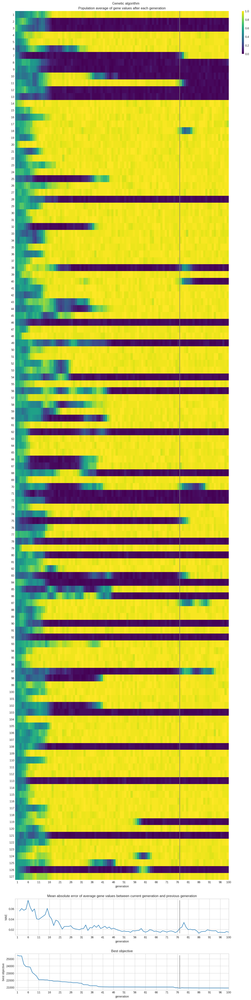

In [ ]:
# Print best objective, best generation, objective runs, and time to best
print(f'Best objective:  {best_objective_ga}')
print(f'Best generation: {best_generation_ga}')
print(f'Objective runs:  {objective_runs_ga}')
print(f'Time to best:    {time_to_best_ga:.3f} sec')

# Print best features
print(f'Best features:   {best_features_ga}')

# Create a DataFrame for the population average of gene values
gvm_df = pd.DataFrame(
    gene_values_mean[:g_completed_ga],
    columns=X_features,
    index=range(1, g_completed_ga + 1)
)

# Plotting
fig, ax = plt.subplots(
    3,
    1,
    sharex=True,
    height_ratios=[24, 1, 1],
    figsize=(12, 48),
    layout='constrained',
)
sns.heatmap(
    gvm_df.T,
    vmin=0.0,
    vmax=1.0,
    cmap='viridis',
    cbar=True,
    cbar_kws={'fraction': 0.01, 'anchor': (0.0, 1.0)},
    ax=ax[0]
)
ax[0].set_title('Population average of gene values after each generation')
ax[0].axvline(x=best_generation_ga, color='C7')
ax[0].set_xlabel('Generation')
ax[0].set_ylabel('Feature')
ax[0].set_xticks(range(1, g_completed_ga + 1, max(g_completed_ga // 20, 1)))
ax[0].tick_params(axis='both', reset=True)

ax[1].plot(range(2, g_completed_ga + 1), gene_maes[1:g_completed_ga])
ax[1].vlines(x=best_generation_ga, ymin=min(gene_maes), ymax=max(gene_maes), colors='C7')
ax[1].set_xlabel('Generation')
ax[1].set_ylabel('MAE')
ax[1].set_title('Mean absolute error of average gene values between current and previous generations')
ax[1].tick_params(axis='both', reset=True)

ax[2].plot(range(1, g_completed_ga + 1), best_objective_per_gen_ga[:g_completed_ga])
ax[2].vlines(x=best_generation_ga, ymin=min(best_objective_per_gen_ga), ymax=max(best_objective_per_gen_ga), colors='C7')
ax[2].set_xlabel('Generation')
ax[2].set_ylabel('Best Objective')
ax[2].set_title('Best objective')
ax[2].tick_params(axis='both', reset=True)

# Adjust layout and save/show the figure
#fig.tight_layout()
#fig.subplots_adjust(top=0.95)
fig.savefig('ga-performance.png')
plt.show()


In [ ]:
import pickle

# Save all the relevant values to a dictionary
results = {
    'best_objective': best_objective_ga,
    'best_generation': best_generation_ga,
    'objective_runs': objective_runs_ga,
    'time_to_best': time_to_best_ga,
    'best_features': best_features_ga,
    'gene_values_mean': gene_values_mean,
    'gene_maes': gene_maes,
    'best_objective_per_gen': best_objective_per_gen_ga
}

# Save the dictionary to a file
with open('dnn_ga_results.pkl', 'wb') as f:
    pickle.dump(results, f)

In [ ]:
import pickle

# Load the dictionary from the file
with open('/content/drive/MyDrive/DNN_GA1/dnn_ga_results.pkl', 'rb') as f:
    results_loaded = pickle.load(f)

# Access the individual values as needed
best_objective_loaded_dnn = results_loaded['best_objective']
best_generation_loaded_dnn = results_loaded['best_generation']
objective_runs_loaded_dnn = results_loaded['objective_runs']
time_to_best_loaded_dnn = results_loaded['time_to_best']
best_features_loaded_dnn = results_loaded['best_features']
gene_values_mean_loaded_dnn = results_loaded['gene_values_mean']
gene_maes_loaded_dnn = results_loaded['gene_maes']
best_objective_per_gen_loaded_dnn = results_loaded['best_objective_per_gen']


In [ ]:
# making copies of the dataframe
X_ga_dnn = sqrt_transformed_data_df.astype(float).copy()
y_ga_dnn = y_dnn_df.astype(float).copy()

In [ ]:
# Accessing those features whose feature indices are present in the best_features_loaded
selected_features_dnn_df = X_ga_dnn[best_features_loaded_dnn]
X_train_selected_dnn_ga, X_test_selected_dnn_ga, y_train_dnn_ga, y_test_dnn_ga = train_test_split(selected_features_dnn_df, y_dnn_df, test_size=0.2, random_state=42)

In [ ]:
y_test_dnn_ga.columns = ['target']
y_train_dnn_ga.columns = ['target']

### Model Evaluation and ParameterTuning

Importing required libraries

In [ ]:
!pip3 install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.8/78.8 kB 8.1 MB/s eta 0:00:00


In [ ]:
import optuna
from optuna.samplers import TPESampler
import pickle

Gaussian Naive Bayes

In [ ]:
def objective_gnb(trial):
    var_smoothing = trial.suggest_float("var_smoothing", 1e-10, 1e-5, log=True)
    model = GaussianNB(var_smoothing=var_smoothing)
    model.fit(X_train_selected_dnn_ga, y_train_dnn_ga)
    y_pred = model.predict(X_test_selected_dnn_ga)
    return accuracy_score(y_test_dnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_gnb = optuna.create_study(direction="maximize", sampler=sampler)
study_gnb.optimize(objective_gnb, n_trials=100)

print("Number of finished trials: ", len(study_gnb.trials))
print("Best trial:")
trial = study_gnb.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-04-09 10:56:10,057] A new study created in memory with name: no-name-af57dcdd-9b27-4bde-aa1f-2c738b7381a1
[I 2024-04-09 10:56:10,259] Trial 0 finished with value: 0.7718 and parameters: {'var_smoothing': 1.2164941464151851e-08}. Best is trial 0 with value: 0.7718.
[I 2024-04-09 10:56:10,514] Trial 1 finished with value: 0.7732 and parameters: {'var_smoothing': 3.995972283135059e-07}. Best is trial 1 with value: 0.7732.
[I 2024-04-09 10:56:10,725] Trial 2 finished with value: 0.757 and parameters: {'var_smoothing': 1.0013176560941255e-10}. Best is trial 1 with value: 0.7732.
[I 2024-04-09 10:56:10,948] Trial 3 finished with value: 0.7695 and parameters: {'var_smoothing': 3.2483503450866807e-09}. Best is trial 1 with value: 0.7732.
[I 2024-04-09 10:56:11,105] Trial 4 finished with value: 0.7641 and parameters: {'var_smoothing': 5.417257182767975e-10}. Best is trial 1 with value: 0.7732.
[I 2024-04-09 10:56:11,384] Trial 5 finished with value: 0.763 and parameters: {'var_smoothing

Number of finished trials:  100
Best trial:
  Value:  0.7757
  Params: 
    var_smoothing: 2.0257343240606016e-07


Hypertuned Gaussian Naive Bayes performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.77435
Precision: 0.7988828568988633
Recall (TPR): 0.77435
False Positive Rate (FPR): 0.21140865387562624
F1 score (F-measure): 0.7761695094843152
Specificity: 0.7885913461243738
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.77435,0.885007,0.711694,0.134512,0.788944,16870,2192,14104,6834
1,1,0.77435,0.673608,0.865488,0.288306,0.757587,14104,6834,16870,2192


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


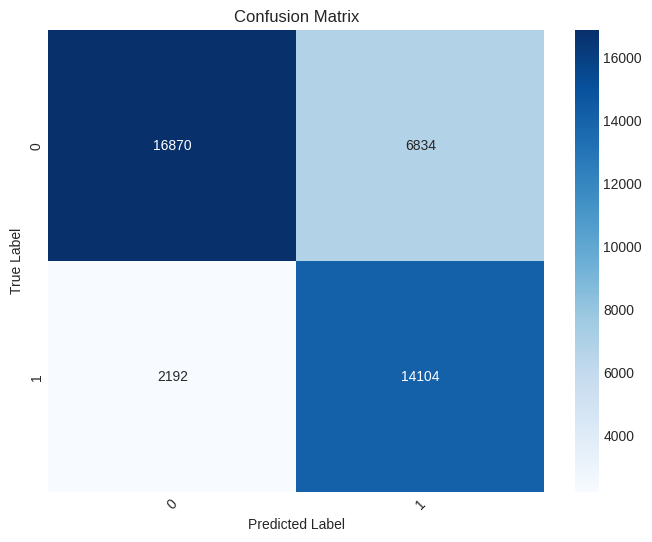

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.7757
Precision: 0.7979576172569818
Recall (TPR): 0.7757
False Positive Rate (FPR): 0.21134537689721522
F1 score (F-measure): 0.7774515504061899
Specificity: 0.7886546231027848
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.7757,0.880933,0.716924,0.139614,0.790511,4232,572,3525,1671
1,1,0.7757,0.678406,0.860386,0.283076,0.758636,3525,1671,4232,572


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


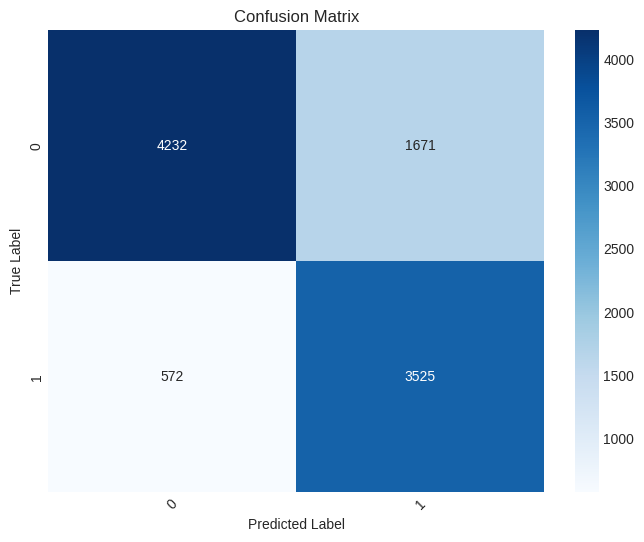

In [ ]:
print("Hypertuned Gaussian Naive Bayes performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model_gb = GaussianNB(var_smoothing = trial.params['var_smoothing'])
gb_dnn_result_1 = runclassifier(model_gb,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

Gaussian Naive Bayes performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.765025
Precision: 0.794298405127285
Recall (TPR): 0.765025
False Positive Rate (FPR): 0.21845187976203317
F1 score (F-measure): 0.7667221002265021
Specificity: 0.7815481202379668
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.765025,0.886267,0.692330,0.129234,0.777386,16411,2106,14190,7293
1,1,0.765025,0.660522,0.870766,0.307670,0.751211,14190,7293,16411,2106


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


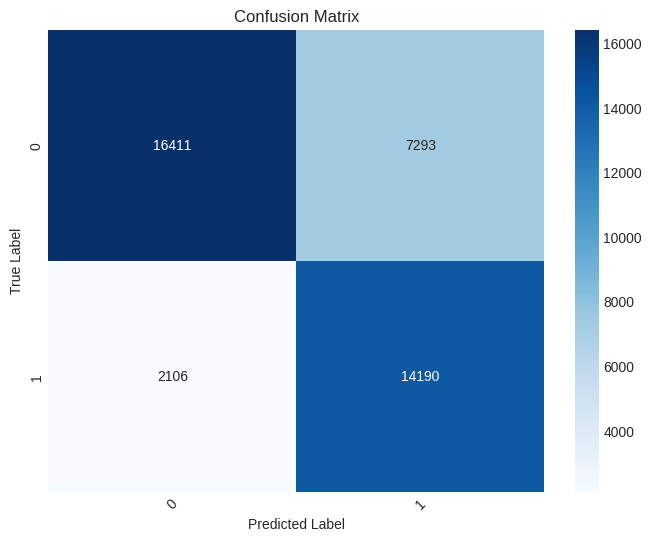

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.7657
Precision: 0.7921960179833528
Recall (TPR): 0.7657
False Positive Rate (FPR): 0.21929291671709472
F1 score (F-measure): 0.767370143524854
Specificity: 0.7807070832829053
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.7657,0.880667,0.697611,0.136197,0.778523,4118,558,3539,1785
1,1,0.7657,0.664726,0.863803,0.302389,0.751300,3539,1785,4118,558


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


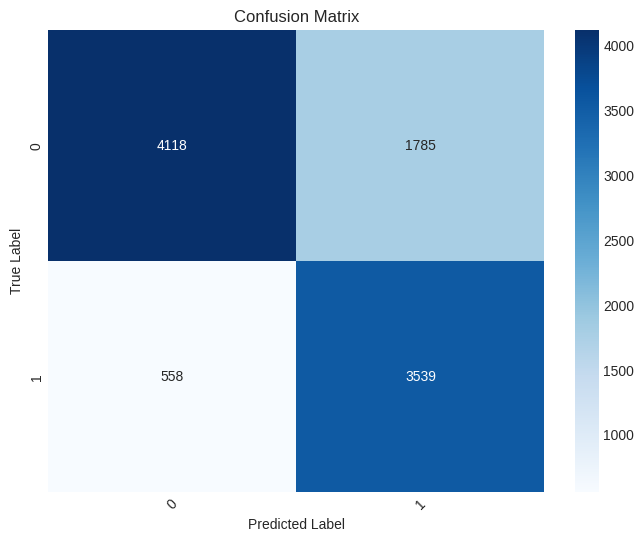

In [ ]:
print("Gaussian Naive Bayes performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = GaussianNB()
gb_dnn_result_2 = runclassifier(model,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

Logistic Regression

In [ ]:
def objective_lr(trial):
    penalty  = trial.suggest_categorical("penalty", ['l2'])
    solvers  = trial.suggest_categorical('solvers', ['newton-cg', 'lbfgs', 'liblinear'])
    C = trial.suggest_categorical("C", [100, 10, 1.0, 0.1, 0.01])
    model = LogisticRegression(solver=solvers,penalty=penalty,C=C)
    model.fit(X_train_selected_dnn_ga, y_train_dnn_ga)
    y_pred = model.predict(X_test_selected_dnn_ga)
    return accuracy_score(y_test_dnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_lr = optuna.create_study(direction="maximize", sampler=sampler)
study_lr.optimize(objective_lr, n_trials=100)

print("Number of finished trials: ", len(study_lr.trials))
print("Best trial:")
trial_lr = study_lr.best_trial
print("  Value: ", trial_lr.value)
print("  Params: ")
for key, value in trial_lr.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-29 10:31:35,412] A new study created in memory with name: no-name-26e25236-2975-4fa6-a5a5-7f8a7bb08a3d
[I 2024-03-29 10:31:36,959] Trial 0 finished with value: 0.8531 and parameters: {'penalty': 'l2', 'solvers': 'lbfgs', 'C': 0.01}. Best is trial 0 with value: 0.8531.
[I 2024-03-29 10:31:39,810] Trial 1 finished with value: 0.8861 and parameters: {'penalty': 'l2', 'solvers': 'lbfgs', 'C': 1.0}. Best is trial 1 with value: 0.8861.
[I 2024-03-29 10:31:42,607] Trial 2 finished with value: 0.8861 and parameters: {'penalty': 'l2', 'solvers': 'lbfgs', 'C': 1.0}. Best is trial 1 with value: 0.8861.
[I 2024-03-29 10:31:44,652] Trial 3 finished with value: 0.8861 and parameters: {'penalty': 'l2', 'solvers': 'lbfgs', 'C': 1.0}. Best is trial 1 with value: 0.8861.
[I 2024-03-29 10:31:50,380] Trial 4 finished with value: 0.8861 and parameters: {'penalty': 'l2', 'solvers': 'newton-cg', 'C': 1.0}. Best is trial 1 with value: 0.8861.
[I 2024-03-29 10:31:54,446] Trial 5 finished with value:

Number of finished trials:  100
Best trial:
  Value:  0.8891
  Params: 
    penalty: l2
    solvers: newton-cg
    C: 100


In [ ]:
model_lr = LogisticRegression(solver=trial_lr.params["solvers"],penalty= trial_lr.params["penalty"],C= trial_lr.params["C"])

In [ ]:
with open('lr_dnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_lr, f)

In [ ]:
# Load the dictionary from the file
with open('/content/drive/MyDrive/DNN_GA1/lr_dnn_ga_results.pkl', 'rb') as f:
    model_lr = pickle.load(f)

Parameter tuned Logistic Regression performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8899
Precision: 0.8896284625579854
Recall (TPR): 0.8899
False Positive Rate (FPR): 0.11612000468550843
F1 score (F-measure): 0.8896528690109706
Specificity: 0.8838799953144916
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8899,0.899685,0.916385,0.148625,0.907959,21722,2422,13874,1982
1,1,0.8899,0.875000,0.851375,0.083615,0.863026,13874,1982,21722,2422


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


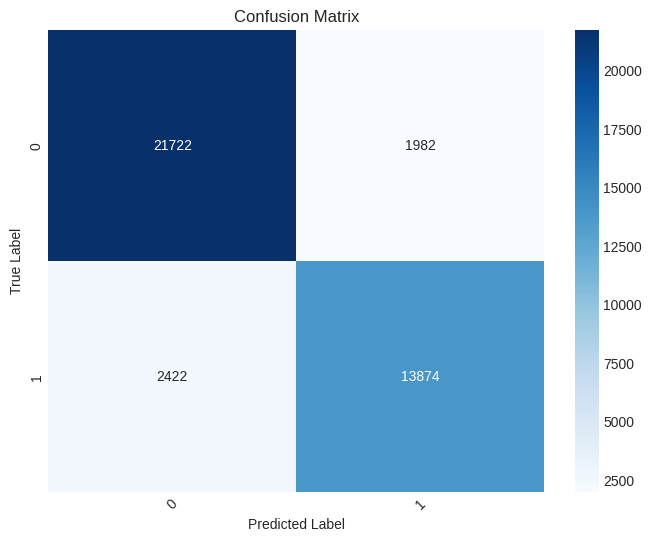

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8883
Precision: 0.8880263461805853
Recall (TPR): 0.8883
False Positive Rate (FPR): 0.11787437298402104
F1 score (F-measure): 0.8880103343098115
Specificity: 0.882125627015979
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8883,0.896718,0.916314,0.152062,0.90641,5409,623,3474,494
1,1,0.8883,0.875504,0.847938,0.083686,0.86150,3474,494,5409,623


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


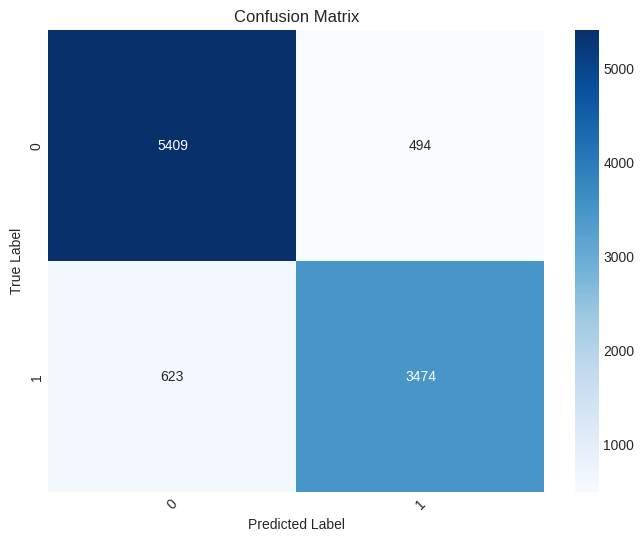

In [ ]:
print("Parameter tuned Logistic Regression performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
lr_dnn_result_1 = runclassifier(model_lr,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

Logistic Regression performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8859
Precision: 0.8855976525774364
Recall (TPR): 0.8859
False Positive Rate (FPR): 0.12091411817587927
F1 score (F-measure): 0.8855584414694952
Specificity: 0.8790858818241207
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8859,0.894152,0.915879,0.157707,0.904885,21710,2570,13726,1994
1,1,0.8859,0.873155,0.842293,0.084121,0.857446,13726,1994,21710,2570


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


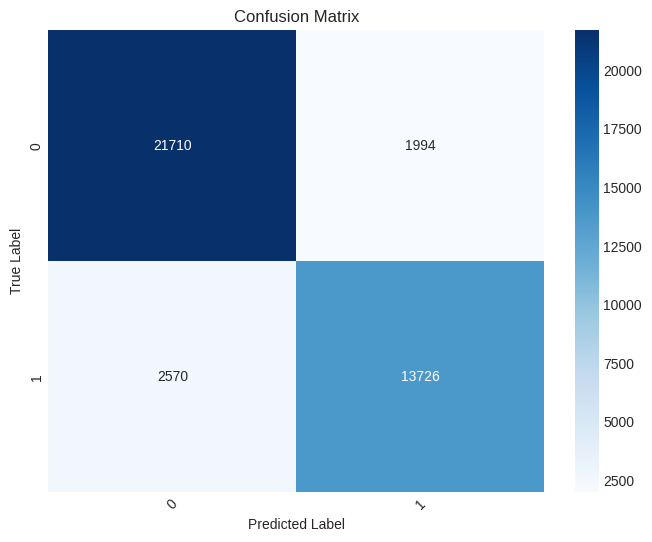

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8862
Precision: 0.8859222518197214
Recall (TPR): 0.8862
False Positive Rate (FPR): 0.12054923732222722
F1 score (F-measure): 0.8858377452710725
Specificity: 0.8794507626777728
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8862,0.893217,0.916822,0.157920,0.904865,5412,647,3450,491
1,1,0.8862,0.875412,0.842080,0.083178,0.858422,3450,491,5412,647


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


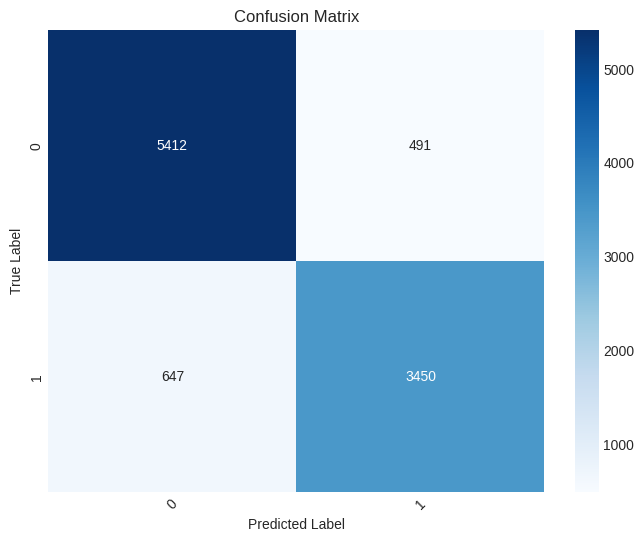

In [ ]:
print("Logistic Regression performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = LogisticRegression()
lr_dnn_result_2 = runclassifier(model,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

Support Vector Machine

In [ ]:
def objective(trial):
    kernel = trial.suggest_categorical('kernel', ['poly','rbf','sigmoid'])
    C = trial.suggest_categorical('C', [50,10,1.0,0.1,0.01])
    gamma = trial.suggest_categorical('gamma',['scale'])
    model = SVC(kernel=kernel,C=C,gamma=gamma) # do not tune the seed
    model.fit(X_train_selected_dnn_ga, y_train_dnn_ga)
    y_pred = model.predict(X_test_selected_dnn_ga)
    return accuracy_score(y_test_dnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study = optuna.create_study(direction="maximize", sampler=sampler)
study.optimize(objective, n_trials=100)

print("Number of finished trials: ", len(study.trials))
print("Best trial:")
trial = study.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-31 17:45:07,425] A new study created in memory with name: no-name-625be755-b0ad-4280-a82c-f3b7cc57fd3c
[I 2024-03-31 17:47:45,837] Trial 0 finished with value: 0.8528 and parameters: {'kernel': 'rbf', 'C': 0.01, 'gamma': 'scale'}. Best is trial 0 with value: 0.8528.
[I 2024-03-31 17:49:15,989] Trial 1 finished with value: 0.9357 and parameters: {'kernel': 'rbf', 'C': 1.0, 'gamma': 'scale'}. Best is trial 1 with value: 0.9357.
[I 2024-03-31 17:50:44,337] Trial 2 finished with value: 0.9357 and parameters: {'kernel': 'rbf', 'C': 1.0, 'gamma': 'scale'}. Best is trial 1 with value: 0.9357.
[I 2024-03-31 17:52:12,581] Trial 3 finished with value: 0.9357 and parameters: {'kernel': 'rbf', 'C': 1.0, 'gamma': 'scale'}. Best is trial 1 with value: 0.9357.
[I 2024-03-31 17:53:22,018] Trial 4 finished with value: 0.9463 and parameters: {'kernel': 'poly', 'C': 1.0, 'gamma': 'scale'}. Best is trial 4 with value: 0.9463.
[I 2024-03-31 17:54:52,954] Trial 5 finished with value: 0.9202 and p

Number of finished trials:  100
Best trial:
  Value:  0.9751
  Params: 
    kernel: poly
    C: 50
    gamma: scale


In [ ]:
model_svc = SVC(kernel=trial.params['kernel'],C=trial.params['C'],gamma=trial.params['gamma'], probability=True)

In [ ]:
filename = "DNN_NEW_svc_model.pkl"
pickle.dump(model_svc, open(filename, "wb"))

In [ ]:
with open('/content/drive/MyDrive/DNN_GA1/DNN_NEW_svc_model.pkl', 'rb') as f:
    model_svc = pickle.load(f)

Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.978125
Precision: 0.9781197444000345
Recall (TPR): 0.978125
False Positive Rate (FPR): 0.023318367623865743
F1 score (F-measure): 0.9781101283470498
Specificity: 0.9766816323761343
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.978125,0.978736,0.984475,0.031112,0.981597,23336,507,15789,368
1,1,0.978125,0.977223,0.968888,0.015525,0.973038,15789,368,23336,507


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


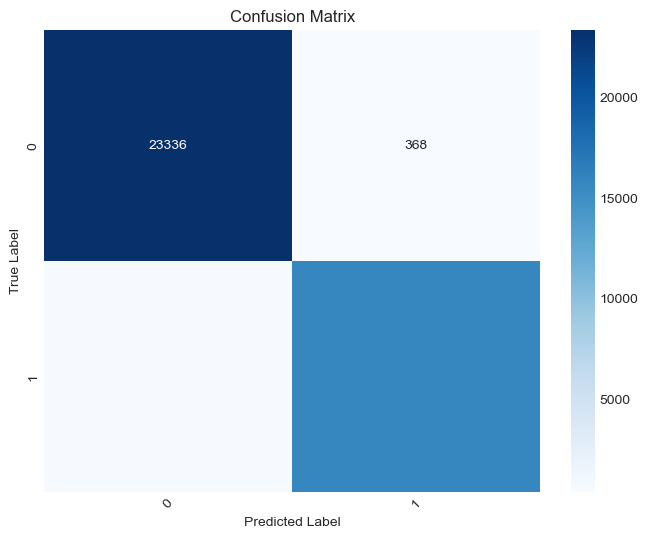

------------------------------------------------------------------------------------------------
ROC Curve for Train Set
------------------------------------------------------------------------------------------------


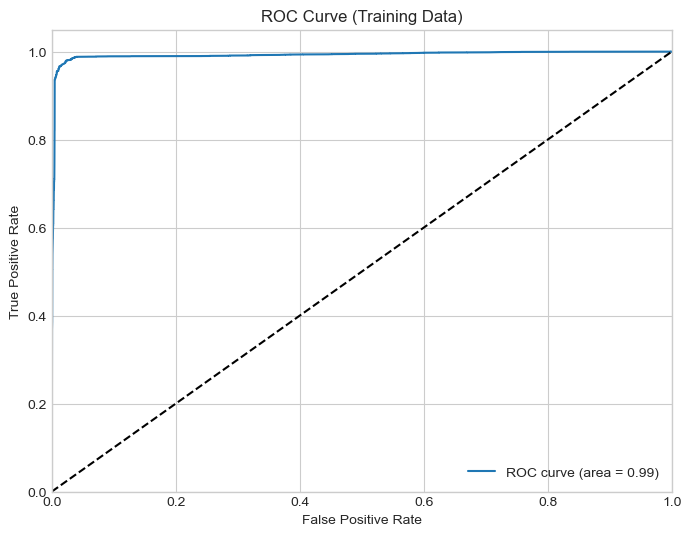

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9733
Precision: 0.9732908593734837
Recall (TPR): 0.9733
False Positive Rate (FPR): 0.028328306234329137
F1 score (F-measure): 0.9732801109880613
Specificity: 0.9716716937656709
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9733,0.974251,0.980688,0.037344,0.977459,5789,153,3944,114
1,1,0.9733,0.971907,0.962656,0.019312,0.967259,3944,114,5789,153


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


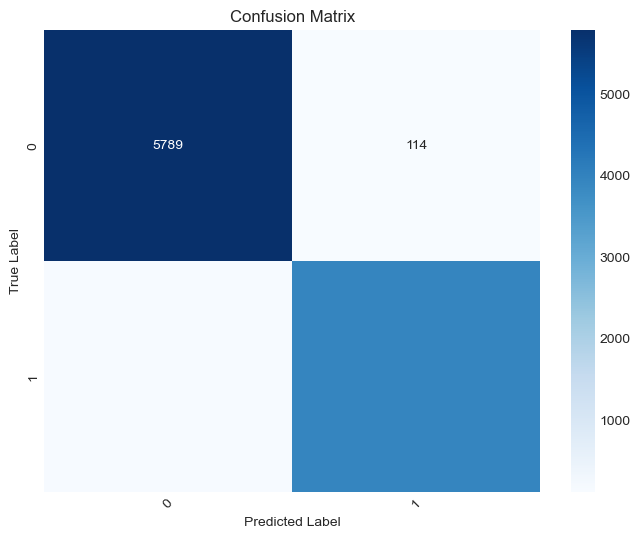

------------------------------------------------------------------------------------------------
ROC Curve for Test Set
------------------------------------------------------------------------------------------------


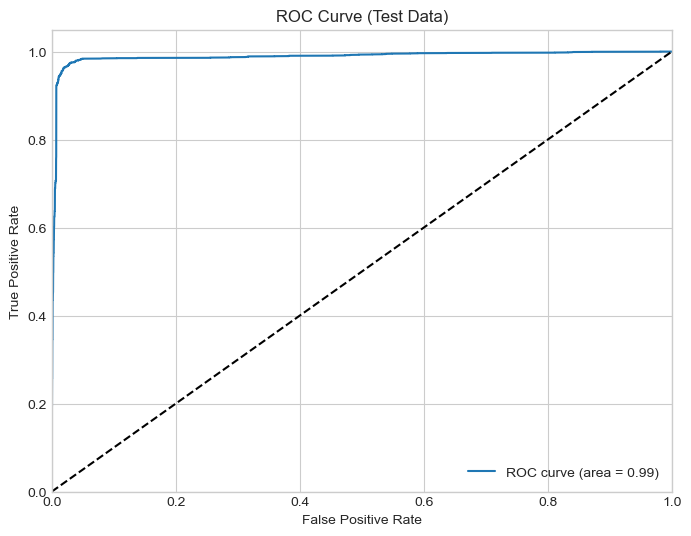

In [ ]:
svc_dnn_result_1 = runclassifier(model_svc,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

Support Vector Machine performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.92845
Precision: 0.9284624692337479
Recall (TPR): 0.92845
False Positive Rate (FPR): 0.07714052598642951
F1 score (F-measure): 0.9282115774959446
Specificity: 0.9228594740135705
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.92845,0.928143,0.953046,0.107327,0.940430,22591,1749,14547,1113
1,1,0.92845,0.928927,0.892673,0.046954,0.910439,14547,1113,22591,1749


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


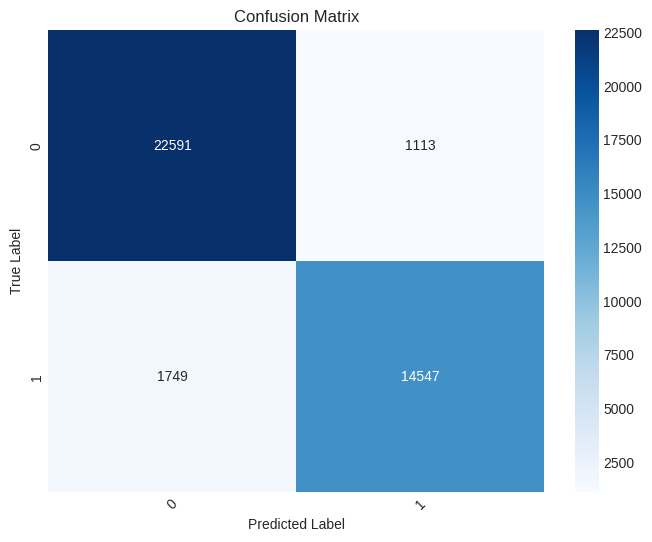

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9266
Precision: 0.9267179155896503
Recall (TPR): 0.9266
False Positive Rate (FPR): 0.079421851707147
F1 score (F-measure): 0.9263100876870667
Specificity: 0.920578148292853
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9266,0.924175,0.953922,0.112765,0.938813,5631,462,3635,272
1,1,0.9266,0.930381,0.887235,0.046078,0.908296,3635,272,5631,462


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


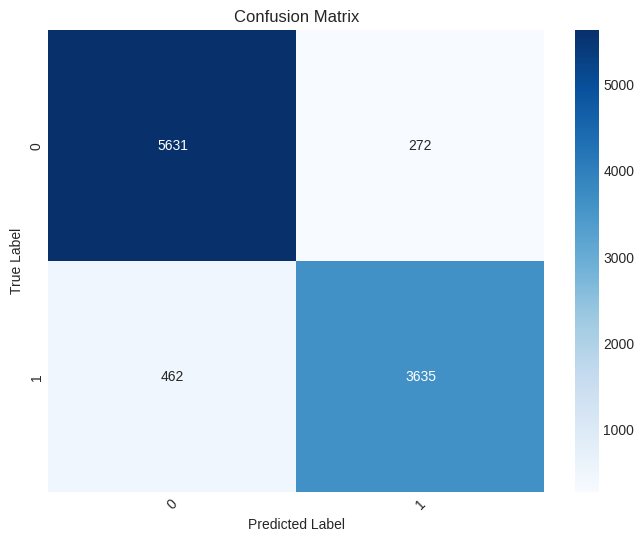

In [ ]:
print("Support Vector Machine performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = SVC(probability = True)
svc_dnn_result_2 = runclassifier(model,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

DecisionTree

In [ ]:
def objective_dt(trial):
    max_depth = trial.suggest_int('max_depth', 3, 10)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    max_features = trial.suggest_categorical('max_features', ['auto', 'sqrt', 'log2'])
    model = DecisionTreeClassifier(max_depth=max_depth, min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf,max_features=max_features,random_state=1)
    model.fit(X_train_selected_dnn_ga, y_train_dnn_ga)
    y_pred = model.predict(X_test_selected_dnn_ga)
    return accuracy_score(y_test_dnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_dt = optuna.create_study(direction="maximize", sampler=sampler)
study_dt.optimize(objective_dt, n_trials=100)

print("Number of finished trials: ", len(study_dt.trials))
print("Best trial:")
trial = study_dt.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-04-09 14:02:15,226] A new study created in memory with name: no-name-0e50384a-7504-4f2c-b59a-b741c3c9c757
[I 2024-04-09 14:02:15,583] Trial 0 finished with value: 0.9187 and parameters: {'max_depth': 6, 'min_samples_split': 15, 'min_samples_leaf': 1, 'max_features': 'auto'}. Best is trial 0 with value: 0.9187.
[I 2024-04-09 14:02:15,812] Trial 1 finished with value: 0.8539 and parameters: {'max_depth': 4, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.9187.
[I 2024-04-09 14:02:16,013] Trial 2 finished with value: 0.8667 and parameters: {'max_depth': 4, 'min_samples_split': 18, 'min_samples_leaf': 1, 'max_features': 'auto'}. Best is trial 0 with value: 0.9187.
[I 2024-04-09 14:02:16,213] Trial 3 finished with value: 0.8667 and parameters: {'max_depth': 4, 'min_samples_split': 5, 'min_samples_leaf': 17, 'max_features': 'auto'}. Best is trial 0 with value: 0.9187.
[I 2024-04-09 14:02:16,488] Trial 4 finished with value: 0.9603

Number of finished trials:  100
Best trial:
  Value:  0.9648
  Params: 
    max_depth: 10
    min_samples_split: 17
    min_samples_leaf: 2
    max_features: auto


In [ ]:
model_dt = DecisionTreeClassifier(max_depth=trial.params['max_depth'], min_samples_split=trial.params['min_samples_split'], min_samples_leaf=trial.params['min_samples_leaf'],max_features=trial.params['max_features'],random_state=1)

In [ ]:
filename = "dnn_ga_dt_model.pkl"
pickle.dump(model_dt, open(filename, "wb"))

Parameter Tuned Support Vector Machine performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9628
Precision: 0.9627933924430921
Recall (TPR): 0.9628
False Positive Rate (FPR): 0.0398540972766559
F1 score (F-measure): 0.9627484170113663
Specificity: 0.9601459027233441
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9628,0.963181,0.974477,0.054185,0.968796,23099,883,15413,605
1,1,0.9628,0.962230,0.945815,0.025523,0.953952,15413,605,23099,883


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


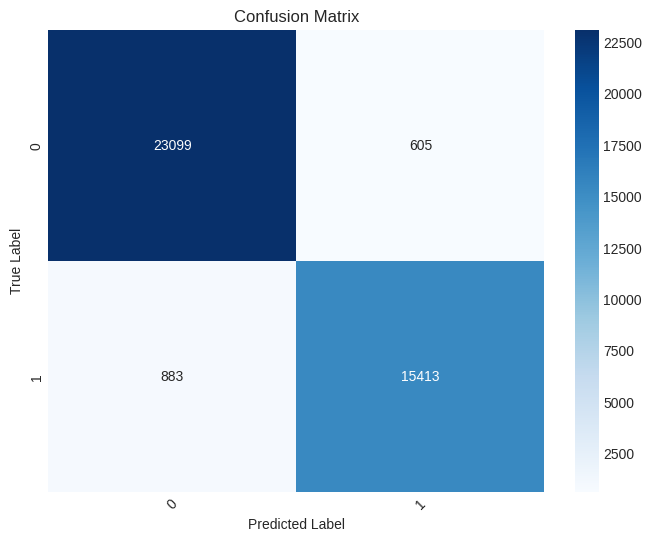

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9648
Precision: 0.9648179694263612
Recall (TPR): 0.9648
False Positive Rate (FPR): 0.037880318091796594
F1 score (F-measure): 0.9647449314540223
Specificity: 0.9621196819082034
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9648,0.963898,0.976961,0.052722,0.970385,5767,216,3881,136
1,1,0.9648,0.966144,0.947278,0.023039,0.956618,3881,136,5767,216


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


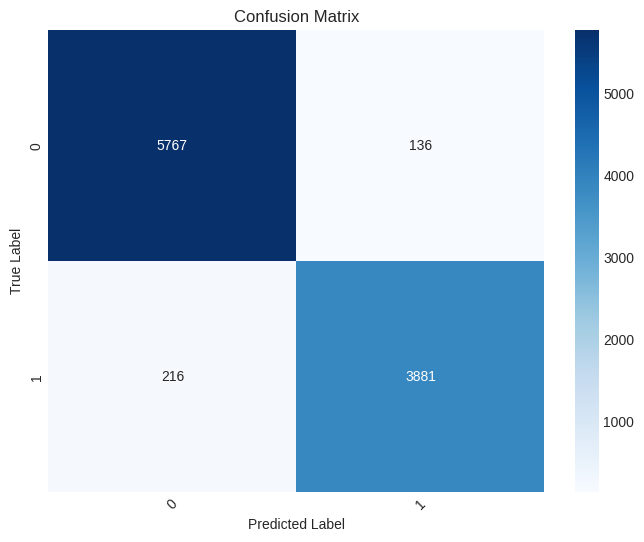

In [ ]:
print("Parameter Tuned Support Vector Machine performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
dt_dnn_result_1 = runclassifier(model_dt,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

Support Vector Machine performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9794
Precision: 0.9793965444754431
Recall (TPR): 0.9794
False Positive Rate (FPR): 0.02142754419546189
F1 score (F-measure): 0.9793980189753762
Specificity: 0.9785724558045381
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9794,0.982212,0.983041,0.025896,0.982626,23302,422,15874,402
1,1,0.9794,0.975301,0.974104,0.016959,0.974702,15874,402,23302,422


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


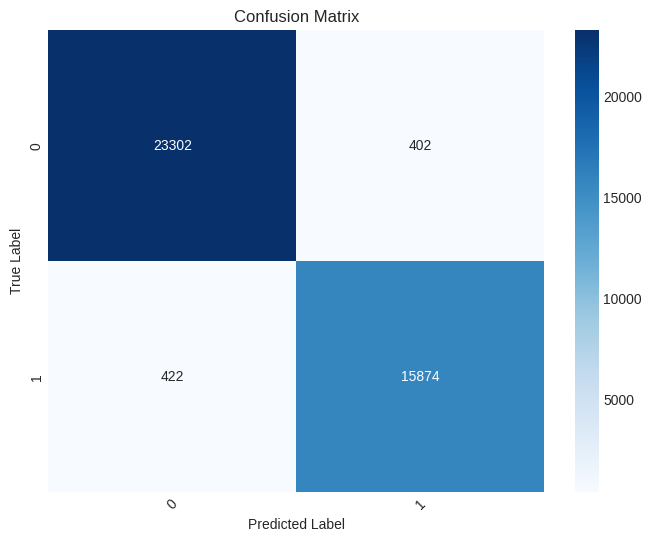

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9814
Precision: 0.981394346095105
Recall (TPR): 0.9814
False Positive Rate (FPR): 0.019637834685730216
F1 score (F-measure): 0.9813922612263788
Specificity: 0.9803621653142698
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9814,0.982447,0.986109,0.025384,0.984275,5821,104,3993,82
1,1,0.9814,0.979877,0.974616,0.013891,0.977239,3993,82,5821,104


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


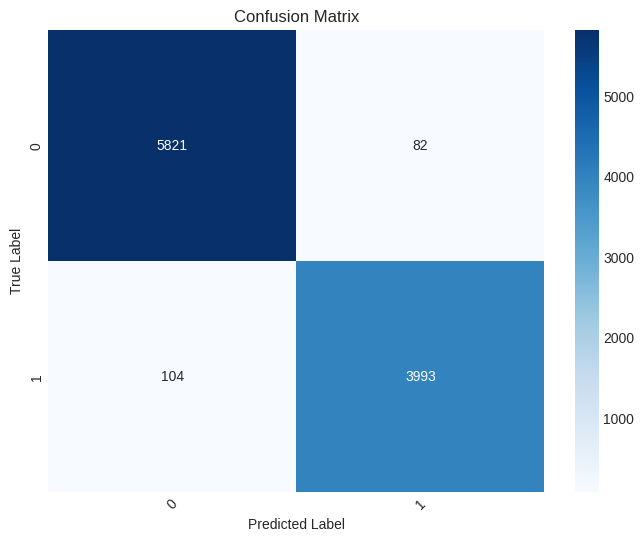

In [ ]:
print("Support Vector Machine performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = DecisionTreeClassifier()
dt_dnn_result_2 = runclassifier(model,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

RandomForest Classifier

In [ ]:
def objective_rf(trial):
    n_estimators = trial.suggest_int("n_estimators", 50, 500)
    max_features  = trial.suggest_categorical("max_features", ['sqrt','log2'])
    criterion  = trial.suggest_categorical("criterion", ['gini','entropy'])
    max_depth = trial.suggest_int("max_depth", 1, 21)
    min_samples_split = trial.suggest_int("min_samples_split", 2, 11)
    min_samples_leaf = trial.suggest_categorical("min_samples_leaf", [1, 2, 4])
    max_leaf_nodes = trial.suggest_int("max_leaf_nodes", 2, 20)
    model = RandomForestClassifier(n_estimators=n_estimators, min_samples_leaf = min_samples_leaf, max_leaf_nodes= max_leaf_nodes,  min_samples_split=min_samples_split, criterion = criterion, max_features = max_features,  max_depth=max_depth, random_state=1)
    model.fit(X_train_selected_dnn_ga, y_train_dnn_ga)
    y_pred = model.predict(X_test_selected_dnn_ga)
    return accuracy_score(y_test_dnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_random = optuna.create_study(direction="maximize", sampler=sampler)
study_random.optimize(objective_rf, n_trials=100)

print("Number of finished trials: ", len(study_random.trials))
print("Best trial:")
trial_random = study_random.best_trial
print("  Value: ", trial_random.value)
print("  Params: ")
for key, value in trial_random.params.items():
    print("    {}: {}".format(key, value))

[I 2024-04-09 14:17:20,443] A new study created in memory with name: no-name-d44c4624-6a41-48e1-8d3c-704c127e835d
[I 2024-04-09 14:17:35,418] Trial 0 finished with value: 0.8497 and parameters: {'n_estimators': 238, 'max_features': 'sqrt', 'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_leaf_nodes': 9}. Best is trial 0 with value: 0.8497.
[I 2024-04-09 14:17:52,861] Trial 1 finished with value: 0.9105 and parameters: {'n_estimators': 359, 'max_features': 'log2', 'criterion': 'entropy', 'max_depth': 9, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_leaf_nodes': 20}. Best is trial 1 with value: 0.9105.
[I 2024-04-09 14:17:56,428] Trial 2 finished with value: 0.8482 and parameters: {'n_estimators': 191, 'max_features': 'log2', 'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 3, 'min_samples_leaf': 1, 'max_leaf_nodes': 20}. Best is trial 1 with value: 0.9105.
[I 2024-04-09 14:18:02,210] Trial 3 finished with value: 0.8433 and parameter

Number of finished trials:  100
Best trial:
  Value:  0.9197
  Params: 
    n_estimators: 206
    max_features: sqrt
    criterion: gini
    max_depth: 16
    min_samples_split: 5
    min_samples_leaf: 2
    max_leaf_nodes: 20


In [ ]:
model_rf = RandomForestClassifier(n_estimators=trial_random.params['n_estimators'], min_samples_leaf = trial_random.params['min_samples_leaf'], max_leaf_nodes= trial_random.params['max_leaf_nodes'],  min_samples_split=trial_random.params['min_samples_split'], criterion = trial_random.params['criterion'], max_features = trial_random.params['max_features'],  max_depth=trial_random.params['max_depth'], random_state=1)

In [ ]:
with open('rf_dnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_rf, f)

In [ ]:
with open('/content/drive/MyDrive/DNN_GA1/rf_dnn_ga_results.pkl', 'rb') as f:
    model_rf = pickle.load(f)

Parameter Tuned Random Forest performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.920275
Precision: 0.9212672423649759
Recall (TPR): 0.920275
False Positive Rate (FPR): 0.08905308533606515
F1 score (F-measure): 0.9196535203667551
Specificity: 0.9109469146639348
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.920275,0.909334,0.961315,0.139421,0.934602,22787,2272,14024,917
1,1,0.920275,0.938625,0.860579,0.038685,0.897910,14024,917,22787,2272


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


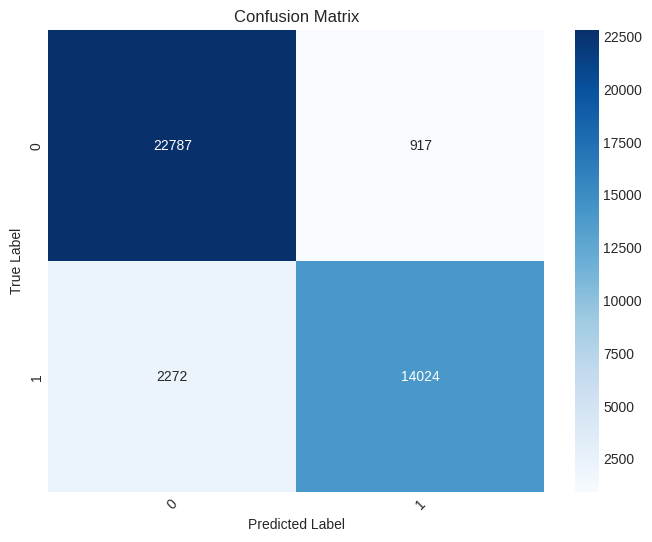

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9197
Precision: 0.9212353280975327
Recall (TPR): 0.9197
False Positive Rate (FPR): 0.09030694378912596
F1 score (F-measure): 0.9189752174496283
Specificity: 0.909693056210874
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9197,0.905148,0.965102,0.145716,0.934164,5697,597,3500,206
1,1,0.9197,0.944414,0.854284,0.034898,0.897091,3500,206,5697,597


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


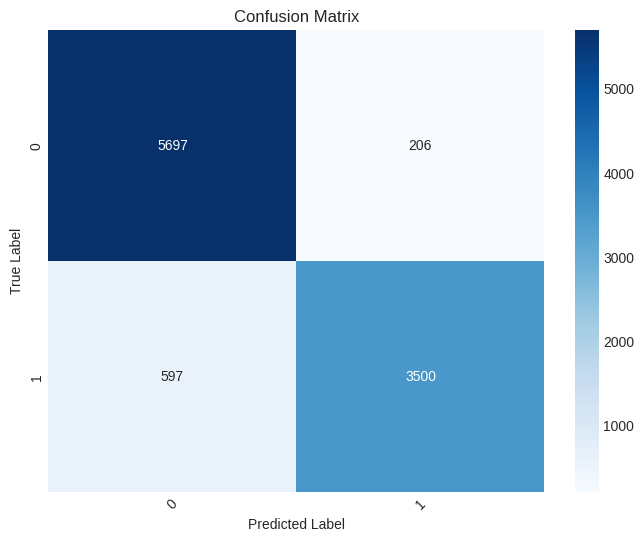

In [ ]:
print("Parameter Tuned Random Forest performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
rf_dnn_result_1 = runclassifier(model_rf,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

Random Forest performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.985425
Precision: 0.9854241784556617
Recall (TPR): 0.985425
False Positive Rate (FPR): 0.015596080592070738
F1 score (F-measure): 0.9854175511506659
Specificity: 0.9844039194079293
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.985425,0.985552,0.989917,0.021109,0.987730,23465,344,15952,239
1,1,0.985425,0.985239,0.978891,0.010083,0.982054,15952,239,23465,344


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


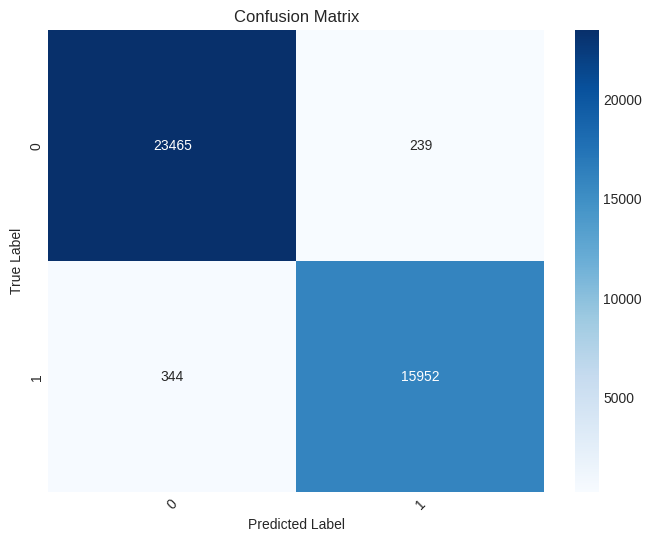

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9856
Precision: 0.9855995932544777
Recall (TPR): 0.9856
False Positive Rate (FPR): 0.015370902902596129
F1 score (F-measure): 0.9855929027938642
Specificity: 0.9846290970974039
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9856,0.985664,0.990005,0.020747,0.98783,5844,85,4012,59
1,1,0.9856,0.985507,0.979253,0.009995,0.98237,4012,59,5844,85


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


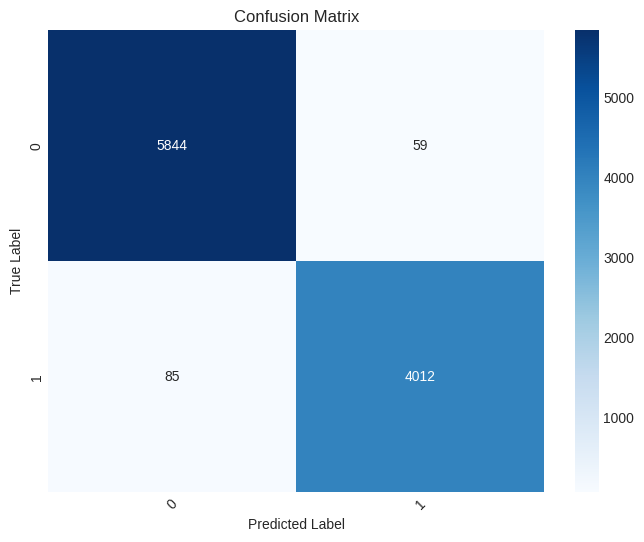

In [ ]:
print("Random Forest performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = RandomForestClassifier()
rf_dnn_result_2 = runclassifier(model,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

XGBoost

In [ ]:
def objective_xgb(trial):
    n_estimators = trial.suggest_categorical("n_estimators",[180])
    reg_alpha = trial.suggest_int('reg_alpha', 1,9)
    reg_lambda = trial.suggest_int('reg_lambda', 0,1)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.5,1, log=True)
    max_depth = trial.suggest_int('max_depth', 3, 18, 1)
    min_child_weight= trial.suggest_int('min_child_weight', 0, 10, 1)
    learning_rate = trial.suggest_float("learning_rate", 0.001, 1.0, log=True)
    subsample = trial.suggest_int("subsample", 0.7, 1.0)
    model = XGBClassifier(n_estimators=n_estimators, reg_alpha = reg_alpha, reg_lambda = reg_lambda, colsample_bytree = colsample_bytree, max_depth = max_depth, min_child_weight = min_child_weight, learning_rate=learning_rate, random_state=1)
    model.fit(X_train_selected_dnn_ga, y_train_dnn_ga)
    y_pred = model.predict(X_test_selected_dnn_ga)
    return accuracy_score(y_test_dnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_xgb = optuna.create_study(direction="maximize", sampler=sampler)
study_xgb.optimize(objective_xgb, n_trials=100)

print("Number of finished trials: ", len(study_xgb.trials))
print("Best trial:")
trial = study_xgb.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-29 09:33:13,179] A new study created in memory with name: no-name-ce844697-3b6f-4d40-9d30-670838d7bc20
[I 2024-03-29 09:33:50,560] Trial 0 finished with value: 0.9353 and parameters: {'n_estimators': 180, 'reg_alpha': 4, 'reg_lambda': 1, 'colsample_bytree': 0.5000396408623998, 'max_depth': 7, 'min_child_weight': 1, 'learning_rate': 0.0018924123965722254, 'subsample': 0}. Best is trial 0 with value: 0.9353.
[I 2024-03-29 09:34:28,347] Trial 1 finished with value: 0.9645 and parameters: {'n_estimators': 180, 'reg_alpha': 4, 'reg_lambda': 0, 'colsample_bytree': 0.7263902453474428, 'max_depth': 9, 'min_child_weight': 7, 'learning_rate': 0.004105412016858891, 'subsample': 1}. Best is trial 1 with value: 0.9645.
[I 2024-03-29 09:35:23,748] Trial 2 finished with value: 0.975 and parameters: {'n_estimators': 180, 'reg_alpha': 1, 'reg_lambda': 1, 'colsample_bytree': 0.6677152068759228, 'max_depth': 11, 'min_child_weight': 1, 'learning_rate': 0.003929203002623947, 'subsample': 1}. Bes

Number of finished trials:  100
Best trial:
  Value:  0.9861
  Params: 
    n_estimators: 180
    reg_alpha: 3
    reg_lambda: 1
    colsample_bytree: 0.6923858108871505
    max_depth: 8
    min_child_weight: 1
    learning_rate: 0.14297651227353503
    subsample: 0


In [ ]:
model_xgb = XGBClassifier(n_estimators= trial.params['n_estimators'], reg_alpha = trial.params['reg_alpha'], reg_lambda = trial.params['reg_lambda'], colsample_bytree = trial.params['colsample_bytree'], max_depth = trial.params['max_depth'], min_child_weight = trial.params['min_child_weight'], learning_rate= trial.params['learning_rate'], random_state=1)

In [ ]:
with open('xgb_dnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_xgb, f)

In [ ]:
with open('/content/drive/MyDrive/DNN_GA1/xgb_dnn_ga_results.pkl', 'rb') as f:
    model_xgb = pickle.load(f)

Parameter Tuned XGBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.984675
Precision: 0.9846712159048826
Recall (TPR): 0.984675
False Positive Rate (FPR): 0.016248062961436882
F1 score (F-measure): 0.9846691291142384
Specificity: 0.9837519370385631
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.984675,0.985452,0.988736,0.021232,0.987091,23437,346,15950,267
1,1,0.984675,0.983536,0.978768,0.011264,0.981146,15950,267,23437,346


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


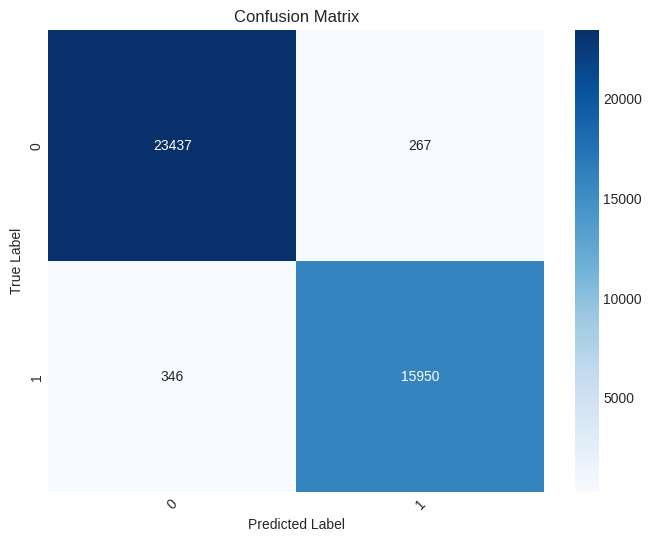

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9855
Precision: 0.9855000167805396
Recall (TPR): 0.9855
False Positive Rate (FPR): 0.015492943420047922
F1 score (F-measure): 0.9854925743100607
Specificity: 0.9845070565799521
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9855,0.985497,0.990005,0.020991,0.987746,5844,86,4011,59
1,1,0.9855,0.985504,0.979009,0.009995,0.982246,4011,59,5844,86


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


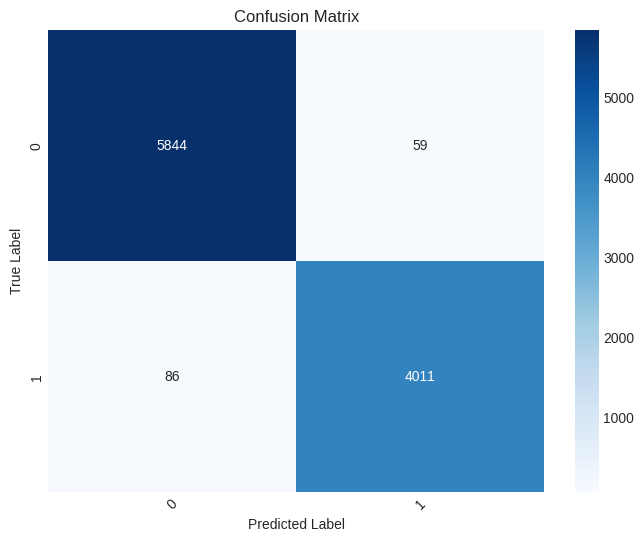

In [ ]:
print("Parameter Tuned XGBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
xgb_dnn_result_1 = runclassifier(model_xgb,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

XGBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.984225
Precision: 0.9842207786644412
Recall (TPR): 0.984225
False Positive Rate (FPR): 0.016704456833096737
F1 score (F-measure): 0.9842191114048479
Specificity: 0.9832955431669033
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.984225,0.985114,0.988314,0.021723,0.986712,23427,354,15942,277
1,1,0.984225,0.982921,0.978277,0.011686,0.980594,15942,277,23427,354


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


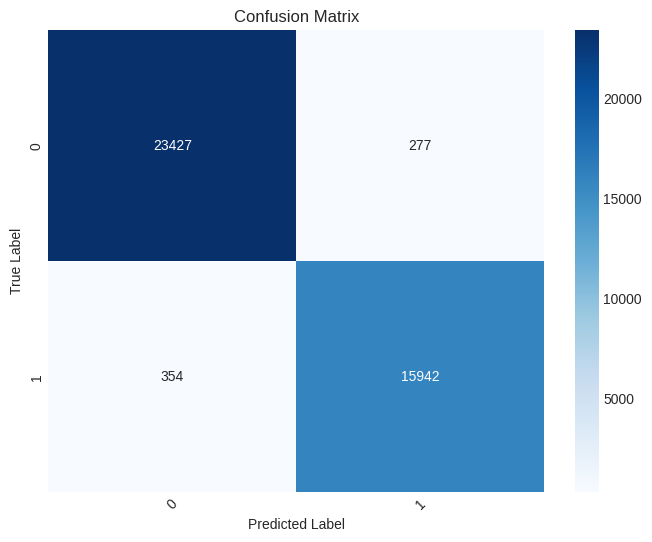

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9844
Precision: 0.9844018755045174
Recall (TPR): 0.9844
False Positive Rate (FPR): 0.016723375640299243
F1 score (F-measure): 0.9843905039026617
Specificity: 0.9832766243597008
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9844,0.984162,0.989497,0.022944,0.986822,5841,94,4003,62
1,1,0.9844,0.984748,0.977056,0.010503,0.980887,4003,62,5841,94


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


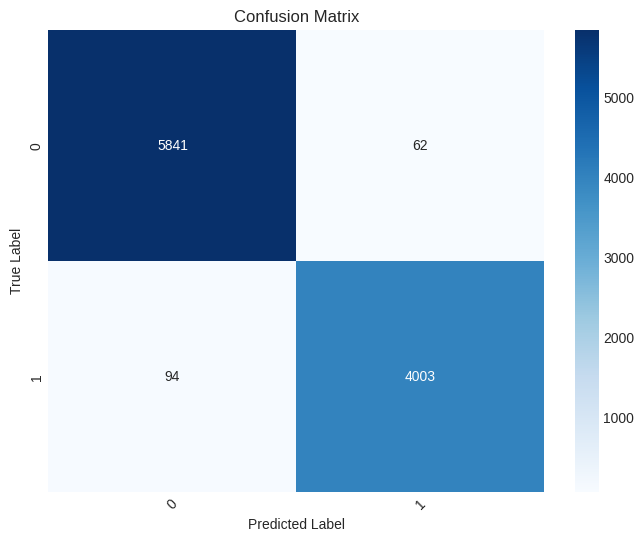

In [ ]:
print("XGBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = XGBClassifier()
xgb_dnn_result_2 = runclassifier(model,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

ExtraTrees

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

In [ ]:
def objective(trial):
    n_estimators = trial.suggest_int('n_estimators', 50, 120)
    max_depth = trial.suggest_int('max_depth', 10, 16)
    max_leaf_nodes = trial.suggest_int('max_leaf_nodes', 15, 25)
    criterion = trial.suggest_categorical('criterion', ['gini', 'entropy'])
    model = ExtraTreesClassifier(n_estimators = n_estimators,max_depth = max_depth,max_leaf_nodes = max_leaf_nodes,criterion = criterion, random_state = 1) # do not tune the seed
    model.fit(X_train_selected_dnn_ga, y_train_dnn_ga)
    y_pred = model.predict(X_test_selected_dnn_ga)
    return accuracy_score(y_test_dnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study = optuna.create_study(direction="maximize", sampler=sampler)
study.optimize(objective, n_trials=100)

print("Number of finished trials: ", len(study.trials))
print("Best trial:")
trial = study.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-29 10:14:20,571] A new study created in memory with name: no-name-e538c5ad-407c-4fe8-9700-a77e8dfff9eb
[I 2024-03-29 10:14:25,136] Trial 0 finished with value: 0.849 and parameters: {'n_estimators': 79, 'max_depth': 15, 'max_leaf_nodes': 15, 'criterion': 'gini'}. Best is trial 0 with value: 0.849.
[I 2024-03-29 10:14:27,313] Trial 1 finished with value: 0.876 and parameters: {'n_estimators': 56, 'max_depth': 11, 'max_leaf_nodes': 18, 'criterion': 'entropy'}. Best is trial 1 with value: 0.876.
[I 2024-03-29 10:14:31,698] Trial 2 finished with value: 0.8752 and parameters: {'n_estimators': 79, 'max_depth': 14, 'max_leaf_nodes': 17, 'criterion': 'gini'}. Best is trial 1 with value: 0.876.
[I 2024-03-29 10:14:35,305] Trial 3 finished with value: 0.876 and parameters: {'n_estimators': 97, 'max_depth': 12, 'max_leaf_nodes': 21, 'criterion': 'entropy'}. Best is trial 1 with value: 0.876.
[I 2024-03-29 10:14:39,079] Trial 4 finished with value: 0.8673 and parameters: {'n_estimators'

Number of finished trials:  100
Best trial:
  Value:  0.8893
  Params: 
    n_estimators: 84
    max_depth: 12
    max_leaf_nodes: 25
    criterion: gini


In [ ]:
model_et = ExtraTreesClassifier(n_estimators = trial.params['n_estimators'],max_depth = trial.params['max_depth'],max_leaf_nodes = trial.params['max_leaf_nodes'],criterion = trial.params['criterion'], random_state = 1)

In [ ]:
with open('et_dnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_et, f)

In [ ]:
with open('/content/drive/MyDrive/DNN_GA1/et_dnn_ga_results.pkl', 'rb') as f:
    model_et = pickle.load(f)

Parameter Tuned ExtraTrees performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.88615
Precision: 0.8869071564796918
Recall (TPR): 0.88615
False Positive Rate (FPR): 0.12537297260220182
F1 score (F-measure): 0.8851018315100235
Specificity: 0.8746270273977982
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.88615,0.878998,0.936846,0.187592,0.907000,22207,3057,13239,1497
1,1,0.88615,0.898412,0.812408,0.063154,0.853248,13239,1497,22207,3057


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


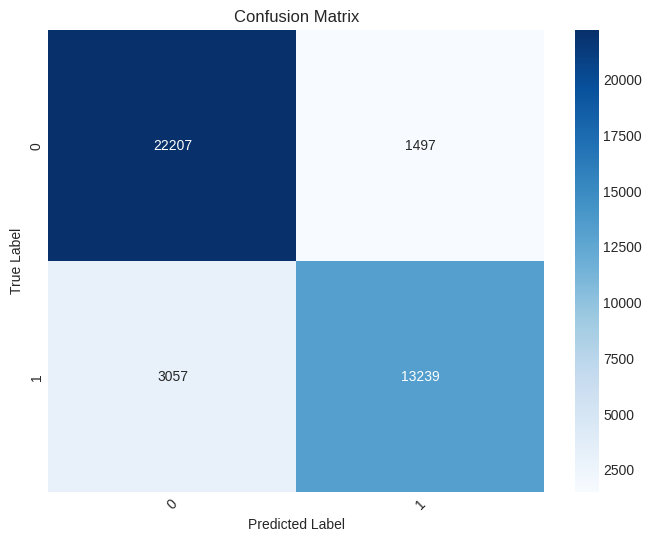

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8893
Precision: 0.8902848346750312
Recall (TPR): 0.8893
False Positive Rate (FPR): 0.12195593880417488
F1 score (F-measure): 0.8882639634314095
Specificity: 0.8780440611958251
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8893,0.880273,0.940369,0.184281,0.909329,5551,755,3342,352
1,1,0.8893,0.904710,0.815719,0.059631,0.857913,3342,352,5551,755


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


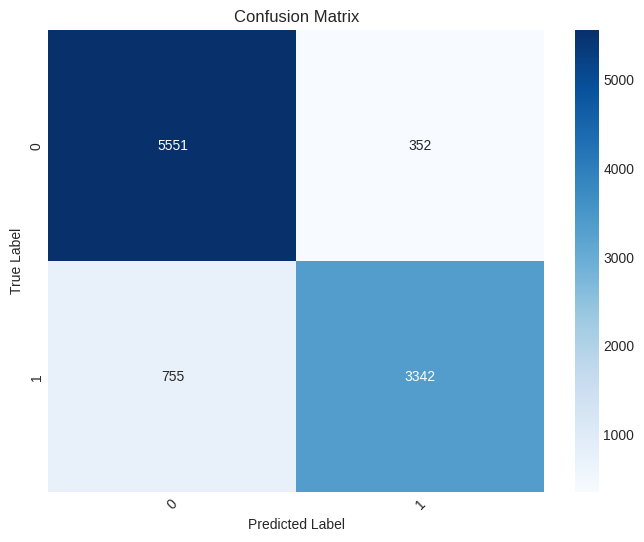

In [ ]:
print("Parameter Tuned ExtraTrees performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
et_dnn_result_1 = runclassifier(model_et,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

Extra Trees performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9855
Precision: 0.985498662100079
Recall (TPR): 0.9855
False Positive Rate (FPR): 0.015494444574229327
F1 score (F-measure): 0.9854929474029066
Specificity: 0.9845055554257707
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9855,0.985717,0.989875,0.020864,0.987792,23464,340,15956,240
1,1,0.9855,0.985182,0.979136,0.010125,0.982149,15956,240,23464,340


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


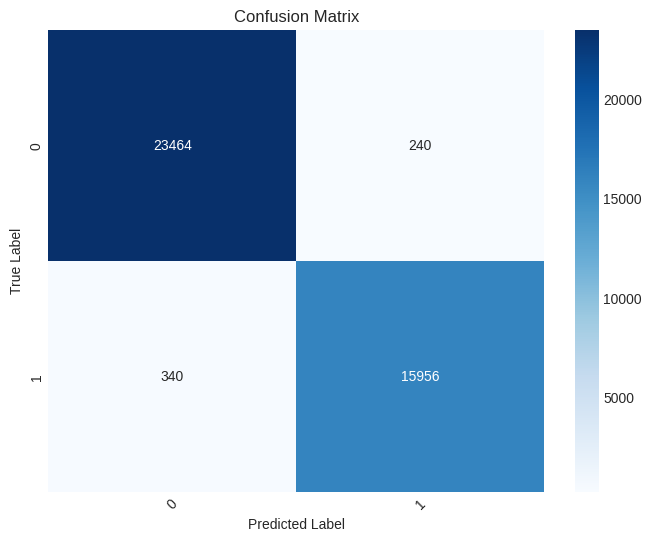

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.984
Precision: 0.9839989604379255
Recall (TPR): 0.984
False Positive Rate (FPR): 0.017062186414481872
F1 score (F-measure): 0.9839914977003913
Specificity: 0.9829378135855181
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.984,0.984151,0.988819,0.022944,0.986480,5837,94,4003,66
1,1,0.984,0.983780,0.977056,0.011181,0.980407,4003,66,5837,94


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


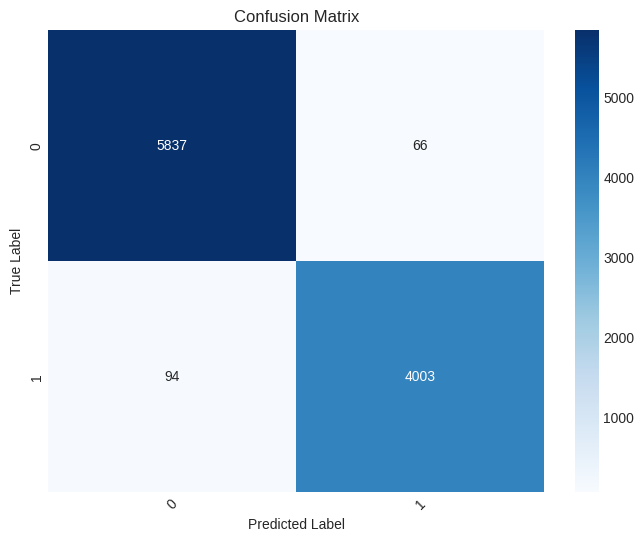

In [ ]:
print("Extra Trees performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = ExtraTreesClassifier()
et_dnn_result_2 = runclassifier(model,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

AdaBoost Classifier

In [ ]:
def objective_adb(trial):
    n_estimators = trial.suggest_int("n_estimators", 50, 500)
    learning_rate = trial.suggest_float("learning_rate", 0.001, 1.0, log=True)
    model = AdaBoostClassifier(n_estimators=n_estimators, learning_rate=learning_rate, random_state=1)
    model.fit(X_train_selected_dnn_ga, y_train_dnn_ga)
    y_pred = model.predict(X_test_selected_dnn_ga)
    return accuracy_score(y_test_dnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_adb = optuna.create_study(direction="maximize", sampler=sampler)
study_adb.optimize(objective_adb, n_trials=100)

print("Number of finished trials: ", len(study_adb.trials))
print("Best trial:")
trial_adb = study_adb.best_trial
print("  Value: ", trial_adb.value)
print("  Params: ")
for key, value in trial_adb.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-29 10:49:11,262] A new study created in memory with name: no-name-4d3394ee-c82b-4285-a1b1-edbacec25d9c
[I 2024-03-29 10:50:03,504] Trial 0 finished with value: 0.9036 and parameters: {'n_estimators': 238, 'learning_rate': 0.14486833887239342}. Best is trial 0 with value: 0.9036.
[I 2024-03-29 10:50:13,441] Trial 1 finished with value: 0.8434 and parameters: {'n_estimators': 50, 'learning_rate': 0.008072307884499755}. Best is trial 0 with value: 0.9036.
[I 2024-03-29 10:50:37,024] Trial 2 finished with value: 0.8402 and parameters: {'n_estimators': 116, 'learning_rate': 0.0018924123965722254}. Best is trial 0 with value: 0.9036.
[I 2024-03-29 10:51:00,824] Trial 3 finished with value: 0.8414 and parameters: {'n_estimators': 134, 'learning_rate': 0.010881335003635882}. Best is trial 0 with value: 0.9036.
[I 2024-03-29 10:51:40,894] Trial 4 finished with value: 0.874 and parameters: {'n_estimators': 228, 'learning_rate': 0.04134759007834719}. Best is trial 0 with value: 0.9036.

Number of finished trials:  100
Best trial:
  Value:  0.9705
  Params: 
    n_estimators: 491
    learning_rate: 0.8975978610578527


In [ ]:
model_adb = AdaBoostClassifier(n_estimators=trial_adb.params["n_estimators"], learning_rate=trial_adb.params["learning_rate"], random_state=1)

In [ ]:
with open('adb_dnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_adb, f)

In [ ]:
with open('/content/drive/MyDrive/DNN_GA1/adb_dnn_ga_results.pkl', 'rb') as f:
    model_adb = pickle.load(f)

Parameter tuned AdaBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8899
Precision: 0.8896284625579854
Recall (TPR): 0.8899
False Positive Rate (FPR): 0.11612000468550843
F1 score (F-measure): 0.8896528690109706
Specificity: 0.8838799953144916
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8899,0.899685,0.916385,0.148625,0.907959,21722,2422,13874,1982
1,1,0.8899,0.875000,0.851375,0.083615,0.863026,13874,1982,21722,2422


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


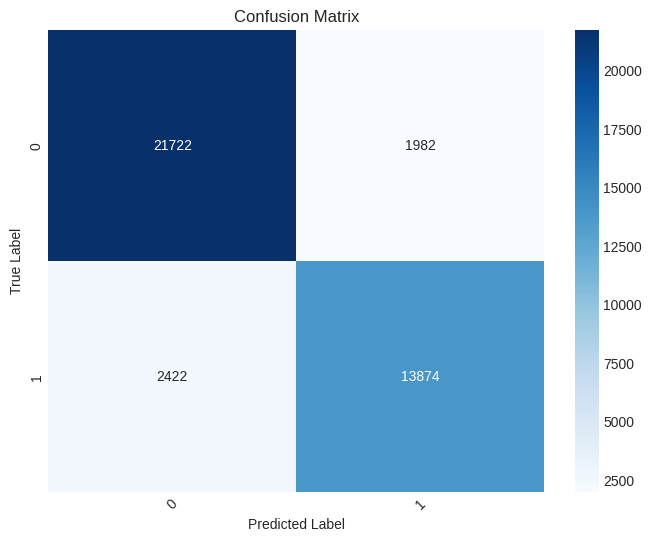

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8883
Precision: 0.8880263461805853
Recall (TPR): 0.8883
False Positive Rate (FPR): 0.11787437298402104
F1 score (F-measure): 0.8880103343098115
Specificity: 0.882125627015979
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8883,0.896718,0.916314,0.152062,0.90641,5409,623,3474,494
1,1,0.8883,0.875504,0.847938,0.083686,0.86150,3474,494,5409,623


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


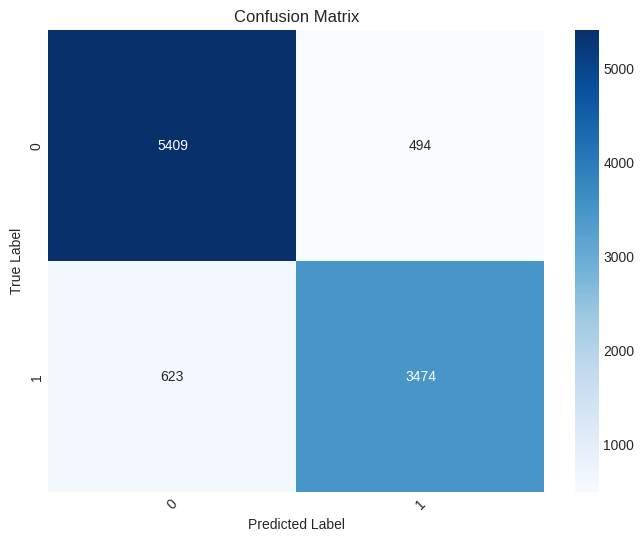

In [ ]:
print("Parameter tuned AdaBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
adb_dnn_result_1 = runclassifier(model_adb,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

AdaBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.908925
Precision: 0.9090735310895838
Recall (TPR): 0.908925
False Positive Rate (FPR): 0.09894596149101886
F1 score (F-measure): 0.908442875770853
Specificity: 0.9010540385089811
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.908925,0.906570,0.943554,0.141446,0.924693,22366,2305,13991,1338
1,1,0.908925,0.912714,0.858554,0.056446,0.884806,13991,1338,22366,2305


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


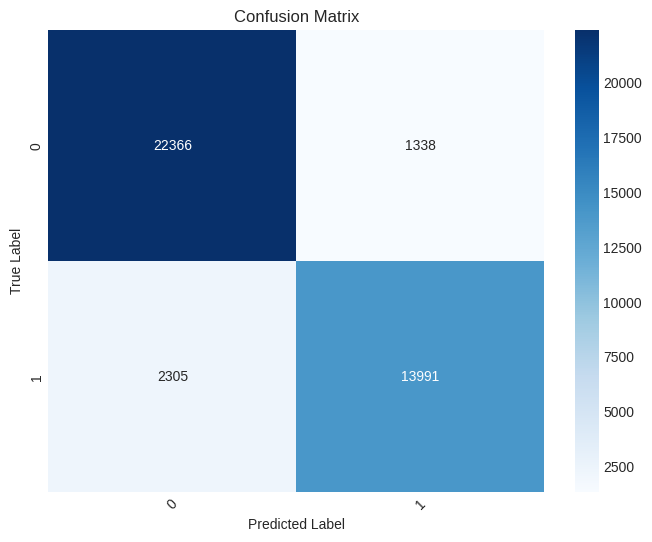

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9033
Precision: 0.9033092484868867
Recall (TPR): 0.9033
False Positive Rate (FPR): 0.10404883423498879
F1 score (F-measure): 0.9028528226070295
Specificity: 0.8959511657650112
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9033,0.903136,0.936642,0.144740,0.919584,5529,593,3504,374
1,1,0.9033,0.903559,0.855260,0.063358,0.878746,3504,374,5529,593


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


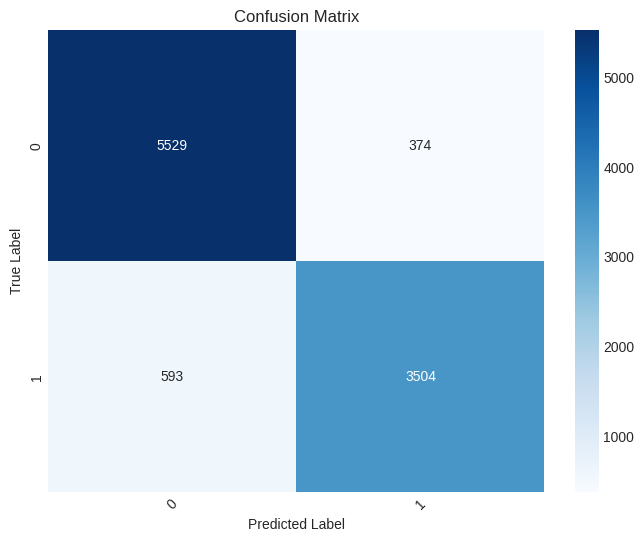

In [ ]:
print("AdaBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = AdaBoostClassifier()
adb_dnn_result_2 = runclassifier(model,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

Gradient Boosting Classifier

In [ ]:
def objective_gradient(trial):
    n_estimators = trial.suggest_int("n_estimators", 50, 500)
    learning_rate = trial.suggest_float("learning_rate", 0.001, 1.0, log=True)
    subsample = trial.suggest_float("subsample", 0.5, 1.0, log=True)
    max_depth = trial.suggest_int("max_depth", 1, 10)
    model = GradientBoostingClassifier(learning_rate=learning_rate, n_estimators=n_estimators, subsample=subsample, max_depth=max_depth, random_state=1)
    model.fit(X_train_selected_dnn_ga, y_train_dnn_ga)
    y_pred = model.predict(X_test_selected_dnn_ga)
    return accuracy_score(y_test_dnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_gradient = optuna.create_study(direction="maximize", sampler=sampler)
study_gradient.optimize(objective_gradient, n_trials=100)

print("Number of finished trials: ", len(study_gradient.trials))
print("Best trial:")
trial_gradient = study_gradient.best_trial
print("  Value: ", trial_gradient.value)
print("  Params: ")
for key, value in trial_gradient.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-30 08:25:55,340] A new study created in memory with name: no-name-267ce46e-e0a3-4f64-846a-970a9018abb2
[I 2024-03-30 08:27:10,365] Trial 0 finished with value: 0.9758 and parameters: {'n_estimators': 238, 'learning_rate': 0.14486833887239342, 'subsample': 0.5000396408623998, 'max_depth': 4}. Best is trial 0 with value: 0.9758.
[I 2024-03-30 08:27:50,602] Trial 1 finished with value: 0.8106 and parameters: {'n_estimators': 116, 'learning_rate': 0.0018924123965722254, 'subsample': 0.5689052151487055, 'max_depth': 4}. Best is trial 0 with value: 0.9758.
[I 2024-03-30 08:30:19,229] Trial 2 finished with value: 0.9826 and parameters: {'n_estimators': 228, 'learning_rate': 0.04134759007834719, 'subsample': 0.6685903857355362, 'max_depth': 7}. Best is trial 2 with value: 0.9826.
[I 2024-03-30 08:31:38,524] Trial 3 finished with value: 0.9807 and parameters: {'n_estimators': 142, 'learning_rate': 0.43087600478391286, 'subsample': 0.5095824839077406, 'max_depth': 7}. Best is trial 2 

In [ ]:
# Resuming a previously defined study
from optuna.trial import FrozenTrial
# Load the study state from the CSV file
study_new_df = pd.read_csv('/content/gb_study_state.csv')

# Creating a new study with the same parameters as the original study
sampler = optuna.samplers.TPESampler(seed=1)
study_gradient = optuna.create_study(direction="maximize", sampler=sampler)

# Restore the trials from the loaded study state
for index, row in study_new_df.iterrows():
    trial = FrozenTrial(
        number=row['number'],value=row['value'],
        state=row['state'], datetime_start=row['datetime_start'],
        datetime_complete=row['datetime_complete'],
        params={
            "learning_rate": row['params_learning_rate'],
            "max_depth": row['params_max_depth'],
            "n_estimators": row['params_n_estimators'],
            "subsample": row['params_subsample']
        },
        distributions={},
        user_attrs={},
        system_attrs={},
        intermediate_values={},
        trial_id=0
    )
    study_gradient._storage.create_new_trial(study_gradient._study_id, template_trial=trial)

# Continue the optimization
study_gradient.optimize(objective_gradient, n_trials=18)

print("Number of finished trials: ", len(study_gradient.trials))
print("Best trial:")
trial_gradient = study_gradient.best_trial
print("  Value: ", trial_gradient.value)
print("  Params: ")
for key, value in trial_gradient.params.items():
    print("    {}: {}".format(key, value))


[I 2024-03-31 12:26:25,191] A new study created in memory with name: no-name-ba91953f-be7f-445a-aa87-708ab79fb036
[I 2024-03-31 12:28:06,475] Trial 82 finished with value: 0.9758 and parameters: {'n_estimators': 238, 'learning_rate': 0.14486833887239342, 'subsample': 0.5000396408623998, 'max_depth': 4}. Best is trial 82 with value: 0.9758.
[I 2024-03-31 12:28:46,864] Trial 83 finished with value: 0.8106 and parameters: {'n_estimators': 116, 'learning_rate': 0.0018924123965722254, 'subsample': 0.5689052151487055, 'max_depth': 4}. Best is trial 82 with value: 0.9758.
[I 2024-03-31 12:31:16,120] Trial 84 finished with value: 0.9826 and parameters: {'n_estimators': 228, 'learning_rate': 0.04134759007834719, 'subsample': 0.6685903857355362, 'max_depth': 7}. Best is trial 84 with value: 0.9826.
[I 2024-03-31 12:32:30,210] Trial 85 finished with value: 0.9807 and parameters: {'n_estimators': 142, 'learning_rate': 0.43087600478391286, 'subsample': 0.5095824839077406, 'max_depth': 7}. Best is t

Number of finished trials:  100
Best trial:
  Value:  0.9852
  Params: 
    n_estimators: 287
    learning_rate: 0.10795934586984313
    subsample: 0.7920558202660103
    max_depth: 10


In [ ]:
model_gradient =  GradientBoostingClassifier(n_estimators=trial_gradient.params["n_estimators"], learning_rate=trial_gradient.params["learning_rate"], subsample = trial_gradient.params['subsample'], max_depth = trial_gradient.params['max_depth'],random_state=1)

In [ ]:
filename = "dnn_ga_gradboost_model.pkl"
pickle.dump(model_gradient, open(filename, "wb"))

In [ ]:
with open('/content/drive/MyDrive/DNN_GA1/dnn_ga_gradboost_model.pkl', 'rb') as f:
    model_gradient = pickle.load(f)

Parameter Tuned GradientBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.983875
Precision: 0.9838705960125465
Recall (TPR): 0.983875
False Positive Rate (FPR): 0.017076476759430803
F1 score (F-measure): 0.9838688226405933
Specificity: 0.9829235232405692
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.983875,0.984779,0.988061,0.022214,0.986417,23421,362,15934,283
1,1,0.983875,0.982549,0.977786,0.011939,0.980162,15934,283,23421,362


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


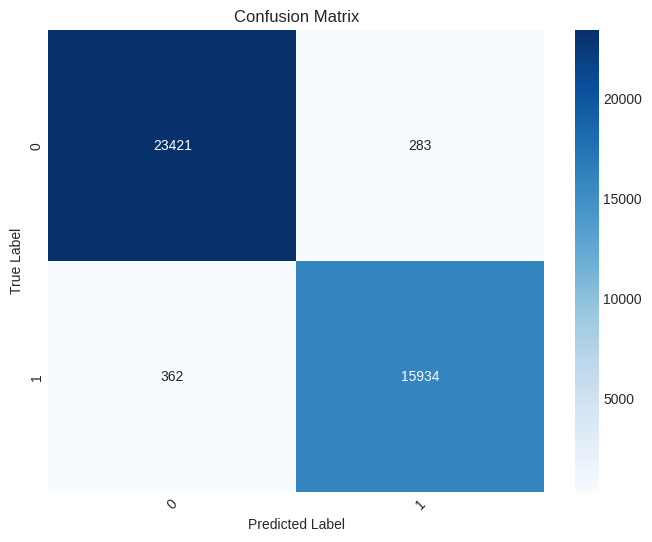

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9844
Precision: 0.984400553513082
Recall (TPR): 0.9844
False Positive Rate (FPR): 0.016686037816393107
F1 score (F-measure): 0.9843911077722505
Specificity: 0.9833139621836069
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9844,0.984325,0.989327,0.022700,0.986820,5840,93,4004,63
1,1,0.9844,0.984509,0.977300,0.010673,0.980892,4004,63,5840,93


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


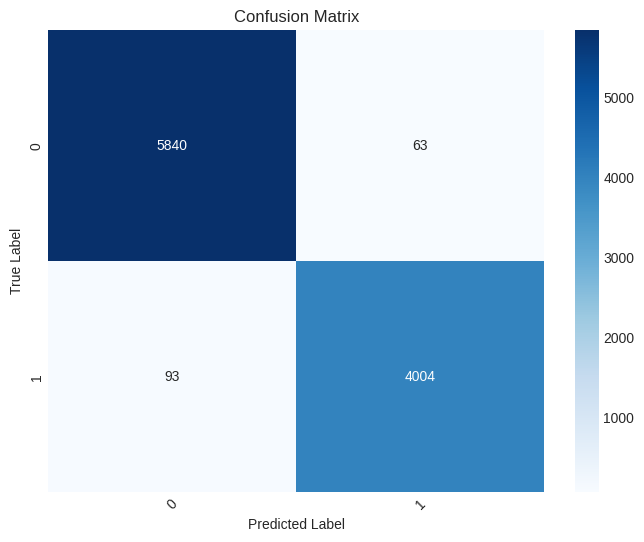

In [ ]:
print("Parameter Tuned GradientBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
gradboost_dnn_result_1 = runclassifier(model_gradient,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

GradientBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9532
Precision: 0.953476943520709
Recall (TPR): 0.9532
False Positive Rate (FPR): 0.05186626303032771
F1 score (F-measure): 0.9530241671062497
Specificity: 0.9481337369696723
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9532,0.947121,0.975489,0.079222,0.961096,23123,1291,15005,581
1,1,0.9532,0.962723,0.920778,0.024511,0.941283,15005,581,23123,1291


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


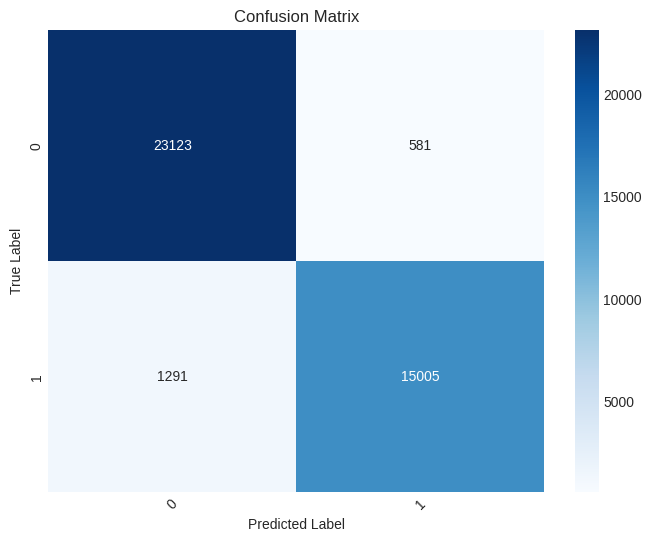

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9464
Precision: 0.9468491082832888
Recall (TPR): 0.9464
False Positive Rate (FPR): 0.05947700335308537
F1 score (F-measure): 0.9461533973844355
Specificity: 0.9405229966469146
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9464,0.938409,0.973065,0.092019,0.955422,5744,377,3720,159
1,1,0.9464,0.959010,0.907981,0.026935,0.932798,3720,159,5744,377


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


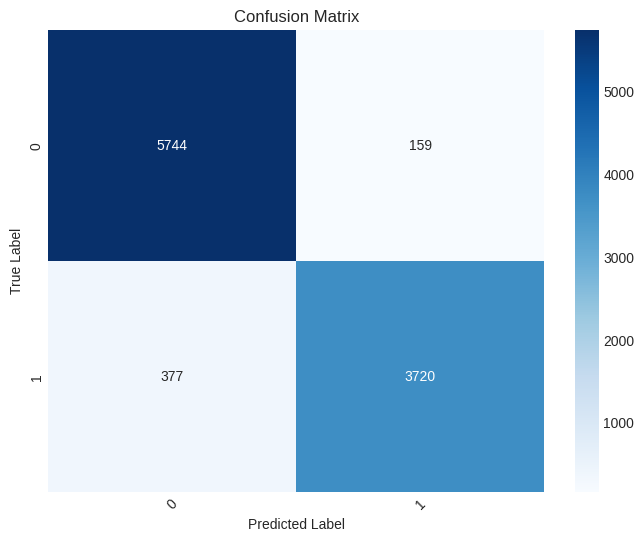

In [ ]:
print("GradientBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = GradientBoostingClassifier()
gradboost_dnn_result_2 = runclassifier(model,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

In [ ]:
datasets_dnn = [
    (gb_dnn_result_1,"Tuned Dataset"),
    (lr_dnn_result_1,"Tuned Dataset"),
   # (svc_dnn_result_1,"Tuned Dataset"),
    (rf_dnn_result_1,"Tuned Dataset"),
    (dt_dnn_result_1,"Tuned Dataset"),
    (et_dnn_result_1,"Tuned Dataset"),
    (xgb_dnn_result_1,"Tuned Dataset"),
    (gradboost_dnn_result_1,"Tuned Dataset"),
    (gb_dnn_result_2,"Original Dataset"),
    (lr_dnn_result_2,"Original Dataset"),
    (svc_dnn_result_2,"Original Dataset"),
    (rf_dnn_result_2,"Original Dataset"),
    (dt_dnn_result_2,"Original Dataset"),
    (et_dnn_result_2,"Original Dataset"),
    (xgb_dnn_result_2,"Original Dataset"),
    (gradboost_dnn_result_2,"Original Dataset"),
]

In [ ]:
import pickle
with open('datasets_dnn_new.pkl', 'wb') as f:
    pickle.dump(datasets_dnn, f)

## CNN

### Feature Extraction Process

Importing Required Libraries

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

In [ ]:
pip install keras-tuner

In [ ]:
import kerastuner
from kerastuner.tuners import GridSearch,RandomSearch
from kerastuner.engine.hyperparameters import HyperParameters
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import SGD, Adam
from typing import Tuple, Union

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.optimizers import SGD, Adam, RMSprop
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
# Creating copies of our dataframes
X_train_cnn = X_train_new_df.copy()
X_test_cnn = X_test_new_df.copy()
y_train_cnn = y_train_new_df.copy()
y_test_cnn = y_test_new_df.copy()

In [ ]:
# converting categorical labels into a one-hot encoded format
y_train_keras_cnn = keras.utils.to_categorical(y_train_cnn, 2)
y_test_keras_cnn = keras.utils.to_categorical(y_test_cnn, 2)

In [ ]:
# creating a validation set
X_train_cv_cnn, X_val_cv_cnn, y_train_cv_cnn, y_val_cv_cnn = train_test_split(X_train_cnn, y_train_keras_cnn, test_size=0.2, random_state=42)

In [ ]:
# Reshape the data to have a spatial dimension
X_train_reshaped_cnn = np.expand_dims(X_train_cnn, axis=-1)
# Convert labels to one-hot encoding
num_classes = 2
y_train_one_hot_cnn = tf.keras.utils.to_categorical(y_train_cnn, num_classes=num_classes)

Building the neural network

In [ ]:
# Set a fixed random seed
import random
np.random.seed(42)
tf.random.set_seed(42)
random.seed(42)

def CNN_builder_Tuning(hp: HyperParameters):
    model = Sequential()

    # Add 1D convolutional layers with tunable hyperparameters
    model.add(Conv1D(filters=hp.Int('filters_1', min_value=32, max_value=128, step=32), kernel_size=hp.Int('kernel_size_1', min_value=2, max_value=5),
                     activation='relu', input_shape=(X_train_cnn.shape[1], 1),kernel_initializer=tf.keras.initializers.GlorotUniform(seed=42)))  # Set the custom initializer
    model.add(MaxPooling1D(pool_size=2))
    model.add(Dropout(rate=hp.Float('dropout_conv_1', min_value=0.0, max_value=0.5, step=0.1)))
    model.add(Conv1D(filters=hp.Int('filters_2', min_value=32, max_value=128, step=32),kernel_size=hp.Int('kernel_size_2', min_value=2, max_value=5),
                     activation='relu',kernel_initializer=tf.keras.initializers.GlorotUniform(seed=42)))  # Set the custom initializer
    model.add(MaxPooling1D(pool_size=2))
    model.add(Dropout(rate=hp.Float('dropout_conv_2', min_value=0.0, max_value=0.5, step=0.1)))
    model.add(Flatten())
    # Add dense layers with tunable hyperparameters
    model.add(Dense(units=hp.Int('dense_units', min_value=32, max_value=256, step=32), activation='relu'))
    model.add(Dropout(rate=hp.Float('dropout_dense', min_value=0.0, max_value=0.5, step=0.1)))
    # Output layer
    model.add(Dense(num_classes, activation='sigmoid'))

    # Compile the model with tunable hyperparameters
    optimizer_choice = hp.Choice('optimizer', values=['SGD', 'Adam', 'RMSprop'])
    learning_rate = hp.Float('learning_rate', min_value=1e-4, max_value=1e-1, sampling='log')

    if optimizer_choice == 'SGD':
        optimizer = SGD(learning_rate=learning_rate)
    elif optimizer_choice == 'Adam':
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer_choice == 'RMSprop':
        optimizer = RMSprop(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Create a GridSearch tuner for CNN
tuner_cnn_01 = GridSearch(
    CNN_builder_Tuning,
    objective='val_accuracy',
    max_trials=20,  # Number of hyperparameter combinations to try
    directory='/content/drive/MyDrive/ML_Project/',  # Directory to save the tuning results
    project_name='heart_disease_cnn_grid_new',
    seed=42
)

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
# Perform the hyperparameter search
tuner_cnn_01.search(x=X_train_reshaped_cnn, y=y_train_one_hot_cnn, epochs=50, validation_split=0.2, callbacks=[early_stopping])

# Get the best hyperparameters
best_hps_cnn_01 = tuner_cnn_01.oracle.get_best_trials(num_trials=1)[0].hyperparameters
print("Best Hyperparameters:", best_hps_cnn_01.get_config()['values'])


Reloading Tuner from /content/drive/MyDrive/ML_Project/heart_disease_cnn_grid_new/tuner0.json
Best Hyperparameters: {'filters_1': 96, 'kernel_size_1': 2, 'dropout_conv_1': 0.2, 'filters_2': 64, 'kernel_size_2': 5, 'dropout_conv_2': 0.1, 'dense_units': 160, 'dropout_dense': 0.0, 'optimizer': 'Adam', 'learning_rate': 0.0005377164071193433}


In [ ]:
# the hyperparameter combinations tested, and the results for each trial:
tuner_cnn_01.results_summary()

Results summary
Results in /content/drive/MyDrive/ML_Project/heart_disease_cnn_grid_new
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 00 summary
Hyperparameters:
filters_1: 96
kernel_size_1: 2
dropout_conv_1: 0.2
filters_2: 64
kernel_size_2: 5
dropout_conv_2: 0.1
dense_units: 160
dropout_dense: 0.0
optimizer: Adam
learning_rate: 0.0005377164071193433
Score: 0.9736613035202026

Trial 07 summary
Hyperparameters:
filters_1: 64
kernel_size_1: 2
dropout_conv_1: 0.1
filters_2: 128
kernel_size_2: 5
dropout_conv_2: 0.1
dense_units: 192
dropout_dense: 0.4
optimizer: Adam
learning_rate: 0.00018276981009879252
Score: 0.9716734886169434

Trial 08 summary
Hyperparameters:
filters_1: 96
kernel_size_1: 2
dropout_conv_1: 0.4
filters_2: 128
kernel_size_2: 4
dropout_conv_2: 0.0
dense_units: 256
dropout_dense: 0.2
optimizer: Adam
learning_rate: 0.0008837014475882627
Score: 0.969809889793396

Trial 02 summary
Hyperparameters:
filters_1: 128
kernel_size_1: 3
dropout_conv_1: 

In [ ]:
# Build the model with the optimal hyperparameters and train it on the data for 50 epochs
model_02 = tuner_cnn_01.hypermodel.build(best_hps_cnn_01)
history_02 = model_02.fit(X_train_reshaped_cnn, y_train_one_hot_cnn, epochs=50, validation_data=(X_val_cv_cnn, y_val_cv_cnn))

val_acc_per_epoch = history_02.history['val_accuracy']
best_epoch = val_acc_per_epoch.index(max(val_acc_per_epoch)) + 1
print('Best epoch: %d' % (best_epoch,))

Epoch 1/50
1250/1250 [==============================] - 9s 6ms/step - loss: 0.3561 - accuracy: 0.8526 - val_loss: 0.2643 - val_accuracy: 0.9003
Epoch 2/50
1250/1250 [==============================] - 6s 5ms/step - loss: 0.2735 - accuracy: 0.8885 - val_loss: 0.2222 - val_accuracy: 0.9078
Epoch 3/50
1250/1250 [==============================] - 9s 7ms/step - loss: 0.2481 - accuracy: 0.8999 - val_loss: 0.2008 - val_accuracy: 0.9158
Epoch 4/50
1250/1250 [==============================] - 6s 5ms/step - loss: 0.2296 - accuracy: 0.9087 - val_loss: 0.1925 - val_accuracy: 0.9266
Epoch 5/50
1250/1250 [==============================] - 8s 6ms/step - loss: 0.2120 - accuracy: 0.9163 - val_loss: 0.1656 - val_accuracy: 0.9390
Epoch 6/50
1250/1250 [==============================] - 6s 5ms/step - loss: 0.1964 - accuracy: 0.9239 - val_loss: 0.1437 - val_accuracy: 0.9446
Epoch 7/50
1250/1250 [==============================] - 8s 6ms/step - loss: 0.1859 - accuracy: 0.9305 - val_loss: 0.1390 - val_accuracy:

In [ ]:
# Build the model with the optimal hyperparameters and train it on the data for 50 epochs
model_02 = tuner.hypermodel.build(best_hps)
history_02 = model_02.fit(X_train_cv_dnn, y_train_cv_dnn, epochs=50, validation_data=(X_val_cv_dnn, y_val_cv_dnn))

val_acc_per_epoch = history_02.history['val_accuracy']
best_epoch = val_acc_per_epoch.index(max(val_acc_per_epoch)) + 1
print('Best epoch: %d' % (best_epoch,))

Epoch 1/50
1000/1000 [==============================] - 11s 8ms/step - loss: 0.5748 - accuracy: 0.7828 - val_loss: 0.4650 - val_accuracy: 0.8413
Epoch 2/50
1000/1000 [==============================] - 5s 5ms/step - loss: 0.4145 - accuracy: 0.8467 - val_loss: 0.3845 - val_accuracy: 0.8501
Epoch 3/50
1000/1000 [==============================] - 6s 6ms/step - loss: 0.3738 - accuracy: 0.8515 - val_loss: 0.3631 - val_accuracy: 0.8497
Epoch 4/50
1000/1000 [==============================] - 3s 3ms/step - loss: 0.3587 - accuracy: 0.8540 - val_loss: 0.3506 - val_accuracy: 0.8554
Epoch 5/50
1000/1000 [==============================] - 3s 3ms/step - loss: 0.3478 - accuracy: 0.8562 - val_loss: 0.3408 - val_accuracy: 0.8562
Epoch 6/50
1000/1000 [==============================] - 5s 5ms/step - loss: 0.3388 - accuracy: 0.8570 - val_loss: 0.3324 - val_accuracy: 0.8568
Epoch 7/50
1000/1000 [==============================] - 3s 3ms/step - loss: 0.3305 - accuracy: 0.8601 - val_loss: 0.3240 - val_accuracy

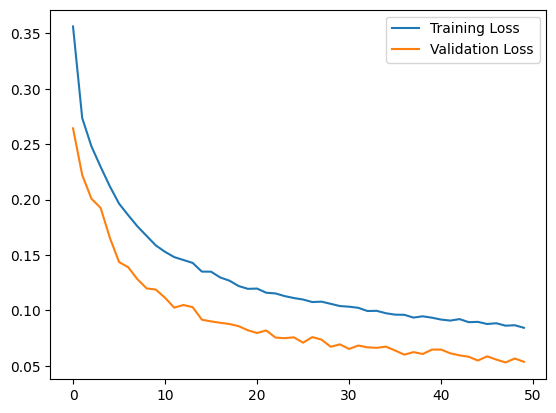

In [ ]:
plt.plot(history_02.history['loss'], label='Training Loss')
plt.plot(history_02.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

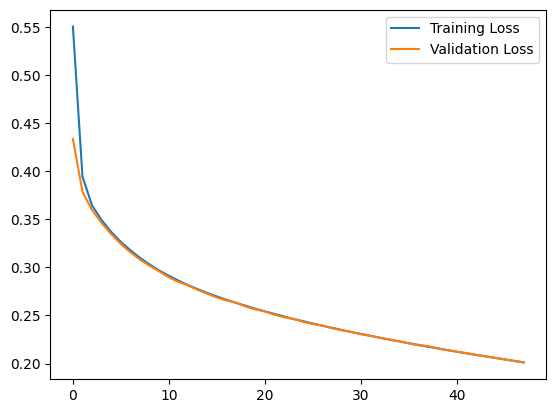

In [ ]:
plt.plot(history_hypermodel.history['loss'], label='Training Loss')
plt.plot(history_hypermodel.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

In [ ]:
hypermodel = tuner_cnn_01.hypermodel.build(best_hps_cnn_01)

# Retrain the model
history_hypermodel = hypermodel.fit(X_train_reshaped_cnn, y_train_one_hot_cnn, epochs=best_epoch, validation_data=(X_val_cv_cnn, y_val_cv_cnn))

Epoch 1/48
1250/1250 [==============================] - 15s 11ms/step - loss: 0.3526 - accuracy: 0.8554 - val_loss: 0.2648 - val_accuracy: 0.8972
Epoch 2/48
1250/1250 [==============================] - 14s 11ms/step - loss: 0.2732 - accuracy: 0.8895 - val_loss: 0.2192 - val_accuracy: 0.9075
Epoch 3/48
1250/1250 [==============================] - 12s 10ms/step - loss: 0.2450 - accuracy: 0.9018 - val_loss: 0.1909 - val_accuracy: 0.9233
Epoch 4/48
1250/1250 [==============================] - 11s 8ms/step - loss: 0.2222 - accuracy: 0.9120 - val_loss: 0.1801 - val_accuracy: 0.9281
Epoch 5/48
1250/1250 [==============================] - 7s 6ms/step - loss: 0.2048 - accuracy: 0.9202 - val_loss: 0.1559 - val_accuracy: 0.9384
Epoch 6/48
1250/1250 [==============================] - 6s 5ms/step - loss: 0.1914 - accuracy: 0.9265 - val_loss: 0.1418 - val_accuracy: 0.9455
Epoch 7/48
1250/1250 [==============================] - 7s 6ms/step - loss: 0.1818 - accuracy: 0.9313 - val_loss: 0.1330 - val_ac

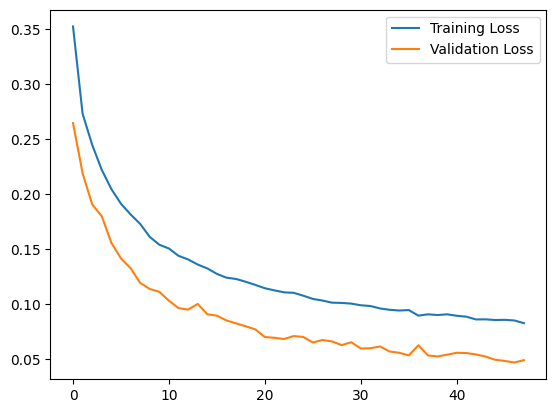

In [ ]:
plt.plot(history_hypermodel.history['loss'], label='Training Loss')
plt.plot(history_hypermodel.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

In [ ]:
eval_result = hypermodel.evaluate(X_test_cnn, y_test_keras_cnn)
print("[test loss, test accuracy]:", eval_result)

313/313 [==============================] - 1s 2ms/step - loss: 0.0711 - accuracy: 0.9773
[test loss, test accuracy]: [0.07113722711801529, 0.9772999882698059]


Extracting the Features

In [ ]:
model_cnn = CNN_builder_Tuning(best_hps_cnn_01)

In [ ]:
model_cnn.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 12, 96)            288       
                                                                 
 max_pooling1d (MaxPooling1  (None, 6, 96)             0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 6, 96)             0         
                                                                 
 conv1d_1 (Conv1D)           (None, 2, 64)             30784     
                                                                 
 max_pooling1d_1 (MaxPoolin  (None, 1, 64)             0         
 g1D)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 1, 64)            

In [ ]:
from keras.models import Model
intermediate_layer_model = Model(inputs=model_cnn.input, outputs=model_cnn.layers[-2].output)
model_cnn.trainable = False # freezes the weights of the pre-trained model, ensuring that they are not modified during feature extraction.

# Predict the features for the combined dataset X
X_combined_cnn = np.concatenate([X_train_cnn, X_test_cnn])
X_extracted_cnn = intermediate_layer_model.predict(X_combined_cnn)

1563/1563 [==============================] - 6s 3ms/step


In [ ]:
X_extracted_cnn_df= pd.DataFrame(X_extracted_cnn)

In [ ]:
X_extracted_cnn_df

,0,1,2,3,4,5,6,7,8,9,...,150,151,152,153,154,155,156,157,158,159
0,0.119868,0.0,0.0,0.099249,0.005355,0.0,0.098506,0.009234,0.033294,0.000000,...,0.0,0.011555,0.000000,0.0,0.0,0.053417,0.0,0.0,0.0,0.104598
1,0.012529,0.0,0.0,0.108261,0.006066,0.0,0.063505,0.020663,0.040041,0.000000,...,0.0,0.007026,0.001826,0.0,0.0,0.029539,0.0,0.0,0.0,0.075484
2,0.041612,0.0,0.0,0.080624,0.002196,0.0,0.090866,0.000000,0.052924,0.000000,...,0.0,0.008765,0.000000,0.0,0.0,0.061583,0.0,0.0,0.0,0.102383
3,0.018104,0.0,0.0,0.087384,0.000000,0.0,0.027662,0.000000,0.002392,0.032327,...,0.0,0.000000,0.065542,0.0,0.0,0.023477,0.0,0.0,0.0,0.078680
4,0.032448,0.0,0.0,0.065692,0.000000,0.0,0.078792,0.000000,0.037713,0.000000,...,0.0,0.018862,0.000000,0.0,0.0,0.052907,0.0,0.0,0.0,0.056395
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0.138573,0.0,0.0,0.130330,0.000000,0.0,0.112213,0.003045,0.036042,0.000000,...,0.0,0.010306,0.013733,0.0,0.0,0.031320,0.0,0.0,0.0,0.104323
49996,0.076787,0.0,0.0,0.126759,0.007681,0.0,0.061458,0.000000,0.079758,0.000000,...,0.0,0.003531,0.063790,0.0,0.0,0.084066,0.0,0.0,0.0,0.093551
49997,0.039779,0.0,0.0,0.085338,0.000000,0.0,0.091348,0.000000,0.041425,0.000000,...,0.0,0.008269,0.000000,0.0,0.0,0.049358,0.0,0.0,0.0,0.092812
49998,0.032448,0.0,0.0,0.065692,0.000000,0.0,0.078792,0.000000,0.037713,0.000000,...,0.0,0.018862,0.000000,0.0,0.0,0.052907,0.0,0.0,0.0,0.056395


A total of 160 features were extracted

In [ ]:
# Check for outliers in the scaled data
outliers_extracted_cnn = detect_outliers_iqr(X_extracted_cnn)
outliers_extracted_cnn

Number of Outliers: 11516.628


array([0.23793255, 0.22715333, 0.25311297, ..., 0.2535806 , 0.2177075 ,
       0.22248694], dtype=float32)

Text(0.5, 0, 'Square Root-Transformed Values')

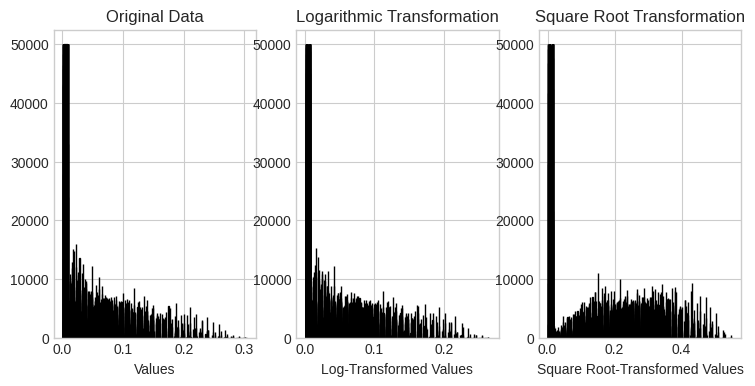

In [ ]:
# Plot the original data
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.title('Original Data')
plt.hist(X_extracted_cnn, bins=30, edgecolor='black')
plt.xlabel('Values')

# Logarithmic Transformation
log_transformed_data_cnn = np.log1p(X_extracted_cnn)

plt.subplot(1, 4, 2)
plt.title('Logarithmic Transformation')
plt.hist(log_transformed_data_cnn, bins=30, edgecolor='black')
plt.xlabel('Log-Transformed Values')

# Square Root Transformation
sqrt_transformed_data_cnn = np.sqrt(X_extracted_cnn)

plt.subplot(1, 4, 3)
plt.title('Square Root Transformation')
plt.hist(sqrt_transformed_data_cnn, bins=30, edgecolor='black')
plt.xlabel('Square Root-Transformed Values')


In [ ]:
print("After log root transformation", detect_outliers_iqr(log_transformed_data_cnn))
print("After square root transformation", detect_outliers_iqr(sqrt_transformed_data_cnn))

Number of Outliers: 5748.4316
After log root transformation [0.21344268 0.22563083 0.2566198  ... 0.21301211 0.20781371 0.22600393]
Number of Outliers: 0.0
After square root transformation []


In [ ]:
log_transformed_data_cnn_df = pd.DataFrame(log_transformed_data_cnn)
sqrt_transformed_data_cnn_df = pd.DataFrame(sqrt_transformed_data_cnn)

Comparing between log transformation and square root transformation, we see square root transformation has resulted in lot less outliers compared to the log transformation so we choose the square root transformed data.

### Feature Selection

Importing required libraries

In [ ]:
!pip install deap

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import random
import copy
from itertools import repeat
import shutil
import time
import math
import array

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools import add_constant

from sklearn.base import BaseEstimator
from sklearn.metrics import r2_score, mean_absolute_error

from joblib import Parallel, delayed, dump, load
from joblib.externals.loky import get_reusable_executor

from deap import algorithms
from deap import base
from deap import creator
from deap import tools
from tqdm.notebook import tqdm

plt.style.use('seaborn-v0_8-whitegrid')

In [ ]:
Y_cnn = np.concatenate([y_train_cnn,y_test_cnn])

In [ ]:
y_cnn_df = pd.DataFrame(Y_cnn)

Code reference : https://github.com/FlorinAndrei/fast_feature_selection/blob/main/feature_selection.ipynb

In [ ]:
# Define the fitness weights and other parameters
fitness_weights = -1.0
population_size = 100
n_gen = 100
n_jobs = os.cpu_count()

# Define the dataframes X_ga and y_ga
X_ga = sqrt_transformed_data_df.astype(float).copy()
y_ga = y_dnn_df.astype(float).copy()
X_features = X_ga.columns.to_list()[1:]


def evalMany(individuals):
    # - each individual is a list of feature selectors
    ind_list = [list(i) for i in list(individuals)]
    ret = []
    for ind in ind_list:
        cols_select = [i == 1 for i in list(ind)] + [False] # create a list of True/False feature selectors from each individual
        # fit model using the features selected from the individual
        lin_mod = sm.OLS(y_ga, X_ga.loc[:, cols_select], hasconst=True).fit()
        ret.append((lin_mod.bic,))
    return ret

# Define the custom selection function
def selElitistAndTournament(individuals, k_tournament, k_elitist=0, tournsize=3):
    return tools.selBest(individuals, k_elitist) + tools.selTournament(individuals, k_tournament, tournsize)

# multiprocess pool to evaluate individuals
def joblib_map(f, njobs, *iters):
    return Parallel(n_jobs=njobs)(delayed(f)(*args) for args in zip(*iters))

try:
    del creator.FitnessMax
    del creator.Individual
except Exception as e:
    pass

creator.create("FitnessMax", base.Fitness, weights=(fitness_weights,))
creator.create("Individual", array.array, typecode='b', fitness=creator.FitnessMax)

# Hyperparameters
population_size = 100
crossover_probability = 0.5
individual_mutation_probability = 0.2
gene_mutation_probability = 0.1
tournament_size = 3
elite_size = 0

try:
    del toolbox
except Exception as e:
    pass

toolbox = base.Toolbox()
toolbox.register("attr_bool", random.randint, 0, 1)
toolbox.register("individual", tools.initRepeat, creator.Individual, toolbox.attr_bool, len(X_features))
toolbox.register("population", tools.initRepeat, list, toolbox.individual)
toolbox.register("map_multi", joblib_map)
toolbox.register("evaluate", evalMany)
toolbox.register("mate", tools.cxTwoPoint)
toolbox.register("mutate", tools.mutFlipBit, indpb=gene_mutation_probability)
toolbox.register("select",selElitistAndTournament,k_tournament=population_size - elite_size,k_elitist=elite_size,tournsize=tournament_size,)

random.seed(42)
population = toolbox.population(n=population_size)
hall_of_fame = tools.HallOfFame(1)
objective_runs_ga = 0

# Evaluate the individuals with an invalid fitness
invalid_ind = [ind for ind in population if not ind.fitness.valid]
# split the population in a list with n_jobs elements where each element is an array containing multiple individuals
fitnesses_nested = toolbox.map_multi(
    toolbox.evaluate, n_jobs, np.array_split(invalid_ind, n_jobs) # send individuals to the evaluator
)
objective_runs_ga += len(invalid_ind)
fitnesses = []
for l in fitnesses_nested:
    fitnesses += l
for ind, fit in zip(invalid_ind, fitnesses):
    ind.fitness.values = fit

hall_of_fame.update(population)

n_gen = 100
best_objective_per_gen_ga = np.full(n_gen, np.nan)
best_objective_ga = np.nan
best_generation_ga = 0
gene_values_mean = np.zeros((n_gen, len(X_features)))
gene_maes = np.full(n_gen, np.nan)
time_to_best_ga = np.inf
# Begin the generational process
iterator = tqdm(range(1, n_gen + 1), desc='generation')
t_start = time.time()

for gen in iterator:
    t_start_loop = time.time()

    # Select the next generation of individuals
    offspring = toolbox.select(population)
    # Vary the pool of individuals via cross-over and mutation
    offspring = algorithms.varAnd(
        offspring,
        toolbox,
        crossover_probability,
        individual_mutation_probability,
    )
    # Evaluate the individuals with an invalid fitness
    invalid_ind = [ind for ind in offspring if not ind.fitness.valid]
    # split the population in a list with n_jobs elements
    # each element is an array containing multiple individuals
    # send list to the evaluator pool
    fitnesses_nested = toolbox.map_multi(
        toolbox.evaluate, n_jobs, np.array_split(invalid_ind, n_jobs)
    )
    objective_runs_ga += len(invalid_ind)
    fitnesses = []
    for l in fitnesses_nested:
        fitnesses += l
    for ind, fit in zip(invalid_ind, fitnesses):
        ind.fitness.values = fit
    # Update the hall of fame with the generated individuals
    hall_of_fame.update(offspring)
    # Replace the current population by the offspring
    population[:] = offspring

    t_end_loop = time.time()
    # record the mean gene values across the population
    gene_values_mean[gen - 1, :] = np.array(population).mean(axis=0)
    if gen >= 2:
        gene_maes[gen - 1] = mean_absolute_error(
            gene_values_mean[gen - 2, :], gene_values_mean[gen - 1, :]
        )
    # pick best individual for stats recording
    best_individual_ga = tools.selBest(population, 1)[0]
    best_objective_per_gen_ga[gen - 1] = best_individual_ga.fitness.values[0]
    if (
        best_objective_ga is np.nan
        or fitness_weights * best_individual_ga.fitness.values[0]
        > fitness_weights * best_objective_ga
    ):
        best_objective_ga = best_individual_ga.fitness.values[0]
        best_generation_ga = gen
        time_to_best_ga = t_end_loop - t_start
        print(
            f'gen: {gen:4n}, curr/prev gene MAE: {gene_maes[gen - 1]:.4f}, new best objective: {best_objective_ga:.4f}, time to best: {time_to_best_ga:.4f}'
        )

    if os.path.isfile('break'):
        # to gracefully break the loop, manually create a file called 'break'
        print(f'Found break file, stopping now.')
        iterator.close()
        break
g_completed_ga = gen

best_individual_ga = list(hall_of_fame[0])
best_features_ga = [
    X_features[i] for i, val in enumerate(best_individual_ga) if val == 1
]
best_objective_ga = (
    sm.OLS(y_ga, X_ga[best_features_ga], hasconst=True).fit().bic
)

generation:   0%|          | 0/100 [00:00<?, ?it/s]

gen:    1, curr/prev gene MAE: nan, new best objective: 25827.5286, time to best: 37.4507
gen:    2, curr/prev gene MAE: 0.0644, new best objective: 24972.2770, time to best: 82.5423
gen:    3, curr/prev gene MAE: 0.0599, new best objective: 23808.9544, time to best: 130.5830
gen:    5, curr/prev gene MAE: 0.0618, new best objective: 23687.8764, time to best: 224.9943
gen:    6, curr/prev gene MAE: 0.0504, new best objective: 23141.5727, time to best: 275.9483
gen:    7, curr/prev gene MAE: 0.0528, new best objective: 22657.5571, time to best: 325.4156
gen:    8, curr/prev gene MAE: 0.0410, new best objective: 22633.7519, time to best: 376.2195
gen:    9, curr/prev gene MAE: 0.0540, new best objective: 22490.8614, time to best: 433.5488
gen:   10, curr/prev gene MAE: 0.0484, new best objective: 22241.5800, time to best: 496.2205
gen:   11, curr/prev gene MAE: 0.0481, new best objective: 21775.1458, time to best: 544.2882
gen:   12, curr/prev gene MAE: 0.0372, new best objective: 21677.

best objective:  22948.250474977773
best generation: 100
objective runs:  6023
time to best:    6528.387 sec
best features:   [3, 6, 7, 8, 10, 11, 12, 13, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 42, 43, 44, 48, 49, 50, 53, 54, 55, 57, 61, 63, 64, 65, 66, 69, 70, 71, 72, 73, 74, 76, 77, 78, 80, 82, 83, 84, 86, 87, 88, 89, 90, 91, 92, 93, 95, 98, 99, 102, 103, 105, 106, 107, 108, 109, 111, 112, 113, 114, 115, 117, 118, 122, 123, 124, 125, 126, 127, 129, 130, 131, 132, 133, 136, 137, 138, 139, 140, 141, 143, 144, 145, 146, 147, 148, 149, 150, 152, 153, 154, 155, 156, 157, 158, 159]


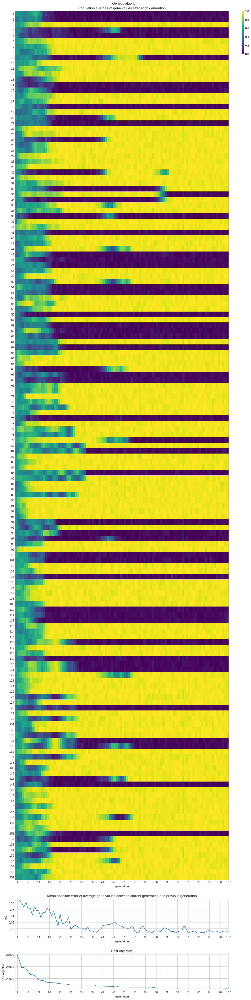

In [ ]:
# Print best objective, best generation, objective runs, and time to best
print(f'Best objective:  {best_objective_ga}')
print(f'Best generation: {best_generation_ga}')
print(f'Objective runs:  {objective_runs_ga}')
print(f'Time to best:    {time_to_best_ga:.3f} sec')

# Print best features
print(f'Best features:   {best_features_ga}')

# Create a DataFrame for the population average of gene values
gvm_df = pd.DataFrame(
    gene_values_mean[:g_completed_ga],
    columns=X_features,
    index=range(1, g_completed_ga + 1)
)

# Plotting
fig, ax = plt.subplots(
    3,
    1,
    sharex=True,
    height_ratios=[24, 1, 1],
    figsize=(12, 48),
    layout='constrained',
)
sns.heatmap(
    gvm_df.T,
    vmin=0.0,
    vmax=1.0,
    cmap='viridis',
    cbar=True,
    cbar_kws={'fraction': 0.01, 'anchor': (0.0, 1.0)},
    ax=ax[0]
)
ax[0].set_title('Population average of gene values after each generation')
ax[0].axvline(x=best_generation_ga, color='C7')
ax[0].set_xlabel('Generation')
ax[0].set_ylabel('Feature')
ax[0].set_xticks(range(1, g_completed_ga + 1, max(g_completed_ga // 20, 1)))
ax[0].tick_params(axis='both', reset=True)

ax[1].plot(range(2, g_completed_ga + 1), gene_maes[1:g_completed_ga])
ax[1].vlines(x=best_generation_ga, ymin=min(gene_maes), ymax=max(gene_maes), colors='C7')
ax[1].set_xlabel('Generation')
ax[1].set_ylabel('MAE')
ax[1].set_title('Mean absolute error of average gene values between current and previous generations')
ax[1].tick_params(axis='both', reset=True)

ax[2].plot(range(1, g_completed_ga + 1), best_objective_per_gen_ga[:g_completed_ga])
ax[2].vlines(x=best_generation_ga, ymin=min(best_objective_per_gen_ga), ymax=max(best_objective_per_gen_ga), colors='C7')
ax[2].set_xlabel('Generation')
ax[2].set_ylabel('Best Objective')
ax[2].set_title('Best objective')
ax[2].tick_params(axis='both', reset=True)

# Adjust layout and save/show the figure
#fig.tight_layout()
#fig.subplots_adjust(top=0.95)
fig.savefig('ga-performance.png')
plt.show()


In [ ]:
import json

# saving the results to a json file
best_result = {
    'best_objective': best_objective_ga,
    'bestgeneration': best_generation_ga,
    'objective runs': objective_runs_ga,
    'best features': best_features_ga
}

with open('cnn_best_result_full.json', 'w') as json_file:
    json.dump(best_result, json_file)

In [ ]:
# Load the saved results
import json
with open('/content/drive/MyDrive/CNN_NEW/cnn_best_result_full.json', 'rb') as file:
    loaded_results = json.load(file)

# Access the best feature set and best fitness
best_objective_cnn = loaded_results['best_objective']
best_feature_set_cnn = loaded_results['best features']

# Use the loaded results as needed
print(f"Loaded Best Feature Set: {best_feature_set_cnn}")
print(f"Loaded Best Fitness: {best_objective_cnn}")

Loaded Best Feature Set: [3, 6, 7, 8, 10, 11, 12, 13, 16, 17, 19, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 42, 43, 44, 48, 49, 50, 53, 54, 55, 57, 61, 63, 64, 65, 66, 69, 70, 71, 72, 73, 74, 76, 77, 78, 80, 82, 83, 84, 86, 87, 88, 89, 90, 91, 92, 93, 95, 98, 99, 102, 103, 105, 106, 107, 108, 109, 111, 112, 113, 114, 115, 117, 118, 122, 123, 124, 125, 126, 127, 129, 130, 131, 132, 133, 136, 137, 138, 139, 140, 141, 143, 144, 145, 146, 147, 148, 149, 150, 152, 153, 154, 155, 156, 157, 158, 159]
Loaded Best Fitness: 22948.250474977773


In [ ]:
# make copies of the dataframe
X_ga_cnn = sqrt_transformed_data_cnn_df.astype(float).copy()
y_ga_cnn = y_cnn_df.astype(float).copy()

In [ ]:
selected_features_cnn_df = X_ga_cnn[best_feature_set_cnn ]
X_train_selected_cnn_ga, X_test_selected_cnn_ga, y_train_cnn_ga, y_test_cnn_ga = train_test_split(selected_features_cnn_df, y_cnn_df, test_size=0.2, random_state=42)

In [ ]:
y_train_cnn_ga.columns = ['target']
y_test_cnn_ga.columns = ['target']

### Model Evaluation and ParameterTuning

Importing required libraries

In [ ]:
!pip3 install optuna

In [ ]:
import optuna
from optuna.samplers import TPESampler
import pickle

Gaussian Naive Bayes

In [ ]:
def objective_gnb(trial):
    var_smoothing = trial.suggest_float("var_smoothing", 1e-10, 1e-5, log=True)
    model = GaussianNB(var_smoothing=var_smoothing)
    model.fit(X_train_selected_cnn_ga, y_train_cnn_ga)
    y_pred = model.predict(X_test_selected_cnn_ga)
    return accuracy_score(y_test_cnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_gnb = optuna.create_study(direction="maximize", sampler=sampler)
study_gnb.optimize(objective_gnb, n_trials=100)

print("Number of finished trials: ", len(study_gnb.trials))
print("Best trial:")
trial = study_gnb.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-04-13 22:37:32,193] A new study created in memory with name: no-name-0958a793-0eda-4c68-bd7a-70d056c9c82d
[I 2024-04-13 22:37:32,409] Trial 0 finished with value: 0.7442 and parameters: {'var_smoothing': 1.2164941464151851e-08}. Best is trial 0 with value: 0.7442.
[I 2024-04-13 22:37:32,622] Trial 1 finished with value: 0.762 and parameters: {'var_smoothing': 3.995972283135059e-07}. Best is trial 1 with value: 0.762.
[I 2024-04-13 22:37:32,776] Trial 2 finished with value: 0.7212 and parameters: {'var_smoothing': 1.0013176560941255e-10}. Best is trial 1 with value: 0.762.
[I 2024-04-13 22:37:32,927] Trial 3 finished with value: 0.7385 and parameters: {'var_smoothing': 3.2483503450866807e-09}. Best is trial 1 with value: 0.762.
[I 2024-04-13 22:37:33,097] Trial 4 finished with value: 0.736 and parameters: {'var_smoothing': 5.417257182767975e-10}. Best is trial 1 with value: 0.762.
[I 2024-04-13 22:37:33,251] Trial 5 finished with value: 0.7326 and parameters: {'var_smoothing': 2

Number of finished trials:  100
Best trial:
  Value:  0.7744
  Params: 
    var_smoothing: 8.67522822573305e-06


In [ ]:
model_gb = GaussianNB(var_smoothing = 8.67522822573305e-06)

In [ ]:
with open('gb_cnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_gb, f)

Hypertuned Gaussian Naive Bayes performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.774625
Precision: 0.7942293822658761
Recall (TPR): 0.774625
False Positive Rate (FPR): 0.21403411466009103
F1 score (F-measure): 0.7765558334291413
Specificity: 0.785965885339909
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.774625,0.873405,0.724730,0.152798,0.792152,17179,2490,13806,6525
1,1,0.774625,0.679062,0.847202,0.275270,0.753870,13806,6525,17179,2490


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


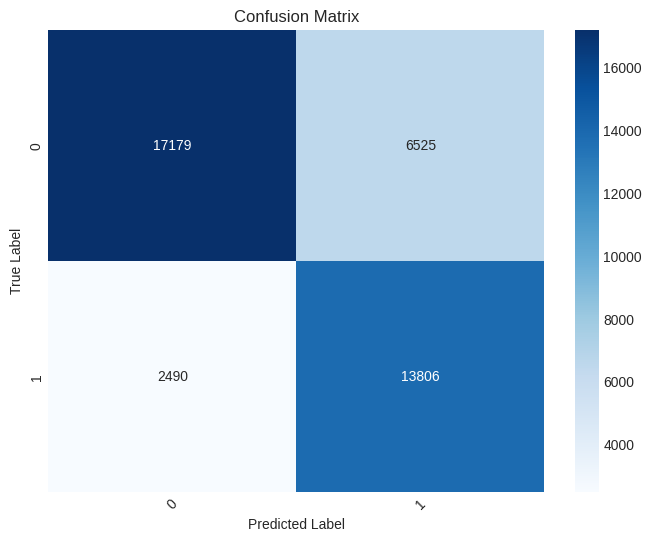

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.7744
Precision: 0.7921068290118582
Recall (TPR): 0.7744
False Positive Rate (FPR): 0.21543353782579988
F1 score (F-measure): 0.7762476210438924
Specificity: 0.7845664621742001
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.7744,0.868309,0.728274,0.159141,0.792150,4299,652,3445,1604
1,1,0.7744,0.682313,0.840859,0.271726,0.753335,3445,1604,4299,652


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


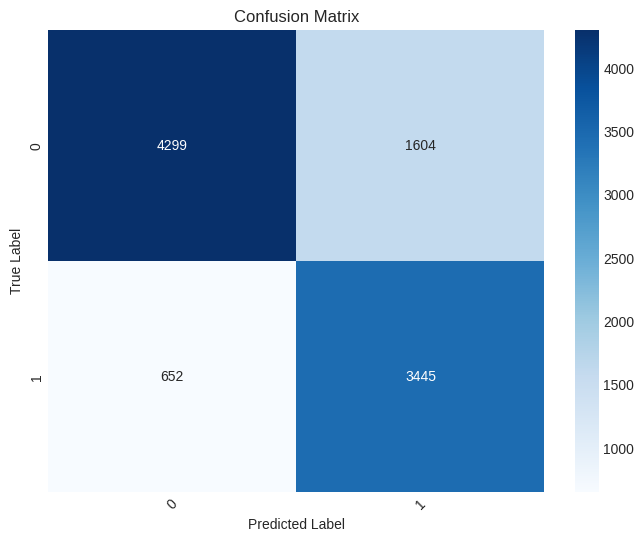

In [ ]:
print("Hypertuned Gaussian Naive Bayes performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
gb_cnn_result_1 = runclassifier(model_gb,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

Gaussian Naive Bayes performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.73675
Precision: 0.7804114121371499
Recall (TPR): 0.73675
False Positive Rate (FPR): 0.24057302376503797
F1 score (F-measure): 0.7375503871702463
Specificity: 0.759426976234962
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.73675,0.886924,0.636981,0.118127,0.741456,15099,1925,14371,8605
1,1,0.73675,0.625479,0.881873,0.363019,0.731870,14371,8605,15099,1925


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


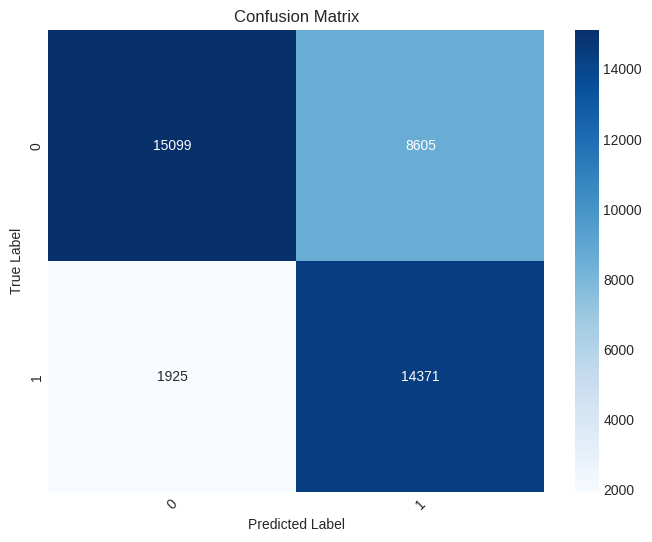

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.7379
Precision: 0.7781482095307214
Recall (TPR): 0.7379
False Positive Rate (FPR): 0.2410853877991983
F1 score (F-measure): 0.7387679045414168
Specificity: 0.7589146122008017
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.7379,0.881273,0.642555,0.124725,0.743215,3793,511,3586,2110
1,1,0.7379,0.629565,0.875275,0.357445,0.732360,3586,2110,3793,511


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


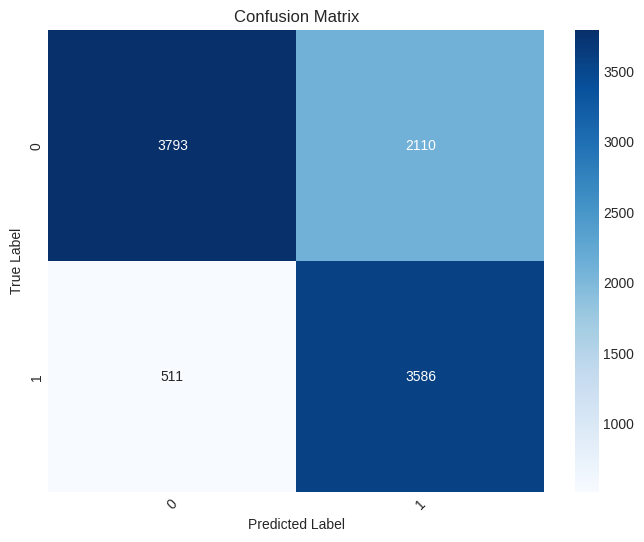

In [ ]:
print("Gaussian Naive Bayes performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = GaussianNB()
gb_cnn_result_2 = runclassifier(model,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

Logistic Regression

In [ ]:
def objective_lr(trial):
    penalty  = trial.suggest_categorical("penalty", ['l2'])
    solvers  = trial.suggest_categorical('solvers', ['newton-cg', 'lbfgs', 'liblinear'])
    C = trial.suggest_categorical("C", [100, 10, 1.0, 0.1, 0.01])
    model = LogisticRegression(solver=solvers,penalty=penalty,C=C)
    model.fit(X_train_selected_cnn_ga, y_train_cnn_ga)
    y_pred = model.predict(X_test_selected_cnn_ga)
    return accuracy_score(y_test_cnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_lr = optuna.create_study(direction="maximize", sampler=sampler)
study_lr.optimize(objective_lr, n_trials=100)

print("Number of finished trials: ", len(study_lr.trials))
print("Best trial:")
trial_lr = study_lr.best_trial
print("  Value: ", trial_lr.value)
print("  Params: ")
for key, value in trial_lr.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-29 17:35:29,209] A new study created in memory with name: no-name-a9072d21-6a5a-40a2-b8d1-fded9e5e40cf
[I 2024-03-29 17:35:30,343] Trial 0 finished with value: 0.8505 and parameters: {'penalty': 'l2', 'solvers': 'lbfgs', 'C': 0.01}. Best is trial 0 with value: 0.8505.
[I 2024-03-29 17:35:31,959] Trial 1 finished with value: 0.8901 and parameters: {'penalty': 'l2', 'solvers': 'lbfgs', 'C': 1.0}. Best is trial 1 with value: 0.8901.
[I 2024-03-29 17:35:33,682] Trial 2 finished with value: 0.8901 and parameters: {'penalty': 'l2', 'solvers': 'lbfgs', 'C': 1.0}. Best is trial 1 with value: 0.8901.
[I 2024-03-29 17:35:35,470] Trial 3 finished with value: 0.8901 and parameters: {'penalty': 'l2', 'solvers': 'lbfgs', 'C': 1.0}. Best is trial 1 with value: 0.8901.
[I 2024-03-29 17:35:41,816] Trial 4 finished with value: 0.8897 and parameters: {'penalty': 'l2', 'solvers': 'newton-cg', 'C': 1.0}. Best is trial 1 with value: 0.8901.
[I 2024-03-29 17:35:45,042] Trial 5 finished with value:

Number of finished trials:  100
Best trial:
  Value:  0.8952
  Params: 
    penalty: l2
    solvers: lbfgs
    C: 10


In [ ]:
model_lr = LogisticRegression(solver=trial_lr.params["solvers"],penalty= trial_lr.params["penalty"],C= trial_lr.params["C"])

In [ ]:
with open('lr_cnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_lr, f)

In [ ]:
with open('/content/drive/MyDrive/CNN_NEW/lr_cnn_ga_results.pkl', 'rb') as f:
    model_lr = pickle.load(f)

Parameter tuned Logistic Regression performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.89405
Precision: 0.8938174824928538
Recall (TPR): 0.89405
False Positive Rate (FPR): 0.11282944152815177
F1 score (F-measure): 0.8936884954379329
Specificity: 0.8871705584718482
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.89405,0.899647,0.924317,0.149975,0.911815,21910,2444,13852,1794
1,1,0.89405,0.885338,0.850025,0.075683,0.867322,13852,1794,21910,2444


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


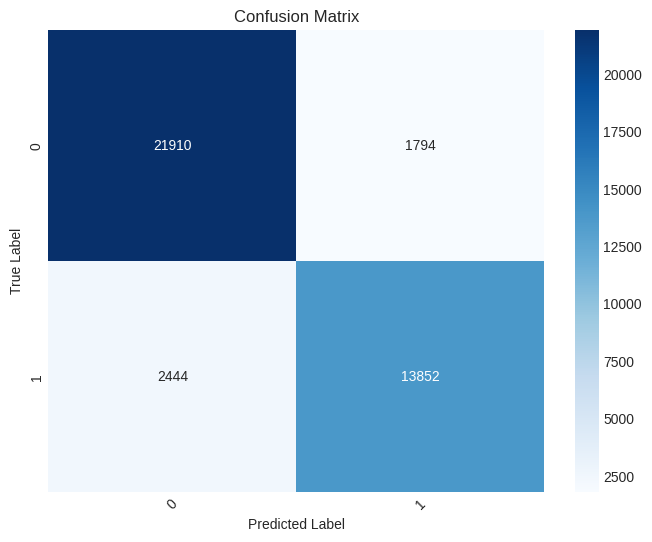

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8847
Precision: 0.8844577742459447
Recall (TPR): 0.8847
False Positive Rate (FPR): 0.12279056114697162
F1 score (F-measure): 0.8842366490191728
Specificity: 0.8772094388530284
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8847,0.889600,0.918685,0.164267,0.903909,5423,673,3424,480
1,1,0.8847,0.877049,0.835733,0.081315,0.855893,3424,480,5423,673


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


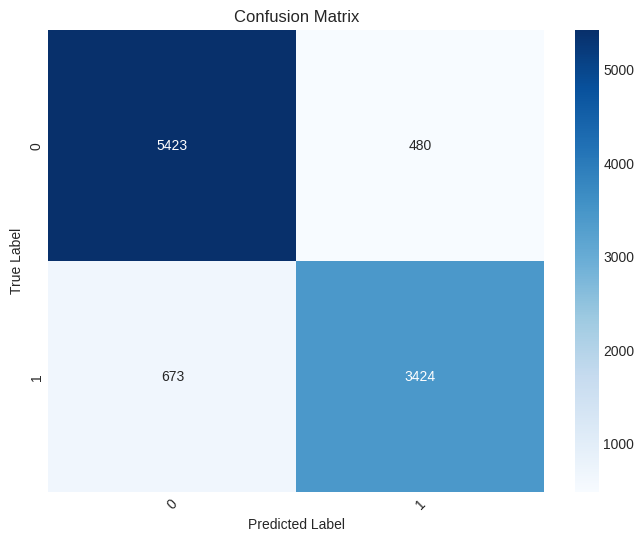

In [ ]:
print("Parameter tuned Logistic Regression performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
lr_cnn_result_1 = runclassifier(model_lr,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

Logistic Regression performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.883625
Precision: 0.8833079973266118
Recall (TPR): 0.883625
False Positive Rate (FPR): 0.12315964768223897
F1 score (F-measure): 0.8832915848981278
Specificity: 0.876840352317761
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.883625,0.89265,0.913475,0.159794,0.902942,21653,2604,13692,2051
1,1,0.883625,0.86972,0.840206,0.086525,0.854708,13692,2051,21653,2604


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


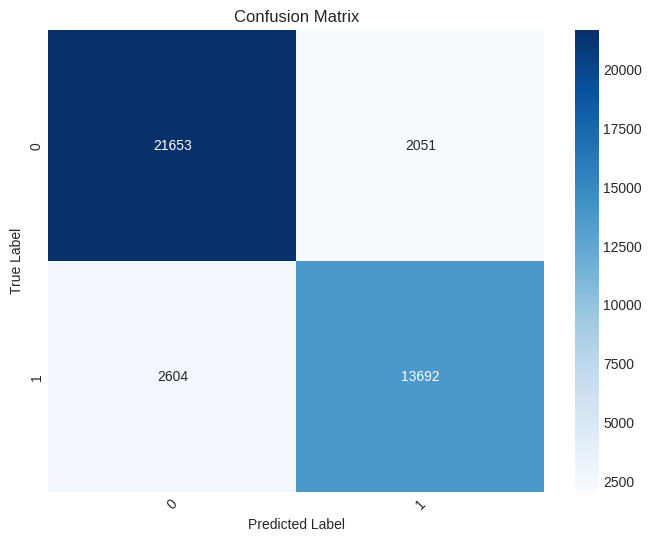

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8793
Precision: 0.87897574522385
Recall (TPR): 0.8793
False Positive Rate (FPR): 0.12773788483749837
F1 score (F-measure): 0.8789077451111686
Specificity: 0.8722621151625016
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8793,0.887331,0.911232,0.166707,0.899122,5379,683,3414,524
1,1,0.8793,0.866938,0.833293,0.088768,0.849782,3414,524,5379,683


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


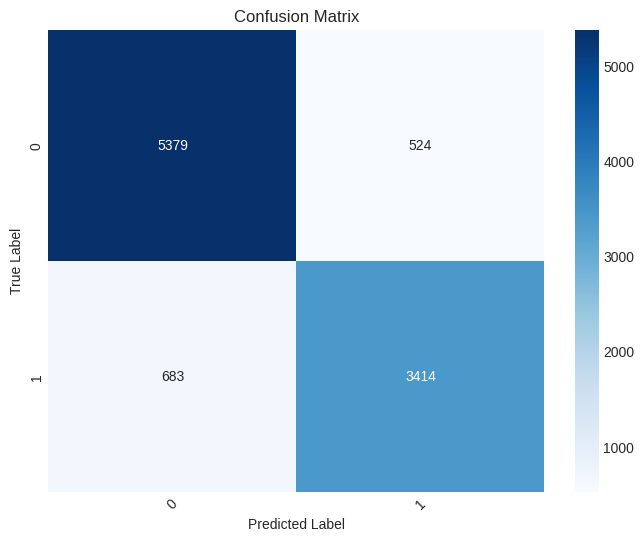

In [ ]:
print("Logistic Regression performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = LogisticRegression()
lr_cnn_result_2 = runclassifier(model,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

Support Vector Machine

In [ ]:
def objective(trial):
    kernel = trial.suggest_categorical('kernel', ['poly','rbf','sigmoid'])
    C = trial.suggest_categorical('C', [50,10,1.0,0.1,0.01])
    gamma = trial.suggest_categorical('gamma',['scale'])
    model = SVC(kernel=kernel,C=C,gamma=gamma) # do not tune the seed
    model.fit(X_train_selected_cnn_ga, y_train_cnn_ga)
    y_pred = model.predict(X_test_selected_cnn_ga)
    return accuracy_score(y_test_cnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study = optuna.create_study(direction="maximize", sampler=sampler)
study.optimize(objective, n_trials=100)

print("Number of finished trials: ", len(study.trials))
print("Best trial:")
trial = study.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-31 20:13:56,582] A new study created in memory with name: no-name-57c4c7ff-3fe1-4095-92a7-ba5ce380e647
[I 2024-03-31 20:17:35,337] Trial 0 finished with value: 0.8498 and parameters: {'kernel': 'rbf', 'C': 0.01, 'gamma': 'scale'}. Best is trial 0 with value: 0.8498.
[I 2024-03-31 20:19:17,285] Trial 1 finished with value: 0.9448 and parameters: {'kernel': 'rbf', 'C': 1.0, 'gamma': 'scale'}. Best is trial 1 with value: 0.9448.
[I 2024-03-31 20:20:55,875] Trial 2 finished with value: 0.9448 and parameters: {'kernel': 'rbf', 'C': 1.0, 'gamma': 'scale'}. Best is trial 1 with value: 0.9448.
[I 2024-03-31 20:22:37,368] Trial 3 finished with value: 0.9448 and parameters: {'kernel': 'rbf', 'C': 1.0, 'gamma': 'scale'}. Best is trial 1 with value: 0.9448.
[I 2024-03-31 20:23:54,921] Trial 4 finished with value: 0.9585 and parameters: {'kernel': 'poly', 'C': 1.0, 'gamma': 'scale'}. Best is trial 4 with value: 0.9585.
[I 2024-03-31 20:25:36,500] Trial 5 finished with value: 0.9163 and p

Number of finished trials:  100
Best trial:
  Value:  0.9794
  Params: 
    kernel: poly
    C: 50
    gamma: scale


In [ ]:
model_svc = SVC(kernel=trial.params['kernel'],C=trial.params['C'],gamma=trial.params['gamma'], probability=True)

In [ ]:
filename = "cnn_ga_svc_model.pkl"
pickle.dump(model_svc, open(filename, "wb"))

In [ ]:
with open('/content/drive/MyDrive/CNN_NEW/cnn_ga_svc_model.pkl', 'rb') as f:
    model_svc = pickle.load(f)

Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.97975
Precision: 0.979747150382745
Recall (TPR): 0.97975
False Positive Rate (FPR): 0.021640446541546288
F1 score (F-measure): 0.9797361320830108
Specificity: 0.9783595534584537
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.97975,0.980079,0.985867,0.029148,0.982965,23369,475,15821,335
1,1,0.97975,0.979265,0.970852,0.014133,0.975040,15821,335,23369,475


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


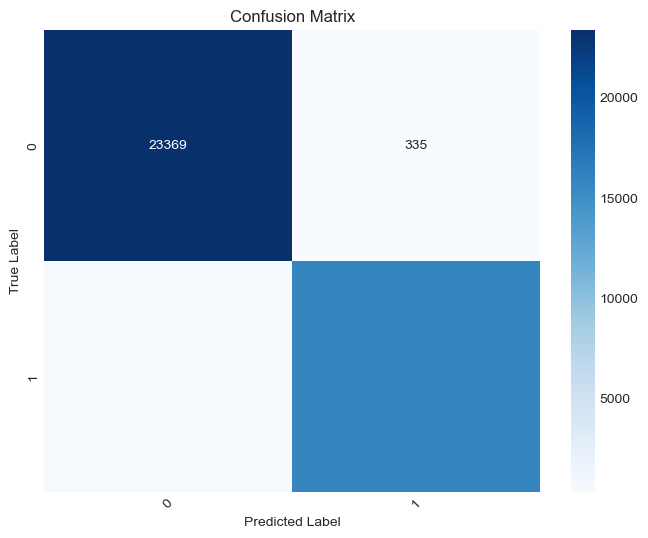

------------------------------------------------------------------------------------------------
ROC Curve for Train Set
------------------------------------------------------------------------------------------------


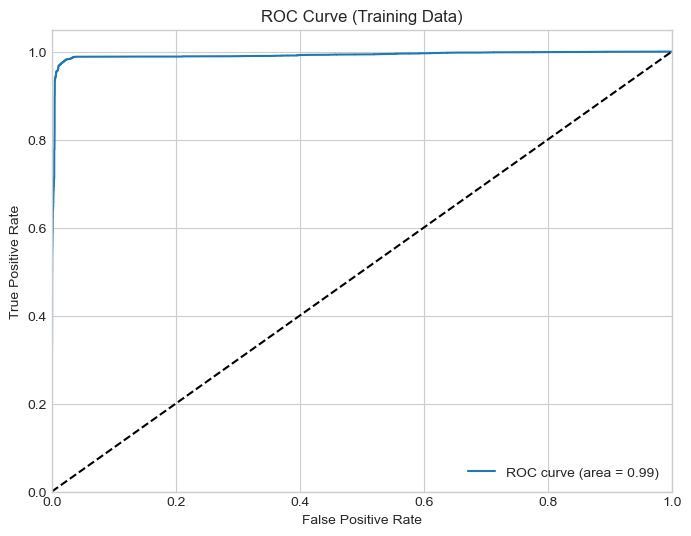

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9731
Precision: 0.973117452205413
Recall (TPR): 0.9731
False Positive Rate (FPR): 0.029020441156106358
F1 score (F-measure): 0.9730660988058999
Specificity: 0.9709795588438936
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9731,0.972017,0.982721,0.040762,0.977340,5801,167,3930,102
1,1,0.9731,0.974702,0.959238,0.017279,0.966909,3930,102,5801,167


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


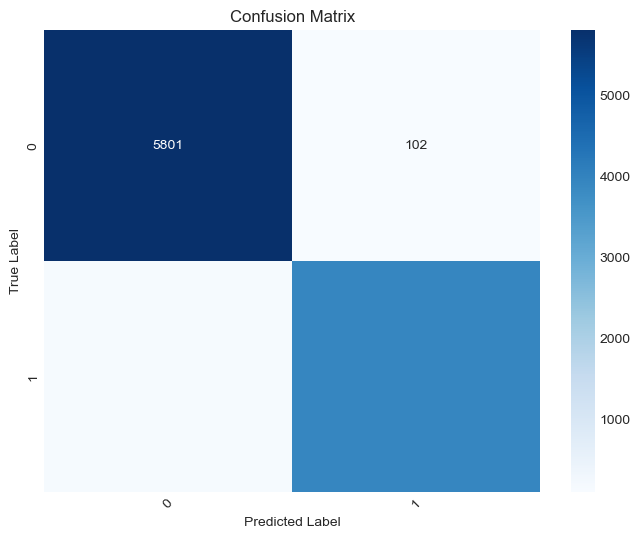

------------------------------------------------------------------------------------------------
ROC Curve for Test Set
------------------------------------------------------------------------------------------------


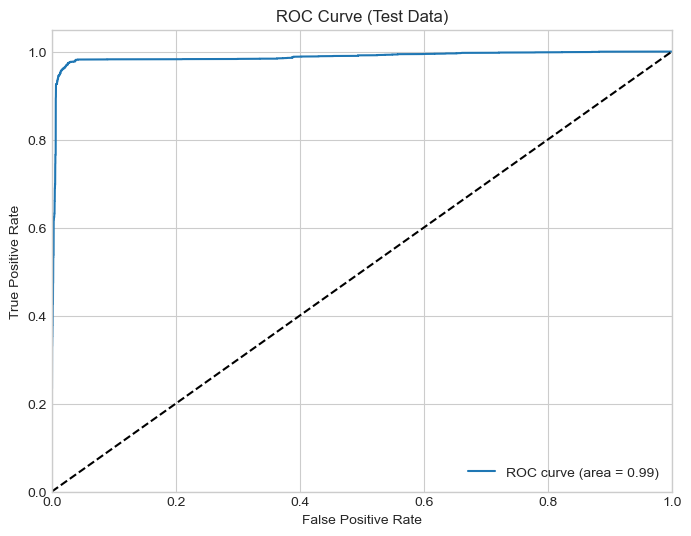

In [ ]:
svc_cnn_result_1 = runclassifier(model_svc,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

Support Vector Machine performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.91785
Precision: 0.917718861195898
Recall (TPR): 0.91785
False Positive Rate (FPR): 0.08734989763290701
F1 score (F-measure): 0.9176495300580005
Specificity: 0.912650102367093
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.91785,0.922208,0.940727,0.115427,0.931376,22299,1881,14415,1405
1,1,0.91785,0.911188,0.884573,0.059273,0.897683,14415,1405,22299,1881


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


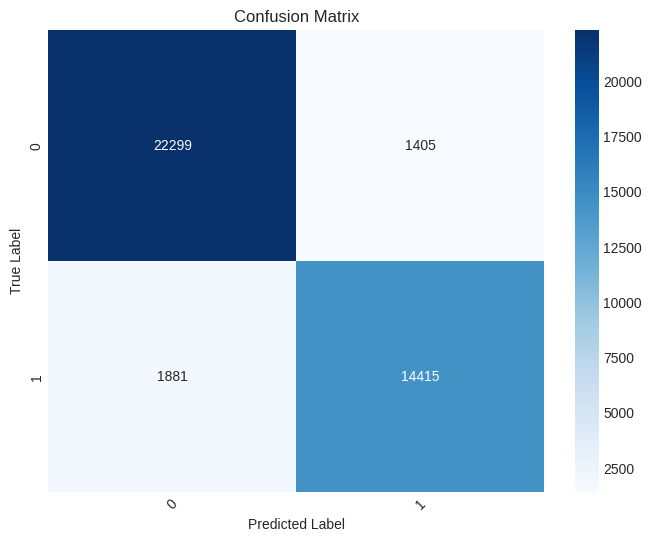

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9168
Precision: 0.9167208310711676
Recall (TPR): 0.9168
False Positive Rate (FPR): 0.08880551256789915
F1 score (F-measure): 0.9165461802175688
Specificity: 0.9111944874321009
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9168,0.918883,0.942233,0.119844,0.930412,5562,491,3606,341
1,1,0.9168,0.913605,0.880156,0.057767,0.896569,3606,341,5562,491


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


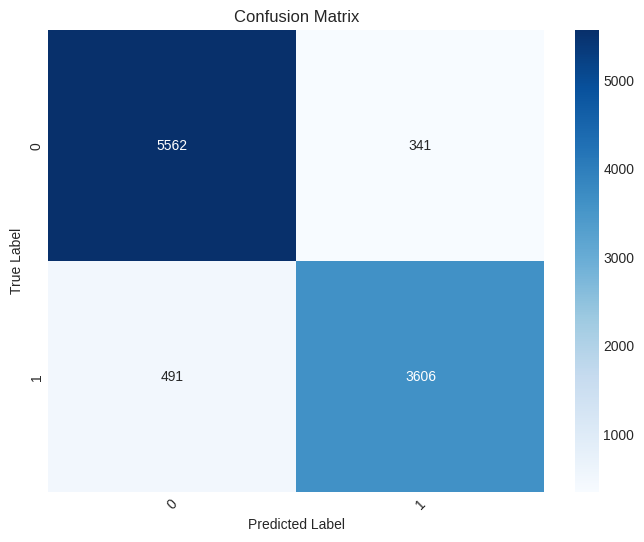

In [ ]:
print("Support Vector Machine performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = SVC(probability = True)
svc_cnn_result_2 = runclassifier(model,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

DecisionTree

In [ ]:
def objective_dt(trial):
    max_depth = trial.suggest_int('max_depth', 3, 10)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    max_features = trial.suggest_categorical('max_features', ['auto', 'sqrt', 'log2'])
    model = DecisionTreeClassifier(max_depth=max_depth, min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf,max_features=max_features,random_state=1)
    model.fit(X_train_selected_cnn_ga, y_train_cnn_ga)
    y_pred = model.predict(X_test_selected_cnn_ga)
    return accuracy_score(y_test_cnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_dt = optuna.create_study(direction="maximize", sampler=sampler)
study_dt.optimize(objective_dt, n_trials=100)

print("Number of finished trials: ", len(study_dt.trials))
print("Best trial:")
trial = study_dt.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-04-09 17:56:26,118] A new study created in memory with name: no-name-93d8d38f-af73-4ccc-a4da-ceec1979f493
[I 2024-04-09 17:56:26,236] Trial 0 finished with value: 0.9077 and parameters: {'max_depth': 6, 'min_samples_split': 15, 'min_samples_leaf': 1, 'max_features': 'auto'}. Best is trial 0 with value: 0.9077.
[I 2024-04-09 17:56:26,303] Trial 1 finished with value: 0.8653 and parameters: {'max_depth': 4, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.9077.
[I 2024-04-09 17:56:26,384] Trial 2 finished with value: 0.86 and parameters: {'max_depth': 4, 'min_samples_split': 18, 'min_samples_leaf': 1, 'max_features': 'auto'}. Best is trial 0 with value: 0.9077.
[I 2024-04-09 17:56:26,475] Trial 3 finished with value: 0.859 and parameters: {'max_depth': 4, 'min_samples_split': 5, 'min_samples_leaf': 17, 'max_features': 'auto'}. Best is trial 0 with value: 0.9077.
[I 2024-04-09 17:56:26,576] Trial 4 finished with value: 0.9516 an

Number of finished trials:  100
Best trial:
  Value:  0.9654
  Params: 
    max_depth: 10
    min_samples_split: 20
    min_samples_leaf: 7
    max_features: log2


In [ ]:
model_dt = DecisionTreeClassifier(max_depth=trial.params['max_depth'], min_samples_split=trial.params['min_samples_split'], min_samples_leaf=trial.params['min_samples_leaf'],max_features=trial.params['max_features'],random_state=1)

In [ ]:
model_dt = DecisionTreeClassifier(max_depth=10, min_samples_split=20, min_samples_leaf=7,max_features='log2',random_state=1)

In [ ]:
filename = "cnn_ga_dt_model.pkl"
pickle.dump(model_dt, open(filename, "wb"))

In [ ]:
with open('/content/drive/MyDrive/CNN_NEW/cnn_ga_dt_model.pkl', 'rb') as f:
    model_dt = pickle.load(f)

Parameter Tuned Decision Tree performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.952825
Precision: 0.9527819712568059
Recall (TPR): 0.952825
False Positive Rate (FPR): 0.04990050957389536
F1 score (F-measure): 0.9527738937992685
Specificity: 0.9500994904261046
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.952825,0.955984,0.964816,0.064617,0.960380,22870,1053,15243,834
1,1,0.952825,0.948125,0.935383,0.035184,0.941711,15243,834,22870,1053


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


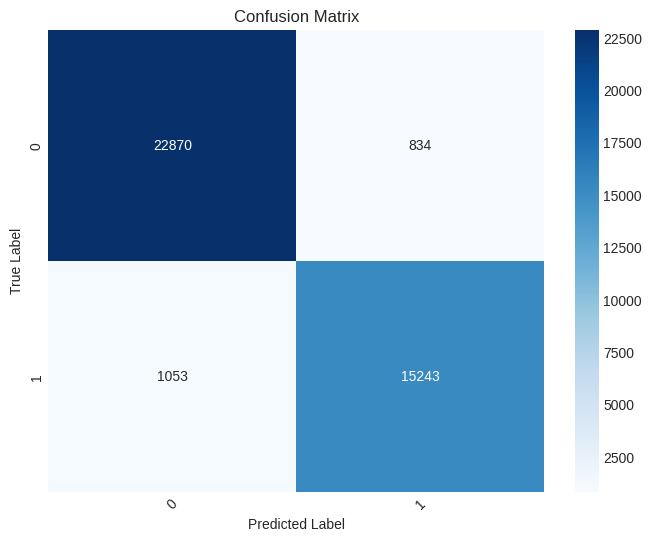

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9654
Precision: 0.9653788692765194
Recall (TPR): 0.9654
False Positive Rate (FPR): 0.03628930503724459
F1 score (F-measure): 0.9653816137770964
Specificity: 0.9637106949627554
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9654,0.968471,0.973065,0.045643,0.970762,5744,187,3910,159
1,1,0.9654,0.960924,0.954357,0.026935,0.957629,3910,159,5744,187


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


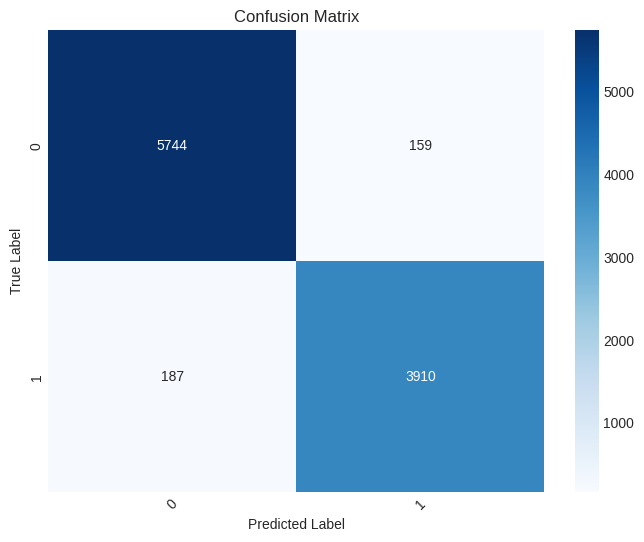

In [ ]:
print("Parameter Tuned Decision Tree performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
dt_cnn_result_1 = runclassifier(model_dt,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

Decision Tree performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.981325
Precision: 0.9813210713714948
Recall (TPR): 0.981325
False Positive Rate (FPR): 0.019467734608030307
F1 score (F-measure): 0.9813225730805621
Specificity: 0.9805322653919697
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.981325,0.983692,0.984813,0.023748,0.984252,23344,387,15909,360
1,1,0.981325,0.977872,0.976252,0.015187,0.977061,15909,360,23344,387


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


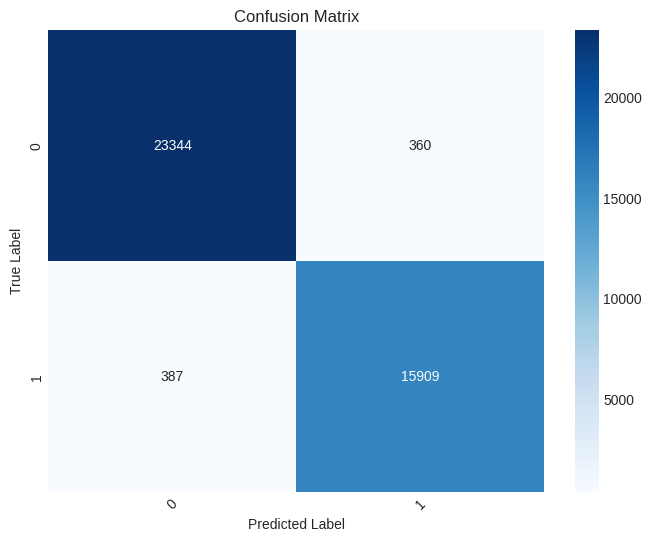

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.979
Precision: 0.9789929885947937
Recall (TPR): 0.979
False Positive Rate (FPR): 0.0221934288655119
F1 score (F-measure): 0.978989649907719
Specificity: 0.9778065711344881
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.979,0.980098,0.984415,0.028802,0.982252,5811,118,3979,92
1,1,0.979,0.977401,0.971198,0.015585,0.974290,3979,92,5811,118


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


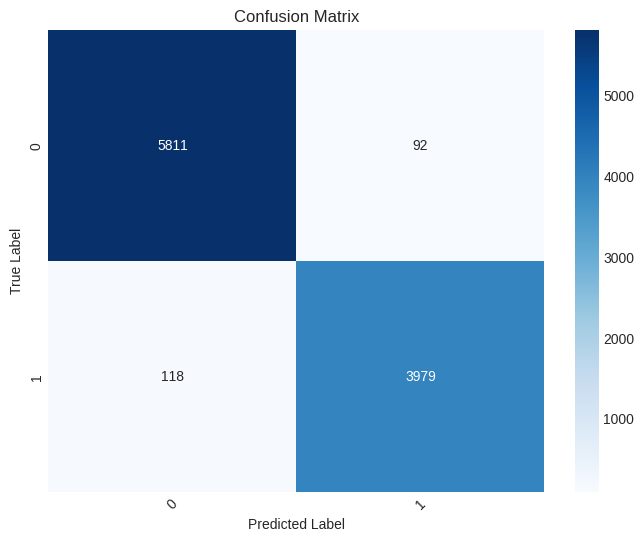

In [ ]:
print("Decision Tree performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = DecisionTreeClassifier()
dt_cnn_result_2 = runclassifier(model,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

RandomForest Classifier

In [ ]:
def objective_rf(trial):
    n_estimators = trial.suggest_int("n_estimators", 50, 500)
    max_features  = trial.suggest_categorical("max_features", ['sqrt','log2'])
    criterion  = trial.suggest_categorical("criterion", ['gini','entropy'])
    max_depth = trial.suggest_int("max_depth", 1, 21)
    min_samples_split = trial.suggest_int("min_samples_split", 2, 11)
    min_samples_leaf = trial.suggest_categorical("min_samples_leaf", [1, 2, 4])
    max_leaf_nodes = trial.suggest_int("max_leaf_nodes", 2, 20)
    model = RandomForestClassifier(n_estimators=n_estimators, min_samples_leaf = min_samples_leaf, max_leaf_nodes= max_leaf_nodes,  min_samples_split=min_samples_split, criterion = criterion, max_features = max_features,  max_depth=max_depth, random_state=1)
    model.fit(X_train_selected_cnn_ga, y_train_cnn_ga)
    y_pred = model.predict(X_test_selected_cnn_ga)
    return accuracy_score(y_test_cnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_random = optuna.create_study(direction="maximize", sampler=sampler)
study_random.optimize(objective_rf, n_trials=100)

print("Number of finished trials: ", len(study_random.trials))
print("Best trial:")
trial_random = study_random.best_trial
print("  Value: ", trial_random.value)
print("  Params: ")
for key, value in trial_random.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-29 16:53:41,696] A new study created in memory with name: no-name-bf65da36-07b1-4c0d-971f-f87ae720bb49
[I 2024-03-29 16:53:53,386] Trial 0 finished with value: 0.8521 and parameters: {'n_estimators': 238, 'max_features': 'sqrt', 'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_leaf_nodes': 9}. Best is trial 0 with value: 0.8521.
[I 2024-03-29 16:54:18,860] Trial 1 finished with value: 0.9043 and parameters: {'n_estimators': 359, 'max_features': 'log2', 'criterion': 'entropy', 'max_depth': 9, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_leaf_nodes': 20}. Best is trial 1 with value: 0.9043.
[I 2024-03-29 16:54:21,653] Trial 2 finished with value: 0.8425 and parameters: {'n_estimators': 191, 'max_features': 'log2', 'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 3, 'min_samples_leaf': 1, 'max_leaf_nodes': 20}. Best is trial 1 with value: 0.9043.
[I 2024-03-29 16:54:28,604] Trial 3 finished with value: 0.8417 and parameter

Number of finished trials:  100
Best trial:
  Value:  0.9109
  Params: 
    n_estimators: 60
    max_features: sqrt
    criterion: gini
    max_depth: 21
    min_samples_split: 6
    min_samples_leaf: 4
    max_leaf_nodes: 19


In [ ]:
model_rf = RandomForestClassifier(n_estimators=trial_random.params['n_estimators'], min_samples_leaf = trial_random.params['min_samples_leaf'], max_leaf_nodes= trial_random.params['max_leaf_nodes'],  min_samples_split=trial_random.params['min_samples_split'], criterion = trial_random.params['criterion'], max_features = trial_random.params['max_features'],  max_depth=trial_random.params['max_depth'], random_state=1)

In [ ]:
with open('rf_cnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_rf, f)

In [ ]:
with open('/content/drive/MyDrive/CNN_NEW/rf_cnn_ga_results.pkl', 'rb') as f:
    model_rf = pickle.load(f)

Parameter Tuned Random Forest performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.909925
Precision: 0.9113844300393863
Recall (TPR): 0.909925
False Positive Rate (FPR): 0.10107477784841379
F1 score (F-measure): 0.9090529473289518
Specificity: 0.8989252221515862
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.909925,0.896767,0.958319,0.160469,0.926522,22716,2615,13681,988
1,1,0.909925,0.932647,0.839531,0.041681,0.883643,13681,988,22716,2615


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


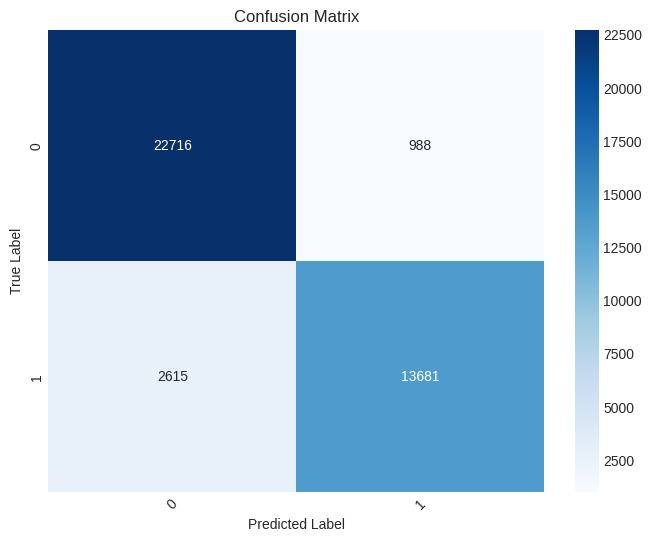

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9109
Precision: 0.9127909537534233
Recall (TPR): 0.9109
False Positive Rate (FPR): 0.10029975284676096
F1 score (F-measure): 0.9099752635465626
Specificity: 0.899700247153239
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9109,0.895143,0.961714,0.162314,0.927236,5677,665,3432,226
1,1,0.9109,0.938218,0.837686,0.038286,0.885106,3432,226,5677,665


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


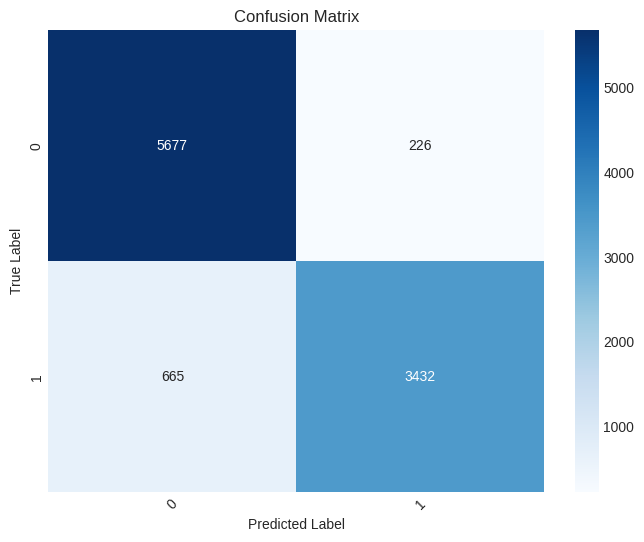

In [ ]:
print("Parameter Tuned Random Forest performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
rf_cnn_result_1 = runclassifier(model_rf,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

Random Forest performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.985875
Precision: 0.9858754645449157
Recall (TPR): 0.985875
False Positive Rate (FPR): 0.01515886449983439
F1 score (F-measure): 0.9858673620847364
Specificity: 0.9848411355001656
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.985875,0.985807,0.990424,0.020741,0.988110,23477,338,15958,227
1,1,0.985875,0.985975,0.979259,0.009576,0.982605,15958,227,23477,338


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


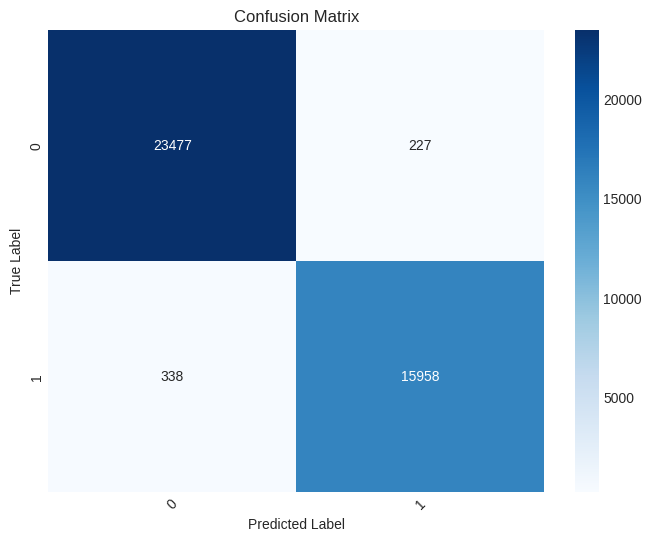

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9856
Precision: 0.9855995932544777
Recall (TPR): 0.9856
False Positive Rate (FPR): 0.015370902902596129
F1 score (F-measure): 0.9855929027938642
Specificity: 0.9846290970974039
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9856,0.985664,0.990005,0.020747,0.98783,5844,85,4012,59
1,1,0.9856,0.985507,0.979253,0.009995,0.98237,4012,59,5844,85


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


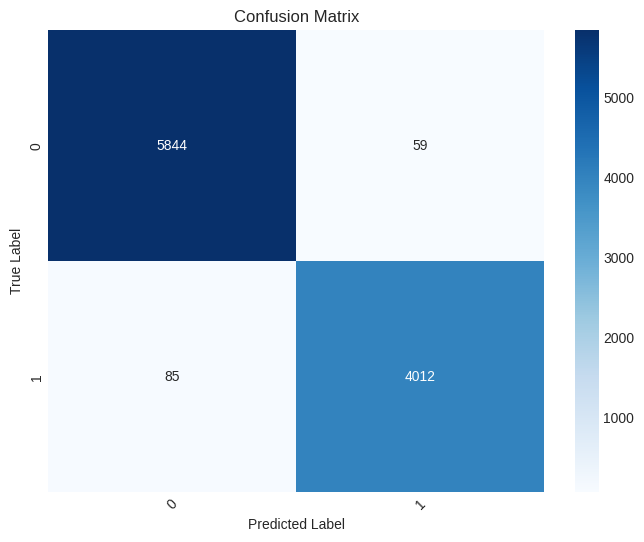

In [ ]:
print("Random Forest performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = RandomForestClassifier()
rf_cnn_result_2 = runclassifier(model,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

XGBoost

In [ ]:
def objective_xgb(trial):
    n_estimators = trial.suggest_categorical("n_estimators",[180])
    reg_alpha = trial.suggest_int('reg_alpha', 1,9)
    reg_lambda = trial.suggest_int('reg_lambda', 0,1)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.5,1, log=True)
    max_depth = trial.suggest_int('max_depth', 3, 18, 1)
    min_child_weight= trial.suggest_int('min_child_weight', 0, 10, 1)
    learning_rate = trial.suggest_float("learning_rate", 0.001, 1.0, log=True)
    subsample = trial.suggest_int("subsample", 0.7, 1.0)
    model = XGBClassifier(n_estimators=n_estimators, reg_alpha = reg_alpha, reg_lambda = reg_lambda, colsample_bytree = colsample_bytree, max_depth = max_depth, min_child_weight = min_child_weight, learning_rate=learning_rate, random_state=1)
    model.fit(X_train_selected_cnn_ga, y_train_cnn_ga)
    y_pred = model.predict(X_test_selected_cnn_ga)
    return accuracy_score(y_test_cnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_xgb = optuna.create_study(direction="maximize", sampler=sampler)
study_xgb.optimize(objective_xgb, n_trials=100)

print("Number of finished trials: ", len(study_xgb.trials))
print("Best trial:")
trial = study_xgb.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-29 16:15:10,748] A new study created in memory with name: no-name-e85f6cbc-7d64-46c2-b693-cd34fda19c9a
[I 2024-03-29 16:15:56,680] Trial 0 finished with value: 0.9219 and parameters: {'n_estimators': 180, 'reg_alpha': 4, 'reg_lambda': 1, 'colsample_bytree': 0.5000396408623998, 'max_depth': 7, 'min_child_weight': 1, 'learning_rate': 0.0018924123965722254, 'subsample': 0}. Best is trial 0 with value: 0.9219.
[I 2024-03-29 16:16:09,787] Trial 1 finished with value: 0.9691 and parameters: {'n_estimators': 180, 'reg_alpha': 4, 'reg_lambda': 0, 'colsample_bytree': 0.7263902453474428, 'max_depth': 9, 'min_child_weight': 7, 'learning_rate': 0.004105412016858891, 'subsample': 1}. Best is trial 1 with value: 0.9691.
[I 2024-03-29 16:16:30,227] Trial 2 finished with value: 0.9767 and parameters: {'n_estimators': 180, 'reg_alpha': 1, 'reg_lambda': 1, 'colsample_bytree': 0.6677152068759228, 'max_depth': 11, 'min_child_weight': 1, 'learning_rate': 0.003929203002623947, 'subsample': 1}. Be

Number of finished trials:  100
Best trial:
  Value:  0.9861
  Params: 
    n_estimators: 180
    reg_alpha: 8
    reg_lambda: 0
    colsample_bytree: 0.9514845245638794
    max_depth: 10
    min_child_weight: 3
    learning_rate: 0.38990809167716367
    subsample: 1


In [ ]:
model_xgb = XGBClassifier(n_estimators= trial.params['n_estimators'], reg_alpha = trial.params['reg_alpha'], reg_lambda = trial.params['reg_lambda'], colsample_bytree = trial.params['colsample_bytree'], max_depth = trial.params['max_depth'], min_child_weight = trial.params['min_child_weight'], learning_rate= trial.params['learning_rate'], random_state=1)

In [ ]:
with open('xgb_cnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_xgb, f)

In [ ]:
with open('/content/drive/MyDrive/CNN_NEW/xgb_cnn_ga_results.pkl', 'rb') as f:
    model_xgb = pickle.load(f)

Parameter Tuned XGBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.984125
Precision: 0.984121843959715
Recall (TPR): 0.984125
False Positive Rate (FPR): 0.01689430856525198
F1 score (F-measure): 0.9841176699324411
Specificity: 0.983105691434748
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.984125,0.984663,0.988610,0.022398,0.986632,23434,365,15931,270
1,1,0.984125,0.983334,0.977602,0.011390,0.980460,15931,270,23434,365


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


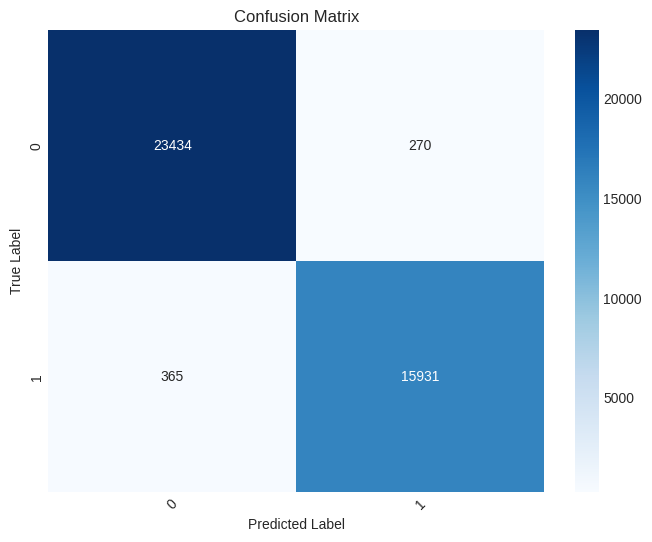

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9846
Precision: 0.9846052830635221
Recall (TPR): 0.9846
False Positive Rate (FPR): 0.016591308077114064
F1 score (F-measure): 0.9845894292916719
Specificity: 0.9834086919228859
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9846,0.984004,0.990005,0.023188,0.986995,5844,95,4002,59
1,1,0.9846,0.985472,0.976812,0.009995,0.981123,4002,59,5844,95


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


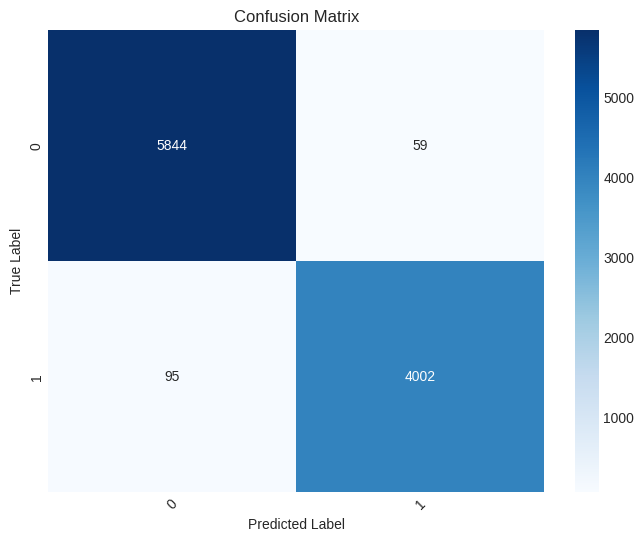

In [ ]:
print("Parameter Tuned XGBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
xgb_cnn_result_1 = runclassifier(model_xgb,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

XGBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.985
Precision: 0.9849961474750533
Recall (TPR): 0.985
False Positive Rate (FPR): 0.01587795874201059
F1 score (F-measure): 0.984994768043721
Specificity: 0.9841220412579894
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.985,0.985868,0.988863,0.020619,0.987363,23440,336,15960,264
1,1,0.985,0.983728,0.979381,0.011137,0.981550,15960,264,23440,336


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


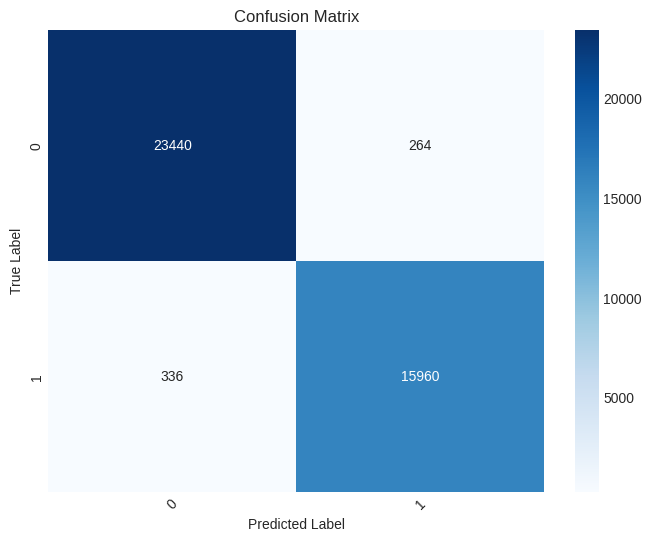

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9846
Precision: 0.9845965097005057
Recall (TPR): 0.9846
False Positive Rate (FPR): 0.016292605485864975
F1 score (F-measure): 0.9845941819294705
Specificity: 0.983707394514135
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9846,0.985311,0.988650,0.021235,0.986978,5836,87,4010,67
1,1,0.9846,0.983566,0.978765,0.011350,0.981160,4010,67,5836,87


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


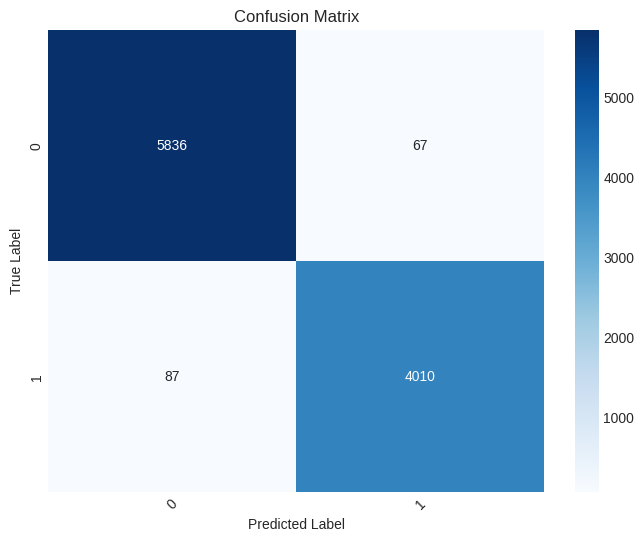

In [ ]:
print("XGBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = XGBClassifier()
xgb_cnn_result_2 = runclassifier(model,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

ExtraTrees

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

In [ ]:
def objective(trial):
    n_estimators = trial.suggest_int('n_estimators', 50, 120)
    max_depth = trial.suggest_int('max_depth', 10, 16)
    max_leaf_nodes = trial.suggest_int('max_leaf_nodes', 15, 25)
    criterion = trial.suggest_categorical('criterion', ['gini', 'entropy'])
    model = ExtraTreesClassifier(n_estimators = n_estimators,max_depth = max_depth,max_leaf_nodes = max_leaf_nodes,criterion = criterion, random_state = 1) # do not tune the seed
    model.fit(X_train_selected_cnn_ga, y_train_cnn_ga)
    y_pred = model.predict(X_test_selected_cnn_ga)
    return accuracy_score(y_test_cnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study = optuna.create_study(direction="maximize", sampler=sampler)
study.optimize(objective, n_trials=100)

print("Number of finished trials: ", len(study.trials))
print("Best trial:")
trial = study.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-29 17:29:37,343] A new study created in memory with name: no-name-4330f63a-13f9-4d64-acda-cb7392ffd734
[I 2024-03-29 17:29:39,877] Trial 0 finished with value: 0.8482 and parameters: {'n_estimators': 79, 'max_depth': 15, 'max_leaf_nodes': 15, 'criterion': 'gini'}. Best is trial 0 with value: 0.8482.
[I 2024-03-29 17:29:41,414] Trial 1 finished with value: 0.8518 and parameters: {'n_estimators': 56, 'max_depth': 11, 'max_leaf_nodes': 18, 'criterion': 'entropy'}. Best is trial 1 with value: 0.8518.
[I 2024-03-29 17:29:43,510] Trial 2 finished with value: 0.8501 and parameters: {'n_estimators': 79, 'max_depth': 14, 'max_leaf_nodes': 17, 'criterion': 'gini'}. Best is trial 1 with value: 0.8518.
[I 2024-03-29 17:29:47,571] Trial 3 finished with value: 0.8694 and parameters: {'n_estimators': 97, 'max_depth': 12, 'max_leaf_nodes': 21, 'criterion': 'entropy'}. Best is trial 3 with value: 0.8694.
[I 2024-03-29 17:29:51,514] Trial 4 finished with value: 0.8685 and parameters: {'n_esti

Number of finished trials:  100
Best trial:
  Value:  0.8857
  Params: 
    n_estimators: 85
    max_depth: 14
    max_leaf_nodes: 25
    criterion: gini


In [ ]:
model_et = ExtraTreesClassifier(n_estimators = trial.params['n_estimators'],max_depth = trial.params['max_depth'],max_leaf_nodes = trial.params['max_leaf_nodes'],criterion = trial.params['criterion'], random_state = 1)

In [ ]:
with open('et_cnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_et, f)

In [ ]:
with open('/content/drive/MyDrive/CNN_NEW/et_cnn_ga_results.pkl', 'rb') as f:
    model_et = pickle.load(f)

Parameter Tuned ExtraTrees performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.883475
Precision: 0.8844215092715871
Recall (TPR): 0.883475
False Positive Rate (FPR): 0.1286847535079596
F1 score (F-measure): 0.8823084324643571
Specificity: 0.8713152464920404
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.883475,0.875202,0.936973,0.194342,0.905035,22210,3167,13129,1494
1,1,0.883475,0.897832,0.805658,0.063027,0.849251,13129,1494,22210,3167


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


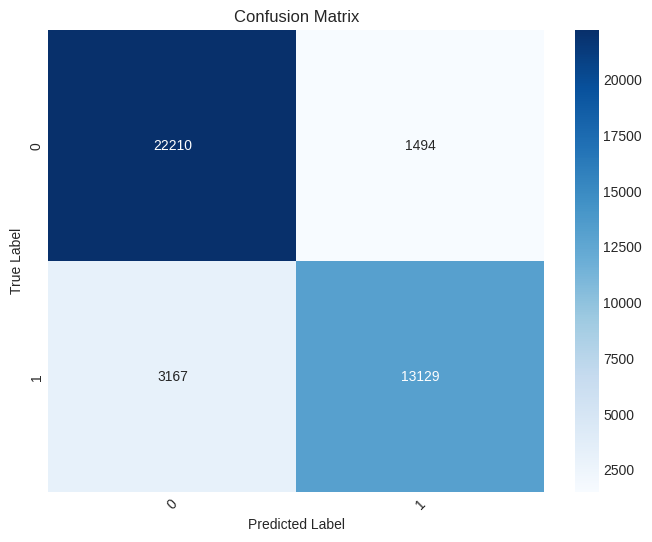

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8857
Precision: 0.8876334758593193
Recall (TPR): 0.8857
False Positive Rate (FPR): 0.12746953214962375
F1 score (F-measure): 0.8843115588918117
Specificity: 0.8725304678503762
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8857,0.871759,0.945451,0.200391,0.907111,5581,821,3276,322
1,1,0.8857,0.910506,0.799609,0.054549,0.851462,3276,322,5581,821


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


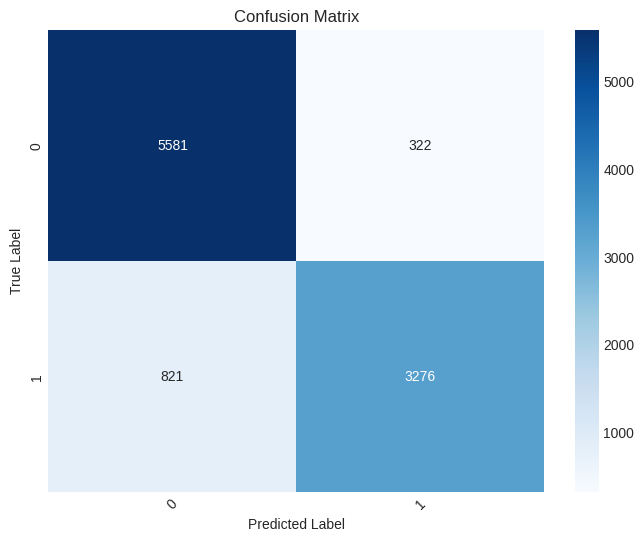

In [ ]:
print("Parameter Tuned ExtraTrees performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
et_cnn_result_1 = runclassifier(model_et,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

Extra Trees performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.98605
Precision: 0.9860487525676938
Recall (TPR): 0.98605
False Positive Rate (FPR): 0.014905732308684971
F1 score (F-measure): 0.9860434900421041
Specificity: 0.985094267691315
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.98605,0.986261,0.990255,0.020066,0.988254,23473,327,15969,231
1,1,0.98605,0.985741,0.979934,0.009745,0.982829,15969,231,23473,327


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


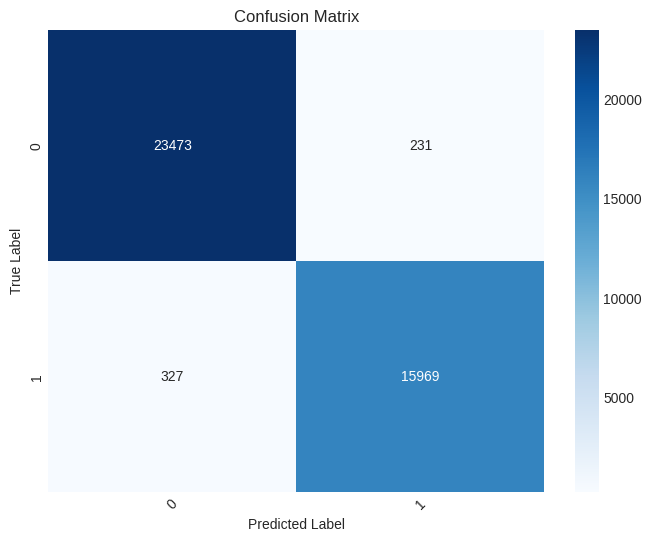

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.985
Precision: 0.9849968154806237
Recall (TPR): 0.985
False Positive Rate (FPR): 0.015879119063870073
F1 score (F-measure): 0.9849943330481857
Specificity: 0.9841208809361299
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.985,0.985649,0.988989,0.020747,0.987316,5838,85,4012,65
1,1,0.985,0.984057,0.979253,0.011011,0.981649,4012,65,5838,85


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


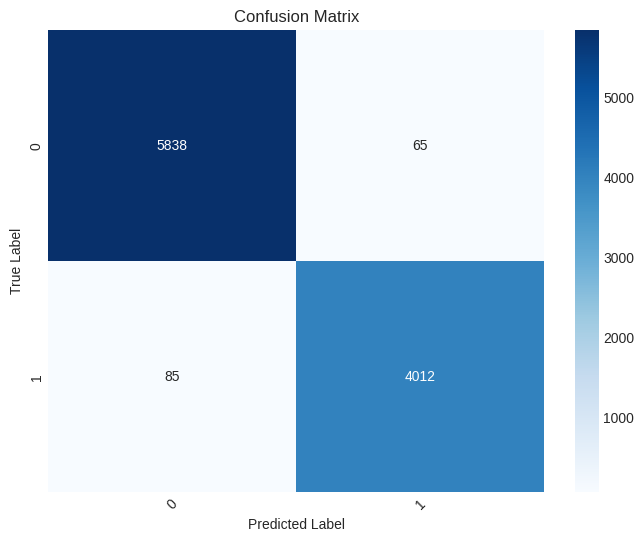

In [ ]:
print("Extra Trees performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = ExtraTreesClassifier()
et_cnn_result_2 = runclassifier(model,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

AdaBoost Classifier

In [ ]:
def objective_adb(trial):
    n_estimators = trial.suggest_int("n_estimators", 50, 500)
    learning_rate = trial.suggest_float("learning_rate", 0.001, 1.0, log=True)
    model = AdaBoostClassifier(n_estimators=n_estimators, learning_rate=learning_rate, random_state=1)
    model.fit(X_train_selected_cnn_ga, y_train_cnn_ga)
    y_pred = model.predict(X_test_selected_cnn_ga)
    return accuracy_score(y_test_cnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_adb = optuna.create_study(direction="maximize", sampler=sampler)
study_adb.optimize(objective_adb, n_trials=100)

print("Number of finished trials: ", len(study_adb.trials))
print("Best trial:")
trial_adb = study_adb.best_trial
print("  Value: ", trial_adb.value)
print("  Params: ")
for key, value in trial_adb.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-29 17:42:32,183] A new study created in memory with name: no-name-ba1715a9-5741-4435-ab08-3986b0f5373c
[I 2024-03-29 17:43:24,601] Trial 0 finished with value: 0.902 and parameters: {'n_estimators': 238, 'learning_rate': 0.14486833887239342}. Best is trial 0 with value: 0.902.
[I 2024-03-29 17:43:34,591] Trial 1 finished with value: 0.8154 and parameters: {'n_estimators': 50, 'learning_rate': 0.008072307884499755}. Best is trial 0 with value: 0.902.
[I 2024-03-29 17:44:00,406] Trial 2 finished with value: 0.8145 and parameters: {'n_estimators': 116, 'learning_rate': 0.0018924123965722254}. Best is trial 0 with value: 0.902.
[I 2024-03-29 17:44:29,734] Trial 3 finished with value: 0.8384 and parameters: {'n_estimators': 134, 'learning_rate': 0.010881335003635882}. Best is trial 0 with value: 0.902.
[I 2024-03-29 17:45:21,750] Trial 4 finished with value: 0.8638 and parameters: {'n_estimators': 228, 'learning_rate': 0.04134759007834719}. Best is trial 0 with value: 0.902.
[I 2

Number of finished trials:  100
Best trial:
  Value:  0.9713
  Params: 
    n_estimators: 496
    learning_rate: 0.9858645025110457


In [ ]:
model_adb = AdaBoostClassifier(n_estimators=trial_adb.params["n_estimators"], learning_rate=trial_adb.params["learning_rate"], random_state=1)

In [ ]:
with open('adb_cnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_adb, f)

In [ ]:
with open('/content/drive/MyDrive/CNN_NEW/adb_cnn_ga_results.pkl', 'rb') as f:
    model_adb = pickle.load(f)

Parameter tuned AdaBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.968075
Precision: 0.9680627425146591
Recall (TPR): 0.968075
False Positive Rate (FPR): 0.03403216043194157
F1 score (F-measure): 0.9680430137134932
Specificity: 0.9659678395680584
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.968075,0.969047,0.977346,0.045410,0.973178,23167,740,15556,537
1,1,0.968075,0.966631,0.954590,0.022654,0.960573,15556,537,23167,740


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


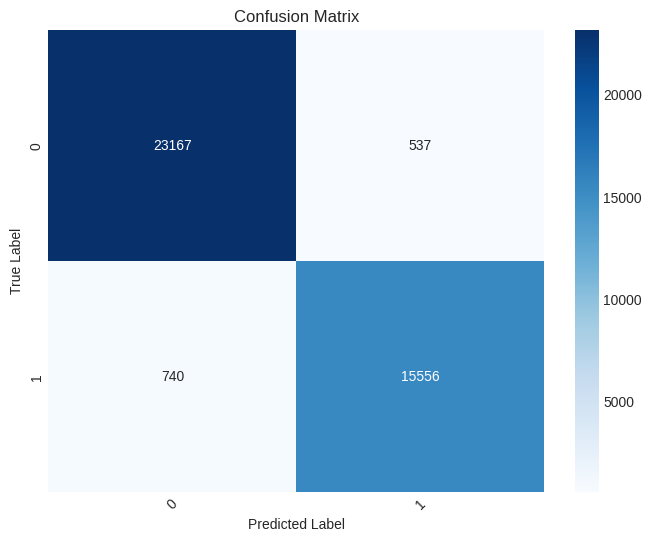

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9713
Precision: 0.9713157648041697
Recall (TPR): 0.9713
False Positive Rate (FPR): 0.030918467878989553
F1 score (F-measure): 0.9712626746619931
Specificity: 0.9690815321210104
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9713,0.970352,0.981365,0.043202,0.975828,5793,177,3920,110
1,1,0.9713,0.972705,0.956798,0.018635,0.964686,3920,110,5793,177


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


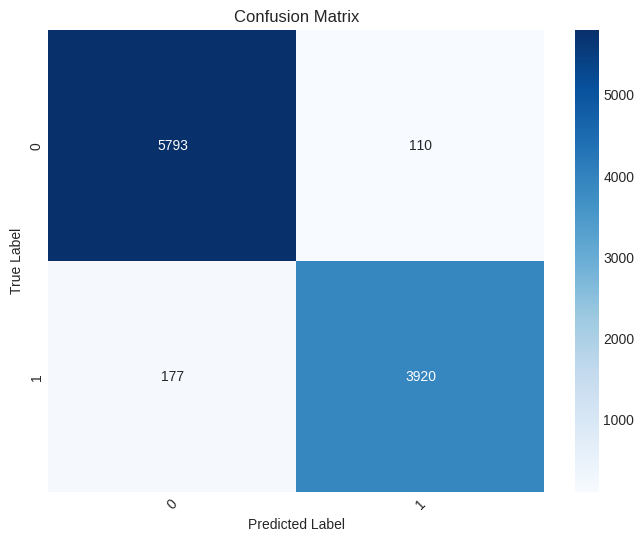

In [ ]:
print("Parameter tuned AdaBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
adb_cnn_result_1 = runclassifier(model_adb,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

AdaBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.910925
Precision: 0.9108667919444019
Recall (TPR): 0.910925
False Positive Rate (FPR): 0.09573384912033223
F1 score (F-measure): 0.9105805057391227
Specificity: 0.9042661508796678
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.910925,0.912168,0.940221,0.131689,0.925982,22287,2146,14150,1417
1,1,0.910925,0.908974,0.868311,0.059779,0.888178,14150,1417,22287,2146


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


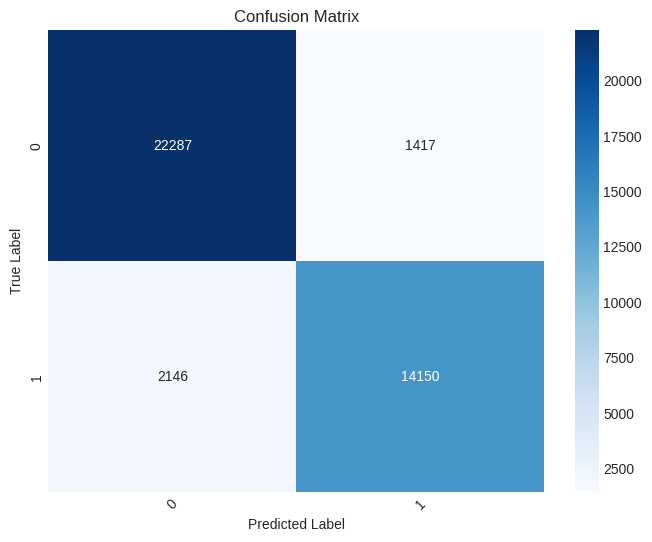

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9127
Precision: 0.9126164426335887
Recall (TPR): 0.9127
False Positive Rate (FPR): 0.09324910642483064
F1 score (F-measure): 0.9124124049401756
Specificity: 0.9067508935751694
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9127,0.914743,0.939692,0.126190,0.927049,5547,517,3580,356
1,1,0.9127,0.909553,0.873810,0.060308,0.891323,3580,356,5547,517


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


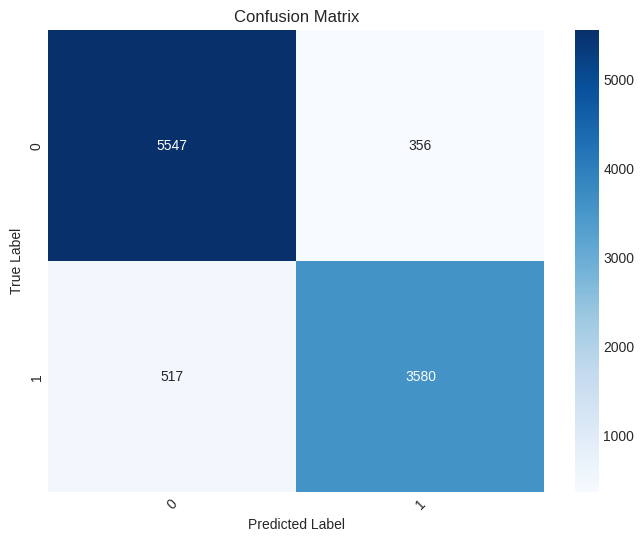

In [ ]:
print("AdaBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = AdaBoostClassifier()
adb_cnn_result_2 = runclassifier(model,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

Gradient Boosting Classifier

In [ ]:
def objective_gradient(trial):
    n_estimators = trial.suggest_int("n_estimators", 50, 500)
    learning_rate = trial.suggest_float("learning_rate", 0.001, 1.0, log=True)
    subsample = trial.suggest_float("subsample", 0.5, 1.0, log=True)
    max_depth = trial.suggest_int("max_depth", 1, 10)
    model = GradientBoostingClassifier(learning_rate=learning_rate, n_estimators=n_estimators, subsample=subsample, max_depth=max_depth, random_state=1)
    model.fit(X_train_selected_cnn_ga, y_train_cnn_ga)
    y_pred = model.predict(X_test_selected_cnn_ga)
    return accuracy_score(y_test_cnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_new = optuna.create_study(direction="maximize", sampler=sampler)
study_new.optimize(objective_gradient, n_trials=100)

print("Number of finished trials: ", len(study_new.trials))
print("Best trial:")
trial_new = study_new.best_trial
print("  Value: ", trial_new.value)
print("  Params: ")
for key, value in trial_new.params.items():
    print("    {}: {}".format(key, value))


[I 2024-03-31 08:57:41,140] A new study created in memory with name: no-name-4107ad5f-50d1-4e7b-b895-27d00ee513cc
[I 2024-03-31 08:58:48,982] Trial 0 finished with value: 0.9806 and parameters: {'n_estimators': 238, 'learning_rate': 0.14486833887239342, 'subsample': 0.5000396408623998, 'max_depth': 4}. Best is trial 0 with value: 0.9806.
[I 2024-03-31 08:59:24,477] Trial 1 finished with value: 0.8345 and parameters: {'n_estimators': 116, 'learning_rate': 0.0018924123965722254, 'subsample': 0.5689052151487055, 'max_depth': 4}. Best is trial 0 with value: 0.9806.
[I 2024-03-31 09:01:40,012] Trial 2 finished with value: 0.9838 and parameters: {'n_estimators': 228, 'learning_rate': 0.04134759007834719, 'subsample': 0.6685903857355362, 'max_depth': 7}. Best is trial 2 with value: 0.9838.
[I 2024-03-31 09:02:51,692] Trial 3 finished with value: 0.9809 and parameters: {'n_estimators': 142, 'learning_rate': 0.43087600478391286, 'subsample': 0.5095824839077406, 'max_depth': 7}. Best is trial 2 

In [ ]:
from optuna.trial import FrozenTrial
# Resuming the optimization process
study_new_df = pd.read_csv('/content/cnn_gb.csv')

# Create a new study with the same parameters as the original study
sampler = optuna.samplers.TPESampler(seed=1)
study_gradient = optuna.create_study(direction="maximize", sampler=sampler)

# Restore the trials from the loaded study state
for index, row in study_new_df.iterrows():
    trial = FrozenTrial(number=row['number'],value=row['value'],state=row['state'],datetime_start=row['datetime_start'],datetime_complete=row['datetime_complete'],
        params={
            "learning_rate": row['params_learning_rate'],
            "max_depth": row['params_max_depth'],
            "n_estimators": row['params_n_estimators'],
            "subsample": row['params_subsample']
        },
        distributions={},  user_attrs={}, system_attrs={}, intermediate_values={},  trial_id=0
    )
    study_gradient._storage.create_new_trial(study_gradient._study_id, template_trial=trial)

# Continue the optimization
study_gradient.optimize(objective_gradient, n_trials=6) # 6 trials remaining

print("Number of finished trials: ", len(study_gradient.trials))
print("Best trial:")
trial_gradient = study_gradient.best_trial
print("  Value: ", trial_gradient.value)
print("  Params: ")
for key, value in trial_gradient.params.items():
    print("    {}: {}".format(key, value))


[I 2024-03-31 17:59:31,137] A new study created in memory with name: no-name-65cc51dc-4b9a-4322-b71f-1b49a4bdd656
[I 2024-03-31 18:01:09,809] Trial 94 finished with value: 0.9806 and parameters: {'n_estimators': 238, 'learning_rate': 0.14486833887239342, 'subsample': 0.5000396408623998, 'max_depth': 4}. Best is trial 94 with value: 0.9806.
[I 2024-03-31 18:01:59,251] Trial 95 finished with value: 0.8345 and parameters: {'n_estimators': 116, 'learning_rate': 0.0018924123965722254, 'subsample': 0.5689052151487055, 'max_depth': 4}. Best is trial 94 with value: 0.9806.
[I 2024-03-31 18:05:06,288] Trial 96 finished with value: 0.9838 and parameters: {'n_estimators': 228, 'learning_rate': 0.04134759007834719, 'subsample': 0.6685903857355362, 'max_depth': 7}. Best is trial 96 with value: 0.9838.
[I 2024-03-31 18:06:44,344] Trial 97 finished with value: 0.9809 and parameters: {'n_estimators': 142, 'learning_rate': 0.43087600478391286, 'subsample': 0.5095824839077406, 'max_depth': 7}. Best is t

Number of finished trials:  100
Best trial:
  Value:  0.9838
  Params: 
    n_estimators: 228
    learning_rate: 0.04134759007834719
    subsample: 0.6685903857355362
    max_depth: 7


In [ ]:
model_gradient =  GradientBoostingClassifier(n_estimators=trial_gradient.params["n_estimators"], learning_rate=trial_gradient.params["learning_rate"], subsample = trial_gradient.params['subsample'], max_depth = trial_gradient.params['max_depth'],random_state=1)

In [ ]:
filename = "cnn_ga_gradboost_model.pkl"
pickle.dump(model_gradient, open(filename, "wb"))

In [ ]:
with open('/content/drive/MyDrive/CNN_NEW/cnn_ga_gradboost_model.pkl', 'rb') as f:
    model_gradient = pickle.load(f)

Parameter Tuned GradientBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.982825
Precision: 0.9828221137019857
Recall (TPR): 0.982825
False Positive Rate (FPR): 0.018317192104686297
F1 score (F-measure): 0.9828157128357768
Specificity: 0.9816828078953137
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.982825,0.983246,0.987850,0.024485,0.985543,23416,399,15897,288
1,1,0.982825,0.982206,0.975515,0.012150,0.978849,15897,288,23416,399


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


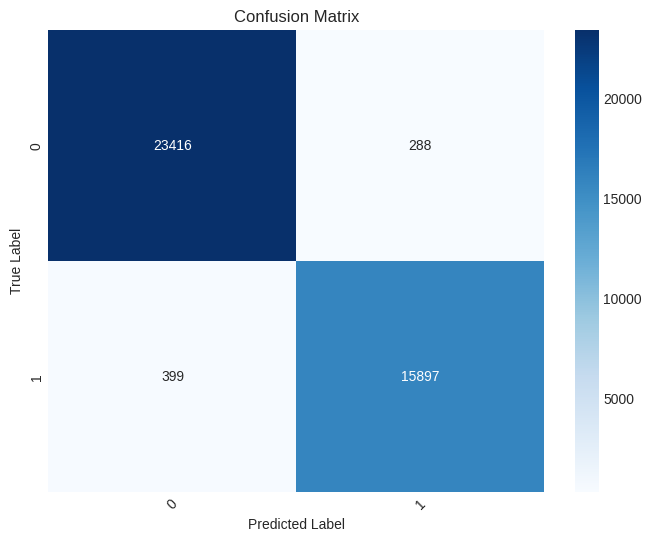

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9831
Precision: 0.9831098336848774
Recall (TPR): 0.9831
False Positive Rate (FPR): 0.018272564543266423
F1 score (F-measure): 0.983086087682552
Specificity: 0.9817274354567336
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9831,0.982173,0.989327,0.025873,0.985737,5840,106,3991,63
1,1,0.9831,0.984460,0.974127,0.010673,0.979266,3991,63,5840,106


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


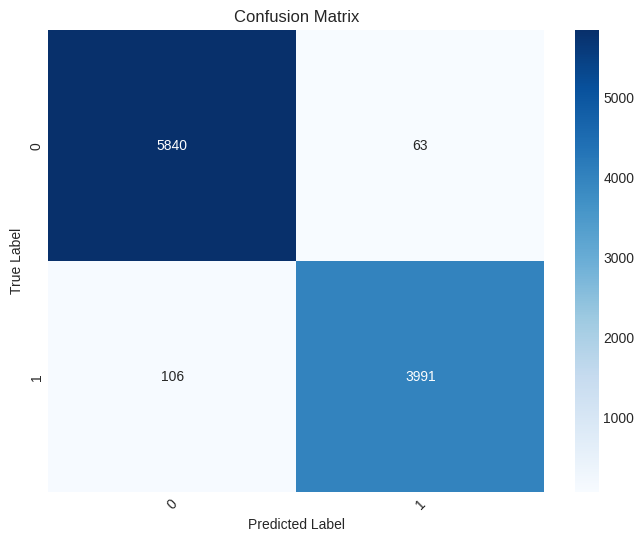

In [ ]:
print("Parameter Tuned GradientBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
gradboost_cnn_result_1 = runclassifier(model_gradient,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

GradientBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9514
Precision: 0.9515486052761769
Recall (TPR): 0.9514
False Positive Rate (FPR): 0.053231571810801626
F1 score (F-measure): 0.9512463153789862
Specificity: 0.9467684281891984
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9514,0.947552,0.971777,0.078240,0.959512,23035,1275,15021,669
1,1,0.9514,0.957361,0.921760,0.028223,0.939223,15021,669,23035,1275


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


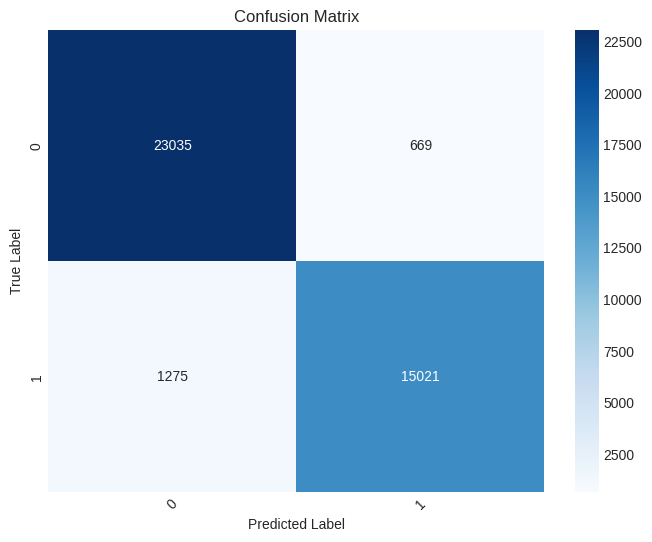

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9489
Precision: 0.9492072167233099
Recall (TPR): 0.9489
False Positive Rate (FPR): 0.056351314768978256
F1 score (F-measure): 0.9486993385178448
Specificity: 0.9436486852310217
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9489,0.942548,0.972726,0.085428,0.957399,5742,350,3747,161
1,1,0.9489,0.958802,0.914572,0.027274,0.936165,3747,161,5742,350


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


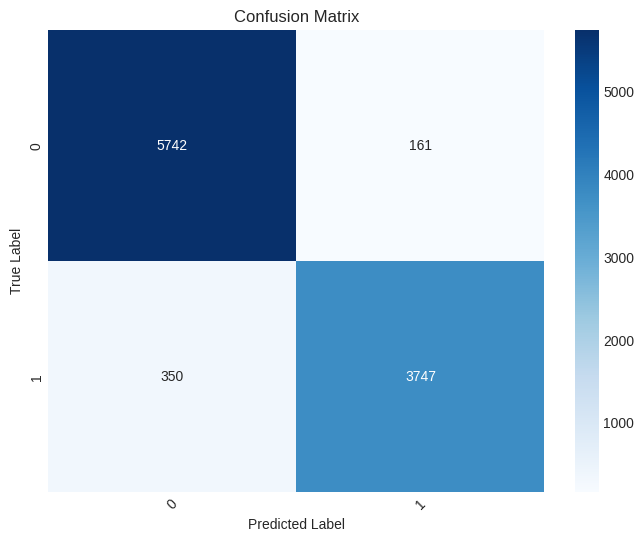

In [ ]:
print("GradientBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = GradientBoostingClassifier()
gradboost_cnn_result_2 = runclassifier(model,X_train_selected_cnn_ga, y_train_cnn_ga,X_test_selected_cnn_ga, y_test_cnn_ga)

In [ ]:
datasets_cnn = [
    (gb_cnn_result_1,"Tuned Dataset"),
    (lr_cnn_result_1,"Tuned Dataset"),
    (svc_cnn_result_1,"Tuned Dataset"),
    (rf_cnn_result_1,"Tuned Dataset"),
    (dt_cnn_result_1,"Tuned Dataset"),
    (et_cnn_result_1,"Tuned Dataset"),
    (xgb_cnn_result_1,"Tuned Dataset"),
    (gradboost_cnn_result_1,"Tuned Dataset"),
    (gb_cnn_result_2,"Original Dataset"),
    (lr_cnn_result_2,"Original Dataset"),
    (svc_cnn_result_2,"Original Dataset"),
    (rf_cnn_result_2,"Original Dataset"),
    (dt_cnn_result_2,"Original Dataset"),
    (et_cnn_result_2,"Original Dataset"),
    (xgb_cnn_result_2,"Original Dataset"),
    (gradboost_cnn_result_2,"Original Dataset"),
]

In [ ]:
import pickle
with open('Part2_FINAL_datasets_cnn.pkl', 'wb') as f:
    pickle.dump(datasets_cnn, f)

## RNN

### Feature Extraction Process

Importing Required Libraries

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

In [ ]:
pip install keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.9 MB/s eta 0:00:00


In [ ]:
import kerastuner
from kerastuner.tuners import GridSearch,RandomSearch
from kerastuner.engine.hyperparameters import HyperParameters
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import SGD, Adam
from typing import Tuple, Union

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.optimizers import SGD, Adam, RMSprop
from tensorflow.keras.layers import SimpleRNN, Masking, Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
# Creating copies of our dataframes
X_train_rnn = X_train_new_df.copy()
X_test_rnn = X_test_new_df.copy()
y_train_rnn = y_train_new_df.copy()
y_test_rnn = y_test_new_df.copy()

In [ ]:
# converting categorical labels into a one-hot encoded format
y_train_keras_rnn = keras.utils.to_categorical(y_train_rnn, 2)
y_test_keras_rnn = keras.utils.to_categorical(y_test_rnn, 2)

In [ ]:
# creating a validation set
X_train_cv_rnn, X_val_cv_rnn, y_train_cv_rnn, y_val_cv_rnn = train_test_split(X_train_rnn, y_train_keras_rnn, test_size=0.2, random_state=42)

In [ ]:
# Reshape the data to have a spatial dimension
X_train_reshaped_rnn = np.expand_dims(X_train_rnn, axis=-1)
# Convert labels to one-hot encoding
num_classes = 2
y_train_one_hot_rnn = tf.keras.utils.to_categorical(y_train_rnn, num_classes=num_classes)

Building the neural network

In [ ]:
import random

# Set a fixed random seed
np.random.seed(42)
tf.random.set_seed(42)
random.seed(42)

# Define the hyperparameter tuning function for RNN
def RNN_builder_Tuning(hp: HyperParameters):
    model = Sequential()
    # Add Masking layer
    model.add(Masking(mask_value=0.0))  # Assuming 0.0 is the padding value in your sequences
    # Add RNN layer with tunable hyperparameters
    model.add(SimpleRNN(units=hp.Int('units_rnn', min_value=16, max_value=64, step=16),
                        activation='relu', input_shape=(X_train_rnn.shape[1], 1),
                        kernel_initializer=tf.keras.initializers.GlorotUniform(seed=42)))  # Set the custom initializer
    model.add(Dropout(rate=hp.Float('dropout_rnn', min_value=0.2, max_value=0.5, step=0.1)))
    # Add batch normalization
    model.add(BatchNormalization())
    # Add dense layers with tunable hyperparameters
    model.add(Dense(units=hp.Int('dense_units', min_value=16, max_value=128, step=16),
                    activation='relu', kernel_regularizer=l2(0.01)))
    model.add(Dropout(rate=hp.Float('dropout_dense', min_value=0.2, max_value=0.5, step=0.1)))
    # Output layer
    model.add(Dense(2, activation='sigmoid'))

    # Compile the model with tunable hyperparameters
    optimizer_choice = hp.Choice('optimizer', values=['SGD', 'Adam', 'RMSprop'])
    learning_rate = hp.Float('learning_rate', min_value=1e-4, max_value=1e-1, sampling='log')

    if optimizer_choice == 'SGD':
        optimizer = SGD(learning_rate=learning_rate)
    elif optimizer_choice == 'Adam':
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer_choice == 'RMSprop':
        optimizer = RMSprop(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Create a RandomSearch tuner for RNN
tuner_rnn_01 = RandomSearch(
    RNN_builder_Tuning,
    objective='val_accuracy',
    max_trials=20,  # Number of hyperparameter combinations to try
    directory='/content/drive/MyDrive/ML_Project/',  # Directory to save the tuning results
    project_name='heart_disease_rnn_rand',
    seed=42
)

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Perform the hyperparameter search
tuner_rnn_01.search(x=X_train_reshaped_rnn, y=y_train_one_hot_rnn, epochs=50, validation_split = 0.2, callbacks=[early_stopping])

# Get the best hyperparameters
best_hps_rnn_01 = tuner_rnn_01.oracle.get_best_trials(num_trials=1)[0].hyperparameters
print("Best Hyperparameters:", best_hps_rnn_01.get_config()['values'])


Reloading Tuner from /content/drive/MyDrive/ML_Project/heart_disease_rnn_rand/tuner0.json
Best Hyperparameters: {'units_rnn': 64, 'dropout_rnn': 0.2, 'dense_units': 128, 'dropout_dense': 0.2, 'optimizer': 'Adam', 'learning_rate': 0.0004704965297508378}


In [ ]:
tuner_rnn_01.results_summary()

Results summary
Results in /content/drive/MyDrive/ML_Project/heart_disease_rnn_rand
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 02 summary
Hyperparameters:
units_rnn: 64
dropout_rnn: 0.2
dense_units: 128
dropout_dense: 0.2
optimizer: Adam
learning_rate: 0.0004704965297508378
Score: 0.972667396068573

Trial 00 summary
Hyperparameters:
units_rnn: 48
dropout_rnn: 0.2
dense_units: 64
dropout_dense: 0.2
optimizer: RMSprop
learning_rate: 0.001136419736136108
Score: 0.9684432744979858

Trial 14 summary
Hyperparameters:
units_rnn: 48
dropout_rnn: 0.2
dense_units: 128
dropout_dense: 0.30000000000000004
optimizer: Adam
learning_rate: 0.0008837014475882627
Score: 0.9674493670463562

Trial 07 summary
Hyperparameters:
units_rnn: 48
dropout_rnn: 0.2
dense_units: 112
dropout_dense: 0.2
optimizer: Adam
learning_rate: 0.0001750942941667167
Score: 0.9608647227287292

Trial 03 summary
Hyperparameters:
units_rnn: 32
dropout_rnn: 0.30000000000000004
dense_units: 128
dropou

In [ ]:
# Build the model with the optimal hyperparameters and train it on the data for 50 epochs
model_02 = tuner_rnn_01.hypermodel.build(best_hps_rnn_01)
# tuner.search(x=X_train_cv, y=y_train_cv, epochs=50, validation_data=(X_val_cv, y_val_cv))
history_02 = model_02.fit(X_train_reshaped_rnn, y_train_one_hot_rnn, epochs=50, validation_data=(X_test_rnn, y_test_keras_rnn))

val_acc_per_epoch = history_02.history['val_accuracy']
best_epoch = val_acc_per_epoch.index(max(val_acc_per_epoch)) + 1
print('Best epoch: %d' % (best_epoch,))

Epoch 1/50
1250/1250 [==============================] - 23s 15ms/step - loss: 0.5125 - accuracy: 0.8492 - val_loss: 0.2836 - val_accuracy: 0.8992
Epoch 2/50
1250/1250 [==============================] - 16s 13ms/step - loss: 0.2888 - accuracy: 0.8934 - val_loss: 0.2372 - val_accuracy: 0.9180
Epoch 3/50
1250/1250 [==============================] - 11s 9ms/step - loss: 0.2494 - accuracy: 0.9107 - val_loss: 0.2022 - val_accuracy: 0.9299
Epoch 4/50
1250/1250 [==============================] - 10s 8ms/step - loss: 0.2281 - accuracy: 0.9213 - val_loss: 0.2023 - val_accuracy: 0.9275
Epoch 5/50
1250/1250 [==============================] - 10s 8ms/step - loss: 0.2137 - accuracy: 0.9277 - val_loss: 0.1783 - val_accuracy: 0.9420
Epoch 6/50
1250/1250 [==============================] - 9s 7ms/step - loss: 0.2025 - accuracy: 0.9325 - val_loss: 0.1905 - val_accuracy: 0.9387
Epoch 7/50
1250/1250 [==============================] - 10s 8ms/step - loss: 0.1963 - accuracy: 0.9363 - val_loss: 0.1637 - val_a

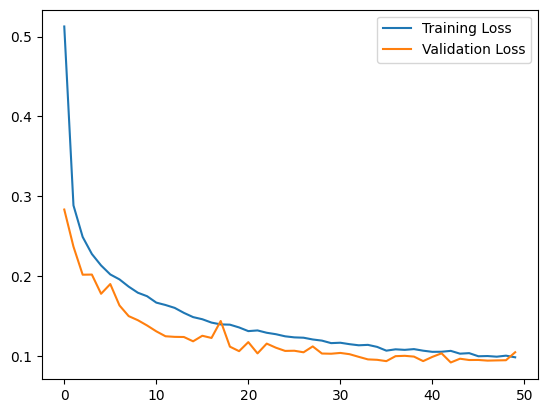

In [ ]:
plt.plot(history_02.history['loss'], label='Training Loss')
plt.plot(history_02.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

In [ ]:
hypermodel = tuner.hypermodel.build(best_hps)

# Retrain the model
history_hypermodel = hypermodel.fit(X_train_rnn, y_train_keras_rnn, epochs=best_epoch, validation_data=(X_test_rnn, y_test_keras_rnn))

Epoch 1/48
1250/1250 [==============================] - 4s 2ms/step - loss: 0.5505 - accuracy: 0.7825 - val_loss: 0.4334 - val_accuracy: 0.8374
Epoch 2/48
1250/1250 [==============================] - 3s 2ms/step - loss: 0.3943 - accuracy: 0.8471 - val_loss: 0.3786 - val_accuracy: 0.8423
Epoch 3/48
1250/1250 [==============================] - 3s 2ms/step - loss: 0.3643 - accuracy: 0.8496 - val_loss: 0.3596 - val_accuracy: 0.8475
Epoch 4/48
1250/1250 [==============================] - 4s 3ms/step - loss: 0.3491 - accuracy: 0.8523 - val_loss: 0.3460 - val_accuracy: 0.8509
Epoch 5/48
1250/1250 [==============================] - 3s 3ms/step - loss: 0.3368 - accuracy: 0.8545 - val_loss: 0.3344 - val_accuracy: 0.8537
Epoch 6/48
1250/1250 [==============================] - 3s 2ms/step - loss: 0.3264 - accuracy: 0.8596 - val_loss: 0.3242 - val_accuracy: 0.8590
Epoch 7/48
1250/1250 [==============================] - 3s 2ms/step - loss: 0.3178 - accuracy: 0.8619 - val_loss: 0.3157 - val_accuracy:

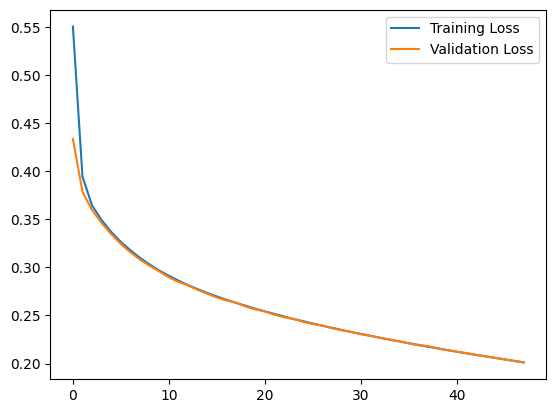

In [ ]:
plt.plot(history_hypermodel.history['loss'], label='Training Loss')
plt.plot(history_hypermodel.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

In [ ]:
eval_result = hypermodel.evaluate(X_test_rnn, y_test_keras_rnn)
print("[test loss, test accuracy]:", eval_result)

313/313 [==============================] - 1s 2ms/step - loss: 0.2011 - accuracy: 0.9269
[test loss, test accuracy]: [0.2010747492313385, 0.9269000291824341]


Extracting the Features

In [ ]:
model_rnn = RNN_builder_Tuning(best_hps_rnn_01)

In [ ]:
model_rnn = tuner_rnn_01.hypermodel.build(best_hps_rnn_01)

# Build the model explicitly
model_rnn.build(input_shape=(X_train_reshaped_rnn.shape))  # Specify the input shape
print(model_rnn.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 masking_1 (Masking)         (40000, 13, 1)            0         
                                                                 
 simple_rnn_1 (SimpleRNN)    (40000, 64)               4224      
                                                                 
 dropout_2 (Dropout)         (40000, 64)               0         
                                                                 
 batch_normalization_1 (Bat  (40000, 64)               256       
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (40000, 128)              8320      
                                                                 
 dropout_3 (Dropout)         (40000, 128)              0         
                                                      

In [ ]:
from keras.models import Model
intermediate_layer_model = Model(inputs=model_rnn.input, outputs=model_rnn.layers[-2].output)
model_rnn.trainable = False # freezes the weights of the pre-trained model, ensuring that they are not modified during feature extraction.

# Predict the features for the combined dataset X
X_combined_rnn = np.concatenate([X_train_rnn, X_test_rnn])
X_extracted_rnn = intermediate_layer_model.predict(X_combined_rnn)

1563/1563 [==============================] - 5s 3ms/step


In [ ]:
X_extracted_rnn_df= pd.DataFrame(X_extracted_rnn)

In [ ]:
X_extracted_rnn_df

,0,1,2,3,4,5,6,7,8,9,...,118,119,120,121,122,123,124,125,126,127
0,0.0,0.153616,0.0,0.009942,0.287217,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.373145,0.260160,0.0,0.0,0.208864,0.0,0.0,0.102817
1,0.0,0.208111,0.0,0.000000,0.036383,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.381185,0.005525,0.0,0.0,0.120091,0.0,0.0,0.046271
2,0.0,0.108948,0.0,0.000000,0.050200,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.232881,0.084453,0.0,0.0,0.100744,0.0,0.0,0.019169
3,0.0,0.119068,0.0,0.000000,0.403503,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.260899,0.287821,0.0,0.0,0.233859,0.0,0.0,0.204227
4,0.0,0.107021,0.0,0.000000,0.032675,0.0,0.0,0.001411,0.0,0.0,...,0.0,0.0,0.202517,0.065720,0.0,0.0,0.076071,0.0,0.0,0.028344
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0.0,0.308740,0.0,0.000000,0.117585,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.610018,0.092287,0.0,0.0,0.229484,0.0,0.0,0.110759
49996,0.0,0.090758,0.0,0.000000,0.204129,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.261466,0.131915,0.0,0.0,0.116131,0.0,0.0,0.096020
49997,0.0,0.122727,0.0,0.000000,0.049842,0.0,0.0,0.015856,0.0,0.0,...,0.0,0.0,0.243143,0.058659,0.0,0.0,0.085495,0.0,0.0,0.024906
49998,0.0,0.107021,0.0,0.000000,0.032675,0.0,0.0,0.001411,0.0,0.0,...,0.0,0.0,0.202517,0.065720,0.0,0.0,0.076071,0.0,0.0,0.028344


A total of 128 features were extracted

In [ ]:
# Check for outliers in the scaled data
outliers_extracted_rnn = detect_outliers_iqr(X_extracted_rnn)
outliers_extracted_rnn

Number of Outliers: 51356.13


array([0.6869168 , 0.7067924 , 0.57838565, ..., 0.8781698 , 0.6100179 ,
       0.5387073 ], dtype=float32)

Text(0.5, 0, 'Square Root-Transformed Values')

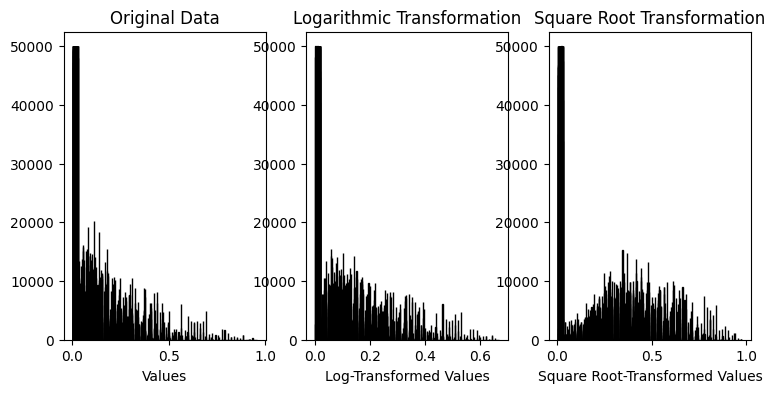

In [ ]:
# Plot the original data
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.title('Original Data')
plt.hist(X_extracted_rnn, bins=30, edgecolor='black')
plt.xlabel('Values')

# Logarithmic Transformation
log_transformed_data_rnn = np.log1p(X_extracted_rnn)

plt.subplot(1, 4, 2)
plt.title('Logarithmic Transformation')
plt.hist(log_transformed_data_rnn, bins=30, edgecolor='black')
plt.xlabel('Log-Transformed Values')

# Square Root Transformation
sqrt_transformed_data_rnn = np.sqrt(X_extracted_rnn)

plt.subplot(1, 4, 3)
plt.title('Square Root Transformation')
plt.hist(sqrt_transformed_data_rnn, bins=30, edgecolor='black')
plt.xlabel('Square Root-Transformed Values')


In [ ]:
print("After log root transformation", detect_outliers_iqr(log_transformed_data_rnn))
print("After square root transformation", detect_outliers_iqr(sqrt_transformed_data_rnn))

Number of Outliers: 18882.508
After log root transformation [0.5229025 0.5346158 0.5055395 ... 0.6350652 0.5036578 0.6302978]
Number of Outliers: 0.0
After square root transformation []


In [ ]:
log_transformed_data_rnn_df = pd.DataFrame(log_transformed_data_rnn)
sqrt_transformed_data_rnn_df = pd.DataFrame(sqrt_transformed_data_rnn)

Comparing between log transformation and square root transformation, we see square root transformation has resulted in lot less outliers compared to the log transformation so we choose the square root transformed data.

### Feature Selection

Importing required libraries

In [ ]:
!pip install deap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 2.2 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import random
import copy
from itertools import repeat
import shutil
import time
import math
import array

from sklearn.base import BaseEstimator
from sklearn.metrics import r2_score, mean_absolute_error

from joblib import Parallel, delayed, dump, load
from joblib.externals.loky import get_reusable_executor

from deap import algorithms
from deap import base
from deap import creator
from deap import tools
from tqdm.notebook import tqdm

plt.style.use('seaborn-v0_8-whitegrid')

In [ ]:
Y_rnn = np.concatenate([y_train_rnn,y_test_rnn])

In [ ]:
y_rnn_df = pd.DataFrame(Y_rnn)

Code reference : https://github.com/FlorinAndrei/fast_feature_selection/blob/main/feature_selection.ipynb

In [ ]:
# Define the fitness weights and other parameters
fitness_weights = -1.0
population_size = 100
n_gen = 100
n_jobs = os.cpu_count()

# Define the dataframes X_ga and y_ga
X_ga = sqrt_transformed_data_df.astype(float).copy()
y_ga = y_dnn_df.astype(float).copy()
X_features = X_ga.columns.to_list()[1:]


def evalMany(individuals):
    # - each individual is a list of feature selectors
    ind_list = [list(i) for i in list(individuals)]
    ret = []
    for ind in ind_list:
        cols_select = [i == 1 for i in list(ind)] + [False] # create a list of True/False feature selectors from each individual
        # fit model using the features selected from the individual
        lin_mod = sm.OLS(y_ga, X_ga.loc[:, cols_select], hasconst=True).fit()
        ret.append((lin_mod.bic,))
    return ret

# Define the custom selection function
def selElitistAndTournament(individuals, k_tournament, k_elitist=0, tournsize=3):
    return tools.selBest(individuals, k_elitist) + tools.selTournament(individuals, k_tournament, tournsize)

# multiprocess pool to evaluate individuals
def joblib_map(f, njobs, *iters):
    return Parallel(n_jobs=njobs)(delayed(f)(*args) for args in zip(*iters))

try:
    del creator.FitnessMax
    del creator.Individual
except Exception as e:
    pass

creator.create("FitnessMax", base.Fitness, weights=(fitness_weights,))
creator.create("Individual", array.array, typecode='b', fitness=creator.FitnessMax)

# Hyperparameters
population_size = 100
crossover_probability = 0.5
individual_mutation_probability = 0.2
gene_mutation_probability = 0.1
tournament_size = 3
elite_size = 0

try:
    del toolbox
except Exception as e:
    pass

toolbox = base.Toolbox()
toolbox.register("attr_bool", random.randint, 0, 1)
toolbox.register("individual", tools.initRepeat, creator.Individual, toolbox.attr_bool, len(X_features))
toolbox.register("population", tools.initRepeat, list, toolbox.individual)
toolbox.register("map_multi", joblib_map)
toolbox.register("evaluate", evalMany)
toolbox.register("mate", tools.cxTwoPoint)
toolbox.register("mutate", tools.mutFlipBit, indpb=gene_mutation_probability)
toolbox.register("select",selElitistAndTournament,k_tournament=population_size - elite_size,k_elitist=elite_size,tournsize=tournament_size,)

random.seed(42)
population = toolbox.population(n=population_size)
hall_of_fame = tools.HallOfFame(1)
objective_runs_ga = 0

# Evaluate the individuals with an invalid fitness
invalid_ind = [ind for ind in population if not ind.fitness.valid]
# split the population in a list with n_jobs elements where each element is an array containing multiple individuals
fitnesses_nested = toolbox.map_multi(
    toolbox.evaluate, n_jobs, np.array_split(invalid_ind, n_jobs) # send individuals to the evaluator
)
objective_runs_ga += len(invalid_ind)
fitnesses = []
for l in fitnesses_nested:
    fitnesses += l
for ind, fit in zip(invalid_ind, fitnesses):
    ind.fitness.values = fit

hall_of_fame.update(population)

n_gen = 100
best_objective_per_gen_ga = np.full(n_gen, np.nan)
best_objective_ga = np.nan
best_generation_ga = 0
gene_values_mean = np.zeros((n_gen, len(X_features)))
gene_maes = np.full(n_gen, np.nan)
time_to_best_ga = np.inf
# Begin the generational process
iterator = tqdm(range(1, n_gen + 1), desc='generation')
t_start = time.time()

for gen in iterator:
    t_start_loop = time.time()

    # Select the next generation of individuals
    offspring = toolbox.select(population)
    # Vary the pool of individuals via cross-over and mutation
    offspring = algorithms.varAnd(
        offspring,
        toolbox,
        crossover_probability,
        individual_mutation_probability,
    )
    # Evaluate the individuals with an invalid fitness
    invalid_ind = [ind for ind in offspring if not ind.fitness.valid]
    # split the population in a list with n_jobs elements
    # each element is an array containing multiple individuals
    # send list to the evaluator pool
    fitnesses_nested = toolbox.map_multi(
        toolbox.evaluate, n_jobs, np.array_split(invalid_ind, n_jobs)
    )
    objective_runs_ga += len(invalid_ind)
    fitnesses = []
    for l in fitnesses_nested:
        fitnesses += l
    for ind, fit in zip(invalid_ind, fitnesses):
        ind.fitness.values = fit
    # Update the hall of fame with the generated individuals
    hall_of_fame.update(offspring)
    # Replace the current population by the offspring
    population[:] = offspring

    t_end_loop = time.time()
    # record the mean gene values across the population
    gene_values_mean[gen - 1, :] = np.array(population).mean(axis=0)
    if gen >= 2:
        gene_maes[gen - 1] = mean_absolute_error(
            gene_values_mean[gen - 2, :], gene_values_mean[gen - 1, :]
        )
    # pick best individual for stats recording
    best_individual_ga = tools.selBest(population, 1)[0]
    best_objective_per_gen_ga[gen - 1] = best_individual_ga.fitness.values[0]
    if (
        best_objective_ga is np.nan
        or fitness_weights * best_individual_ga.fitness.values[0]
        > fitness_weights * best_objective_ga
    ):
        best_objective_ga = best_individual_ga.fitness.values[0]
        best_generation_ga = gen
        time_to_best_ga = t_end_loop - t_start
        print(
            f'gen: {gen:4n}, curr/prev gene MAE: {gene_maes[gen - 1]:.4f}, new best objective: {best_objective_ga:.4f}, time to best: {time_to_best_ga:.4f}'
        )

    if os.path.isfile('break'):
        # to gracefully break the loop, manually create a file called 'break'
        print(f'Found break file, stopping now.')
        iterator.close()
        break
g_completed_ga = gen

best_individual_ga = list(hall_of_fame[0])
best_features_ga = [
    X_features[i] for i, val in enumerate(best_individual_ga) if val == 1
]
best_objective_ga = (
    sm.OLS(y_ga, X_ga[best_features_ga], hasconst=True).fit().bic
)

generation:   0%|          | 0/100 [00:00<?, ?it/s]

gen:    1, curr/prev gene MAE: nan, new best objective: 30198.2980, time to best: 25.5167
gen:    2, curr/prev gene MAE: 0.0609, new best objective: 30092.7925, time to best: 46.0348
gen:    3, curr/prev gene MAE: 0.0590, new best objective: 30001.5517, time to best: 71.3939
gen:    4, curr/prev gene MAE: 0.0670, new best objective: 29153.4913, time to best: 98.0807
gen:    7, curr/prev gene MAE: 0.0519, new best objective: 28501.4902, time to best: 167.5656
gen:    8, curr/prev gene MAE: 0.0646, new best objective: 28417.2575, time to best: 193.3972
gen:    9, curr/prev gene MAE: 0.0820, new best objective: 28373.3697, time to best: 220.2966
gen:   11, curr/prev gene MAE: 0.0615, new best objective: 28277.3509, time to best: 281.5688
gen:   12, curr/prev gene MAE: 0.0506, new best objective: 28269.0327, time to best: 315.8884
gen:   13, curr/prev gene MAE: 0.0572, new best objective: 28205.2837, time to best: 337.2021
gen:   15, curr/prev gene MAE: 0.0309, new best objective: 28164.57

best objective:  30200.116226575443
best generation: 78
objective runs:  6130
time to best:    2490.850 sec
best features:   [1, 2, 3, 4, 5, 6, 8, 9, 10, 12, 13, 19, 20, 21, 23, 24, 29, 30, 31, 32, 34, 35, 36, 39, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 60, 62, 64, 65, 67, 68, 69, 70, 71, 72, 73, 76, 77, 78, 79, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 94, 95, 96, 98, 99, 100, 102, 107, 110, 112, 113, 115, 116, 117, 119, 121, 122, 123, 125, 126]


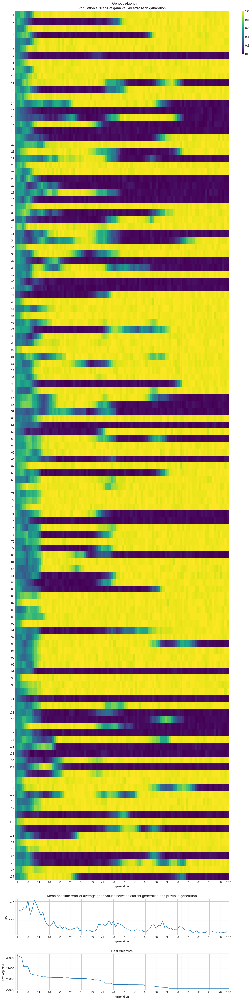

In [ ]:
# Print best objective, best generation, objective runs, and time to best
print(f'Best objective:  {best_objective_ga}')
print(f'Best generation: {best_generation_ga}')
print(f'Objective runs:  {objective_runs_ga}')
print(f'Time to best:    {time_to_best_ga:.3f} sec')

# Print best features
print(f'Best features:   {best_features_ga}')

# Create a DataFrame for the population average of gene values
gvm_df = pd.DataFrame(
    gene_values_mean[:g_completed_ga],
    columns=X_features,
    index=range(1, g_completed_ga + 1)
)

# Plotting
fig, ax = plt.subplots(
    3,
    1,
    sharex=True,
    height_ratios=[24, 1, 1],
    figsize=(12, 48),
    layout='constrained',
)
sns.heatmap(
    gvm_df.T,
    vmin=0.0,
    vmax=1.0,
    cmap='viridis',
    cbar=True,
    cbar_kws={'fraction': 0.01, 'anchor': (0.0, 1.0)},
    ax=ax[0]
)
ax[0].set_title('Population average of gene values after each generation')
ax[0].axvline(x=best_generation_ga, color='C7')
ax[0].set_xlabel('Generation')
ax[0].set_ylabel('Feature')
ax[0].set_xticks(range(1, g_completed_ga + 1, max(g_completed_ga // 20, 1)))
ax[0].tick_params(axis='both', reset=True)

ax[1].plot(range(2, g_completed_ga + 1), gene_maes[1:g_completed_ga])
ax[1].vlines(x=best_generation_ga, ymin=min(gene_maes), ymax=max(gene_maes), colors='C7')
ax[1].set_xlabel('Generation')
ax[1].set_ylabel('MAE')
ax[1].set_title('Mean absolute error of average gene values between current and previous generations')
ax[1].tick_params(axis='both', reset=True)

ax[2].plot(range(1, g_completed_ga + 1), best_objective_per_gen_ga[:g_completed_ga])
ax[2].vlines(x=best_generation_ga, ymin=min(best_objective_per_gen_ga), ymax=max(best_objective_per_gen_ga), colors='C7')
ax[2].set_xlabel('Generation')
ax[2].set_ylabel('Best Objective')
ax[2].set_title('Best objective')
ax[2].tick_params(axis='both', reset=True)

# Adjust layout and save/show the figure
#fig.tight_layout()
#fig.subplots_adjust(top=0.95)
fig.savefig('ga-performance.png')
plt.show()


In [ ]:
import pickle

# Save all the relevant values to a dictionary
results = {
    'best_objective': best_objective_ga,
    'best_generation': best_generation_ga,
    'objective_runs': objective_runs_ga,
    'time_to_best': time_to_best_ga,
    'best_features': best_features_ga,
    'gene_values_mean': gene_values_mean,
    'gene_maes': gene_maes,
    'best_objective_per_gen': best_objective_per_gen_ga
}

# Save the dictionary to a file
with open('rnn_ga_results.pkl', 'wb') as f:
    pickle.dump(results, f)


In [ ]:
import pickle

# Load the dictionary from the file
with open('/content/drive/MyDrive/RNN_NEW/rnn_ga_results.pkl', 'rb') as f:
    results_loaded = pickle.load(f)

# Access the individual values as needed
best_objective_loaded = results_loaded['best_objective']
best_generation_loaded = results_loaded['best_generation']
objective_runs_loaded = results_loaded['objective_runs']
time_to_best_loaded = results_loaded['time_to_best']
best_features_loaded = results_loaded['best_features']
gene_values_mean_loaded = results_loaded['gene_values_mean']
gene_maes_loaded = results_loaded['gene_maes']
best_objective_per_gen_loaded = results_loaded['best_objective_per_gen']


In [ ]:
# copy the original dataframes into local copies, once
X_ga_rnn = sqrt_transformed_data_rnn_df.astype(float).copy()
y_ga_rnn = y_rnn_df.astype(float).copy()

In [ ]:
selected_features_rnn_df = X_ga_rnn[best_features_loaded ]
X_train_selected_rnn_ga, X_test_selected_rnn_ga, y_train_rnn_ga, y_test_rnn_ga = train_test_split(selected_features_rnn_df, y_rnn_df, test_size=0.2, random_state=42)

In [ ]:
y_train_rnn_ga.columns = ['target']
y_test_rnn_ga.columns = ['target']

### Model Evaluation and ParameterTuning

Importing required libraries

In [ ]:
!pip3 install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.8/78.8 kB 10.5 MB/s eta 0:00:00


In [ ]:
import optuna
from optuna.samplers import TPESampler
import pickle

Gaussian Naive Bayes

In [ ]:
def objective_gnb(trial):
    var_smoothing = trial.suggest_float("var_smoothing", 1e-10, 1e-5, log=True)
    model = GaussianNB(var_smoothing=var_smoothing)
    model.fit(X_train_selected_rnn_ga, y_train_rnn_ga)
    y_pred = model.predict(X_test_selected_rnn_ga)
    return accuracy_score(y_test_rnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_gnb = optuna.create_study(direction="maximize", sampler=sampler)
study_gnb.optimize(objective_gnb, n_trials=100)

print("Number of finished trials: ", len(study_gnb.trials))
print("Best trial:")
trial = study_gnb.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-04-10 07:07:47,653] A new study created in memory with name: no-name-8ef08a1f-0185-4c97-ad98-7aa357e41df8
[I 2024-04-10 07:07:48,026] Trial 0 finished with value: 0.8006 and parameters: {'var_smoothing': 1.2164941464151851e-08}. Best is trial 0 with value: 0.8006.
[I 2024-04-10 07:07:48,338] Trial 1 finished with value: 0.8009 and parameters: {'var_smoothing': 3.995972283135059e-07}. Best is trial 1 with value: 0.8009.
[I 2024-04-10 07:07:48,560] Trial 2 finished with value: 0.7999 and parameters: {'var_smoothing': 1.0013176560941255e-10}. Best is trial 1 with value: 0.8009.
[I 2024-04-10 07:07:49,165] Trial 3 finished with value: 0.8006 and parameters: {'var_smoothing': 3.2483503450866807e-09}. Best is trial 1 with value: 0.8009.
[I 2024-04-10 07:07:49,390] Trial 4 finished with value: 0.7999 and parameters: {'var_smoothing': 5.417257182767975e-10}. Best is trial 1 with value: 0.8009.
[I 2024-04-10 07:07:49,791] Trial 5 finished with value: 0.7999 and parameters: {'var_smoothi

Number of finished trials:  100
Best trial:
  Value:  0.8012
  Params: 
    var_smoothing: 1.5154654336886287e-07


In [ ]:
model_gb = GaussianNB(var_smoothing = trial.params['var_smoothing'])

In [ ]:
with open('gb_rnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_gb, f)

Hypertuned Gaussian Naive Bayes performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.80205
Precision: 0.8037120425430536
Recall (TPR): 0.80205
False Positive Rate (FPR): 0.20167247219056295
F1 score (F-measure): 0.8026401344088989
Specificity: 0.798327527809437
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.80205,0.842965,0.818427,0.221772,0.830515,19400,3614,12682,4304
1,1,0.80205,0.746615,0.778228,0.181573,0.762094,12682,4304,19400,3614


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


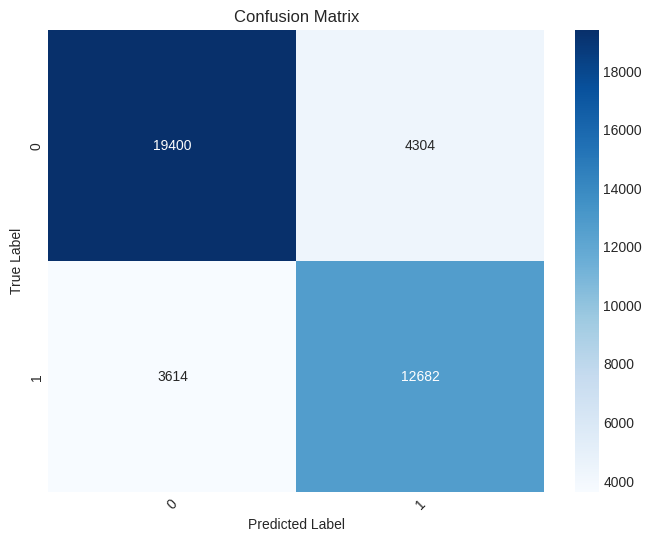

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8032
Precision: 0.8043567038436394
Recall (TPR): 0.8032
False Positive Rate (FPR): 0.20100836106759057
F1 score (F-measure): 0.8036411804941989
Specificity: 0.7989916389324094
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8032,0.840811,0.822294,0.224310,0.831449,4854,919,3178,1049
1,1,0.8032,0.751833,0.775690,0.177706,0.763575,3178,1049,4854,919


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


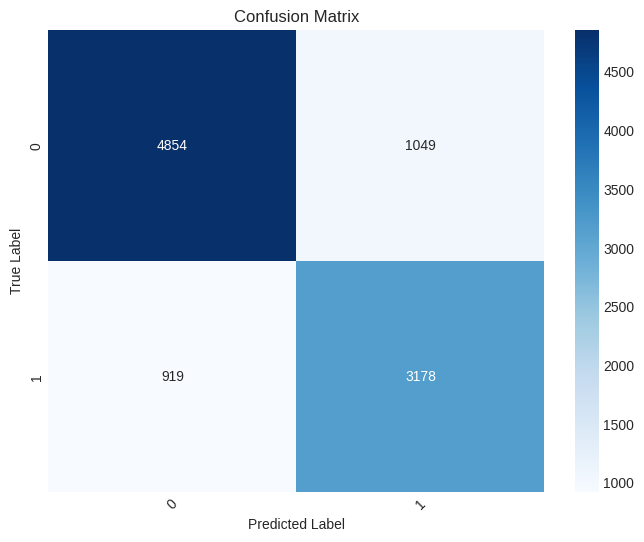

In [ ]:
print("Hypertuned Gaussian Naive Bayes performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
gb_rnn_result_1 = runclassifier(model_gb,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

Gaussian Naive Bayes performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.7758
Precision: 0.7878567406915542
Recall (TPR): 0.7758
False Positive Rate (FPR): 0.21808647679091053
F1 score (F-measure): 0.7776630994309311
Specificity: 0.7819135232090895
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.7758,0.854777,0.748903,0.185076,0.798345,17752,3016,13280,5952
1,1,0.7758,0.690516,0.814924,0.251097,0.747579,13280,5952,17752,3016


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


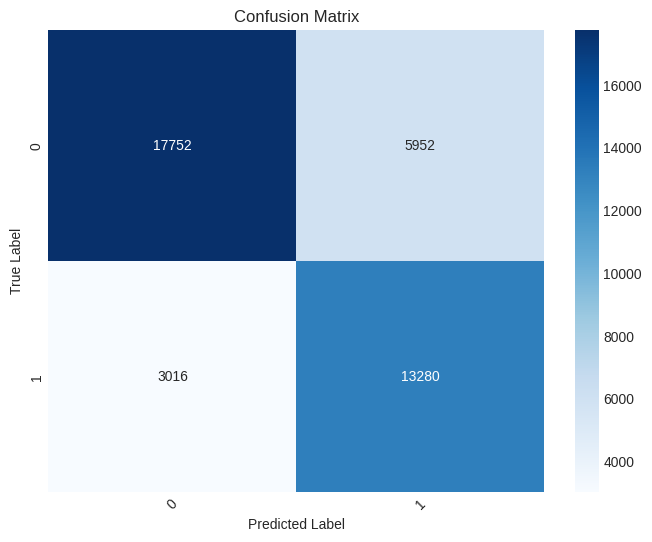

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.7805
Precision: 0.7914954941515927
Recall (TPR): 0.7805
False Positive Rate (FPR): 0.21388844243841043
F1 score (F-measure): 0.7822178026635768
Specificity: 0.7861115575615896
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.7805,0.856128,0.755040,0.182817,0.802412,4457,749,3348,1446
1,1,0.7805,0.698373,0.817183,0.244960,0.753121,3348,1446,4457,749


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


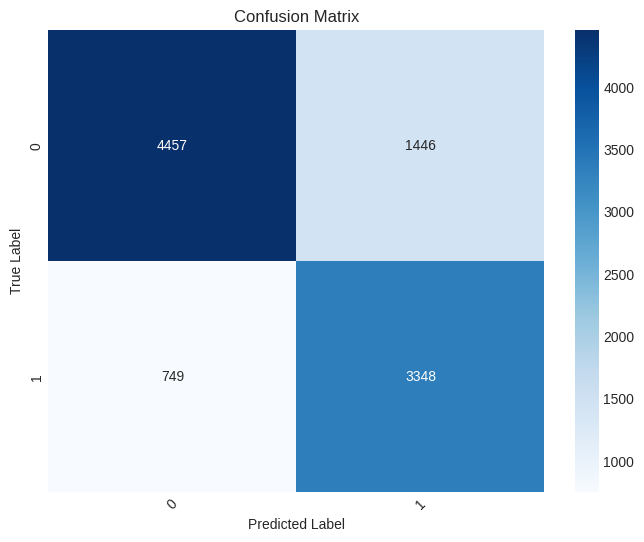

In [ ]:
print("Gaussian Naive Bayes performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = GaussianNB()
gb_rnn_result_2 = runclassifier(model,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

Logistic Regression

In [ ]:
def objective_lr(trial):
    penalty  = trial.suggest_categorical("penalty", ['l2'])
    solvers  = trial.suggest_categorical('solvers', ['newton-cg', 'lbfgs', 'liblinear'])
    C = trial.suggest_categorical("C", [100, 10, 1.0, 0.1, 0.01])
    model = LogisticRegression(solver=solvers,penalty=penalty,C=C)
    model.fit(X_train_selected_rnn_ga, y_train_rnn_ga)
    y_pred = model.predict(X_test_selected_rnn_ga)
    return accuracy_score(y_test_rnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_lr = optuna.create_study(direction="maximize", sampler=sampler)
study_lr.optimize(objective_lr, n_trials=100)

print("Number of finished trials: ", len(study_lr.trials))
print("Best trial:")
trial_lr = study_lr.best_trial
print("  Value: ", trial_lr.value)
print("  Params: ")
for key, value in trial_lr.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-30 09:34:39,892] A new study created in memory with name: no-name-e3161f86-4fcc-4ec9-91c7-30111ad8eb19
[I 2024-03-30 09:34:40,413] Trial 0 finished with value: 0.8227 and parameters: {'penalty': 'l2', 'solvers': 'lbfgs', 'C': 0.01}. Best is trial 0 with value: 0.8227.
[I 2024-03-30 09:34:41,314] Trial 1 finished with value: 0.8722 and parameters: {'penalty': 'l2', 'solvers': 'lbfgs', 'C': 1.0}. Best is trial 1 with value: 0.8722.
[I 2024-03-30 09:34:42,189] Trial 2 finished with value: 0.8722 and parameters: {'penalty': 'l2', 'solvers': 'lbfgs', 'C': 1.0}. Best is trial 1 with value: 0.8722.
[I 2024-03-30 09:34:43,061] Trial 3 finished with value: 0.8722 and parameters: {'penalty': 'l2', 'solvers': 'lbfgs', 'C': 1.0}. Best is trial 1 with value: 0.8722.
[I 2024-03-30 09:34:46,792] Trial 4 finished with value: 0.8701 and parameters: {'penalty': 'l2', 'solvers': 'newton-cg', 'C': 1.0}. Best is trial 1 with value: 0.8722.
[I 2024-03-30 09:34:48,319] Trial 5 finished with value:

Number of finished trials:  100
Best trial:
  Value:  0.8764
  Params: 
    penalty: l2
    solvers: liblinear
    C: 10


In [ ]:
model_lr = LogisticRegression(solver=trial_lr.params["solvers"],penalty= trial_lr.params["penalty"],C= trial_lr.params["C"])

In [ ]:
with open('lr_rnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_lr, f)

In [ ]:
# Load the dictionary from the file
with open('/content/drive/MyDrive/RNN_NEW/lr_rnn_ga_results.pkl', 'rb') as f:
    model_lr = pickle.load(f)

Parameter tuned Logistic Regression performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.87895
Precision: 0.8786245016491303
Recall (TPR): 0.87895
False Positive Rate (FPR): 0.1274876852146859
F1 score (F-measure): 0.8786743580181543
Specificity: 0.8725123147853141
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.87895,0.890518,0.907273,0.162248,0.898817,21506,2644,13652,2198
1,1,0.87895,0.861325,0.837752,0.092727,0.849375,13652,2198,21506,2644


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


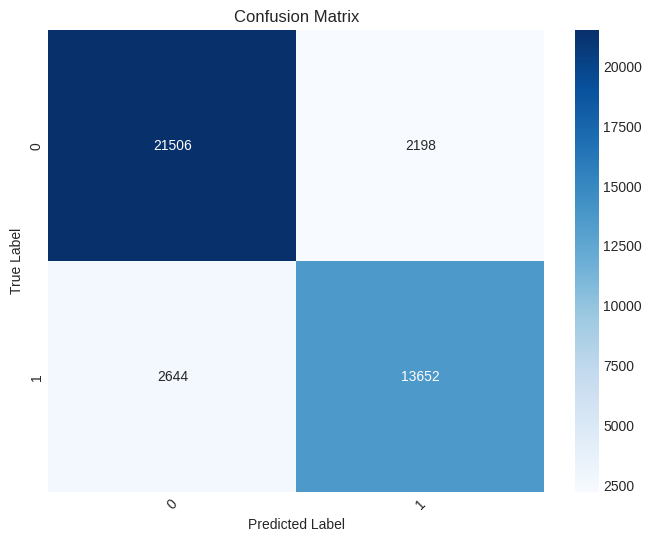

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8729
Precision: 0.8725550154909455
Recall (TPR): 0.8729
False Positive Rate (FPR): 0.13353223546348159
F1 score (F-measure): 0.8726084584491589
Specificity: 0.8664677645365184
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8729,0.884845,0.902084,0.169148,0.893381,5325,693,3404,578
1,1,0.8729,0.854847,0.830852,0.097916,0.842679,3404,578,5325,693


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


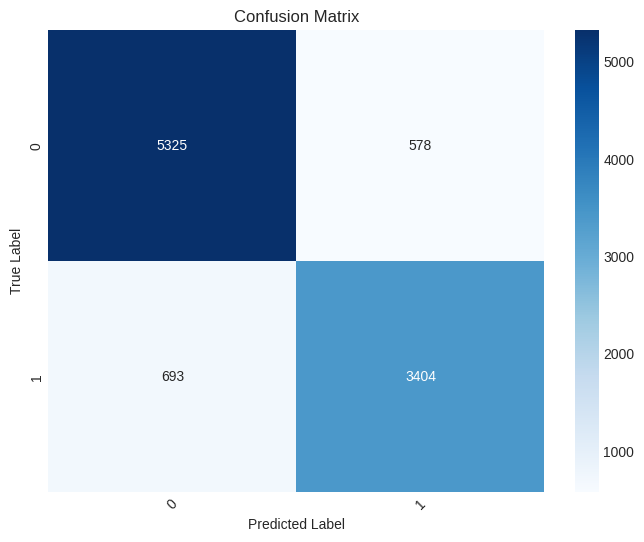

In [ ]:
print("Parameter tuned Logistic Regression performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
lr_rnn_result_1 = runclassifier(model_lr,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

Logistic Regression performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8569
Precision: 0.8568246984581852
Recall (TPR): 0.8569
False Positive Rate (FPR): 0.1550385742600897
F1 score (F-measure): 0.8557116442423836
Specificity: 0.8449614257399103
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8569,0.857683,0.909425,0.219502,0.882796,21557,3577,12719,2147
1,1,0.8569,0.855576,0.780498,0.090575,0.816315,12719,2147,21557,3577


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


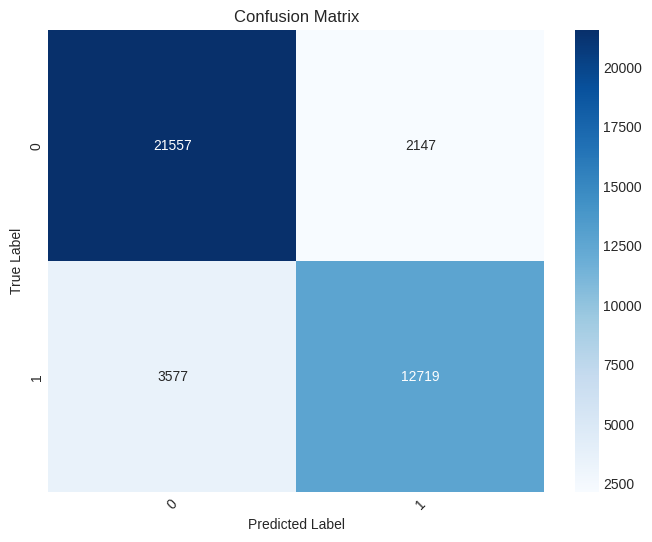

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8525
Precision: 0.8527336093353204
Recall (TPR): 0.8525
False Positive Rate (FPR): 0.16022071657114234
F1 score (F-measure): 0.8510699271553913
Specificity: 0.8397792834288577
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8525,0.850427,0.910215,0.230657,0.879306,5373,945,3152,530
1,1,0.8525,0.856056,0.769343,0.089785,0.810387,3152,530,5373,945


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


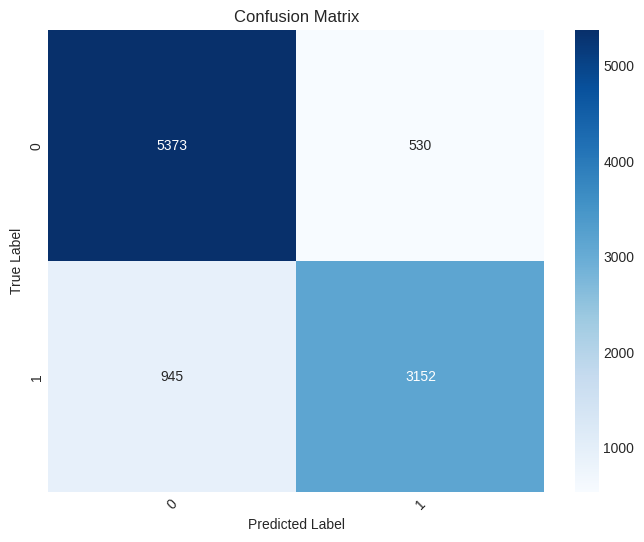

In [ ]:
print("Logistic Regression performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = LogisticRegression()
lr_rnn_result_2 = runclassifier(model,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

Support Vector Machine

In [ ]:
def objective_svc(trial):
    kernel = trial.suggest_categorical('kernel', ['polynomial','rbf','sigmoid'])
    C = trial.suggest_categorical('C', [50,10,1.0,0.1,0.01])
    gamma = trial.suggest_categorical('gamma',['auto'])
    model = SVC(kernel=kernel,C=C,gamma=gamma) # do not tune the seed
    model.fit(X_train_selected_rnn_ga, y_train_rnn_ga)
    y_pred = model.predict(X_test_selected_rnn_ga)
    return accuracy_score(y_test_rnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study = optuna.create_study(direction="maximize", sampler=sampler)
study.optimize(objective_svc, n_trials=100)

print("Number of finished trials: ", len(study.trials))
print("Best trial:")
trial = study.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-04-12 07:11:35,199] A new study created in memory with name: no-name-402a9a77-cc81-4bb5-88b0-d55b89449aba
[I 2024-04-12 07:11:36,688] Trial 0 finished with value: 0.7954 and parameters: {'kernel': 'rbf', 'C': 0.01, 'gamma': 'auto'}. Best is trial 0 with value: 0.7954.
[I 2024-04-12 07:11:37,927] Trial 1 finished with value: 0.8112 and parameters: {'kernel': 'rbf', 'C': 1.0, 'gamma': 'auto'}. Best is trial 1 with value: 0.8112.
[I 2024-04-12 07:11:39,193] Trial 2 finished with value: 0.8112 and parameters: {'kernel': 'rbf', 'C': 1.0, 'gamma': 'auto'}. Best is trial 1 with value: 0.8112.
[I 2024-04-12 07:11:40,427] Trial 3 finished with value: 0.8112 and parameters: {'kernel': 'rbf', 'C': 1.0, 'gamma': 'auto'}. Best is trial 1 with value: 0.8112.
[I 2024-04-12 07:11:41,891] Trial 4 finished with value: 0.7865 and parameters: {'kernel': 'polynomial', 'C': 1.0, 'gamma': 'auto'}. Best is trial 1 with value: 0.8112.
[I 2024-04-12 07:11:44,084] Trial 5 finished with value: 0.4097 and 

Number of finished trials:  100
Best trial:
  Value:  0.8751
  Params: 
    kernel: rbf
    C: 50
    gamma: auto


In [ ]:
def objective_svc(trial):
    kernel = trial.suggest_categorical('kernel', ['poly','rbf','sigmoid'])
    C = trial.suggest_categorical('C', [50,10,1.0,0.1,0.01])
    gamma = trial.suggest_categorical('gamma',['scale'])
    model = SVC(kernel=kernel,C=C,gamma=gamma) # do not tune the seed
    model.fit(X_train_selected_rnn_ga, y_train_rnn_ga)
    y_pred = model.predict(X_test_selected_rnn_ga)
    return accuracy_score(y_test_rnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study = optuna.create_study(direction="maximize", sampler=sampler)
study.optimize(objective_svc, n_trials=100)

print("Number of finished trials: ", len(study.trials))
print("Best trial:")
trial = study.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-04-02 20:02:46,689] A new study created in memory with name: no-name-2e94ef22-78de-4ead-93c4-78142f3a9cb1
[I 2024-04-02 20:05:19,604] Trial 0 finished with value: 0.8134 and parameters: {'kernel': 'rbf', 'C': 0.01, 'gamma': 'scale'}. Best is trial 0 with value: 0.8134.
[I 2024-04-02 20:07:06,081] Trial 1 finished with value: 0.8981 and parameters: {'kernel': 'rbf', 'C': 1.0, 'gamma': 'scale'}. Best is trial 1 with value: 0.8981.
[I 2024-04-02 20:08:54,075] Trial 2 finished with value: 0.8981 and parameters: {'kernel': 'rbf', 'C': 1.0, 'gamma': 'scale'}. Best is trial 1 with value: 0.8981.
[I 2024-04-02 20:10:41,149] Trial 3 finished with value: 0.8981 and parameters: {'kernel': 'rbf', 'C': 1.0, 'gamma': 'scale'}. Best is trial 1 with value: 0.8981.
[I 2024-04-02 20:11:59,661] Trial 4 finished with value: 0.9105 and parameters: {'kernel': 'poly', 'C': 1.0, 'gamma': 'scale'}. Best is trial 4 with value: 0.9105.
[I 2024-04-02 20:13:35,768] Trial 5 finished with value: 0.8787 and p

Number of finished trials:  100
Best trial:
  Value:  0.9598
  Params: 
    kernel: poly
    C: 50
    gamma: scale


In [ ]:
model_svc = SVC(kernel=trial.params['kernel'],C=trial.params['C'],gamma=trial.params['gamma'], probability=True)

In [ ]:
filename = "rnn_ga_svc_model.pkl"
pickle.dump(model_svc, open(filename, "wb"))

In [ ]:
import pickle
with open('/content/drive/MyDrive/RNN_NEW/rnn_ga_svc_model.pkl', 'rb') as f:
    model_svc = pickle.load(f)

Accuracy: 0.945225
Precision: 0.9451718132214483
Recall (TPR): 0.945225
False Positive Rate (FPR): 0.05744441840463743
F1 score (F-measure): 0.9451844774532874
Specificity: 0.9425555815953626
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.945225,0.950912,0.956969,0.071858,0.953931,22684,1171,15125,1020
1,1,0.945225,0.936823,0.928142,0.043031,0.932462,15125,1020,22684,1171


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


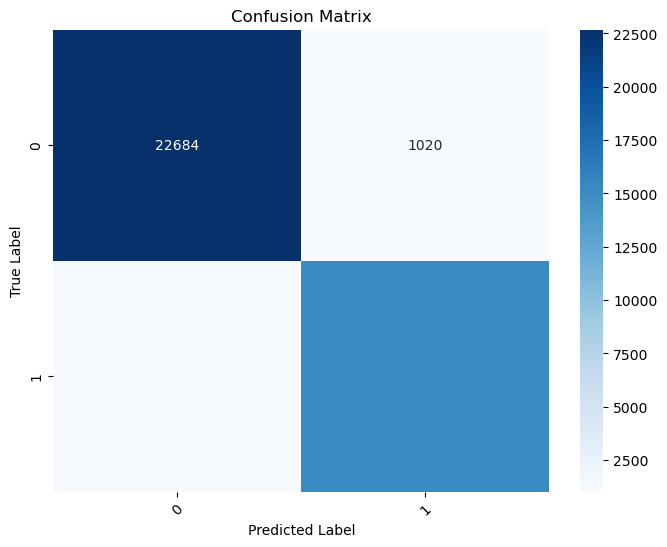

------------------------------------------------------------------------------------------------
ROC Curve for Train Set
------------------------------------------------------------------------------------------------


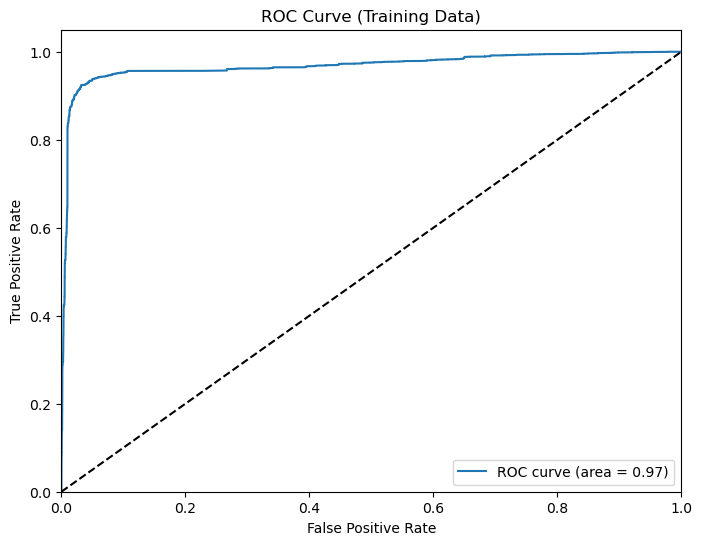

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.944
Precision: 0.9439410873366622
Recall (TPR): 0.944
False Positive Rate (FPR): 0.05908290944428207
F1 score (F-measure): 0.9439305506247985
Specificity: 0.9409170905557179
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.944,0.947712,0.957987,0.076153,0.952822,5655,312,3785,248
1,1,0.944,0.938507,0.923847,0.042013,0.931119,3785,248,5655,312


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


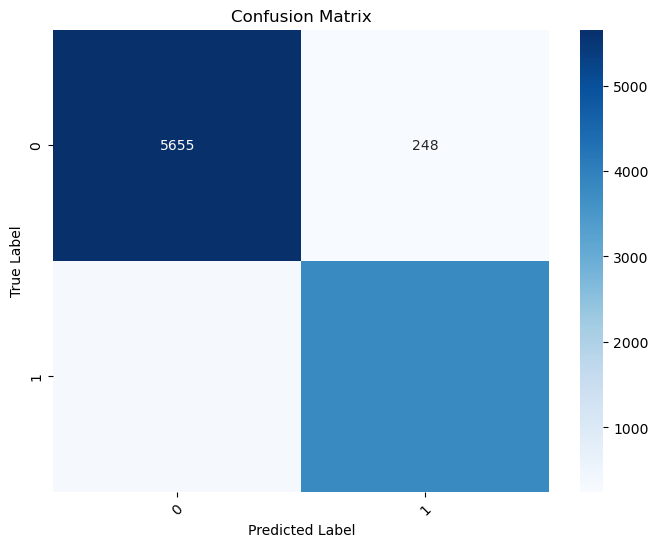

------------------------------------------------------------------------------------------------
ROC Curve for Test Set
------------------------------------------------------------------------------------------------


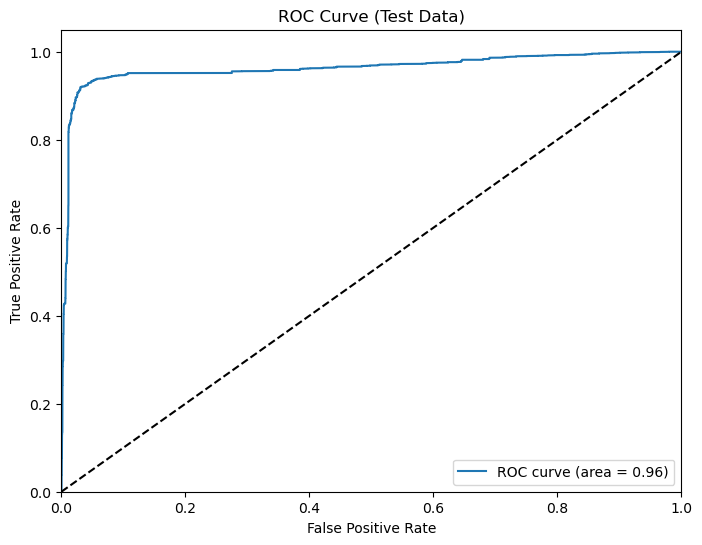

In [ ]:
svc_rnn_result_1 = runclassifier(model_svc,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

Support Vector Machine performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8849
Precision: 0.8849329299495664
Recall (TPR): 0.8849
False Positive Rate (FPR): 0.1246345245426701
F1 score (F-measure): 0.8841683963905845
Specificity: 0.8753654754573299
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8849,0.884461,0.926848,0.176117,0.905158,21970,2870,13426,1734
1,1,0.8849,0.885620,0.823883,0.073152,0.853637,13426,1734,21970,2870


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


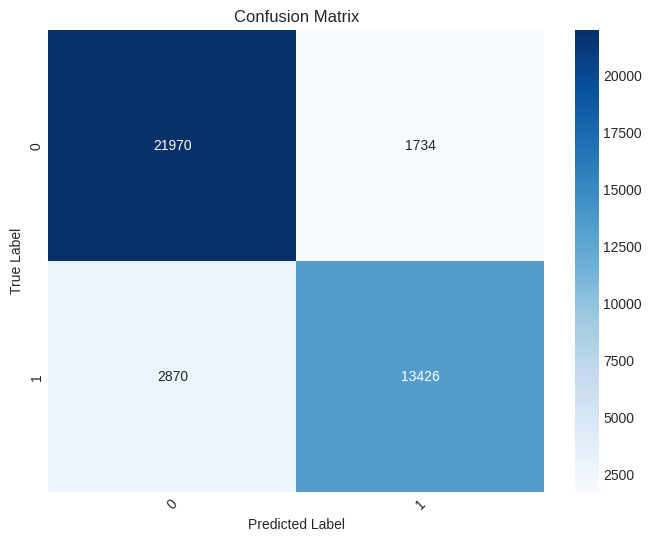

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8805
Precision: 0.8806378376639088
Recall (TPR): 0.8805
False Positive Rate (FPR): 0.12933510018838024
F1 score (F-measure): 0.8796763124193016
Specificity: 0.8706648998116198
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8805,0.878822,0.925123,0.183793,0.901378,5461,753,3344,442
1,1,0.8805,0.883254,0.816207,0.074877,0.848408,3344,442,5461,753


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


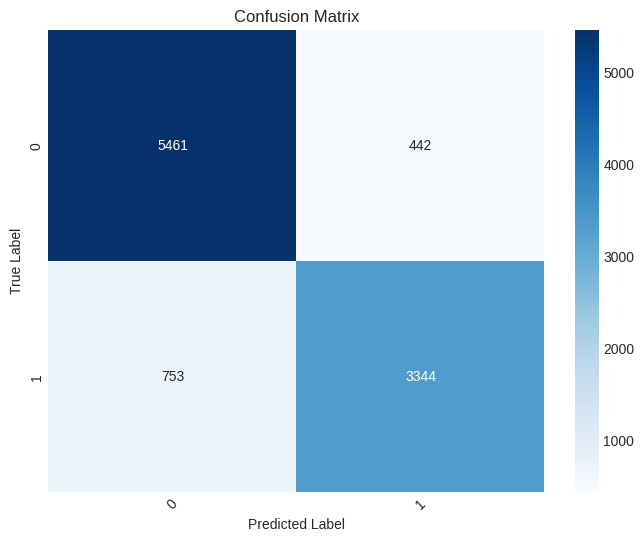

In [ ]:
print("Support Vector Machine performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = SVC(probability = True)
svc_rnn_result_2 = runclassifier(model,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

DecisionTree

In [ ]:
def objective_dt(trial):
    max_depth = trial.suggest_int('max_depth', 3, 10)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    max_features = trial.suggest_categorical('max_features', ['auto', 'sqrt', 'log2'])
    model = DecisionTreeClassifier(max_depth=max_depth, min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf,max_features=max_features,random_state=1)
    model.fit(X_train_selected_rnn_ga, y_train_rnn_ga)
    y_pred = model.predict(X_test_selected_rnn_ga)
    return accuracy_score(y_test_rnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_dt = optuna.create_study(direction="maximize", sampler=sampler)
study_dt.optimize(objective_dt, n_trials=100)

print("Number of finished trials: ", len(study_dt.trials))
print("Best trial:")
trial = study_dt.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-04-10 07:16:14,978] A new study created in memory with name: no-name-9a2fa102-ead4-4bdd-8ae0-978d917756b2
[I 2024-04-10 07:16:15,095] Trial 0 finished with value: 0.8854 and parameters: {'max_depth': 6, 'min_samples_split': 15, 'min_samples_leaf': 1, 'max_features': 'auto'}. Best is trial 0 with value: 0.8854.
[I 2024-04-10 07:16:15,155] Trial 1 finished with value: 0.8388 and parameters: {'max_depth': 4, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.8854.
[I 2024-04-10 07:16:15,228] Trial 2 finished with value: 0.848 and parameters: {'max_depth': 4, 'min_samples_split': 18, 'min_samples_leaf': 1, 'max_features': 'auto'}. Best is trial 0 with value: 0.8854.
[I 2024-04-10 07:16:15,304] Trial 3 finished with value: 0.848 and parameters: {'max_depth': 4, 'min_samples_split': 5, 'min_samples_leaf': 17, 'max_features': 'auto'}. Best is trial 0 with value: 0.8854.
[I 2024-04-10 07:16:15,402] Trial 4 finished with value: 0.9587 a

Number of finished trials:  100
Best trial:
  Value:  0.9624
  Params: 
    max_depth: 10
    min_samples_split: 13
    min_samples_leaf: 6
    max_features: auto


In [ ]:
model_dt = DecisionTreeClassifier(max_depth=trial.params['max_depth'], min_samples_split=trial.params['min_samples_split'], min_samples_leaf=trial.params['min_samples_leaf'],max_features=trial.params['max_features'],random_state=1)

In [ ]:
model_dt = DecisionTreeClassifier(max_depth=10, min_samples_split=13, min_samples_leaf=6,max_features='auto',random_state=1)

In [ ]:
filename = "rnn_ga_dt_model.pkl"
pickle.dump(model_dt, open(filename, "wb"))

Parameter Tuned Decision Tree performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.958425
Precision: 0.9585178404008852
Recall (TPR): 0.958425
False Positive Rate (FPR): 0.04541529087845164
F1 score (F-measure): 0.9583196765306804
Specificity: 0.9545847091215484
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.958425,0.955449,0.975321,0.066151,0.965283,23119,1078,15218,585
1,1,0.958425,0.962982,0.933849,0.024679,0.948192,15218,585,23119,1078


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


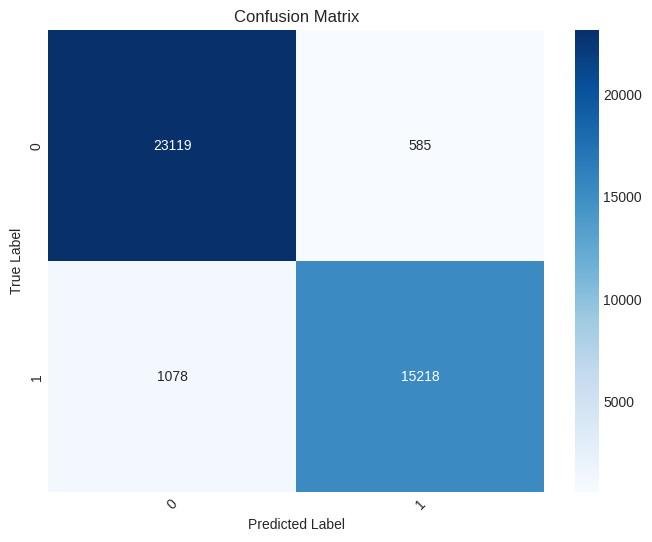

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9534
Precision: 0.9538950604259099
Recall (TPR): 0.9534
False Positive Rate (FPR): 0.05216631532036242
F1 score (F-measure): 0.9531899881984497
Specificity: 0.9478336846796376
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9534,0.944417,0.978655,0.082988,0.961231,5777,340,3757,126
1,1,0.9534,0.967551,0.917012,0.021345,0.941604,3757,126,5777,340


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


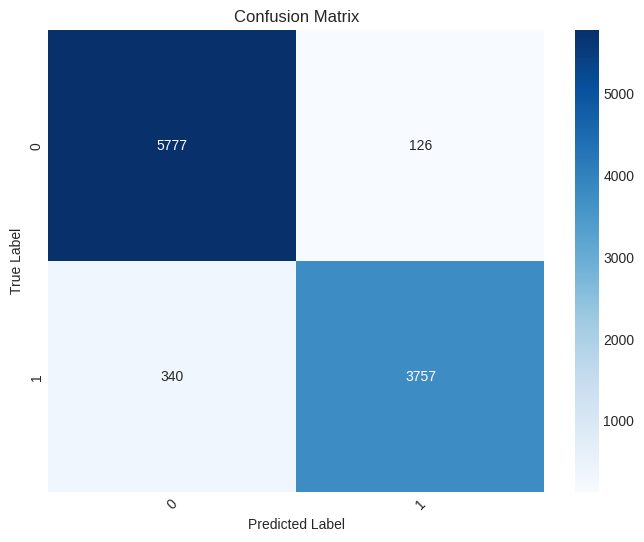

In [ ]:
print("Parameter Tuned Decision Tree performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
dt_rnn_result_1 = runclassifier(model_dt,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

Decision Tree performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9802
Precision: 0.9801940478229216
Recall (TPR): 0.9802
False Positive Rate (FPR): 0.020714197074009344
F1 score (F-measure): 0.9801957964919454
Specificity: 0.9792858029259907
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9802,0.982399,0.984222,0.025650,0.983309,23330,418,15878,374
1,1,0.9802,0.976987,0.974350,0.015778,0.975667,15878,374,23330,418


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


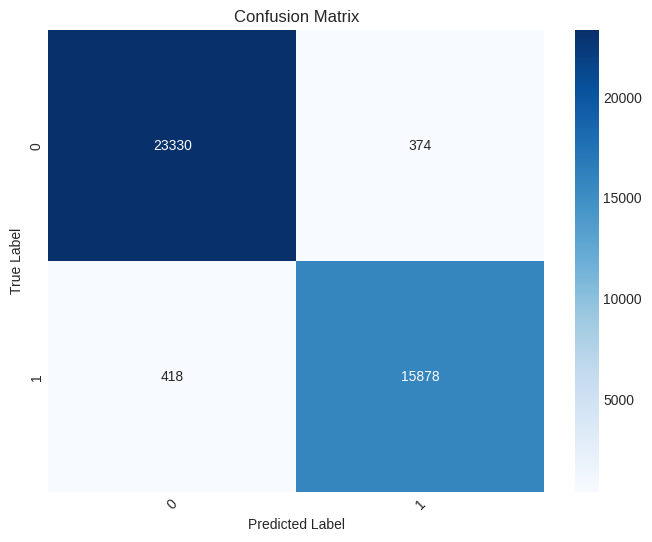

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9817
Precision: 0.981694225714853
Recall (TPR): 0.9817
False Positive Rate (FPR): 0.019197037485562563
F1 score (F-measure): 0.9816948299127883
Specificity: 0.9808029625144374
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9817,0.983271,0.985770,0.024164,0.984519,5819,99,3998,84
1,1,0.9817,0.979422,0.975836,0.014230,0.977626,3998,84,5819,99


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


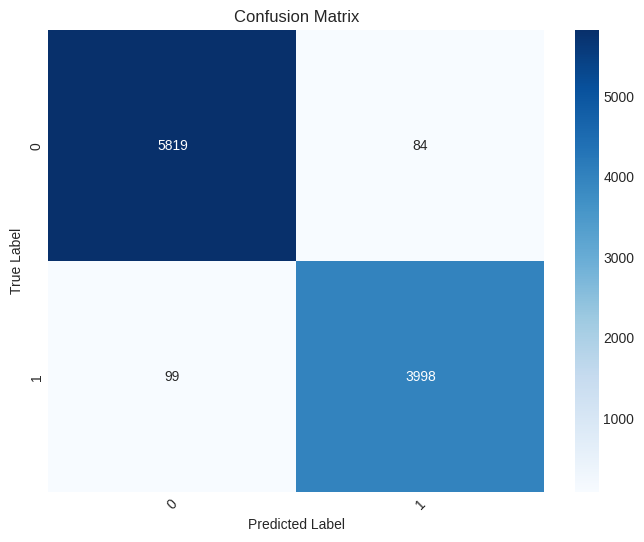

In [ ]:
print("Decision Tree performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = DecisionTreeClassifier()
dt_rnn_result_2 = runclassifier(model,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

RandomForest Classifier

In [ ]:
def objective_rf(trial):
    n_estimators = trial.suggest_int("n_estimators", 50, 500)
    max_features  = trial.suggest_categorical("max_features", ['sqrt','log2'])
    criterion  = trial.suggest_categorical("criterion", ['gini','entropy'])
    max_depth = trial.suggest_int("max_depth", 1, 21)
    min_samples_split = trial.suggest_int("min_samples_split", 2, 11)
    min_samples_leaf = trial.suggest_categorical("min_samples_leaf", [1, 2, 4])
    max_leaf_nodes = trial.suggest_int("max_leaf_nodes", 2, 20)
    model = RandomForestClassifier(n_estimators=n_estimators, min_samples_leaf = min_samples_leaf, max_leaf_nodes= max_leaf_nodes,  min_samples_split=min_samples_split, criterion = criterion, max_features = max_features,  max_depth=max_depth, random_state=1)
    model.fit(X_train_selected_rnn_ga, y_train_rnn_ga)
    y_pred = model.predict(X_test_selected_rnn_ga)
    return accuracy_score(y_test_rnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_random = optuna.create_study(direction="maximize", sampler=sampler)
study_random.optimize(objective_rf, n_trials=100)

print("Number of finished trials: ", len(study_random.trials))
print("Best trial:")
trial_random = study_random.best_trial
print("  Value: ", trial_random.value)
print("  Params: ")
for key, value in trial_random.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-30 09:02:02,282] A new study created in memory with name: no-name-864d240b-fbe6-4f59-a110-dd9809576f31
[I 2024-03-30 09:02:13,159] Trial 0 finished with value: 0.8158 and parameters: {'n_estimators': 238, 'max_features': 'sqrt', 'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_leaf_nodes': 9}. Best is trial 0 with value: 0.8158.
[I 2024-03-30 09:02:41,785] Trial 1 finished with value: 0.905 and parameters: {'n_estimators': 359, 'max_features': 'log2', 'criterion': 'entropy', 'max_depth': 9, 'min_samples_split': 7, 'min_samples_leaf': 4, 'max_leaf_nodes': 20}. Best is trial 1 with value: 0.905.
[I 2024-03-30 09:02:45,580] Trial 2 finished with value: 0.7991 and parameters: {'n_estimators': 191, 'max_features': 'log2', 'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 3, 'min_samples_leaf': 1, 'max_leaf_nodes': 20}. Best is trial 1 with value: 0.905.
[I 2024-03-30 09:03:00,036] Trial 3 finished with value: 0.803 and parameters: {

Number of finished trials:  100
Best trial:
  Value:  0.9129
  Params: 
    n_estimators: 287
    max_features: sqrt
    criterion: gini
    max_depth: 8
    min_samples_split: 9
    min_samples_leaf: 4
    max_leaf_nodes: 20


In [ ]:
model_rf = RandomForestClassifier(n_estimators=trial_random.params['n_estimators'], min_samples_leaf = trial_random.params['min_samples_leaf'], max_leaf_nodes= trial_random.params['max_leaf_nodes'],  min_samples_split=trial_random.params['min_samples_split'], criterion = trial_random.params['criterion'], max_features = trial_random.params['max_features'],  max_depth=trial_random.params['max_depth'], random_state=1)

In [ ]:
with open('rf_rnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_rf, f)

In [ ]:
with open('/content/drive/MyDrive/RNN_NEW/rf_rnn_ga_results.pkl', 'rb') as f:
    model_rf = pickle.load(f)

Parameter Tuned Random Forest performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.912
Precision: 0.9123229355902346
Recall (TPR): 0.912
False Positive Rate (FPR): 0.09624598488542457
F1 score (F-measure): 0.9114787131407478
Specificity: 0.9037540151145754
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.912,0.907395,0.948279,0.140771,0.927387,22478,2294,14002,1226
1,1,0.912,0.919490,0.859229,0.051721,0.888339,14002,1226,22478,2294


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


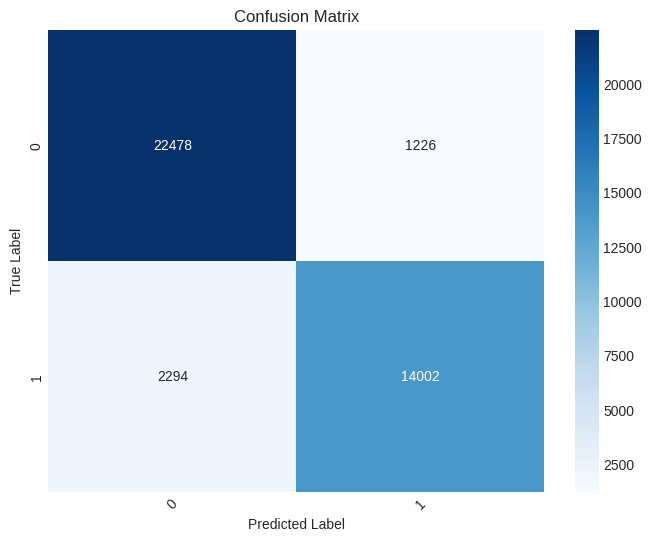

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9129
Precision: 0.913398559200812
Recall (TPR): 0.9129
False Positive Rate (FPR): 0.09543198394382602
F1 score (F-measure): 0.9123484406157347
Specificity: 0.904568016056174
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9129,0.906331,0.950703,0.141567,0.927987,5612,580,3517,291
1,1,0.9129,0.923582,0.858433,0.049297,0.889817,3517,291,5612,580


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


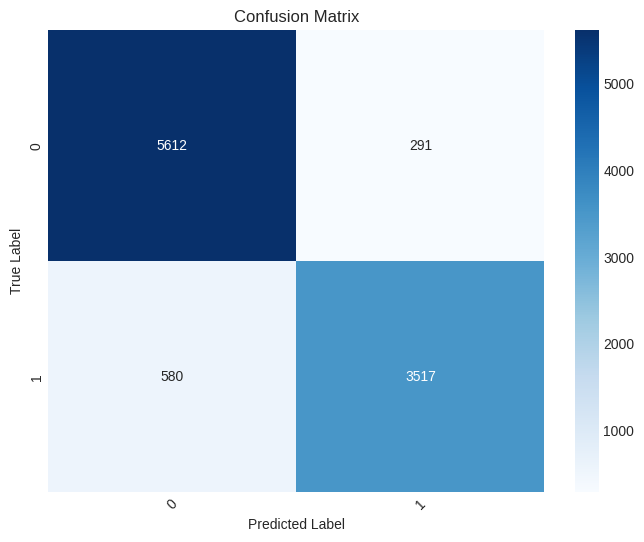

In [ ]:
print("Parameter Tuned Random Forest performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
rf_rnn_result_1 = runclassifier(model_rf,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

Random Forest performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.985325
Precision: 0.9853225948061579
Recall (TPR): 0.985325
False Positive Rate (FPR): 0.01563251008883748
F1 score (F-measure): 0.985318513033343
Specificity: 0.9843674899111625
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.985325,0.985753,0.989538,0.020803,0.987642,23456,339,15957,248
1,1,0.985325,0.984696,0.979197,0.010462,0.981939,15957,248,23456,339


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


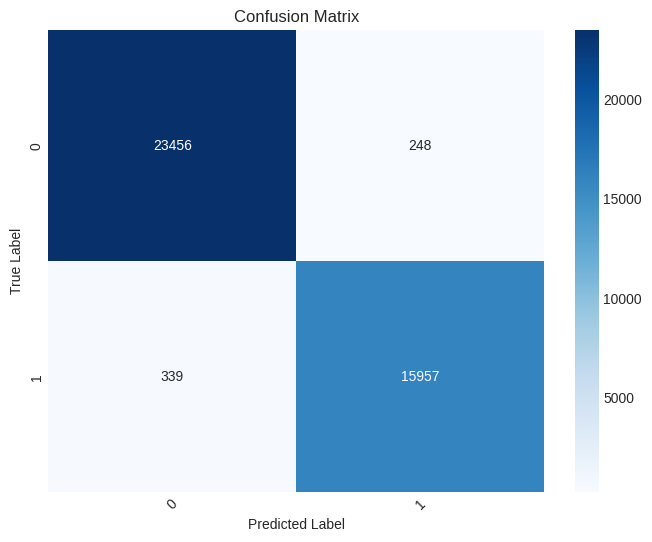

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9862
Precision: 0.98619723513306
Recall (TPR): 0.9862
False Positive Rate (FPR): 0.014601321973979231
F1 score (F-measure): 0.9861953132571917
Specificity: 0.9853986780260208
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9862,0.986827,0.989836,0.019038,0.988329,5843,78,4019,60
1,1,0.9862,0.985291,0.980962,0.010164,0.983121,4019,60,5843,78


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


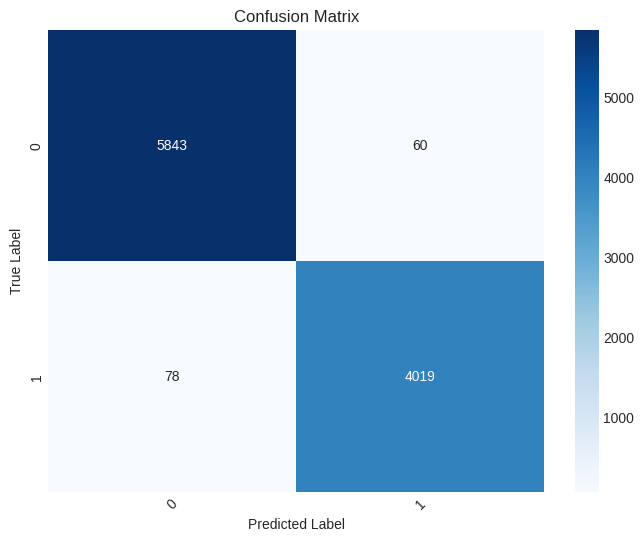

In [ ]:
print("Random Forest performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = RandomForestClassifier()
rf_rnn_result_2 = runclassifier(model,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

XGBoost

In [ ]:
def objective_xgb(trial):
    n_estimators = trial.suggest_categorical("n_estimators",[180])
    reg_alpha = trial.suggest_int('reg_alpha', 1,9)
    reg_lambda = trial.suggest_int('reg_lambda', 0,1)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.5,1, log=True)
    max_depth = trial.suggest_int('max_depth', 3, 18, 1)
    min_child_weight= trial.suggest_int('min_child_weight', 0, 10, 1)
    learning_rate = trial.suggest_float("learning_rate", 0.001, 1.0, log=True)
    subsample = trial.suggest_int("subsample", 0.7, 1.0)
    model = XGBClassifier(n_estimators=n_estimators, reg_alpha = reg_alpha, reg_lambda = reg_lambda, colsample_bytree = colsample_bytree, max_depth = max_depth, min_child_weight = min_child_weight, learning_rate=learning_rate, random_state=1)
    model.fit(X_train_selected_rnn_ga, y_train_rnn_ga)
    y_pred = model.predict(X_test_selected_rnn_ga)
    return accuracy_score(y_test_rnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_xgb = optuna.create_study(direction="maximize", sampler=sampler)
study_xgb.optimize(objective_xgb, n_trials=100)

print("Number of finished trials: ", len(study_xgb.trials))
print("Best trial:")
trial = study_xgb.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-30 08:42:37,605] A new study created in memory with name: no-name-194cd7ad-168d-4b41-8c32-57c3a581e687
[I 2024-03-30 08:43:24,295] Trial 0 finished with value: 0.9363 and parameters: {'n_estimators': 180, 'reg_alpha': 4, 'reg_lambda': 1, 'colsample_bytree': 0.5000396408623998, 'max_depth': 7, 'min_child_weight': 1, 'learning_rate': 0.0018924123965722254, 'subsample': 0}. Best is trial 0 with value: 0.9363.
[I 2024-03-30 08:43:37,928] Trial 1 finished with value: 0.9648 and parameters: {'n_estimators': 180, 'reg_alpha': 4, 'reg_lambda': 0, 'colsample_bytree': 0.7263902453474428, 'max_depth': 9, 'min_child_weight': 7, 'learning_rate': 0.004105412016858891, 'subsample': 1}. Best is trial 1 with value: 0.9648.
[I 2024-03-30 08:43:51,370] Trial 2 finished with value: 0.9756 and parameters: {'n_estimators': 180, 'reg_alpha': 1, 'reg_lambda': 1, 'colsample_bytree': 0.6677152068759228, 'max_depth': 11, 'min_child_weight': 1, 'learning_rate': 0.003929203002623947, 'subsample': 1}. Be

Number of finished trials:  100
Best trial:
  Value:  0.9866
  Params: 
    n_estimators: 180
    reg_alpha: 1
    reg_lambda: 0
    colsample_bytree: 0.826509456361694
    max_depth: 17
    min_child_weight: 2
    learning_rate: 0.9618313637874486
    subsample: 1


In [ ]:
model_xgb = XGBClassifier(n_estimators= trial.params['n_estimators'], reg_alpha = trial.params['reg_alpha'], reg_lambda = trial.params['reg_lambda'], colsample_bytree = trial.params['colsample_bytree'], max_depth = trial.params['max_depth'], min_child_weight = trial.params['min_child_weight'], learning_rate= trial.params['learning_rate'], random_state=1)

In [ ]:
with open('xgb_rnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_xgb, f)

In [ ]:
with open('/content/drive/MyDrive/RNN_NEW/xgb_rnn_ga_results.pkl', 'rb') as f:
    model_xgb = pickle.load(f)

Parameter Tuned XGBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.984275
Precision: 0.9842705664259241
Recall (TPR): 0.984275
False Positive Rate (FPR): 0.01652802540446885
F1 score (F-measure): 0.9842711266034674
Specificity: 0.9834719745955312
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.984275,0.985687,0.987808,0.020864,0.986746,23415,340,15956,289
1,1,0.984275,0.982210,0.979136,0.012192,0.980671,15956,289,23415,340


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


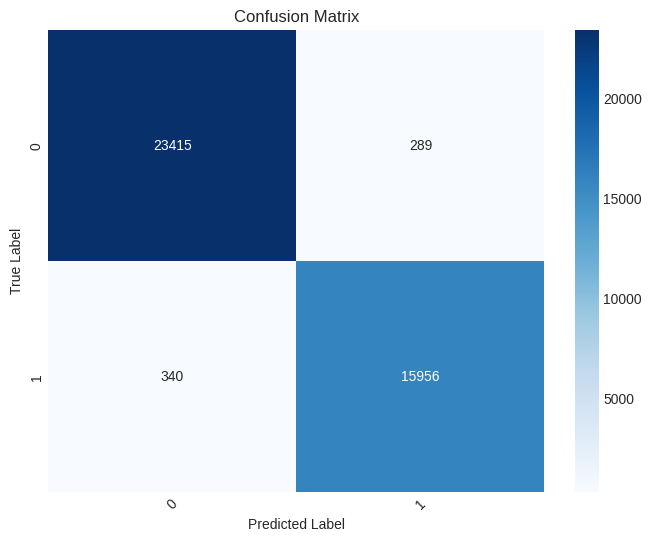

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9859
Precision: 0.9858993943364911
Recall (TPR): 0.9859
False Positive Rate (FPR): 0.015042119174146884
F1 score (F-measure): 0.9858933218354601
Specificity: 0.9849578808258531
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9859,0.985999,0.990174,0.020259,0.988082,5845,83,4014,58
1,1,0.9859,0.985756,0.979741,0.009826,0.982740,4014,58,5845,83


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


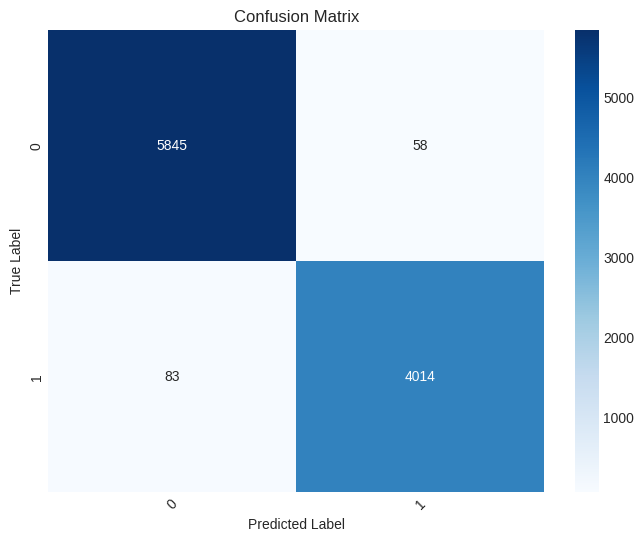

In [ ]:
print("Parameter Tuned XGBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
xgb_rnn_result_1 = runclassifier(model_xgb,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

XGBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.98385
Precision: 0.9838466710239651
Recall (TPR): 0.98385
False Positive Rate (FPR): 0.017183870253168254
F1 score (F-measure): 0.9838424633820776
Specificity: 0.9828161297468317
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.98385,0.984412,0.988399,0.022766,0.986401,23429,371,15925,275
1,1,0.98385,0.983025,0.977234,0.011601,0.980121,15925,275,23429,371


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


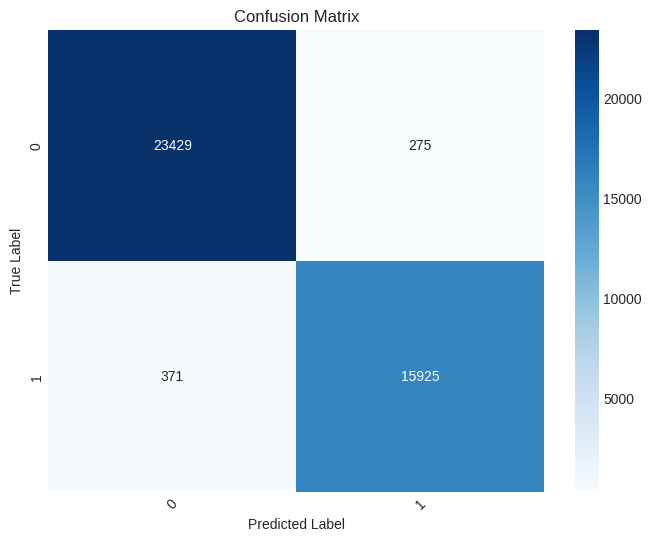

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9848
Precision: 0.9847962741595758
Recall (TPR): 0.9848
False Positive Rate (FPR): 0.016048524450961388
F1 score (F-measure): 0.9847948377905297
Specificity: 0.9839514755490386
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9848,0.985644,0.988650,0.020747,0.987145,5836,85,4012,67
1,1,0.9848,0.983574,0.979253,0.011350,0.981409,4012,67,5836,85


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


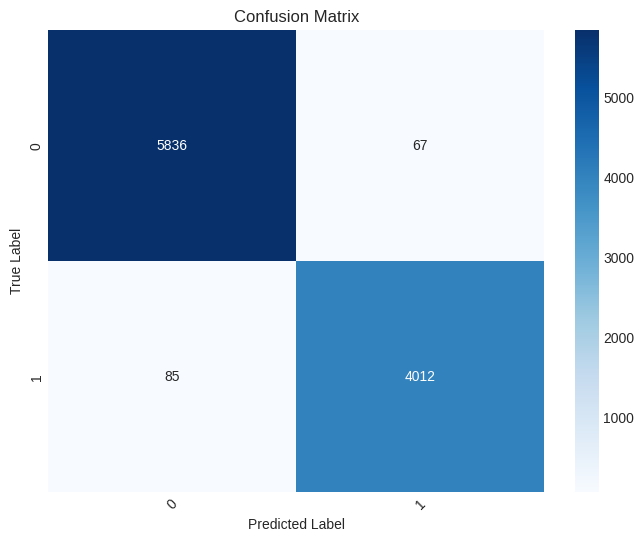

In [ ]:
print("XGBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = XGBClassifier()
xgb_rnn_result_2 = runclassifier(model,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

ExtraTrees

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

In [ ]:
def objective(trial):
    n_estimators = trial.suggest_int('n_estimators', 50, 120)
    max_depth = trial.suggest_int('max_depth', 10, 16)
    max_leaf_nodes = trial.suggest_int('max_leaf_nodes', 15, 25)
    criterion = trial.suggest_categorical('criterion', ['gini', 'entropy'])
    model = ExtraTreesClassifier(n_estimators = n_estimators,max_depth = max_depth,max_leaf_nodes = max_leaf_nodes,criterion = criterion, random_state = 1) # do not tune the seed
    model.fit(X_train_selected_rnn_ga, y_train_rnn_ga)
    y_pred = model.predict(X_test_selected_rnn_ga)
    return accuracy_score(y_test_rnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study = optuna.create_study(direction="maximize", sampler=sampler)
study.optimize(objective, n_trials=100)

print("Number of finished trials: ", len(study.trials))
print("Best trial:")
trial = study.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-30 09:30:33,386] A new study created in memory with name: no-name-5774f6fe-7179-4377-bb1b-5dc83d322be9
[I 2024-03-30 09:30:34,826] Trial 0 finished with value: 0.8433 and parameters: {'n_estimators': 79, 'max_depth': 15, 'max_leaf_nodes': 15, 'criterion': 'gini'}. Best is trial 0 with value: 0.8433.
[I 2024-03-30 09:30:35,944] Trial 1 finished with value: 0.8418 and parameters: {'n_estimators': 56, 'max_depth': 11, 'max_leaf_nodes': 18, 'criterion': 'entropy'}. Best is trial 0 with value: 0.8433.
[I 2024-03-30 09:30:37,384] Trial 2 finished with value: 0.8455 and parameters: {'n_estimators': 79, 'max_depth': 14, 'max_leaf_nodes': 17, 'criterion': 'gini'}. Best is trial 2 with value: 0.8455.
[I 2024-03-30 09:30:39,349] Trial 3 finished with value: 0.8524 and parameters: {'n_estimators': 97, 'max_depth': 12, 'max_leaf_nodes': 21, 'criterion': 'entropy'}. Best is trial 3 with value: 0.8524.
[I 2024-03-30 09:30:42,277] Trial 4 finished with value: 0.8463 and parameters: {'n_esti

Number of finished trials:  100
Best trial:
  Value:  0.8613
  Params: 
    n_estimators: 50
    max_depth: 10
    max_leaf_nodes: 25
    criterion: entropy


In [ ]:
model_et = ExtraTreesClassifier(n_estimators = trial.params['n_estimators'],max_depth = trial.params['max_depth'],max_leaf_nodes = trial.params['max_leaf_nodes'],criterion = trial.params['criterion'], random_state = 1)

In [ ]:
with open('et_rnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_et, f)

In [ ]:
with open('/content/drive/MyDrive/RNN_NEW/et_rnn_ga_results.pkl', 'rb') as f:
    model_et = pickle.load(f)

Parameter Tuned ExtraTrees performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8592
Precision: 0.8588339371746259
Recall (TPR): 0.8592
False Positive Rate (FPR): 0.15109389556783714
F1 score (F-measure): 0.8583338181350151
Specificity: 0.8489061044321629
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8592,0.864237,0.904489,0.206676,0.883905,21440,3368,12928,2264
1,1,0.8592,0.850974,0.793324,0.095511,0.821138,12928,2264,21440,3368


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


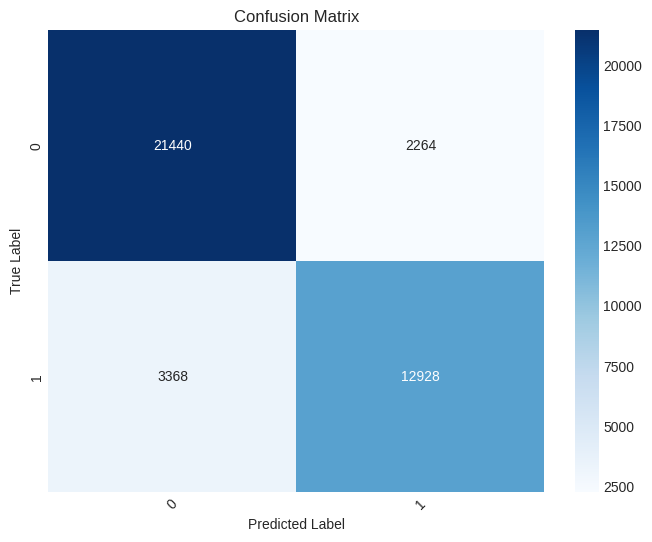

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.8613
Precision: 0.8613799551702259
Recall (TPR): 0.8613
False Positive Rate (FPR): 0.15011589404178882
F1 score (F-measure): 0.8601615054926646
Specificity: 0.8498841059582112
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.8613,0.860473,0.913095,0.213327,0.886003,5390,874,3223,513
1,1,0.8613,0.862687,0.786673,0.086905,0.822929,3223,513,5390,874


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


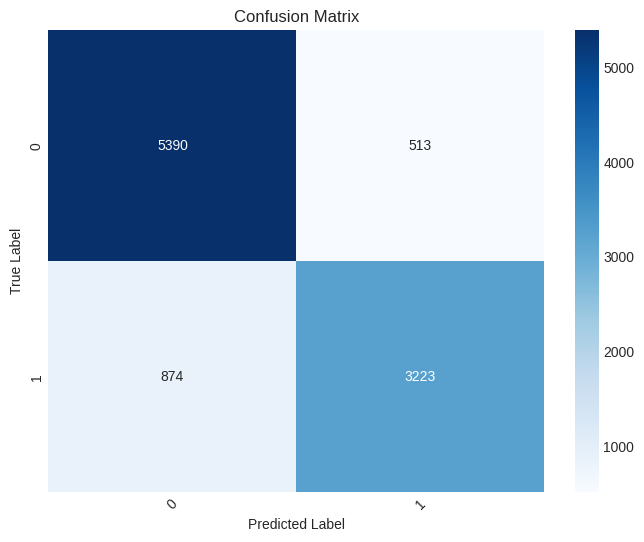

In [ ]:
print("Parameter Tuned ExtraTrees performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
et_rnn_result_1 = runclassifier(model_et,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

Extra Trees performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.985925
Precision: 0.9859249611875599
Recall (TPR): 0.985925
False Positive Rate (FPR): 0.01508791085803618
F1 score (F-measure): 0.985917667576149
Specificity: 0.9849120891419638
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.985925,0.985931,0.990381,0.020557,0.988151,23476,335,15961,228
1,1,0.985925,0.985916,0.979443,0.009619,0.982669,15961,228,23476,335


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


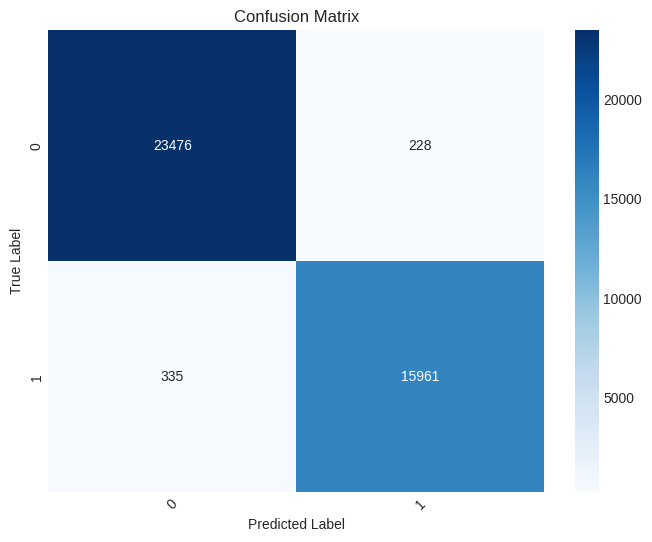

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.986
Precision: 0.9859975799309186
Recall (TPR): 0.986
False Positive Rate (FPR): 0.014845403008882818
F1 score (F-measure): 0.9859947108449733
Specificity: 0.9851545969911172
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.986,0.986493,0.989836,0.019526,0.988162,5843,80,4017,60
1,1,0.986,0.985283,0.980474,0.010164,0.982873,4017,60,5843,80


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


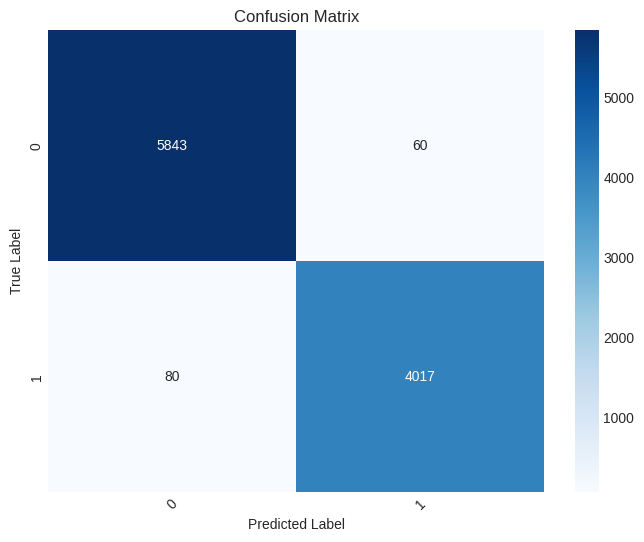

In [ ]:
print("Extra Trees performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = ExtraTreesClassifier()
et_rnn_result_2 = runclassifier(model,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

AdaBoost Classifier

In [ ]:
def objective_adb(trial):
    n_estimators = trial.suggest_int("n_estimators", 50, 500)
    learning_rate = trial.suggest_float("learning_rate", 0.001, 1.0, log=True)
    model = AdaBoostClassifier(n_estimators=n_estimators, learning_rate=learning_rate, random_state=1)
    model.fit(X_train_selected_rnn_ga, y_train_rnn_ga)
    y_pred = model.predict(X_test_selected_rnn_ga)
    return accuracy_score(y_test_rnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_adb = optuna.create_study(direction="maximize", sampler=sampler)
study_adb.optimize(objective_adb, n_trials=100)

print("Number of finished trials: ", len(study_adb.trials))
print("Best trial:")
trial_adb = study_adb.best_trial
print("  Value: ", trial_adb.value)
print("  Params: ")
for key, value in trial_adb.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-30 09:40:20,666] A new study created in memory with name: no-name-1e398f71-fe71-4a5c-8ab4-8addf1a61ea7
[I 2024-03-30 09:40:57,435] Trial 0 finished with value: 0.8797 and parameters: {'n_estimators': 238, 'learning_rate': 0.14486833887239342}. Best is trial 0 with value: 0.8797.
[I 2024-03-30 09:41:05,653] Trial 1 finished with value: 0.815 and parameters: {'n_estimators': 50, 'learning_rate': 0.008072307884499755}. Best is trial 0 with value: 0.8797.
[I 2024-03-30 09:41:23,004] Trial 2 finished with value: 0.8139 and parameters: {'n_estimators': 116, 'learning_rate': 0.0018924123965722254}. Best is trial 0 with value: 0.8797.
[I 2024-03-30 09:41:44,103] Trial 3 finished with value: 0.811 and parameters: {'n_estimators': 134, 'learning_rate': 0.010881335003635882}. Best is trial 0 with value: 0.8797.
[I 2024-03-30 09:42:18,072] Trial 4 finished with value: 0.8453 and parameters: {'n_estimators': 228, 'learning_rate': 0.04134759007834719}. Best is trial 0 with value: 0.8797.


Number of finished trials:  100
Best trial:
  Value:  0.9637
  Params: 
    n_estimators: 500
    learning_rate: 0.9841371461594536


In [ ]:
model_adb = AdaBoostClassifier(n_estimators=trial_adb.params["n_estimators"], learning_rate=trial_adb.params["learning_rate"], random_state=1)

In [ ]:
with open('adb_rnn_ga_results.pkl', 'wb') as f:
    pickle.dump(model_lr, f)

In [ ]:
with open('/content/drive/MyDrive/RNN_NEW/adb_rnn_ga_results.pkl', 'rb') as f:
    model_adb = pickle.load(f)

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/RNN_NEW/adb_rnn_ga_results.pkl'

Parameter tuned AdaBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.963375
Precision: 0.9633772505244997
Recall (TPR): 0.963375
False Positive Rate (FPR): 0.039359358201321415
F1 score (F-measure): 0.9633202172687346
Specificity: 0.9606406417986786
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.963375,0.963255,0.975405,0.054124,0.969292,23121,882,15414,583
1,1,0.963375,0.963556,0.945876,0.024595,0.954634,15414,583,23121,882


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


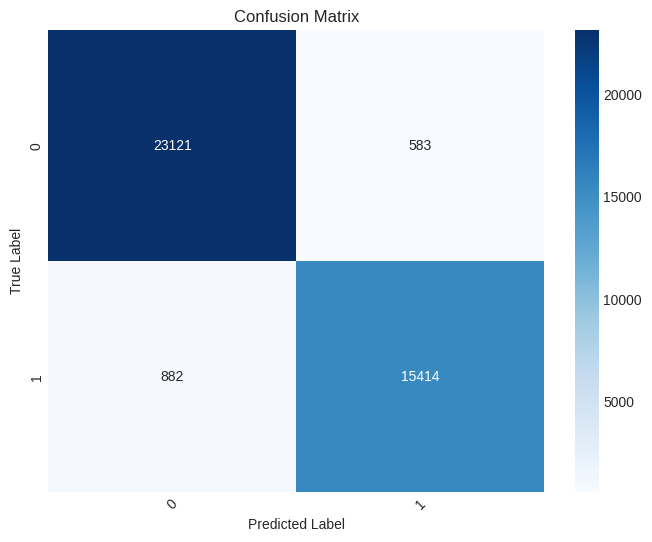

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9634
Precision: 0.9633932373493928
Recall (TPR): 0.9634
False Positive Rate (FPR): 0.0390661558014358
F1 score (F-measure): 0.9633531377342573
Specificity: 0.9609338441985642
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9634,0.963813,0.974589,0.052722,0.969171,5753,216,3881,150
1,1,0.9634,0.962788,0.947278,0.025411,0.954970,3881,150,5753,216


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


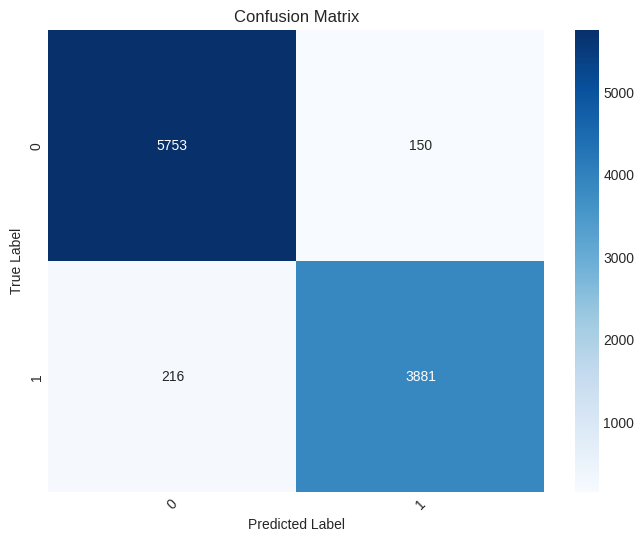

In [ ]:
print("Parameter tuned AdaBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
adb_rnn_result_1 = runclassifier(model_adb,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

AdaBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.903925
Precision: 0.9037765246106566
Recall (TPR): 0.903925
False Positive Rate (FPR): 0.10271398094084938
F1 score (F-measure): 0.9035845386665822
Specificity: 0.8972860190591506
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.903925,0.907372,0.933134,0.138562,0.920072,22119,2258,14038,1585
1,1,0.903925,0.898547,0.861438,0.066866,0.879601,14038,1585,22119,2258


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


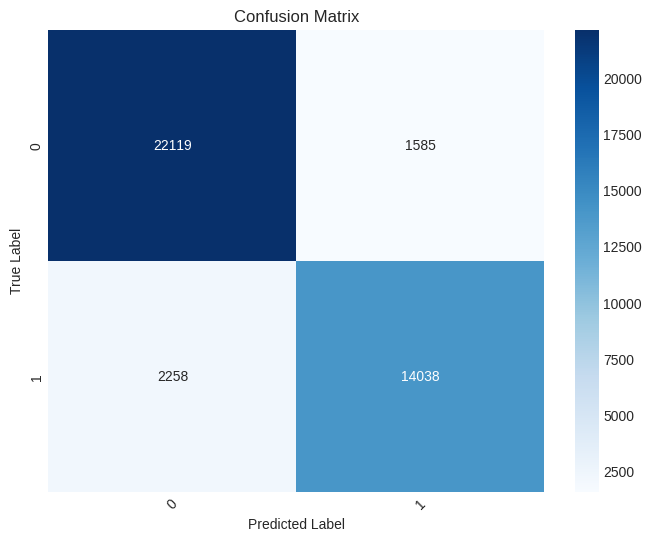

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9068
Precision: 0.9068494550899241
Recall (TPR): 0.9068
False Positive Rate (FPR): 0.10044949695448646
F1 score (F-measure): 0.9063668078247487
Specificity: 0.8995505030455135
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9068,0.905928,0.939692,0.140591,0.922501,5547,576,3521,356
1,1,0.9068,0.908176,0.859409,0.060308,0.883120,3521,356,5547,576


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


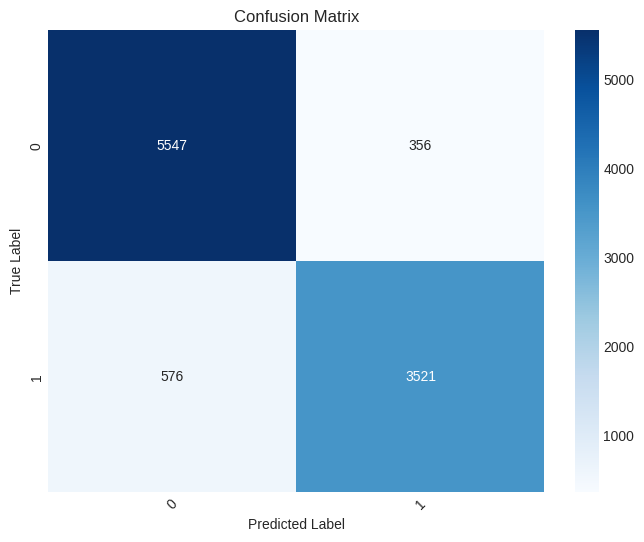

In [ ]:
print("AdaBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = AdaBoostClassifier()
adb_rnn_result_2 = runclassifier(model,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

Gradient Boosting Classifier

In [ ]:
def objective_gradient(trial):
    n_estimators = trial.suggest_int("n_estimators", 50, 500)
    learning_rate = trial.suggest_float("learning_rate", 0.001, 1.0, log=True)
    subsample = trial.suggest_float("subsample", 0.5, 1.0, log=True)
    max_depth = trial.suggest_int("max_depth", 1, 10)
    model = GradientBoostingClassifier(learning_rate=learning_rate, n_estimators=n_estimators, subsample=subsample, max_depth=max_depth, random_state=1)
    model.fit(X_train_selected_rnn_ga, y_train_rnn_ga)
    y_pred = model.predict(X_test_selected_rnn_ga)
    return accuracy_score(y_test_rnn_ga, y_pred)

In [ ]:
sampler = TPESampler(seed=1)
study_gradient = optuna.create_study(direction="maximize", sampler=sampler)
study_gradient.optimize(objective_gradient, n_trials=100)

print("Number of finished trials: ", len(study_gradient.trials))
print("Best trial:")
trial_gradient = study_gradient.best_trial
print("  Value: ", trial_gradient.value)
print("  Params: ")
for key, value in trial_gradient.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-30 11:37:41,047] A new study created in memory with name: no-name-9c1f7dda-1be5-4d07-90a5-daef2d9afa04
[I 2024-03-30 11:38:46,387] Trial 0 finished with value: 0.9776 and parameters: {'n_estimators': 238, 'learning_rate': 0.14486833887239342, 'subsample': 0.5000396408623998, 'max_depth': 4}. Best is trial 0 with value: 0.9776.
[I 2024-03-30 11:39:20,634] Trial 1 finished with value: 0.8077 and parameters: {'n_estimators': 116, 'learning_rate': 0.0018924123965722254, 'subsample': 0.5689052151487055, 'max_depth': 4}. Best is trial 0 with value: 0.9776.
[I 2024-03-30 11:41:29,147] Trial 2 finished with value: 0.9818 and parameters: {'n_estimators': 228, 'learning_rate': 0.04134759007834719, 'subsample': 0.6685903857355362, 'max_depth': 7}. Best is trial 2 with value: 0.9818.
[I 2024-03-30 11:42:36,943] Trial 3 finished with value: 0.9827 and parameters: {'n_estimators': 142, 'learning_rate': 0.43087600478391286, 'subsample': 0.5095824839077406, 'max_depth': 7}. Best is trial 3 

Number of finished trials:  100
Best trial:
  Value:  0.9861
  Params: 
    n_estimators: 332
    learning_rate: 0.1346150228790085
    subsample: 0.7930047933052138
    max_depth: 10


In [ ]:
model_gradient =  GradientBoostingClassifier(n_estimators=trial_gradient.params["n_estimators"], learning_rate=trial_gradient.params["learning_rate"], subsample = trial_gradient.params['subsample'], max_depth = trial_gradient.params['max_depth'],random_state=1)

In [ ]:
filename = "rnn_gradboost_model.pkl"
pickle.dump(model_gradient, open(filename, "wb"))

In [ ]:
with open('/content/drive/MyDrive/Models_Evaluation/RNN/rnn_gradboost_model.pkl', 'rb') as f:
    model_gradient = pickle.load(f)

Parameter Tuned GradientBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.985325
Precision: 0.9853229672024386
Recall (TPR): 0.985325
False Positive Rate (FPR): 0.0156516878682611
F1 score (F-measure): 0.9853182240162881
Specificity: 0.9843483121317389
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.985325,0.985672,0.989622,0.020925,0.987643,23458,341,15955,246
1,1,0.985325,0.984816,0.979075,0.010378,0.981937,15955,246,23458,341


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


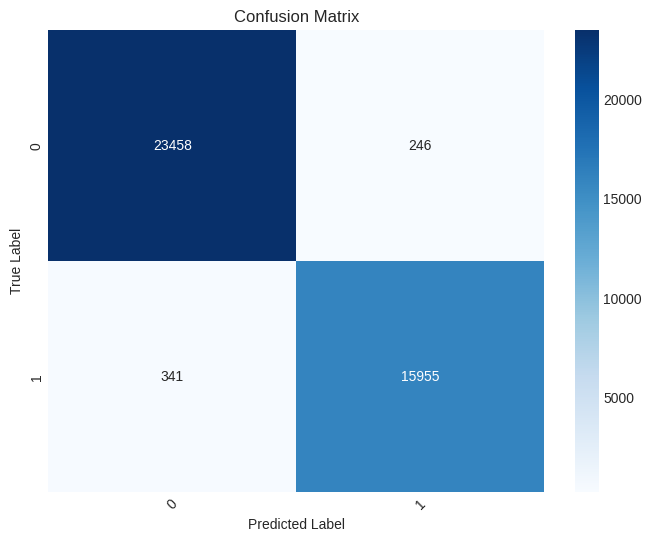

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9852
Precision: 0.9852002566418873
Recall (TPR): 0.9852
False Positive Rate (FPR): 0.015821727148497167
F1 score (F-measure): 0.985192135372862
Specificity: 0.9841782728515028
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9852,0.985163,0.989836,0.021479,0.987494,5843,88,4009,60
1,1,0.9852,0.985254,0.978521,0.010164,0.981876,4009,60,5843,88


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


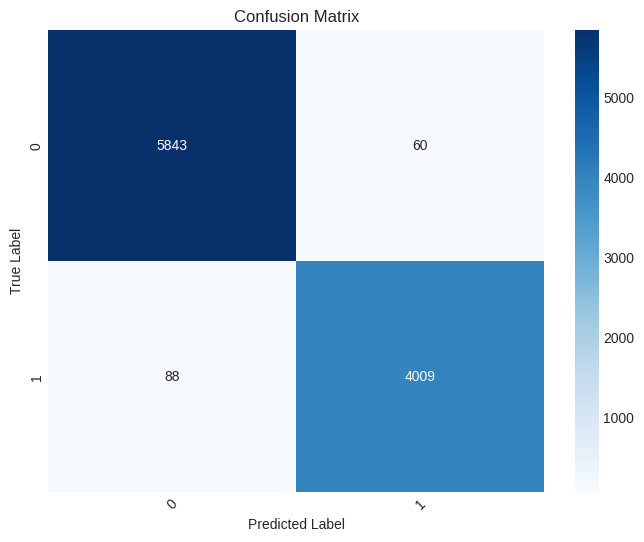

In [ ]:
print("Parameter Tuned GradientBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
gradboost_rnn_result_1 = runclassifier(model_gradient,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

GradientBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.950175
Precision: 0.9502699007965253
Recall (TPR): 0.950175
False Positive Rate (FPR): 0.05425556375132945
F1 score (F-measure): 0.9500316958308984
Specificity: 0.9457444362486706
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.950175,0.947483,0.969668,0.078179,0.958447,22985,1274,15022,719
1,1,0.950175,0.954323,0.921821,0.030332,0.937791,15022,719,22985,1274


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


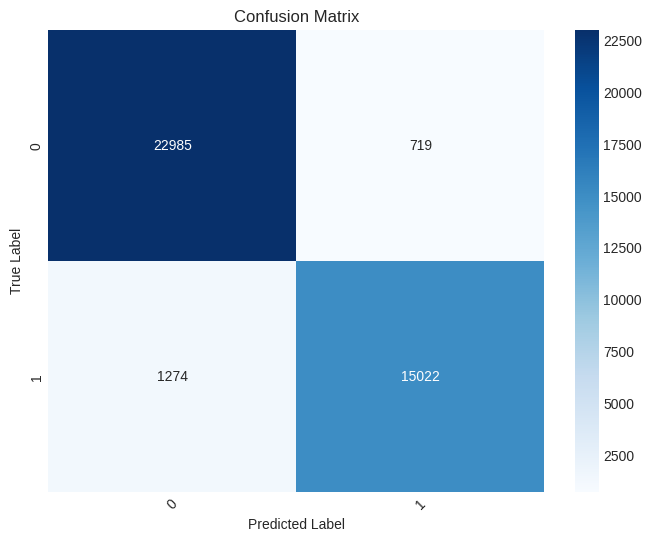

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9518
Precision: 0.9518705344799724
Recall (TPR): 0.9518
False Positive Rate (FPR): 0.05217739675647182
F1 score (F-measure): 0.9516781163163729
Specificity: 0.9478226032435282
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9518,0.949577,0.969846,0.074201,0.959604,5725,304,3793,178
1,1,0.9518,0.955175,0.925799,0.030154,0.940258,3793,178,5725,304


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


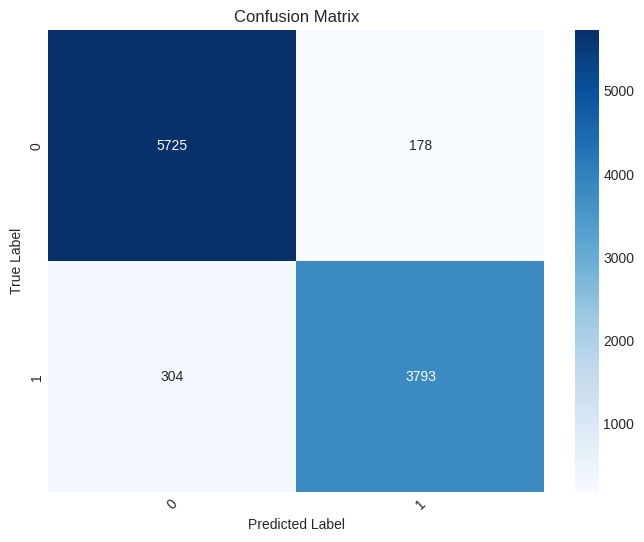

In [ ]:
print("GradientBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
model = GradientBoostingClassifier()
gradboost_rnn_result_2 = runclassifier(model,X_train_selected_rnn_ga, y_train_rnn_ga,X_test_selected_rnn_ga, y_test_rnn_ga)

In [ ]:
datasets_rnn = [
    (gb_rnn_result_1,"Tuned Dataset"),
    (lr_rnn_result_1,"Tuned Dataset"),
    (svc_rnn_result_1,"Tuned Dataset"),
    (rf_rnn_result_1,"Tuned Dataset"),
    (dt_rnn_result_1,"Tuned Dataset"),
    (et_rnn_result_1,"Tuned Dataset"),
    (xgb_rnn_result_1,"Tuned Dataset"),
    (adb_rnn_result_1,"Tuned Dataset"),
    (gradboost_rnn_result_1,"Tuned Dataset"),
    (gb_rnn_result_2,"Original Dataset"),
    (lr_rnn_result_2,"Original Dataset"),
    (svc_rnn_result_2,"Original Dataset"),
    (rf_rnn_result_2,"Original Dataset"),
    (dt_rnn_result_2,"Original Dataset"),
    (et_rnn_result_2,"Original Dataset"),
    (xgb_rnn_result_2,"Original Dataset"),
    (adb_rnn_result_2,"Original Dataset"),
    (gradboost_rnn_result_2,"Original Dataset"),
]

In [ ]:
import pickle
with open('datasets_rnn_new.pkl', 'wb') as f:
    pickle.dump(datasets_rnn, f)

## Self Transformer

Importing Required Libraries

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

In [ ]:
X_train = X_train_new_df.copy()
X_test = X_train_new_df.copy()
y_train = X_train_new_df.copy()
y_test = X_train_new_df.copy()

In [ ]:
# Combine train and test datasets
X_combined = pd.concat([X_train, X_test], axis=0)
y_combined = pd.concat([y_train, y_test], axis=0)

In [ ]:
y_combined.columns=['target']
labels = y_combined['target'].values

# Convert to numpy arrays
X_combined_array = X_combined.to_numpy()
y_combined_array = y_combined.to_numpy()

In [ ]:
# Convert to PyTorch tensors
X_combined_torch = torch.tensor(X_combined_array, dtype=torch.float32)
y_combined_torch = torch.tensor(y_combined_array, dtype=torch.float32)

# Shuffle the combined dataset
X_combined_shuffled, y_combined_shuffled = shuffle(X_combined_torch, y_combined_torch, random_state=42)

# Split the combined dataset into new train, validation, and test sets containing 80, 10 and 10 respectively
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_combined_shuffled, y_combined_shuffled, test_size=0.1, random_state=42)
X_train_new, X_val_new, y_train_new, y_val_new = train_test_split(X_train_new, y_train_new, test_size=0.1, random_state=42)  # Adjust the test_size to get approxi

In [ ]:
print("X_train_new =", X_train_new.shape)
print("X_test_new =", X_test_new.shape)
print("X_val_new =", X_val_new.shape)
print("y_train_new =", y_train_new.shape)
print("y_test_new=", y_test_new.shape)
print("y_val_new=", y_val_new.shape)
print("X=", X_combined_torch.shape)
print("y=", y_combined_torch.shape)

X_train_new = torch.Size([40500, 13])
X_test_new = torch.Size([5000, 13])
X_val_new = torch.Size([4500, 13])
y_train_new = torch.Size([40500, 1])
y_test_new= torch.Size([5000, 1])
y_val_new= torch.Size([4500, 1])
X= torch.Size([50000, 13])
y= torch.Size([50000, 1])


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


Defining the SelfAttention Class

Self Attention Class implementation inspired from the following article : https://spotintelligence.com/2023/01/31/self-attention/#What_is_self-attention_in_deep_learning

In [ ]:
class SelfAttention(nn.Module):
    def __init__(self, input_dim):
        super(SelfAttention, self).__init__()
        self.input_dim = input_dim
        # define three linear transformation layers to compute query, key and value vectors
        self.query = nn.Linear(input_dim, input_dim)
        self.key = nn.Linear(input_dim, input_dim)
        self.value = nn.Linear(input_dim, input_dim)
        # define a softmax layer to compute the attention weights.
        self.softmax = nn.Softmax(dim=2)

    def forward(self, x):
        N = x.shape[0]  # Get the batch size
        # the defined query, key, and value linear transformation layers are applied to the input tensor x to get the query, key, and value vectors.
        queries = self.query(x)
        keys = self.key(x)
        values = self.value(x)

        # Add a batch dimension to prepare the tensors for batch matrix multiplication
        queries = queries.unsqueeze(1)
        keys = keys.unsqueeze(1)
        values = values.unsqueeze(1)
        # calculates the attention scores by implementing a batch matrix multiplication
        scores = torch.bmm(queries, keys.transpose(1, 2)) / (self.input_dim ** 0.5)
        attention = self.softmax(scores)
        # calculate the weighted sum of the value vectors using the computed attention weights
        weighted = torch.bmm(attention, values)

        # Remove the extra batch dimension
        weighted = weighted.squeeze(1)

        return weighted


Defining the model and datasets to be trained in batches

In [ ]:
from torch.utils.data import DataLoader, Dataset

# Defining a custom dataset class to transform our dataset for training the transformer
class MyDataset(Dataset):

    def __init__(self, X, y):
        self.X = X
        self.y = y
    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx] # implement indexing to retrieve individual samples.
      # should return a tuple (X, target) where X is the input data for the given index and target is the corresponding target variable.

# Create an instance of the dataset
train_dataset = MyDataset(X_train_new, y_train_new)
val_dataset = MyDataset(X_val_new, y_val_new)

# Create DataLoader objects to load the dataset in batches
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True) #
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Define the model
class MyModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(MyModel, self).__init__()
        self.attention = SelfAttention(input_dim) # 13 features
        self.fc1 = nn.Linear(input_dim, hidden_dim) # two linear layers
        self.fc2 = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        x = x.to(next(self.parameters()).device)  # Move x to the same device as the model
        x = self.attention(x)
        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        return x

# Example parameters
input_dim = 13
hidden_dim = 20
output_dim = 1

# Instantiate the model and move it to CUDA if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = MyModel(input_dim, hidden_dim, output_dim).to(device)

# define the optimizer used to update the model's parameters
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.MSELoss() # calculates the loss function

# Train the model using the DataLoader for 40 epochs
epochs = 40
for epoch in range(epochs):
    model.train()
    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)  # Move tensors to the same device as the model
        optimizer.zero_grad() # clears the gradients of all optimized tensors
        output = model(X_batch) # calculate the output of the model
        loss = criterion(output, y_batch) # use the output and compute loss function
        loss.backward() # calculates the gradient loss
        optimizer.step() # update the model's parameter

    model.eval()
    with torch.no_grad():
        val_loss = 0.0
        for X_val_batch, y_val_batch in val_loader:
            X_val_batch, y_val_batch = X_val_batch.to(device), y_val_batch.to(device)  # Move tensors to the same device as the model
            output = model(X_val_batch) # calculate the output of the model
            val_loss += criterion(output, y_val_batch).item() # use the output and compute loss function for each
        val_loss /= len(val_loader)

    print(f"Epoch {epoch+1}, Train Loss: {loss.item()}, Val Loss: {val_loss}")


Epoch 1, Train Loss: 0.12067236751317978, Val Loss: 0.10497305148565178
Epoch 2, Train Loss: 0.06885021924972534, Val Loss: 0.09618008046919573
Epoch 3, Train Loss: 0.06403195112943649, Val Loss: 0.09570390947744356
Epoch 4, Train Loss: 0.0363997220993042, Val Loss: 0.08550387557516707
Epoch 5, Train Loss: 0.06462184339761734, Val Loss: 0.08275066586937888
Epoch 6, Train Loss: 0.07446783035993576, Val Loss: 0.07889723181988753
Epoch 7, Train Loss: 0.07041654735803604, Val Loss: 0.0787418599352769
Epoch 8, Train Loss: 0.1183682233095169, Val Loss: 0.0745802935450635
Epoch 9, Train Loss: 0.09766485542058945, Val Loss: 0.07235262354056463
Epoch 10, Train Loss: 0.07908739894628525, Val Loss: 0.07161455124563781
Epoch 11, Train Loss: 0.04602533578872681, Val Loss: 0.07105817793742984
Epoch 12, Train Loss: 0.10692497342824936, Val Loss: 0.06713414623514347
Epoch 13, Train Loss: 0.026822993531823158, Val Loss: 0.06719759316679011
Epoch 14, Train Loss: 0.033136073499917984, Val Loss: 0.0701842

Evaluation

In [ ]:
# Evaluate the model
model.eval() # set the model to evaluation mode.
with torch.no_grad(): # disable gradient calculation
    # initialize variables to calculate metrics
    correct = 0
    total = 0
    true_positives = 0 # tp
    false_positives = 0 # fp
    false_negatives = 0 # fn
    # Iterate over each batch of data from the validation dataset.
    for X_val_batch, y_val_batch in val_loader:
        X_val_batch, y_val_batch = X_val_batch.to(device), y_val_batch.to(device)
        outputs = model(X_val_batch) # pass the input data to get the output
        predicted = torch.round(outputs) # get the predicted labels
        total += y_val_batch.size(0) # increment the total number of records in the batch
        correct += (predicted == y_val_batch).sum().item() # increment the count of correct predictions

        true_positives += ((predicted == 1) & (y_val_batch == 1)).sum().item()
        false_positives += ((predicted == 1) & (y_val_batch == 0)).sum().item()
        false_negatives += ((predicted == 0) & (y_val_batch == 1)).sum().item()

accuracy = correct / total
precision = true_positives / (true_positives + false_positives)
recall = true_positives / (true_positives + false_negatives)

print(f"Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}")


Accuracy: 0.9357777777777778, Precision: 0.9192411924119241, Recall: 0.9242506811989101


* Accuracy: 0.9357777777777778
*  Precision: 0.9192411924119241
* Recall: 0.9242506811989101

Parameter Tuning using Optuna

In [ ]:
def train(model, optimizer, criterion, train_loader, val_loader, epochs):
    for epoch in range(epochs):
        model.train() # set the model to train mode.
        for X_batch, y_batch in train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)  # Move tensors to the same device as the model
            optimizer.zero_grad() # clears the gradients of all optimized tensors
            output = model(X_batch) # calculate the output of the model
            loss = criterion(output, y_batch) # use the output and compute loss function
            loss.backward() # calculates the gradient loss
            optimizer.step() # update the model's parameter

        model.eval() # set the model to evaluation mode.
        with torch.no_grad(): # disable gradient calculation
            # initialize variables to calculate metrics
            correct = 0
            total = 0
            true_positives = 0
            false_positives = 0
            false_negatives = 0
            # Iterate over each batch of data from the validation dataset.
            for X_val_batch, y_val_batch in val_loader:
                X_val_batch, y_val_batch = X_val_batch.to(device), y_val_batch.to(device)
                outputs = model(X_val_batch) # pass the input data to get the output
                predicted = torch.round(outputs) # get the predicted labels
                total += y_val_batch.size(0) # increment the total number of records in the barch
                correct += (predicted == y_val_batch).sum().item() # increment the count of correct predictions

                true_positives += ((predicted == 1) & (y_val_batch == 1)).sum().item()
                false_positives += ((predicted == 1) & (y_val_batch == 0)).sum().item()
                false_negatives += ((predicted == 0) & (y_val_batch == 1)).sum().item()

            accuracy = correct / total
            precision = true_positives / (true_positives + false_positives)
            recall = true_positives / (true_positives + false_negatives)
            f1 = 2 * (precision * recall) / (precision + recall)

        print(f"Epoch {epoch+1}, Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}, F1-Score: {f1}")

    return accuracy

def objective(trial):
    # Define the search space for hyperparameters
    epochs = trial.suggest_int('epochs', 5, 50)
    batch_size = trial.suggest_int('batch_size', 16, 128, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'SGD'])

    # Define the model with the given hyperparameters
    model = MyModel(input_dim, hidden_dim, output_dim).to(device)
    if optimizer_name == 'Adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    else:
        optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

    # Mean Square Error as loss function
    criterion = nn.MSELoss()
    # load the dataset in batches
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)   # Create DataLoader objects
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    accuracy = train(model, optimizer, criterion, train_loader, val_loader, epochs) # Train your model and calculate the objective value
    return accuracy

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

# Get the best hyperparameters
best_params = study.best_params
best_epoch = best_params['epochs']
best_batch_size = best_params['batch_size']
best_optimizer = best_params['optimizer']

print(f"Best hyperparameters: Epochs={best_epoch}, Batch Size={best_batch_size}, Optimizer={best_optimizer}")

[I 2024-03-30 10:59:34,266] A new study created in memory with name: no-name-bbcaf73b-57cf-40e2-8895-f083d15d487b


Epoch 1, Accuracy: 0.8491111111111111, Precision: 0.8474474474469385, Recall: 0.7685185185180999, F1-Score: 0.8060554122399497
Epoch 2, Accuracy: 0.8571111111111112, Precision: 0.8661755678324947, Recall: 0.7685185185180999, F1-Score: 0.8144300139313287
Epoch 3, Accuracy: 0.8566666666666667, Precision: 0.888961463095435, Recall: 0.7412854030497051, F1-Score: 0.808434807938431
Epoch 4, Accuracy: 0.8564444444444445, Precision: 0.8709476309221503, Recall: 0.7608932461869494, F1-Score: 0.8122093018273835
Epoch 5, Accuracy: 0.8648888888888889, Precision: 0.9044795783920261, Recall: 0.74782135076212, F1-Score: 0.818723911251174
Epoch 6, Accuracy: 0.8913333333333333, Precision: 0.8872915468655047, Recall: 0.8404139433546621, F1-Score: 0.8632167827166684
Epoch 7, Accuracy: 0.8895555555555555, Precision: 0.9045317220538341, Recall: 0.8153594771237389, F1-Score: 0.8576339152842958
Epoch 8, Accuracy: 0.8968888888888888, Precision: 0.9016393442617672, Recall: 0.8387799564265584, F1-Score: 0.869074

[I 2024-03-30 11:03:30,895] Trial 0 finished with value: 0.908 and parameters: {'epochs': 20, 'batch_size': 16, 'optimizer': 'SGD'}. Best is trial 0 with value: 0.908.


Epoch 20, Accuracy: 0.908, Precision: 0.8876772082874113, Recall: 0.8867102396509332, F1-Score: 0.8871934599899799
Epoch 1, Accuracy: 0.8493333333333334, Precision: 0.8442330558853482, Recall: 0.773420479302411, F1-Score: 0.8072768613538248
Epoch 2, Accuracy: 0.8548888888888889, Precision: 0.8604509445454842, Recall: 0.7690631808274678, F1-Score: 0.8121944199785286
Epoch 3, Accuracy: 0.8564444444444445, Precision: 0.8495887191534374, Recall: 0.7875816993459762, F1-Score: 0.8174109661480787
Epoch 4, Accuracy: 0.86, Precision: 0.8563829787228981, Recall: 0.7892156862740799, F1-Score: 0.8214285709289387
Epoch 5, Accuracy: 0.8591111111111112, Precision: 0.8629227053134886, Recall: 0.778322440086722, F1-Score: 0.8184421529945596
Epoch 6, Accuracy: 0.858, Precision: 0.8590281943606125, Recall: 0.7799564270148257, F1-Score: 0.8175849267059496
Epoch 7, Accuracy: 0.8602222222222222, Precision: 0.8615937687232704, Recall: 0.7832244008710331, F1-Score: 0.8205420822396112
Epoch 8, Accuracy: 0.8697

[I 2024-03-30 11:08:02,579] Trial 1 finished with value: 0.9146666666666666 and parameters: {'epochs': 40, 'batch_size': 30, 'optimizer': 'SGD'}. Best is trial 1 with value: 0.9146666666666666.


Epoch 40, Accuracy: 0.9146666666666666, Precision: 0.9124999999994815, Recall: 0.8752043596725476, F1-Score: 0.8934631427542407
Epoch 1, Accuracy: 0.8571111111111112, Precision: 0.8702669149591122, Recall: 0.7636165577337889, F1-Score: 0.8134609800644665
Epoch 2, Accuracy: 0.8646666666666667, Precision: 0.8775384615379215, Recall: 0.7766884531586183, F1-Score: 0.8240392945028268
Epoch 3, Accuracy: 0.896, Precision: 0.896751740138691, Recall: 0.8420479302827658, F1-Score: 0.8685393253427035
Epoch 4, Accuracy: 0.8995555555555556, Precision: 0.8977011494247714, Recall: 0.8507625272326521, F1-Score: 0.873601789209044
Epoch 5, Accuracy: 0.9006666666666666, Precision: 0.892594686262921, Recall: 0.8600217864919063, F1-Score: 0.8760055473498947
Epoch 6, Accuracy: 0.9011111111111111, Precision: 0.8853185595562962, Recall: 0.8703703703698963, F1-Score: 0.8777808289420148
Epoch 7, Accuracy: 0.9113333333333333, Precision: 0.9214076246328907, Recall: 0.8556644880169632, F1-Score: 0.8873199656114511

[I 2024-03-30 11:09:39,957] Trial 2 finished with value: 0.9246666666666666 and parameters: {'epochs': 17, 'batch_size': 60, 'optimizer': 'Adam'}. Best is trial 2 with value: 0.9246666666666666.


Epoch 17, Accuracy: 0.9246666666666666, Precision: 0.9344167150313788, Recall: 0.876906318082311, F1-Score: 0.9047485243665311
Epoch 1, Accuracy: 0.84, Precision: 0.8361445783127494, Recall: 0.7559912854026384, F1-Score: 0.7940503427502409
Epoch 2, Accuracy: 0.8424444444444444, Precision: 0.8392534617695128, Recall: 0.7592592592588457, F1-Score: 0.7972547893206418
Epoch 3, Accuracy: 0.8495555555555555, Precision: 0.8624140087549328, Recall: 0.7510893246183273, F1-Score: 0.8029112076532955
Epoch 4, Accuracy: 0.8486666666666667, Precision: 0.8532110091737901, Recall: 0.7598039215682136, F1-Score: 0.8038029381356129
Epoch 5, Accuracy: 0.8504444444444444, Precision: 0.8587291795182858, Recall: 0.75816993464011, F1-Score: 0.8053225334904758
Epoch 6, Accuracy: 0.8513333333333334, Precision: 0.8586355255065405, Recall: 0.7608932461869494, F1-Score: 0.8068148998767524
Epoch 7, Accuracy: 0.8568888888888889, Precision: 0.8590361445777958, Recall: 0.7766884531586183, F1-Score: 0.8157894731850109


[I 2024-03-30 11:11:34,091] Trial 3 finished with value: 0.88 and parameters: {'epochs': 33, 'batch_size': 79, 'optimizer': 'SGD'}. Best is trial 2 with value: 0.9246666666666666.


Epoch 33, Accuracy: 0.88, Precision: 0.8789473684205387, Recall: 0.8186274509799463, F1-Score: 0.8477157355407622
Epoch 1, Accuracy: 0.8473333333333334, Precision: 0.8438061041287589, Recall: 0.767973856208732, F1-Score: 0.8041060730677996
Epoch 2, Accuracy: 0.8517777777777777, Precision: 0.8588090853278951, Recall: 0.7619825708056852, F1-Score: 0.8075036070049257
Epoch 3, Accuracy: 0.8568888888888889, Precision: 0.8560334528071349, Recall: 0.7805010893241936, F1-Score: 0.8165242160248164
Epoch 4, Accuracy: 0.854, Precision: 0.8553345388783271, Recall: 0.7728758169930431, F1-Score: 0.8120171668827919
Epoch 5, Accuracy: 0.8533333333333334, Precision: 0.8674999999994578, Recall: 0.7559912854026384, F1-Score: 0.8079161811084077
Epoch 6, Accuracy: 0.8615555555555555, Precision: 0.8673531193210979, Recall: 0.7799564270148257, F1-Score: 0.8213363918152465
Epoch 7, Accuracy: 0.8617777777777778, Precision: 0.8665458937192835, Recall: 0.7815904139429294, F1-Score: 0.8218785791113962
Epoch 8, Ac

[I 2024-03-30 11:16:11,596] Trial 4 finished with value: 0.9153333333333333 and parameters: {'epochs': 33, 'batch_size': 26, 'optimizer': 'SGD'}. Best is trial 2 with value: 0.9246666666666666.


Epoch 33, Accuracy: 0.9153333333333333, Precision: 0.9338103756702839, Recall: 0.8529411764701237, F1-Score: 0.8915456869471435
Epoch 1, Accuracy: 0.844, Precision: 0.8478527607356762, Recall: 0.752723311546431, F1-Score: 0.7974610497032679
Epoch 2, Accuracy: 0.8497777777777777, Precision: 0.8515151515146354, Recall: 0.7652505446618926, F1-Score: 0.8060814682330321
Epoch 3, Accuracy: 0.8511111111111112, Precision: 0.8603213844246846, Recall: 0.75816993464011, F1-Score: 0.8060220029757578
Epoch 4, Accuracy: 0.8522222222222222, Precision: 0.8708043065225645, Recall: 0.7489106753808558, F1-Score: 0.8052708633383776
Epoch 5, Accuracy: 0.8533333333333334, Precision: 0.8698113207541699, Recall: 0.7532679738557989, F1-Score: 0.8073555161395847
Epoch 6, Accuracy: 0.8504444444444444, Precision: 0.8843357567740354, Recall: 0.7287581699342436, F1-Score: 0.7990444903969776
Epoch 7, Accuracy: 0.8506666666666667, Precision: 0.8619402985069267, Recall: 0.7549019607839026, F1-Score: 0.8048780482822117

[I 2024-03-30 11:17:18,415] Trial 5 finished with value: 0.8535555555555555 and parameters: {'epochs': 12, 'batch_size': 35, 'optimizer': 'SGD'}. Best is trial 2 with value: 0.9246666666666666.


Epoch 12, Accuracy: 0.8535555555555555, Precision: 0.8694287507841372, Recall: 0.7543572984745347, F1-Score: 0.8078156892074934
Epoch 1, Accuracy: 0.8446666666666667, Precision: 0.8377896613185752, Recall: 0.767973856208732, F1-Score: 0.8013640233709074
Epoch 2, Accuracy: 0.85, Precision: 0.8603351955301922, Recall: 0.7549019607839026, F1-Score: 0.8041775451935698
Epoch 3, Accuracy: 0.8506666666666667, Precision: 0.8711734693871995, Recall: 0.7440087145965446, F1-Score: 0.8025851933921694
Epoch 4, Accuracy: 0.8508888888888889, Precision: 0.8523895946758304, Recall: 0.7674291938993641, F1-Score: 0.8076812835364527
Epoch 5, Accuracy: 0.8535555555555555, Precision: 0.867582760773974, Recall: 0.7565359477120063, F1-Score: 0.8082630195775145
Epoch 6, Accuracy: 0.8515555555555555, Precision: 0.8816993464046525, Recall: 0.7347494553372904, F1-Score: 0.8015448598720457
Epoch 7, Accuracy: 0.8544444444444445, Precision: 0.8763543658375549, Recall: 0.7489106753808558, F1-Score: 0.8076358291648614

[I 2024-03-30 11:19:36,924] Trial 6 finished with value: 0.9002222222222223 and parameters: {'epochs': 36, 'batch_size': 55, 'optimizer': 'SGD'}. Best is trial 2 with value: 0.9246666666666666.


Epoch 36, Accuracy: 0.9002222222222223, Precision: 0.9006354708255918, Recall: 0.8491285403045484, F1-Score: 0.8741239131528727
Epoch 1, Accuracy: 0.8413333333333334, Precision: 0.8387681159415225, Recall: 0.7565359477120063, F1-Score: 0.7955326455489828
Epoch 2, Accuracy: 0.8522222222222222, Precision: 0.8689350976680095, Recall: 0.7510893246183273, F1-Score: 0.8057259708723181
Epoch 3, Accuracy: 0.8524444444444444, Precision: 0.8608374384231152, Recall: 0.7614379084963173, F1-Score: 0.808092485050543
Epoch 4, Accuracy: 0.8555555555555555, Precision: 0.8743686868681348, Recall: 0.7543572984745347, F1-Score: 0.8099415199700774
Epoch 5, Accuracy: 0.8577777777777778, Precision: 0.8568019093073647, Recall: 0.7821350762522973, F1-Score: 0.817767653259114
Epoch 6, Accuracy: 0.8573333333333333, Precision: 0.8745294855703422, Recall: 0.7592592592588457, F1-Score: 0.8128279878402074
Epoch 7, Accuracy: 0.8657777777777778, Precision: 0.8845193508109335, Recall: 0.7717864923743073, F1-Score: 0.82

[I 2024-03-30 11:21:28,622] Trial 7 finished with value: 0.9026666666666666 and parameters: {'epochs': 16, 'batch_size': 31, 'optimizer': 'SGD'}. Best is trial 2 with value: 0.9246666666666666.


Epoch 16, Accuracy: 0.9026666666666666, Precision: 0.9068684516874814, Recall: 0.8485838779951805, F1-Score: 0.87675858137963
Epoch 1, Accuracy: 0.8502222222222222, Precision: 0.8389731621932095, Recall: 0.7832244008710331, F1-Score: 0.8101408445705566
Epoch 2, Accuracy: 0.8502222222222222, Precision: 0.837006960556359, Recall: 0.7859477124178725, F1-Score: 0.8106741568034103
Epoch 3, Accuracy: 0.8722222222222222, Precision: 0.8777711204308701, Recall: 0.7979302832239663, F1-Score: 0.8359486442938108
Epoch 4, Accuracy: 0.87, Precision: 0.8729874776381199, Recall: 0.7973856209145984, F1-Score: 0.8334756613280476
Epoch 5, Accuracy: 0.898, Precision: 0.8982070561012735, Recall: 0.8458605664483411, F1-Score: 0.8712482463442813
Epoch 6, Accuracy: 0.8968888888888888, Precision: 0.8902161547207678, Recall: 0.8523965141607558, F1-Score: 0.8708959371736518
Epoch 7, Accuracy: 0.8971111111111111, Precision: 0.9035861258078168, Recall: 0.8371459694984548, F1-Score: 0.8690981052395641
Epoch 8, Accu

[I 2024-03-30 11:23:42,985] Trial 8 finished with value: 0.9262222222222222 and parameters: {'epochs': 43, 'batch_size': 86, 'optimizer': 'Adam'}. Best is trial 8 with value: 0.9262222222222222.


Epoch 43, Accuracy: 0.9262222222222222, Precision: 0.907809110628575, Recall: 0.9127589967279647, F1-Score: 0.9102773241324613
Epoch 1, Accuracy: 0.86, Precision: 0.8610778443108617, Recall: 0.7832244008710331, F1-Score: 0.8203080428549028
Epoch 2, Accuracy: 0.8688888888888889, Precision: 0.8803418803413429, Recall: 0.7854030501085046, F1-Score: 0.8301669540204324
Epoch 3, Accuracy: 0.8964444444444445, Precision: 0.8856981981976995, Recall: 0.8567538126356989, F1-Score: 0.8709856030433988
Epoch 4, Accuracy: 0.8922222222222222, Precision: 0.8957234915050406, Recall: 0.8327886710235115, F1-Score: 0.8631103579534637
Epoch 5, Accuracy: 0.91, Precision: 0.8815999999995299, Recall: 0.9003267973851306, F1-Score: 0.890864995457538
Epoch 6, Accuracy: 0.9068888888888889, Precision: 0.8969764837620957, Recall: 0.8725490196073679, F1-Score: 0.8845941463797833
Epoch 7, Accuracy: 0.9082222222222223, Precision: 0.9070165430685071, Recall: 0.8660130718949531, F1-Score: 0.8860406793548864
Epoch 8, Accu

[I 2024-03-30 11:28:13,357] Trial 9 finished with value: 0.9317777777777778 and parameters: {'epochs': 35, 'batch_size': 30, 'optimizer': 'Adam'}. Best is trial 9 with value: 0.9317777777777778.


Epoch 35, Accuracy: 0.9317777777777778, Precision: 0.9223568281933247, Recall: 0.9133042529984116, F1-Score: 0.9178082186775913
Epoch 1, Accuracy: 0.8817777777777778, Precision: 0.8590308370039322, Recall: 0.8496732026139163, F1-Score: 0.8543263959946182
Epoch 2, Accuracy: 0.9033333333333333, Precision: 0.8950930626052481, Recall: 0.8662663755453787, F1-Score: 0.880443827516289
Epoch 3, Accuracy: 0.9028888888888889, Precision: 0.8841295991208764, Recall: 0.8788209606982103, F1-Score: 0.8814672866607592
Epoch 4, Accuracy: 0.9075555555555556, Precision: 0.9015837104067299, Recall: 0.8710382513656443, F1-Score: 0.8860478038353979
Epoch 5, Accuracy: 0.9124444444444444, Precision: 0.9027932960888811, Recall: 0.8830601092891349, F1-Score: 0.8928176790575789
Epoch 6, Accuracy: 0.9204444444444444, Precision: 0.9082872928171778, Recall: 0.897870016383999, F1-Score: 0.9030486125179221
Epoch 7, Accuracy: 0.9237777777777778, Precision: 0.9140798226159013, Recall: 0.8991275899667944, F1-Score: 0.90

[I 2024-03-30 11:40:11,582] Trial 10 finished with value: 0.9477777777777778 and parameters: {'epochs': 50, 'batch_size': 16, 'optimizer': 'Adam'}. Best is trial 10 with value: 0.9477777777777778.


Epoch 50, Accuracy: 0.9477777777777778, Precision: 0.9314040728826735, Recall: 0.9466230936814016, F1-Score: 0.9389519173817514
Epoch 1, Accuracy: 0.8573333333333333, Precision: 0.8979999999994014, Recall: 0.7336601307185546, F1-Score: 0.8075539563391203
Epoch 2, Accuracy: 0.8911111111111111, Precision: 0.8996437054626487, Recall: 0.825163398692361, F1-Score: 0.8607954540458979
Epoch 3, Accuracy: 0.9011111111111111, Precision: 0.9207501512396123, Recall: 0.8289760348579363, F1-Score: 0.8724562907017925
Epoch 4, Accuracy: 0.9004444444444445, Precision: 0.8891997761606664, Recall: 0.8654684095855852, F1-Score: 0.8771736125274846
Epoch 5, Accuracy: 0.9144444444444444, Precision: 0.8912224017227296, Recall: 0.9019073569477374, F1-Score: 0.8965330439199005
Epoch 6, Accuracy: 0.9173333333333333, Precision: 0.9118967452295669, Recall: 0.8855585831057844, F1-Score: 0.8985346967625356
Epoch 7, Accuracy: 0.9186666666666666, Precision: 0.9239631336400208, Recall: 0.8736383442261036, F1-Score: 0.8

[I 2024-03-30 11:48:55,634] Trial 11 finished with value: 0.9571111111111111 and parameters: {'epochs': 49, 'batch_size': 16, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 49, Accuracy: 0.9571111111111111, Precision: 0.9566907273731501, Recall: 0.938964577656164, F1-Score: 0.9477447739769701
Epoch 1, Accuracy: 0.8913333333333333, Precision: 0.8698517298183032, Recall: 0.8627450980387458, F1-Score: 0.8662838387120039
Epoch 2, Accuracy: 0.9095555555555556, Precision: 0.8897981451168087, Recall: 0.8883442265790369, F1-Score: 0.8890705909413255
Epoch 3, Accuracy: 0.9137777777777778, Precision: 0.9299287410920843, Recall: 0.8529411764701237, F1-Score: 0.889772726773154
Epoch 4, Accuracy: 0.9184444444444444, Precision: 0.8998911860713276, Recall: 0.9008714596944984, F1-Score: 0.9003810555691888
Epoch 5, Accuracy: 0.9164444444444444, Precision: 0.9340463458104967, Recall: 0.856209150326331, F1-Score: 0.893435634624052
Epoch 6, Accuracy: 0.9202222222222223, Precision: 0.9055464030747361, Recall: 0.898148148147659, F1-Score: 0.9018321023160315
Epoch 7, Accuracy: 0.9251111111111111, Precision: 0.9236856981340171, Recall: 0.8899782135071406, F1-Score: 0.90651

[I 2024-03-30 11:56:47,155] Trial 12 finished with value: 0.9488888888888889 and parameters: {'epochs': 46, 'batch_size': 16, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 46, Accuracy: 0.9488888888888889, Precision: 0.9557321225874258, Recall: 0.9172113289755353, F1-Score: 0.9360755970538879
Epoch 1, Accuracy: 0.8575555555555555, Precision: 0.8862314156426074, Recall: 0.7467320261433842, F1-Score: 0.8105232037597467
Epoch 2, Accuracy: 0.8768888888888889, Precision: 0.8918092909530001, Recall: 0.794662309367759, F1-Score: 0.8404377875196082
Epoch 3, Accuracy: 0.8962222222222223, Precision: 0.895436164066496, Recall: 0.8442265795202374, F1-Score: 0.8690776557937503
Epoch 4, Accuracy: 0.9053333333333333, Precision: 0.8865131578942508, Recall: 0.8807189542478864, F1-Score: 0.8836065568765715
Epoch 5, Accuracy: 0.9131111111111111, Precision: 0.9038569032974266, Recall: 0.8807189542478864, F1-Score: 0.8921379305340746
Epoch 6, Accuracy: 0.92, Precision: 0.9095449500549891, Recall: 0.89270152505398, F1-Score: 0.9010445294610655
Epoch 7, Accuracy: 0.9262222222222222, Precision: 0.9348327566315254, Recall: 0.882897603485358, F1-Score: 0.9081232487996191
Ep

[I 2024-03-30 12:03:42,004] Trial 13 finished with value: 0.946 and parameters: {'epochs': 50, 'batch_size': 20, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 50, Accuracy: 0.946, Precision: 0.9413067552597224, Recall: 0.9269356597595818, F1-Score: 0.9340659335654503
Epoch 1, Accuracy: 0.8831111111111111, Precision: 0.8751431844210337, Recall: 0.8322440087141436, F1-Score: 0.8531546616997275
Epoch 2, Accuracy: 0.8924444444444445, Precision: 0.9062499999994554, Recall: 0.821798365122168, F1-Score: 0.8619605596607472
Epoch 3, Accuracy: 0.9004444444444445, Precision: 0.8804824561398682, Recall: 0.8752043596725476, F1-Score: 0.8778354736727962
Epoch 4, Accuracy: 0.9228888888888889, Precision: 0.9009687836378358, Recall: 0.9122615803809743, F1-Score: 0.9065800157464821
Epoch 5, Accuracy: 0.9315555555555556, Precision: 0.9220994475133028, Recall: 0.9095367847406488, F1-Score: 0.9157750337930739
Epoch 6, Accuracy: 0.9248888888888889, Precision: 0.9329479768780734, Recall: 0.8790849673197826, F1-Score: 0.9052159277108146
Epoch 7, Accuracy: 0.9262222222222222, Precision: 0.9239007891764803, Recall: 0.89270152505398, F1-Score: 0.9080332404968744

[I 2024-03-30 12:07:15,701] Trial 14 finished with value: 0.9426666666666667 and parameters: {'epochs': 25, 'batch_size': 22, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 25, Accuracy: 0.9426666666666667, Precision: 0.9229122055669577, Recall: 0.9389978213502511, F1-Score: 0.9308855286572021
Epoch 1, Accuracy: 0.8637777777777778, Precision: 0.9090301003338401, Recall: 0.7401960784309694, F1-Score: 0.8159711793306281
Epoch 2, Accuracy: 0.8731111111111111, Precision: 0.8849665246494918, Recall: 0.7919389978209195, F1-Score: 0.8358723766209202
Epoch 3, Accuracy: 0.8835555555555555, Precision: 0.905438813349255, Recall: 0.7979302832239663, F1-Score: 0.8482918350544826
Epoch 4, Accuracy: 0.8997777777777778, Precision: 0.8853644963823676, Recall: 0.8670299727515711, F1-Score: 0.8761013210854753
Epoch 5, Accuracy: 0.9013333333333333, Precision: 0.9065420560742369, Recall: 0.8457765667570323, F1-Score: 0.8751057226464286
Epoch 6, Accuracy: 0.9075555555555556, Precision: 0.8984287317615609, Recall: 0.872479564032222, F1-Score: 0.8852640304645057
Epoch 7, Accuracy: 0.9097777777777778, Precision: 0.8902838427942739, Recall: 0.8893129770987518, F1-Score: 0.88

[I 2024-03-30 12:10:56,959] Trial 15 finished with value: 0.94 and parameters: {'epochs': 44, 'batch_size': 41, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 44, Accuracy: 0.94, Precision: 0.9232432432427442, Recall: 0.9302832244003648, F1-Score: 0.9267498638511049
Epoch 1, Accuracy: 0.8711111111111111, Precision: 0.8663943990660056, Recall: 0.8088235294113242, F1-Score: 0.8366197178099783
Epoch 2, Accuracy: 0.8813333333333333, Precision: 0.9018518518512951, Recall: 0.7957516339864947, F1-Score: 0.8454861106125748
Epoch 3, Accuracy: 0.8993333333333333, Precision: 0.8664546899836426, Recall: 0.8905228758165085, F1-Score: 0.8783239318122731
Epoch 4, Accuracy: 0.9115555555555556, Precision: 0.9141705069119158, Recall: 0.8643790849668495, F1-Score: 0.8885778270474868
Epoch 5, Accuracy: 0.9191111111111111, Precision: 0.9153498871326663, Recall: 0.8834422657947258, F1-Score: 0.8991130815395701
Epoch 6, Accuracy: 0.9128888888888889, Precision: 0.918308227114184, Recall: 0.8632897603481137, F1-Score: 0.8899494660917794
Epoch 7, Accuracy: 0.9255555555555556, Precision: 0.9011223944409935, Recall: 0.918300653594271, F1-Score: 0.9096304284178165

[I 2024-03-30 12:18:35,361] Trial 16 finished with value: 0.9388888888888889 and parameters: {'epochs': 46, 'batch_size': 21, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 46, Accuracy: 0.9388888888888889, Precision: 0.9328896283965985, Recall: 0.916621253405495, F1-Score: 0.9246838917480185
Epoch 1, Accuracy: 0.8582222222222222, Precision: 0.8652439024384968, Recall: 0.7728758169930431, F1-Score: 0.8164556957036516
Epoch 2, Accuracy: 0.8606666666666667, Precision: 0.8692730604759503, Recall: 0.7750544662305147, F1-Score: 0.8194644394666174
Epoch 3, Accuracy: 0.8697777777777778, Precision: 0.8911138923648991, Recall: 0.7755991285398826, F1-Score: 0.8293535230895716
Epoch 4, Accuracy: 0.8797777777777778, Precision: 0.9105897273297967, Recall: 0.7821350762522973, F1-Score: 0.8414884261065468
Epoch 5, Accuracy: 0.8788888888888889, Precision: 0.9026824703674968, Recall: 0.7881263616553441, F1-Score: 0.8415236982514422
Epoch 6, Accuracy: 0.8773333333333333, Precision: 0.8953201970437836, Recall: 0.7919389978209195, F1-Score: 0.840462427247056
Epoch 7, Accuracy: 0.8964444444444445, Precision: 0.8780353200878157, Recall: 0.866557734204321, F1-Score: 0.872

[I 2024-03-30 12:19:59,342] Trial 17 finished with value: 0.9282222222222222 and parameters: {'epochs': 40, 'batch_size': 125, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 40, Accuracy: 0.9282222222222222, Precision: 0.9290981281900572, Recall: 0.8921568627446121, F1-Score: 0.9102528475130368
Epoch 1, Accuracy: 0.8693333333333333, Precision: 0.9143426294814646, Recall: 0.7499999999995915, F1-Score: 0.8240574501327481
Epoch 2, Accuracy: 0.8997777777777778, Precision: 0.8919071873226418, Recall: 0.8583877995638026, F1-Score: 0.8748265329440497
Epoch 3, Accuracy: 0.9068888888888889, Precision: 0.915542521993598, Recall: 0.8511450381674749, F1-Score: 0.8821701040494736
Epoch 4, Accuracy: 0.9124444444444444, Precision: 0.9158016147630244, Recall: 0.8653950953673758, F1-Score: 0.889885121382782


[I 2024-03-30 12:20:51,319] Trial 18 finished with value: 0.9197777777777778 and parameters: {'epochs': 5, 'batch_size': 16, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 5, Accuracy: 0.9197777777777778, Precision: 0.9310344827580765, Recall: 0.8685932388217729, F1-Score: 0.8987306059881062
Epoch 1, Accuracy: 0.8626666666666667, Precision: 0.8874045801521072, Recall: 0.7598039215682136, F1-Score: 0.8186619713335058
Epoch 2, Accuracy: 0.8824444444444445, Precision: 0.9046439628477371, Recall: 0.7957516339864947, F1-Score: 0.8467110977339563
Epoch 3, Accuracy: 0.9084444444444445, Precision: 0.9063926940634096, Recall: 0.8649237472762173, F1-Score: 0.8851727977160572
Epoch 4, Accuracy: 0.9066666666666666, Precision: 0.9073647871111005, Recall: 0.8589324618731705, F1-Score: 0.8824846105799043
Epoch 5, Accuracy: 0.9064444444444445, Precision: 0.9040548258133043, Recall: 0.8631406761173047, F1-Score: 0.883124127812188
Epoch 6, Accuracy: 0.9126666666666666, Precision: 0.9163300634732162, Recall: 0.8658669574695388, F1-Score: 0.8903840757544572
Epoch 7, Accuracy: 0.9144444444444444, Precision: 0.9135872654912373, Recall: 0.8762268266080282, F1-Score: 0.89

[I 2024-03-30 12:24:40,488] Trial 19 finished with value: 0.9388888888888889 and parameters: {'epochs': 28, 'batch_size': 23, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 28, Accuracy: 0.9388888888888889, Precision: 0.9114391143906635, Recall: 0.9427480916025394, F1-Score: 0.9268292677923287
Epoch 1, Accuracy: 0.8637777777777778, Precision: 0.8569760653818699, Recall: 0.79956427015207, F1-Score: 0.8272752883138847
Epoch 2, Accuracy: 0.8813333333333333, Precision: 0.8485010706633573, Recall: 0.8632897603481137, F1-Score: 0.8558315329768971
Epoch 3, Accuracy: 0.8911111111111111, Precision: 0.873059866961822, Recall: 0.8578431372544347, F1-Score: 0.8653846148841785
Epoch 4, Accuracy: 0.8964444444444445, Precision: 0.8835386338180943, Recall: 0.8594771241825384, F1-Score: 0.8713417996100503
Epoch 5, Accuracy: 0.8991111111111111, Precision: 0.877595628414821, Recall: 0.8747276688448394, F1-Score: 0.8761593011907398
Epoch 6, Accuracy: 0.9088888888888889, Precision: 0.902824858756552, Recall: 0.8703703703698963, F1-Score: 0.8863006095939632
Epoch 7, Accuracy: 0.9073333333333333, Precision: 0.8948247078459127, Recall: 0.8758169934635752, F1-Score: 0.88521

[I 2024-03-30 12:28:21,109] Trial 20 finished with value: 0.942 and parameters: {'epochs': 47, 'batch_size': 43, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 47, Accuracy: 0.942, Precision: 0.9462365591392494, Recall: 0.9106753812631205, F1-Score: 0.9281154588391074
Epoch 1, Accuracy: 0.8771111111111111, Precision: 0.8749269433074957, Recall: 0.8153594771237389, F1-Score: 0.8440935997256876
Epoch 2, Accuracy: 0.9015555555555556, Precision: 0.9065966141267329, Recall: 0.8458605664483411, F1-Score: 0.8751761054454441
Epoch 3, Accuracy: 0.9002222222222223, Precision: 0.8867819297262204, Recall: 0.8660130718949531, F1-Score: 0.8762744552725273
Epoch 4, Accuracy: 0.9068888888888889, Precision: 0.8916528468762346, Recall: 0.8785403050104147, F1-Score: 0.8850480104734787
Epoch 5, Accuracy: 0.912, Precision: 0.8934426229503315, Recall: 0.8905228758165085, F1-Score: 0.8919803595649811
Epoch 6, Accuracy: 0.9122222222222223, Precision: 0.8987271721079697, Recall: 0.8845315904134616, F1-Score: 0.8915728789944639
Epoch 7, Accuracy: 0.9162222222222223, Precision: 0.905052748472568, Recall: 0.88828337874611, F1-Score: 0.8965896584654471
Epoch 8, Acc

[I 2024-03-30 12:36:24,908] Trial 21 finished with value: 0.9475555555555556 and parameters: {'epochs': 50, 'batch_size': 18, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 50, Accuracy: 0.9475555555555556, Precision: 0.9459308807129622, Recall: 0.9242919389973179, F1-Score: 0.9349862253948685
Epoch 1, Accuracy: 0.8626666666666667, Precision: 0.8629320619780316, Recall: 0.788671023964712, F1-Score: 0.8241320427560909
Epoch 2, Accuracy: 0.8982222222222223, Precision: 0.9091448931110991, Recall: 0.8338779956422473, F1-Score: 0.8698863631368017
Epoch 3, Accuracy: 0.9062222222222223, Precision: 0.8897464167580542, Recall: 0.8790849673197826, F1-Score: 0.8843835611433691
Epoch 4, Accuracy: 0.92, Precision: 0.9077348066293327, Recall: 0.8948801742914516, F1-Score: 0.9012616561095146
Epoch 5, Accuracy: 0.9157777777777778, Precision: 0.8931462493249362, Recall: 0.9014161220038663, F1-Score: 0.8972621301582393
Epoch 6, Accuracy: 0.9215555555555556, Precision: 0.9023331524683113, Recall: 0.9057734204788095, F1-Score: 0.9040500130901599
Epoch 7, Accuracy: 0.9173333333333333, Precision: 0.9377990430616401, Recall: 0.8540305010888595, F1-Score: 0.893956669968085

[I 2024-03-30 12:47:26,197] Trial 22 finished with value: 0.9535555555555556 and parameters: {'epochs': 50, 'batch_size': 16, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 50, Accuracy: 0.9535555555555556, Precision: 0.938544474393025, Recall: 0.9492911668479012, F1-Score: 0.9438872318117842
Epoch 1, Accuracy: 0.8651111111111112, Precision: 0.8833437305047515, Recall: 0.7712418300649394, F1-Score: 0.8234952015954481
Epoch 2, Accuracy: 0.8786666666666667, Precision: 0.8976572133163393, Recall: 0.7930283224396553, F1-Score: 0.8421052626593226
Epoch 3, Accuracy: 0.878, Precision: 0.9075364154522435, Recall: 0.7805010893241936, F1-Score: 0.8392386525038042
Epoch 4, Accuracy: 0.9048888888888889, Precision: 0.9050632911387197, Recall: 0.8567538126356989, F1-Score: 0.8802462222195253
Epoch 5, Accuracy: 0.9093333333333333, Precision: 0.9056818181813036, Recall: 0.8681917211324247, F1-Score: 0.8865406001671384
Epoch 6, Accuracy: 0.9122222222222223, Precision: 0.9059154929572361, Recall: 0.8758169934635752, F1-Score: 0.8906120183309979
Epoch 7, Accuracy: 0.908, Precision: 0.9124129930389139, Recall: 0.8567538126356989, F1-Score: 0.8837078646685377
Epoch 8, A

[I 2024-03-30 12:53:33,403] Trial 23 finished with value: 0.9404444444444444 and parameters: {'epochs': 40, 'batch_size': 25, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 40, Accuracy: 0.9404444444444444, Precision: 0.9370122630986973, Recall: 0.91607629427743, F1-Score: 0.9264260121752215
Epoch 1, Accuracy: 0.8573333333333333, Precision: 0.8280219780215231, Recall: 0.8208061002174178, F1-Score: 0.8243982489525125
Epoch 2, Accuracy: 0.8677777777777778, Precision: 0.8776628119288633, Recall: 0.7854030501085046, F1-Score: 0.8289738425594122
Epoch 3, Accuracy: 0.874, Precision: 0.8712697483903621, Recall: 0.8110021786487958, F1-Score: 0.8400564169895894
Epoch 4, Accuracy: 0.8822222222222222, Precision: 0.896237864077126, Recall: 0.804466230936381, F1-Score: 0.8478760040933916
Epoch 5, Accuracy: 0.8864444444444445, Precision: 0.8881077914464628, Recall: 0.8257080610017289, F1-Score: 0.8557719441798297
Epoch 6, Accuracy: 0.8857777777777778, Precision: 0.9085290482071022, Recall: 0.8006535947708058, F1-Score: 0.8511870290324774
Epoch 7, Accuracy: 0.9091111111111111, Precision: 0.898380792852653, Recall: 0.8763616557729431, F1-Score: 0.8872346286697008
E

[I 2024-03-30 13:01:20,991] Trial 24 finished with value: 0.9331111111111111 and parameters: {'epochs': 46, 'batch_size': 19, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 46, Accuracy: 0.9331111111111111, Precision: 0.910256410255924, Recall: 0.9281045751628932, F1-Score: 0.9190938506322374
Epoch 1, Accuracy: 0.8602222222222222, Precision: 0.853958944281024, Recall: 0.7930283224396553, F1-Score: 0.8223665626179831
Epoch 2, Accuracy: 0.8731111111111111, Precision: 0.8559369724249545, Recall: 0.8284313725485684, F1-Score: 0.8419595898677824
Epoch 3, Accuracy: 0.8762222222222222, Precision: 0.881791044775593, Recall: 0.804466230936381, F1-Score: 0.84135573860624
Epoch 4, Accuracy: 0.9053333333333333, Precision: 0.9051724137925833, Recall: 0.8578431372544347, F1-Score: 0.8808724827213442
Epoch 5, Accuracy: 0.9084444444444445, Precision: 0.8903508771924943, Recall: 0.8845315904134616, F1-Score: 0.8874316934885913
Epoch 6, Accuracy: 0.9111111111111111, Precision: 0.9079545454540295, Recall: 0.8703703703698963, F1-Score: 0.8887652942716978
Epoch 7, Accuracy: 0.9088888888888889, Precision: 0.904653802496649, Recall: 0.8686648501357664, F1-Score: 0.8862941

[I 2024-03-30 13:09:41,203] Trial 25 finished with value: 0.9386666666666666 and parameters: {'epochs': 43, 'batch_size': 18, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 43, Accuracy: 0.9386666666666666, Precision: 0.9426787741197828, Recall: 0.9066593886457933, F1-Score: 0.9243183077912724
Epoch 1, Accuracy: 0.8675555555555555, Precision: 0.890428211586341, Recall: 0.7701525054462036, F1-Score: 0.8259345789413929
Epoch 2, Accuracy: 0.9015555555555556, Precision: 0.910430170889269, Recall: 0.8415032679733979, F1-Score: 0.8746108118410657
Epoch 3, Accuracy: 0.9091111111111111, Precision: 0.9136231884052675, Recall: 0.8583877995638026, F1-Score: 0.8851446217970963
Epoch 4, Accuracy: 0.9088888888888889, Precision: 0.8974358974353972, Recall: 0.876906318082311, F1-Score: 0.8870523410973743
Epoch 5, Accuracy: 0.9124444444444444, Precision: 0.9148446490213379, Recall: 0.8660130718949531, F1-Score: 0.8897593727511371
Epoch 6, Accuracy: 0.9193333333333333, Precision: 0.9158667419531813, Recall: 0.8834422657947258, F1-Score: 0.899362350483861
Epoch 7, Accuracy: 0.9195555555555556, Precision: 0.9240506329108608, Recall: 0.8747276688448394, F1-Score: 0.8987

[I 2024-03-30 13:14:30,079] Trial 26 finished with value: 0.9475555555555556 and parameters: {'epochs': 39, 'batch_size': 26, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 39, Accuracy: 0.9475555555555556, Precision: 0.9524886877822667, Recall: 0.9172113289755353, F1-Score: 0.9345172026073175
Epoch 1, Accuracy: 0.8928888888888888, Precision: 0.8748615725355067, Recall: 0.8605664488012742, F1-Score: 0.867655134041018
Epoch 2, Accuracy: 0.8995555555555556, Precision: 0.9018583042968049, Recall: 0.8458605664483411, F1-Score: 0.8729623378923776
Epoch 3, Accuracy: 0.9117777777777778, Precision: 0.9185573007557193, Recall: 0.8600217864919063, F1-Score: 0.8883263004845705
Epoch 4, Accuracy: 0.9144444444444444, Precision: 0.9041782729799976, Recall: 0.8839869281040937, F1-Score: 0.8939686031900147
Epoch 5, Accuracy: 0.9264444444444444, Precision: 0.9109776078640573, Recall: 0.908496732025649, F1-Score: 0.90973547809236
Epoch 6, Accuracy: 0.9211111111111111, Precision: 0.8974771873317781, Recall: 0.9106753812631205, F1-Score: 0.9040281152064856
Epoch 7, Accuracy: 0.9244444444444444, Precision: 0.9288990825682747, Recall: 0.8823529411759901, F1-Score: 0.9050

[I 2024-03-30 13:24:06,710] Trial 27 finished with value: 0.9442222222222222 and parameters: {'epochs': 47, 'batch_size': 16, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 47, Accuracy: 0.9442222222222222, Precision: 0.9343185550076988, Recall: 0.9302452316071225, F1-Score: 0.9322774435191545
Epoch 1, Accuracy: 0.8848888888888888, Precision: 0.8673355629872535, Recall: 0.8474945533764447, F1-Score: 0.8573002749816881
Epoch 2, Accuracy: 0.9017777777777778, Precision: 0.9042923433869464, Recall: 0.8491285403045484, F1-Score: 0.8758426961292162
Epoch 3, Accuracy: 0.9066666666666666, Precision: 0.8902976846742612, Recall: 0.8796296296291506, F1-Score: 0.8849315063488483
Epoch 4, Accuracy: 0.9037777777777778, Precision: 0.9085614443792029, Recall: 0.8496732026139163, F1-Score: 0.8781311562689942
Epoch 5, Accuracy: 0.908, Precision: 0.8941241685139167, Recall: 0.8790190735690032, F1-Score: 0.8865072817199392
Epoch 6, Accuracy: 0.9126666666666666, Precision: 0.9139414802060161, Recall: 0.8676470588230568, F1-Score: 0.8901927907823212
Epoch 7, Accuracy: 0.9126666666666666, Precision: 0.8975206611565303, Recall: 0.8877384196180448, F1-Score: 0.8926027392255

[I 2024-03-30 13:28:22,947] Trial 28 finished with value: 0.9382222222222222 and parameters: {'epochs': 28, 'batch_size': 20, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 28, Accuracy: 0.9382222222222222, Precision: 0.9396503102081559, Recall: 0.9083969465643902, F1-Score: 0.9237593563058409
Epoch 1, Accuracy: 0.8782222222222222, Precision: 0.8361169102292088, Recall: 0.8725490196073679, F1-Score: 0.8539445623995588
Epoch 2, Accuracy: 0.9011111111111111, Precision: 0.8891997761606664, Recall: 0.8654684095855852, F1-Score: 0.8771736125274846
Epoch 3, Accuracy: 0.9088888888888889, Precision: 0.9010123734528116, Recall: 0.8725490196073679, F1-Score: 0.8865522961238772
Epoch 4, Accuracy: 0.9106666666666666, Precision: 0.914071510956797, Recall: 0.8632897603481137, F1-Score: 0.8879551815727399
Epoch 5, Accuracy: 0.9142222222222223, Precision: 0.9270588235288665, Recall: 0.8583877995638026, F1-Score: 0.8914027144323622
Epoch 6, Accuracy: 0.9117777777777778, Precision: 0.9162333911028792, Recall: 0.8638344226574816, F1-Score: 0.8892626852302401
Epoch 7, Accuracy: 0.9153333333333333, Precision: 0.926772114820781, Recall: 0.8621253405989853, F1-Score: 0.89

[I 2024-03-30 13:33:08,360] Trial 29 finished with value: 0.9426666666666667 and parameters: {'epochs': 23, 'batch_size': 16, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 23, Accuracy: 0.9426666666666667, Precision: 0.9402901785709039, Recall: 0.9182561307896904, F1-Score: 0.9291425415453257
Epoch 1, Accuracy: 0.8702222222222222, Precision: 0.8817073170726331, Recall: 0.7875816993459762, F1-Score: 0.8319907935172214
Epoch 2, Accuracy: 0.8891111111111111, Precision: 0.8804780876489012, Recall: 0.8425925925921337, F1-Score: 0.8611188416929156
Epoch 3, Accuracy: 0.8951111111111111, Precision: 0.9083832335323901, Recall: 0.8262527233110968, F1-Score: 0.8653736446803191
Epoch 4, Accuracy: 0.8991111111111111, Precision: 0.909845788848808, Recall: 0.8355119825703511, F1-Score: 0.8710959677002987
Epoch 5, Accuracy: 0.9151111111111111, Precision: 0.9043381535033902, Recall: 0.8856209150321974, F1-Score: 0.894881672587069
Epoch 6, Accuracy: 0.9188888888888889, Precision: 0.9253903990740744, Recall: 0.8714596949886321, F1-Score: 0.8976157077748416
Epoch 7, Accuracy: 0.9168888888888889, Precision: 0.9102132435460661, Recall: 0.8834422657947258, F1-Score: 0.89

[I 2024-03-30 13:36:49,147] Trial 30 finished with value: 0.9406666666666667 and parameters: {'epochs': 37, 'batch_size': 36, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 37, Accuracy: 0.9406666666666667, Precision: 0.9284543965041352, Recall: 0.9259259259254217, F1-Score: 0.9271884369142758
Epoch 1, Accuracy: 0.886, Precision: 0.903599755948198, Recall: 0.8066448801738526, F1-Score: 0.8523741002205408
Epoch 2, Accuracy: 0.8937777777777778, Precision: 0.9090361445777656, Recall: 0.8218954248361536, F1-Score: 0.863272310713588
Epoch 3, Accuracy: 0.9148888888888889, Precision: 0.9116147308776705, Recall: 0.8763616557729431, F1-Score: 0.8936406548732053
Epoch 4, Accuracy: 0.9151111111111111, Precision: 0.919261822375479, Recall: 0.8681917211324247, F1-Score: 0.8929971983794597
Epoch 5, Accuracy: 0.9222222222222223, Precision: 0.9016216216211342, Recall: 0.908496732025649, F1-Score: 0.9050461199552948
Epoch 6, Accuracy: 0.9217777777777778, Precision: 0.906798245613538, Recall: 0.9013623978196723, F1-Score: 0.9040721503604013
Epoch 7, Accuracy: 0.9188888888888889, Precision: 0.9162422184488307, Recall: 0.8818082788666222, F1-Score: 0.8986955310012111
E

[I 2024-03-30 13:46:02,200] Trial 31 finished with value: 0.9444444444444444 and parameters: {'epochs': 49, 'batch_size': 16, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 49, Accuracy: 0.9444444444444444, Precision: 0.9440089585661008, Recall: 0.918300653594271, F1-Score: 0.9309773600738495
Epoch 1, Accuracy: 0.8628888888888889, Precision: 0.9087860496305106, Recall: 0.7380174291934978, F1-Score: 0.8145476400218692
Epoch 2, Accuracy: 0.8884444444444445, Precision: 0.905224787362755, Recall: 0.8115468409581637, F1-Score: 0.855829982269521
Epoch 3, Accuracy: 0.9013333333333333, Precision: 0.8883928571423614, Recall: 0.8671023965136889, F1-Score: 0.8776185221015743
Epoch 4, Accuracy: 0.9162222222222223, Precision: 0.9156695156689939, Recall: 0.8752723311542073, F1-Score: 0.8950153155677035
Epoch 5, Accuracy: 0.9126666666666666, Precision: 0.9010561423007776, Recall: 0.883378746593524, F1-Score: 0.8921298839244342
Epoch 6, Accuracy: 0.9202222222222223, Precision: 0.9137254901955666, Recall: 0.888828337874175, F1-Score: 0.9011049718752882
Epoch 7, Accuracy: 0.9248888888888889, Precision: 0.9156492785788481, Recall: 0.8991825613074119, F1-Score: 0.90734

[I 2024-03-30 13:52:51,431] Trial 32 finished with value: 0.9455555555555556 and parameters: {'epochs': 44, 'batch_size': 18, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 44, Accuracy: 0.9455555555555556, Precision: 0.9512195121945825, Recall: 0.9138964577651696, F1-Score: 0.9321845464702213
Epoch 1, Accuracy: 0.8642222222222222, Precision: 0.8969539857414797, Recall: 0.7538126361651668, F1-Score: 0.8191772708853403
Epoch 2, Accuracy: 0.9004444444444445, Precision: 0.903488372092498, Recall: 0.846405228757709, F1-Score: 0.8740157475315365
Epoch 3, Accuracy: 0.9008888888888889, Precision: 0.9045401629796831, Recall: 0.846405228757709, F1-Score: 0.8745075965737789
Epoch 4, Accuracy: 0.9024444444444445, Precision: 0.9277845777228104, Recall: 0.8257080610017289, F1-Score: 0.8737752156395192
Epoch 5, Accuracy: 0.9073333333333333, Precision: 0.9094579008068573, Recall: 0.8589324618731705, F1-Score: 0.8834733888556554
Epoch 6, Accuracy: 0.9075555555555556, Precision: 0.9251944943142278, Recall: 0.8420479302827658, F1-Score: 0.881665240447282
Epoch 7, Accuracy: 0.9095555555555556, Precision: 0.8959025470648417, Recall: 0.8812636165572543, F1-Score: 0.8885

[I 2024-03-30 13:59:43,577] Trial 33 finished with value: 0.9415555555555556 and parameters: {'epochs': 50, 'batch_size': 23, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 50, Accuracy: 0.9415555555555556, Precision: 0.94466403162002, Recall: 0.9112200435724884, F1-Score: 0.9276406981411783
Epoch 1, Accuracy: 0.8506666666666667, Precision: 0.8480861244014066, Recall: 0.7723311546836752, F1-Score: 0.8084378558290239
Epoch 2, Accuracy: 0.8471111111111111, Precision: 0.8674775928291502, Recall: 0.7380174291934978, F1-Score: 0.7975279571249122
Epoch 3, Accuracy: 0.8531111111111112, Precision: 0.8753993610218048, Recall: 0.7461873638340163, F1-Score: 0.8056453979149326
Epoch 4, Accuracy: 0.8557777777777777, Precision: 0.8697819314636326, Recall: 0.7603485838775815, F1-Score: 0.8113920367002706
Epoch 5, Accuracy: 0.8606666666666667, Precision: 0.8799497171584664, Recall: 0.7625272331150531, F1-Score: 0.81704114335968
Epoch 6, Accuracy: 0.8595555555555555, Precision: 0.8805309734507708, Recall: 0.7587145969494778, F1-Score: 0.815096547190991
Epoch 7, Accuracy: 0.8673333333333333, Precision: 0.8779743746181342, Recall: 0.783769063180401, F1-Score: 0.828201

[I 2024-03-30 14:05:52,870] Trial 34 finished with value: 0.9202222222222223 and parameters: {'epochs': 42, 'batch_size': 18, 'optimizer': 'SGD'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 42, Accuracy: 0.9202222222222223, Precision: 0.935693215338681, Recall: 0.8647764449286451, F1-Score: 0.8988381972900084
Epoch 1, Accuracy: 0.8866666666666667, Precision: 0.8699776785709431, Recall: 0.8491285403045484, F1-Score: 0.8594266808667442
Epoch 2, Accuracy: 0.906, Precision: 0.8993781797620694, Recall: 0.866557734204321, F1-Score: 0.8826629675995443
Epoch 3, Accuracy: 0.9062222222222223, Precision: 0.8689979123168742, Recall: 0.9073569482283884, F1-Score: 0.8877632626295918
Epoch 4, Accuracy: 0.9171111111111111, Precision: 0.8969072164943587, Recall: 0.9008174386916072, F1-Score: 0.8988580745402965
Epoch 5, Accuracy: 0.9173333333333333, Precision: 0.8935483870962938, Recall: 0.9057220708441931, F1-Score: 0.899594045507655
Epoch 6, Accuracy: 0.9151111111111111, Precision: 0.8802301255225522, Recall: 0.917666303161986, F1-Score: 0.8985584618595875
Epoch 7, Accuracy: 0.9233333333333333, Precision: 0.9403778040136125, Recall: 0.8681198910077013, F1-Score: 0.90280532678847
Ep

[I 2024-03-30 14:14:56,511] Trial 35 finished with value: 0.9431111111111111 and parameters: {'epochs': 47, 'batch_size': 16, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 47, Accuracy: 0.9431111111111111, Precision: 0.9359823399553333, Recall: 0.92374727668795, F1-Score: 0.9298245609030206
Epoch 1, Accuracy: 0.8506666666666667, Precision: 0.87212276214778, Recall: 0.7429193899778088, F1-Score: 0.8023529406791985
Epoch 2, Accuracy: 0.8468888888888889, Precision: 0.8252977878611314, Recall: 0.7924836601302874, F1-Score: 0.8085579322588561
Epoch 3, Accuracy: 0.8635555555555555, Precision: 0.874387254901425, Recall: 0.7772331154679862, F1-Score: 0.8229527099972186
Epoch 4, Accuracy: 0.8626666666666667, Precision: 0.8722493887525231, Recall: 0.7772331154679862, F1-Score: 0.8220046077961165
Epoch 5, Accuracy: 0.8644444444444445, Precision: 0.8610129564188098, Recall: 0.7962962962958626, F1-Score: 0.8273910577911827
Epoch 6, Accuracy: 0.8644444444444445, Precision: 0.8733252131541576, Recall: 0.7810457516335615, F1-Score: 0.824611845389523
Epoch 7, Accuracy: 0.8653333333333333, Precision: 0.8490351872866918, Recall: 0.814814814814371, F1-Score: 0.8315730

[I 2024-03-30 14:18:30,783] Trial 36 finished with value: 0.9157777777777778 and parameters: {'epochs': 31, 'batch_size': 28, 'optimizer': 'SGD'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 31, Accuracy: 0.9157777777777778, Precision: 0.9058495821721974, Recall: 0.8856209150321974, F1-Score: 0.8956210405350978
Epoch 1, Accuracy: 0.8575555555555555, Precision: 0.8727386150961493, Recall: 0.7619825708056852, F1-Score: 0.8136086066550642
Epoch 2, Accuracy: 0.8566666666666667, Precision: 0.883451384416688, Recall: 0.7472766884527521, F1-Score: 0.8096783707039529
Epoch 3, Accuracy: 0.8824444444444445, Precision: 0.8526713437664044, Recall: 0.8605664488012742, F1-Score: 0.8566007042975945
Epoch 4, Accuracy: 0.8968888888888888, Precision: 0.9002333722281796, Recall: 0.8404139433546621, F1-Score: 0.8692957741479881
Epoch 5, Accuracy: 0.8984444444444445, Precision: 0.9072652096864103, Recall: 0.8366013071890869, F1-Score: 0.8705015580154878
Epoch 6, Accuracy: 0.9026666666666666, Precision: 0.8989726027392129, Recall: 0.8578431372544347, F1-Score: 0.8779264209044668
Epoch 7, Accuracy: 0.9053333333333333, Precision: 0.8969594594589544, Recall: 0.8676470588230568, F1-Score: 0.8

[I 2024-03-30 14:21:10,644] Trial 37 finished with value: 0.9331111111111111 and parameters: {'epochs': 47, 'batch_size': 61, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 47, Accuracy: 0.9331111111111111, Precision: 0.9339356295872762, Recall: 0.9013623978196723, F1-Score: 0.9173599551291549
Epoch 1, Accuracy: 0.8468888888888889, Precision: 0.8529230769225521, Recall: 0.7549019607839026, F1-Score: 0.8009245877706818
Epoch 2, Accuracy: 0.8491111111111111, Precision: 0.849969751965608, Recall: 0.7652505446618926, F1-Score: 0.8053883629288301
Epoch 3, Accuracy: 0.8477777777777777, Precision: 0.8739441195575868, Recall: 0.7325708060998188, F1-Score: 0.7970370365404367
Epoch 4, Accuracy: 0.8482222222222222, Precision: 0.8945927446948018, Recall: 0.7118736383438389, F1-Score: 0.7928419770613407
Epoch 5, Accuracy: 0.8551111111111112, Precision: 0.8636363636358332, Recall: 0.7657952069712605, F1-Score: 0.8117782904944058
Epoch 6, Accuracy: 0.8573333333333333, Precision: 0.903378378377768, Recall: 0.7282135076248757, F1-Score: 0.8063932443786179
Epoch 7, Accuracy: 0.8651111111111112, Precision: 0.896707553259589, Recall: 0.7565359477120063, F1-Score: 0.820

[I 2024-03-30 14:26:14,354] Trial 38 finished with value: 0.9226666666666666 and parameters: {'epochs': 41, 'batch_size': 22, 'optimizer': 'SGD'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 41, Accuracy: 0.9226666666666666, Precision: 0.9008620689650318, Recall: 0.9121658483355635, F1-Score: 0.9064787200199941
Epoch 1, Accuracy: 0.8613333333333333, Precision: 0.8726937269367326, Recall: 0.7728758169930431, F1-Score: 0.8197573651859414
Epoch 2, Accuracy: 0.8908888888888888, Precision: 0.8907611853568328, Recall: 0.8349673202609832, F1-Score: 0.8619623273043674
Epoch 3, Accuracy: 0.9068888888888889, Precision: 0.8844275637542678, Recall: 0.887799564269669, F1-Score: 0.8861103555745404
Epoch 4, Accuracy: 0.9042222222222223, Precision: 0.8926774734483551, Recall: 0.8698257080605284, F1-Score: 0.8811034477754599
Epoch 5, Accuracy: 0.9142222222222223, Precision: 0.901439645625193, Recall: 0.8871934604899797, F1-Score: 0.8942598182306584
Epoch 6, Accuracy: 0.9144444444444444, Precision: 0.9138619509407223, Recall: 0.8730245231602872, F1-Score: 0.892976588128526
Epoch 7, Accuracy: 0.9128888888888889, Precision: 0.9139908256875493, Recall: 0.8686648501357664, F1-Score: 0.890

[I 2024-03-30 14:31:01,927] Trial 39 finished with value: 0.9471111111111111 and parameters: {'epochs': 38, 'batch_size': 24, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 38, Accuracy: 0.9471111111111111, Precision: 0.9453734671120706, Recall: 0.9252591380245907, F1-Score: 0.9352081605141547
Epoch 1, Accuracy: 0.8437777777777777, Precision: 0.8314803978930184, Recall: 0.7739651416117789, F1-Score: 0.801692524182841
Epoch 2, Accuracy: 0.84, Precision: 0.80999999999955, Recall: 0.794117647058391, F1-Score: 0.8019801975194099
Epoch 3, Accuracy: 0.8551111111111112, Precision: 0.8583535108953642, Recall: 0.7723311546836752, F1-Score: 0.8130733939963379
Epoch 4, Accuracy: 0.8597777777777778, Precision: 0.8592725104347888, Recall: 0.7848583877991367, F1-Score: 0.8203814398649181
Epoch 5, Accuracy: 0.8631111111111112, Precision: 0.872860635696288, Recall: 0.7777777777773541, F1-Score: 0.8225806446624755
Epoch 6, Accuracy: 0.8642222222222222, Precision: 0.8778531770506615, Recall: 0.7750544662305147, F1-Score: 0.8232571588882092
Epoch 7, Accuracy: 0.8635555555555555, Precision: 0.8680722891561036, Recall: 0.7848583877991367, F1-Score: 0.8243707088829466
Ep

[I 2024-03-30 14:34:51,450] Trial 40 finished with value: 0.9077777777777778 and parameters: {'epochs': 44, 'batch_size': 34, 'optimizer': 'SGD'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 44, Accuracy: 0.9077777777777778, Precision: 0.8932522123888865, Recall: 0.8796296296291506, F1-Score: 0.8863885834731984
Epoch 1, Accuracy: 0.8657777777777778, Precision: 0.9145356662174196, Recall: 0.7401960784309694, F1-Score: 0.8181818176868757
Epoch 2, Accuracy: 0.896, Precision: 0.9056939501773987, Recall: 0.8316993464047757, F1-Score: 0.8671209535038217
Epoch 3, Accuracy: 0.9026666666666666, Precision: 0.8994285714280574, Recall: 0.8572984749450668, F1-Score: 0.8778583374808353
Epoch 4, Accuracy: 0.9084444444444445, Precision: 0.9027149321261863, Recall: 0.8692810457511605, F1-Score: 0.8856825744164457
Epoch 5, Accuracy: 0.9135555555555556, Precision: 0.9218658892122905, Recall: 0.8611111111106421, F1-Score: 0.8904533929103859
Epoch 6, Accuracy: 0.9182222222222223, Precision: 0.9068736141901846, Recall: 0.8910675381258764, F1-Score: 0.8989010984006437
Epoch 7, Accuracy: 0.92, Precision: 0.9202733485188381, Recall: 0.8806539509531985, F1-Score: 0.9000278468960091
Epoch 8, A

[I 2024-03-30 14:43:15,518] Trial 41 finished with value: 0.9524444444444444 and parameters: {'epochs': 50, 'batch_size': 18, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 50, Accuracy: 0.9524444444444444, Precision: 0.9436542669579083, Recall: 0.939542483659619, F1-Score: 0.9415938859623705
Epoch 1, Accuracy: 0.8797777777777778, Precision: 0.8513293543131571, Recall: 0.8545751633982274, F1-Score: 0.8529491704699105
Epoch 2, Accuracy: 0.874, Precision: 0.9244147157184452, Recall: 0.752723311546431, F1-Score: 0.8297808460973566
Epoch 3, Accuracy: 0.8935555555555555, Precision: 0.8653742595579615, Recall: 0.8752723311542073, F1-Score: 0.8702951524916921
Epoch 4, Accuracy: 0.9091111111111111, Precision: 0.9102932719948762, Recall: 0.8622004357293779, F1-Score: 0.8855944050942781
Epoch 5, Accuracy: 0.9004444444444445, Precision: 0.9058479532158445, Recall: 0.8436819172108695, F1-Score: 0.8736604619930883
Epoch 6, Accuracy: 0.9004444444444445, Precision: 0.864113326337427, Recall: 0.8970588235289232, F1-Score: 0.8802779257423554
Epoch 7, Accuracy: 0.9073333333333333, Precision: 0.9117817759716125, Recall: 0.8556644880169632, F1-Score: 0.882832255751764


[I 2024-03-30 14:51:25,147] Trial 42 finished with value: 0.9475555555555556 and parameters: {'epochs': 49, 'batch_size': 18, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 49, Accuracy: 0.9475555555555556, Precision: 0.9415011037522398, Recall: 0.9297002724790574, F1-Score: 0.9355634763297782
Epoch 1, Accuracy: 0.8811111111111111, Precision: 0.8525745257447953, Recall: 0.8567538126356989, F1-Score: 0.8546590595375718
Epoch 2, Accuracy: 0.8922222222222222, Precision: 0.9096422073978716, Recall: 0.8169934640518426, F1-Score: 0.8608321372340876
Epoch 3, Accuracy: 0.9095555555555556, Precision: 0.9039005087615015, Recall: 0.8709150326792642, F1-Score: 0.8871012477659773
Epoch 4, Accuracy: 0.9095555555555556, Precision: 0.9025352112670971, Recall: 0.8725490196073679, F1-Score: 0.8872888391562559
Epoch 5, Accuracy: 0.9151111111111111, Precision: 0.913068181817663, Recall: 0.8757493188006127, F1-Score: 0.8940194709878984
Epoch 6, Accuracy: 0.9208888888888889, Precision: 0.9129464285709191, Recall: 0.8915531335145005, F1-Score: 0.9021229661386684
Epoch 7, Accuracy: 0.9262222222222222, Precision: 0.9109289617481361, Recall: 0.9094380796503495, F1-Score: 0.9

[I 2024-03-30 14:58:25,972] Trial 43 finished with value: 0.9471111111111111 and parameters: {'epochs': 48, 'batch_size': 20, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 48, Accuracy: 0.9471111111111111, Precision: 0.9499155880692459, Recall: 0.9213973799121609, F1-Score: 0.9354391793278051
Epoch 1, Accuracy: 0.866, Precision: 0.8473239436614944, Recall: 0.8200654307520066, F1-Score: 0.8334718753655626
Epoch 2, Accuracy: 0.8893333333333333, Precision: 0.9049636803868614, Recall: 0.8142701525050031, F1-Score: 0.8572247701431017
Epoch 3, Accuracy: 0.8924444444444445, Precision: 0.9116930572467042, Recall: 0.8158038147134519, F1-Score: 0.8610871435907779
Epoch 4, Accuracy: 0.9088888888888889, Precision: 0.9189189189183791, Recall: 0.8523160762938135, F1-Score: 0.8843652808120531
Epoch 5, Accuracy: 0.916, Precision: 0.9293286219075799, Recall: 0.8599455040867249, F1-Score: 0.8932918194832634
Epoch 6, Accuracy: 0.9168888888888889, Precision: 0.9441069258803498, Recall: 0.8468664850131625, F1-Score: 0.8928468825805358
Epoch 7, Accuracy: 0.9182222222222223, Precision: 0.9037403740369067, Recall: 0.8958560523441135, F1-Score: 0.8997809414491335
Epoch 8, 

[I 2024-03-30 15:06:39,874] Trial 44 finished with value: 0.9462222222222222 and parameters: {'epochs': 45, 'batch_size': 17, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 45, Accuracy: 0.9462222222222222, Precision: 0.9336235038079795, Recall: 0.9351498637597083, F1-Score: 0.9343860599405478
Epoch 1, Accuracy: 0.8966666666666666, Precision: 0.9127031908483367, Recall: 0.8257080610017289, F1-Score: 0.8670288813995266
Epoch 2, Accuracy: 0.8968888888888888, Precision: 0.8983739837393157, Recall: 0.8425925925921337, F1-Score: 0.8695896566107608
Epoch 3, Accuracy: 0.9037777777777778, Precision: 0.9243799153049459, Recall: 0.8322440087141436, F1-Score: 0.8758956716132265
Epoch 4, Accuracy: 0.906, Precision: 0.9053356282266751, Recall: 0.8594771241825384, F1-Score: 0.8818105611092328
Epoch 5, Accuracy: 0.9115555555555556, Precision: 0.9021799888200659, Recall: 0.8790849673197826, F1-Score: 0.8904827581202823
Epoch 6, Accuracy: 0.9146666666666666, Precision: 0.9186851211067366, Recall: 0.8676470588230568, F1-Score: 0.892436974289824
Epoch 7, Accuracy: 0.9175555555555556, Precision: 0.9140757490102238, Recall: 0.8811989100812636, F1-Score: 0.89733629250743

[I 2024-03-30 15:14:02,765] Trial 45 finished with value: 0.9451111111111111 and parameters: {'epochs': 50, 'batch_size': 20, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 50, Accuracy: 0.9451111111111111, Precision: 0.9348659003826301, Recall: 0.9302832244003648, F1-Score: 0.9325689320684265
Epoch 1, Accuracy: 0.8575555555555555, Precision: 0.8736710444022053, Recall: 0.7608932461869494, F1-Score: 0.8133915569982676
Epoch 2, Accuracy: 0.8733333333333333, Precision: 0.8883435582816636, Recall: 0.788671023964712, F1-Score: 0.8355452966738172
Epoch 3, Accuracy: 0.8891111111111111, Precision: 0.8870874348576219, Recall: 0.8344226579516152, F1-Score: 0.8599494802746133
Epoch 4, Accuracy: 0.8995555555555556, Precision: 0.9114149821635485, Recall: 0.8349673202609832, F1-Score: 0.8715179074026799
Epoch 5, Accuracy: 0.9044444444444445, Precision: 0.8980747451863544, Recall: 0.8638344226574816, F1-Score: 0.8806218762348471
Epoch 6, Accuracy: 0.8991111111111111, Precision: 0.8935079726646392, Recall: 0.8550408719341389, F1-Score: 0.8738512944036818
Epoch 7, Accuracy: 0.8953333333333333, Precision: 0.8832116788316209, Recall: 0.8572207084463993, F1-Score: 0.8

[I 2024-03-30 15:16:15,034] Trial 46 finished with value: 0.934 and parameters: {'epochs': 45, 'batch_size': 77, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 45, Accuracy: 0.934, Precision: 0.9345002823258416, Recall: 0.9014161220038663, F1-Score: 0.9176601048503603
Epoch 1, Accuracy: 0.8708888888888889, Precision: 0.8890266583999448, Recall: 0.7810457516335615, F1-Score: 0.831545374972759
Epoch 2, Accuracy: 0.906, Precision: 0.9072046109504858, Recall: 0.8572984749450668, F1-Score: 0.8815457849941656
Epoch 3, Accuracy: 0.9055555555555556, Precision: 0.9070975187530831, Recall: 0.856209150326331, F1-Score: 0.8809190244368799
Epoch 4, Accuracy: 0.9073333333333333, Precision: 0.9066437571587018, Recall: 0.8622004357293779, F1-Score: 0.8838637627605702
Epoch 5, Accuracy: 0.9088888888888889, Precision: 0.9184272300464094, Recall: 0.8523965141607558, F1-Score: 0.8841807904606476
Epoch 6, Accuracy: 0.9048888888888889, Precision: 0.9155844155838752, Recall: 0.8447712418296053, F1-Score: 0.8787535405767984
Epoch 7, Accuracy: 0.9122222222222223, Precision: 0.9114791547681831, Recall: 0.8692810457511605, F1-Score: 0.8898801221649644
Epoch 8, Ac

[I 2024-03-30 15:17:51,420] Trial 47 finished with value: 0.9273333333333333 and parameters: {'epochs': 14, 'batch_size': 28, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 14, Accuracy: 0.9273333333333333, Precision: 0.934870317002343, Recall: 0.8834422657947258, F1-Score: 0.9084290109812688
Epoch 1, Accuracy: 0.8788888888888889, Precision: 0.8987029030260045, Recall: 0.7924836601302874, F1-Score: 0.842257597186
Epoch 2, Accuracy: 0.9011111111111111, Precision: 0.8967484312601844, Recall: 0.856209150326331, F1-Score: 0.8760100301489852
Epoch 3, Accuracy: 0.9115555555555556, Precision: 0.8972375690602777, Recall: 0.8845315904134616, F1-Score: 0.890839275418352
Epoch 4, Accuracy: 0.9075555555555556, Precision: 0.9113557358048022, Recall: 0.8567538126356989, F1-Score: 0.8832116783320977
Epoch 5, Accuracy: 0.9037777777777778, Precision: 0.900171135196292, Recall: 0.8594771241825384, F1-Score: 0.8793535798842856
Epoch 6, Accuracy: 0.9166666666666666, Precision: 0.9387387387381749, Recall: 0.85130718954202, F1-Score: 0.8928877458588661
Epoch 7, Accuracy: 0.9175555555555556, Precision: 0.898747958627709, Recall: 0.8992374727663948, F1-Score: 0.89899264856

[I 2024-03-30 15:22:42,101] Trial 48 finished with value: 0.9437777777777778 and parameters: {'epochs': 34, 'batch_size': 21, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 34, Accuracy: 0.9437777777777778, Precision: 0.9294628323380741, Recall: 0.9330065359472043, F1-Score: 0.9312313123562501
Epoch 1, Accuracy: 0.8482222222222222, Precision: 0.8421364985158207, Recall: 0.7728758169930431, F1-Score: 0.806021016257065
Epoch 2, Accuracy: 0.8477777777777777, Precision: 0.8444045481742404, Recall: 0.7685185185180999, F1-Score: 0.8046763610632369
Epoch 3, Accuracy: 0.8495555555555555, Precision: 0.8540012217465767, Recall: 0.7614379084963173, F1-Score: 0.805067664344253
Epoch 4, Accuracy: 0.8526666666666667, Precision: 0.8501492537308357, Recall: 0.7755991285398826, F1-Score: 0.8111649097825601
Epoch 5, Accuracy: 0.8533333333333334, Precision: 0.8559322033893124, Recall: 0.7701525054462036, F1-Score: 0.8107798160146878
Epoch 6, Accuracy: 0.8531111111111112, Precision: 0.8584502745571333, Recall: 0.7663398692806284, F1-Score: 0.8097841721630112
Epoch 7, Accuracy: 0.8553333333333333, Precision: 0.8575739287864469, Recall: 0.7739651416117789, F1-Score: 0.81

[I 2024-03-30 15:25:59,975] Trial 49 finished with value: 0.9191111111111111 and parameters: {'epochs': 48, 'batch_size': 54, 'optimizer': 'SGD'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 48, Accuracy: 0.9191111111111111, Precision: 0.9021857923492338, Recall: 0.8992374727663948, F1-Score: 0.900709219357666
Epoch 1, Accuracy: 0.8626666666666667, Precision: 0.88495575221183, Recall: 0.7625272331150531, F1-Score: 0.8191925097421882
Epoch 2, Accuracy: 0.8868888888888888, Precision: 0.8721256309585687, Recall: 0.8487991266370912, F1-Score: 0.8603042871897957
Epoch 3, Accuracy: 0.8948888888888888, Precision: 0.8869960249852998, Recall: 0.8526200873357791, F1-Score: 0.8694684102984865
Epoch 4, Accuracy: 0.8984444444444445, Precision: 0.9126271693591187, Recall: 0.8315158124313896, F1-Score: 0.8701854488586448
Epoch 5, Accuracy: 0.9131111111111111, Precision: 0.9308288610608642, Recall: 0.8511450381674749, F1-Score: 0.8892053541003222
Epoch 6, Accuracy: 0.9135555555555556, Precision: 0.9189345686155652, Recall: 0.8643790849668495, F1-Score: 0.8908223402240768
Epoch 7, Accuracy: 0.918, Precision: 0.9019178082186838, Recall: 0.8965141612195553, F1-Score: 0.8992078662025997

[I 2024-03-30 15:30:00,561] Trial 50 finished with value: 0.9382222222222222 and parameters: {'epochs': 20, 'batch_size': 17, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 20, Accuracy: 0.9382222222222222, Precision: 0.9308628318578922, Recall: 0.9171662125335601, F1-Score: 0.9239637656263388
Epoch 1, Accuracy: 0.8655555555555555, Precision: 0.863555818073914, Recall: 0.7962962962958626, F1-Score: 0.8285633318891301
Epoch 2, Accuracy: 0.9053333333333333, Precision: 0.8960674157298337, Recall: 0.8687363834417926, F1-Score: 0.8821902649863577
Epoch 3, Accuracy: 0.9077777777777778, Precision: 0.8980392156857714, Recall: 0.8730936819167358, F1-Score: 0.8853907755283315
Epoch 4, Accuracy: 0.9084444444444445, Precision: 0.8907793633365034, Recall: 0.8839869281040937, F1-Score: 0.8873701471211733
Epoch 5, Accuracy: 0.9128888888888889, Precision: 0.9051627384955638, Recall: 0.8785403050104147, F1-Score: 0.891652846376346
Epoch 6, Accuracy: 0.9126666666666666, Precision: 0.9139414802060161, Recall: 0.8676470588230568, F1-Score: 0.8901927907823212
Epoch 7, Accuracy: 0.9144444444444444, Precision: 0.9068984856977528, Recall: 0.8807189542478864, F1-Score: 0.89

[I 2024-03-30 15:38:53,383] Trial 51 finished with value: 0.9442222222222222 and parameters: {'epochs': 50, 'batch_size': 19, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 50, Accuracy: 0.9442222222222222, Precision: 0.9371207942631345, Recall: 0.9253812636160538, F1-Score: 0.9312140307409456
Epoch 1, Accuracy: 0.8711111111111111, Precision: 0.8838630806840563, Recall: 0.7875816993459762, F1-Score: 0.8329493082569396
Epoch 2, Accuracy: 0.8708888888888889, Precision: 0.8697701826747969, Recall: 0.8039215686270131, F1-Score: 0.8355505231346061
Epoch 3, Accuracy: 0.876, Precision: 0.8849397590356115, Recall: 0.8005449591276291, F1-Score: 0.8406294701731617
Epoch 4, Accuracy: 0.8793333333333333, Precision: 0.8978461538456013, Recall: 0.7950953678469782, F1-Score: 0.8433526006574237
Epoch 5, Accuracy: 0.8791111111111111, Precision: 0.8882211538456201, Recall: 0.805449591280215, F1-Score: 0.8448128031588993
Epoch 6, Accuracy: 0.9015555555555556, Precision: 0.9051774287371116, Recall: 0.8479564032692927, F1-Score: 0.8756330889766859
Epoch 7, Accuracy: 0.9071111111111111, Precision: 0.9056064073221364, Recall: 0.8626702997270503, F1-Score: 0.88361708015846

[I 2024-03-30 15:48:42,637] Trial 52 finished with value: 0.9442222222222222 and parameters: {'epochs': 50, 'batch_size': 17, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 50, Accuracy: 0.9442222222222222, Precision: 0.9471018570619318, Recall: 0.9166666666661674, F1-Score: 0.9316357592560527
Epoch 1, Accuracy: 0.8875555555555555, Precision: 0.8765571913924821, Recall: 0.8431372549015016, F1-Score: 0.8595224870066521
Epoch 2, Accuracy: 0.8968888888888888, Precision: 0.8736383442261036, Recall: 0.8736383442261036, F1-Score: 0.8736383437261036
Epoch 3, Accuracy: 0.9111111111111111, Precision: 0.8966850828724328, Recall: 0.8839869281040937, F1-Score: 0.8902907290661854
Epoch 4, Accuracy: 0.918, Precision: 0.8887122416529472, Recall: 0.91339869280996, F1-Score: 0.9008863814496502
Epoch 5, Accuracy: 0.9151111111111111, Precision: 0.911199095022109, Recall: 0.8774509803916789, F1-Score: 0.8940066587671623
Epoch 6, Accuracy: 0.9108888888888889, Precision: 0.9140219272931829, Recall: 0.8627450980387458, F1-Score: 0.8876435971463185
Epoch 7, Accuracy: 0.9191111111111111, Precision: 0.9153498871326663, Recall: 0.8834422657947258, F1-Score: 0.8991130815395701

[I 2024-03-30 15:56:03,376] Trial 53 finished with value: 0.9384444444444444 and parameters: {'epochs': 42, 'batch_size': 19, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 42, Accuracy: 0.9384444444444444, Precision: 0.9281404278656455, Recall: 0.9215686274504784, F1-Score: 0.9248428527380905
Epoch 1, Accuracy: 0.8791111111111111, Precision: 0.8905683192255801, Recall: 0.8022875816989095, F1-Score: 0.8441260739994435
Epoch 2, Accuracy: 0.9031111111111111, Precision: 0.9107981220651932, Recall: 0.8453159041389732, F1-Score: 0.8768361576922902
Epoch 3, Accuracy: 0.9046666666666666, Precision: 0.8813008130076524, Recall: 0.8856209150321974, F1-Score: 0.8834555822216094
Epoch 4, Accuracy: 0.906, Precision: 0.916470588234755, Recall: 0.8485838779951805, F1-Score: 0.8812217189572548
Epoch 5, Accuracy: 0.9104444444444444, Precision: 0.9106529209616777, Recall: 0.8660130718949531, F1-Score: 0.8877721938046775
Epoch 6, Accuracy: 0.9126666666666666, Precision: 0.9037493005031316, Recall: 0.8796296296291506, F1-Score: 0.8915263588702866
Epoch 7, Accuracy: 0.9208888888888889, Precision: 0.8991370010782637, Recall: 0.9079520697162811, F1-Score: 0.90352303472987

[I 2024-03-30 16:02:38,602] Trial 54 finished with value: 0.9462222222222222 and parameters: {'epochs': 48, 'batch_size': 22, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 48, Accuracy: 0.9462222222222222, Precision: 0.9322125813443969, Recall: 0.9378068739765751, F1-Score: 0.935001359303684
Epoch 1, Accuracy: 0.872, Precision: 0.8869778869773421, Recall: 0.7864923747272404, F1-Score: 0.8337182443050165
Epoch 2, Accuracy: 0.8708888888888889, Precision: 0.8866296980894106, Recall: 0.783769063180401, F1-Score: 0.8320323788017906
Epoch 3, Accuracy: 0.9022222222222223, Precision: 0.9282208588951361, Recall: 0.8240740740736252, F1-Score: 0.8730525095993581
Epoch 4, Accuracy: 0.9053333333333333, Precision: 0.9142185663919423, Recall: 0.8479564032692927, F1-Score: 0.8798416732350128
Epoch 5, Accuracy: 0.9071111111111111, Precision: 0.9312652068120856, Recall: 0.8338779956422473, F1-Score: 0.8798850569722806
Epoch 6, Accuracy: 0.9175555555555556, Precision: 0.9207352096490978, Recall: 0.8730936819167358, F1-Score: 0.8962817998912409
Epoch 7, Accuracy: 0.9182222222222223, Precision: 0.9175199089869639, Recall: 0.8785403050104147, F1-Score: 0.897607122482484

[I 2024-03-30 16:09:53,594] Trial 55 finished with value: 0.9448888888888889 and parameters: {'epochs': 46, 'batch_size': 17, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 46, Accuracy: 0.9448888888888889, Precision: 0.929189189188687, Recall: 0.9362745098034116, F1-Score: 0.9327183934224529
Epoch 1, Accuracy: 0.8526666666666667, Precision: 0.8514080287592263, Recall: 0.7739651416117789, F1-Score: 0.8108416542795598
Epoch 2, Accuracy: 0.8504444444444444, Precision: 0.8496692723987674, Recall: 0.7696078431368357, F1-Score: 0.807659330738257
Epoch 3, Accuracy: 0.8726666666666667, Precision: 0.8561759729267591, Recall: 0.8267973856204647, F1-Score: 0.8412302571887967
Epoch 4, Accuracy: 0.8735555555555555, Precision: 0.8832425892311656, Recall: 0.7952069716771268, F1-Score: 0.8369160212836416
Epoch 5, Accuracy: 0.8891111111111111, Precision: 0.8691330756483329, Recall: 0.8572984749450668, F1-Score: 0.8631752120029776
Epoch 6, Accuracy: 0.8922222222222222, Precision: 0.9156923076917441, Recall: 0.8104575163394279, F1-Score: 0.8598670899376515
Epoch 7, Accuracy: 0.8906666666666667, Precision: 0.8966942148755037, Recall: 0.8273420479298326, F1-Score: 0.86

[I 2024-03-30 16:11:14,301] Trial 56 finished with value: 0.9217777777777778 and parameters: {'epochs': 45, 'batch_size': 118, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 45, Accuracy: 0.9217777777777778, Precision: 0.917885264341441, Recall: 0.8888888888884048, F1-Score: 0.9031543990569062
Epoch 1, Accuracy: 0.8695555555555555, Precision: 0.9005772931360484, Recall: 0.7647058823525247, F1-Score: 0.8270986740241962
Epoch 2, Accuracy: 0.9053333333333333, Precision: 0.9113185530916503, Recall: 0.8507625272326521, F1-Score: 0.8799999995000947
Epoch 3, Accuracy: 0.9, Precision: 0.8915254237283099, Recall: 0.8594771241825384, F1-Score: 0.8752079861885339
Epoch 4, Accuracy: 0.9037777777777778, Precision: 0.9213213213207679, Recall: 0.8355119825703511, F1-Score: 0.8763210506289413
Epoch 5, Accuracy: 0.916, Precision: 0.9090909090903989, Recall: 0.8823529411759901, F1-Score: 0.8955223875593179
Epoch 6, Accuracy: 0.9091111111111111, Precision: 0.9136732329079296, Recall: 0.8589324618731705, F1-Score: 0.885457607585325
Epoch 7, Accuracy: 0.9191111111111111, Precision: 0.9075816270055852, Recall: 0.8932461873633479, F1-Score: 0.9003568482505667
Epoch 8, Accu

[I 2024-03-30 16:12:32,904] Trial 57 finished with value: 0.9233333333333333 and parameters: {'epochs': 9, 'batch_size': 19, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 9, Accuracy: 0.9233333333333333, Precision: 0.9149054505000473, Recall: 0.8959694989101874, F1-Score: 0.90533846950506
Epoch 1, Accuracy: 0.8597777777777778, Precision: 0.8546203649200385, Recall: 0.7908496732021837, F1-Score: 0.8214992922867076
Epoch 2, Accuracy: 0.9015555555555556, Precision: 0.8991404011456166, Recall: 0.8545751633982274, F1-Score: 0.8762915381761809
Epoch 3, Accuracy: 0.9046666666666666, Precision: 0.9013120365083278, Recall: 0.8605664488012742, F1-Score: 0.880468096462719
Epoch 4, Accuracy: 0.9106666666666666, Precision: 0.9083143507967493, Recall: 0.8687363834417926, F1-Score: 0.8880846320164572
Epoch 5, Accuracy: 0.9144444444444444, Precision: 0.9110481586397104, Recall: 0.8758169934635752, F1-Score: 0.8930852535957827
Epoch 6, Accuracy: 0.9146666666666666, Precision: 0.9291199054926585, Recall: 0.8581560283683262, F1-Score: 0.8922291543499702
Epoch 7, Accuracy: 0.9224444444444444, Precision: 0.9137451307730029, Recall: 0.8943355119820837, F1-Score: 0.9039

[I 2024-03-30 16:18:41,268] Trial 58 finished with value: 0.9346666666666666 and parameters: {'epochs': 48, 'batch_size': 21, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 48, Accuracy: 0.9346666666666666, Precision: 0.93856655290049, Recall: 0.8991825613074119, F1-Score: 0.9184525461181431
Epoch 1, Accuracy: 0.8706666666666667, Precision: 0.8749999999994766, Recall: 0.7968409586052305, F1-Score: 0.8340935000707426
Epoch 2, Accuracy: 0.8937777777777778, Precision: 0.8884439359262652, Recall: 0.8463215258850973, F1-Score: 0.8668713363683568
Epoch 3, Accuracy: 0.9055555555555556, Precision: 0.8988128886371403, Recall: 0.8660130718949531, F1-Score: 0.8821081825787401
Epoch 4, Accuracy: 0.9091111111111111, Precision: 0.9239453357094927, Recall: 0.8469498910670769, F1-Score: 0.8837737988752653
Epoch 5, Accuracy: 0.9146666666666666, Precision: 0.9172413793098176, Recall: 0.8692810457511605, F1-Score: 0.8926174491642906
Epoch 6, Accuracy: 0.9095555555555556, Precision: 0.9151656013940063, Recall: 0.8592471358424117, F1-Score: 0.8863252668044433
Epoch 7, Accuracy: 0.9171111111111111, Precision: 0.9093452714040798, Recall: 0.8865248226945518, F1-Score: 0.89

[I 2024-03-30 16:27:47,433] Trial 59 finished with value: 0.9395555555555556 and parameters: {'epochs': 43, 'batch_size': 16, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 43, Accuracy: 0.9395555555555556, Precision: 0.9339622641504252, Recall: 0.9181669394430343, F1-Score: 0.92599724846789
Epoch 1, Accuracy: 0.8733333333333333, Precision: 0.8897783251226048, Recall: 0.7870370370366083, F1-Score: 0.8352601151083305
Epoch 2, Accuracy: 0.8973333333333333, Precision: 0.8984918793498269, Recall: 0.8436819172108695, F1-Score: 0.8702247186011297
Epoch 3, Accuracy: 0.9017777777777778, Precision: 0.9183673469382243, Recall: 0.8333333333328794, F1-Score: 0.8737864072676694
Epoch 4, Accuracy: 0.9133333333333333, Precision: 0.9203488372087673, Recall: 0.8622004357293779, F1-Score: 0.8903262087238784
Epoch 5, Accuracy: 0.9217777777777778, Precision: 0.922551252846855, Recall: 0.8828337874654589, F1-Score: 0.9022556385974837
Epoch 6, Accuracy: 0.9235555555555556, Precision: 0.9158305462648184, Recall: 0.8953678474109562, F1-Score: 0.9054836037982696
Epoch 7, Accuracy: 0.9266666666666666, Precision: 0.90138592750485, Recall: 0.9220283533255605, F1-Score: 0.91159

[I 2024-03-30 16:34:36,532] Trial 60 finished with value: 0.9482222222222222 and parameters: {'epochs': 31, 'batch_size': 18, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 31, Accuracy: 0.9482222222222222, Precision: 0.9500280741151319, Recall: 0.922070844686146, F1-Score: 0.9358407074641956
Epoch 1, Accuracy: 0.8655555555555555, Precision: 0.8741641337380704, Recall: 0.7832244008710331, F1-Score: 0.8261993674987325
Epoch 2, Accuracy: 0.8777777777777778, Precision: 0.893512851896638, Recall: 0.7952069716771268, F1-Score: 0.8414985585790191
Epoch 3, Accuracy: 0.9062222222222223, Precision: 0.9017045454540331, Recall: 0.8643790849668495, F1-Score: 0.8826473854841594
Epoch 4, Accuracy: 0.9068888888888889, Precision: 0.902785673677713, Recall: 0.8649237472762173, F1-Score: 0.8834492345484165
Epoch 5, Accuracy: 0.9191111111111111, Precision: 0.9210526315784204, Recall: 0.876906318082311, F1-Score: 0.8984374994998
Epoch 6, Accuracy: 0.9177777777777778, Precision: 0.9099552572701846, Recall: 0.8861655773415653, F1-Score: 0.8979028692567665
Epoch 7, Accuracy: 0.9175555555555556, Precision: 0.9231658001150068, Recall: 0.8703703703698963, F1-Score: 0.8959910

[I 2024-03-30 16:41:39,495] Trial 61 finished with value: 0.9422222222222222 and parameters: {'epochs': 32, 'batch_size': 18, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 32, Accuracy: 0.9422222222222222, Precision: 0.9315443592546925, Recall: 0.9264705882347896, F1-Score: 0.9290005456491414
Epoch 1, Accuracy: 0.8782222222222222, Precision: 0.8851674641143031, Recall: 0.8061002178644847, F1-Score: 0.8437856323398363
Epoch 2, Accuracy: 0.904, Precision: 0.8904338153498941, Recall: 0.872004357298, F1-Score: 0.8811227292739229
Epoch 3, Accuracy: 0.9137777777777778, Precision: 0.8995584988957508, Recall: 0.887799564269669, F1-Score: 0.8936403503767246
Epoch 4, Accuracy: 0.9124444444444444, Precision: 0.9119999999994789, Recall: 0.8692810457511605, F1-Score: 0.8901282761311351
Epoch 5, Accuracy: 0.9157777777777778, Precision: 0.9099606077653855, Recall: 0.8807189542478864, F1-Score: 0.89510102357935
Epoch 6, Accuracy: 0.9197777777777778, Precision: 0.9169022046348689, Recall: 0.8834422657947258, F1-Score: 0.8998613032444723
Epoch 7, Accuracy: 0.9226666666666666, Precision: 0.913333333332826, Recall: 0.8954248366008195, F1-Score: 0.9042904285424559
Epoc

[I 2024-03-30 16:53:22,841] Trial 62 finished with value: 0.9491111111111111 and parameters: {'epochs': 50, 'batch_size': 17, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 50, Accuracy: 0.9491111111111111, Precision: 0.9452433628313356, Recall: 0.9323513366061471, F1-Score: 0.9387530893099995
Epoch 1, Accuracy: 0.8691111111111111, Precision: 0.8722388059696286, Recall: 0.7957516339864947, F1-Score: 0.8322415261311669
Epoch 2, Accuracy: 0.892, Precision: 0.9299363057318918, Recall: 0.7952069716771268, F1-Score: 0.8573106278055409
Epoch 3, Accuracy: 0.9013333333333333, Precision: 0.9192771084331811, Recall: 0.8311546840954078, F1-Score: 0.8729977111712482
Epoch 4, Accuracy: 0.8984444444444445, Precision: 0.8964922369172533, Recall: 0.8491285403045484, F1-Score: 0.8721678316677123
Epoch 5, Accuracy: 0.9084444444444445, Precision: 0.8903508771924943, Recall: 0.8845315904134616, F1-Score: 0.8874316934885913
Epoch 6, Accuracy: 0.9202222222222223, Precision: 0.9109627156366661, Recall: 0.8916122004352443, F1-Score: 0.9011835943247748
Epoch 7, Accuracy: 0.9195555555555556, Precision: 0.9089900110982747, Recall: 0.8921568627446121, F1-Score: 0.9004947768497

[I 2024-03-30 17:00:27,265] Trial 63 finished with value: 0.9437777777777778 and parameters: {'epochs': 30, 'batch_size': 17, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 30, Accuracy: 0.9437777777777778, Precision: 0.9328602620082245, Recall: 0.9308278867097327, F1-Score: 0.9318429656936037
Epoch 1, Accuracy: 0.8682222222222222, Precision: 0.856569133677076, Recall: 0.8131808278862673, F1-Score: 0.8343112596283989
Epoch 2, Accuracy: 0.8973333333333333, Precision: 0.8934707903774951, Recall: 0.8496732026139163, F1-Score: 0.8710217750442178
Epoch 3, Accuracy: 0.8995555555555556, Precision: 0.8940774487466435, Recall: 0.8551198257075953, F1-Score: 0.8741648101901845
Epoch 4, Accuracy: 0.9046666666666666, Precision: 0.9013120365083278, Recall: 0.8605664488012742, F1-Score: 0.880468096462719
Epoch 5, Accuracy: 0.9135555555555556, Precision: 0.9170028818438519, Recall: 0.866557734204321, F1-Score: 0.8910669275312646
Epoch 6, Accuracy: 0.9182222222222223, Precision: 0.9046306504956424, Recall: 0.8937908496727158, F1-Score: 0.8991780816913063
Epoch 7, Accuracy: 0.9151111111111111, Precision: 0.9107344632763216, Recall: 0.8779956427010468, F1-Score: 0.894

[I 2024-03-30 17:06:31,163] Trial 64 finished with value: 0.946 and parameters: {'epochs': 24, 'batch_size': 16, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 24, Accuracy: 0.946, Precision: 0.9374313940719333, Recall: 0.9302832244003648, F1-Score: 0.9338436298986219
Epoch 1, Accuracy: 0.8733333333333333, Precision: 0.9006329113918351, Recall: 0.7750544662305147, F1-Score: 0.833138172804428
Epoch 2, Accuracy: 0.9028888888888889, Precision: 0.918160095578902, Recall: 0.8371459694984548, F1-Score: 0.8757834752840418
Epoch 3, Accuracy: 0.9102222222222223, Precision: 0.900055834728699, Recall: 0.8779956427010468, F1-Score: 0.8888888883884757
Epoch 4, Accuracy: 0.9182222222222223, Precision: 0.9087367835275967, Recall: 0.8894335511977727, F1-Score: 0.8989815574406581
Epoch 5, Accuracy: 0.9113333333333333, Precision: 0.909920182439618, Recall: 0.8692810457511605, F1-Score: 0.8891364897504619
Epoch 6, Accuracy: 0.9268888888888889, Precision: 0.9161147902864701, Recall: 0.9041394335507058, F1-Score: 0.9100877187977683
Epoch 7, Accuracy: 0.9224444444444444, Precision: 0.9241733181294617, Recall: 0.882897603485358, F1-Score: 0.9030640663521254
E

[I 2024-03-30 17:15:39,983] Trial 65 finished with value: 0.9515555555555556 and parameters: {'epochs': 49, 'batch_size': 20, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 49, Accuracy: 0.9515555555555556, Precision: 0.9441095890405786, Recall: 0.9384531590408832, F1-Score: 0.9412728757628065
Epoch 1, Accuracy: 0.87, Precision: 0.9117840684654959, Recall: 0.7543572984745347, F1-Score: 0.8256333825144038
Epoch 2, Accuracy: 0.8993333333333333, Precision: 0.9060481503224275, Recall: 0.8404139433546621, F1-Score: 0.8719977389746412
Epoch 3, Accuracy: 0.9086666666666666, Precision: 0.9005059021917367, Recall: 0.8725490196073679, F1-Score: 0.8863070534415426
Epoch 4, Accuracy: 0.9148888888888889, Precision: 0.9038354641462458, Recall: 0.8856209150321974, F1-Score: 0.8946354878076752
Epoch 5, Accuracy: 0.916, Precision: 0.9104729729724603, Recall: 0.8807189542478864, F1-Score: 0.8953488367089445
Epoch 6, Accuracy: 0.9262222222222222, Precision: 0.9187082405340097, Recall: 0.8986928104570269, F1-Score: 0.9085903078696044
Epoch 7, Accuracy: 0.9215555555555556, Precision: 0.9354081033464854, Recall: 0.8676470588230568, F1-Score: 0.9002543086270693
Epoch 8, A

[I 2024-03-30 17:22:08,894] Trial 66 finished with value: 0.9533333333333334 and parameters: {'epochs': 46, 'batch_size': 25, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 46, Accuracy: 0.9533333333333334, Precision: 0.9399999999994919, Recall: 0.9471677559907695, F1-Score: 0.943570265370358
Epoch 1, Accuracy: 0.8628888888888889, Precision: 0.8496844520936032, Recall: 0.8066448801738526, F1-Score: 0.8276054758899283
Epoch 2, Accuracy: 0.8733333333333333, Precision: 0.8845686512752827, Recall: 0.7930283224396553, F1-Score: 0.8363009759513242
Epoch 3, Accuracy: 0.9042222222222223, Precision: 0.9007415858523099, Recall: 0.8600217864919063, F1-Score: 0.8799108381735022
Epoch 4, Accuracy: 0.904, Precision: 0.9011428571423422, Recall: 0.8594005449586597, F1-Score: 0.879776847477475
Epoch 5, Accuracy: 0.9053333333333333, Precision: 0.8746014877784939, Recall: 0.8965141612195553, F1-Score: 0.885422269537255
Epoch 6, Accuracy: 0.914, Precision: 0.9175792507199322, Recall: 0.8671023965136889, F1-Score: 0.8916269947393293
Epoch 7, Accuracy: 0.9197777777777778, Precision: 0.9041095890406005, Recall: 0.8986928104570269, F1-Score: 0.9013930615044288
Epoch 8, Acc

[I 2024-03-30 17:28:21,097] Trial 67 finished with value: 0.944 and parameters: {'epochs': 46, 'batch_size': 24, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 46, Accuracy: 0.944, Precision: 0.92722371967605, Recall: 0.9368191721127795, F1-Score: 0.9319967483480588
Epoch 1, Accuracy: 0.8822222222222222, Precision: 0.8836662749701036, Recall: 0.8191721132893142, F1-Score: 0.8501978513939619
Epoch 2, Accuracy: 0.8982222222222223, Precision: 0.8928164196118057, Recall: 0.8529411764701237, F1-Score: 0.8724233978284656
Epoch 3, Accuracy: 0.9082222222222223, Precision: 0.8968209704401021, Recall: 0.8758169934635752, F1-Score: 0.8861945434510835
Epoch 4, Accuracy: 0.9137777777777778, Precision: 0.9044692737425115, Recall: 0.8818082788666222, F1-Score: 0.8929950353517667
Epoch 5, Accuracy: 0.9186666666666666, Precision: 0.9003267973851306, Recall: 0.9003267973851306, F1-Score: 0.9003267968851305
Epoch 6, Accuracy: 0.92, Precision: 0.9090909090904051, Recall: 0.8932461873633479, F1-Score: 0.9010989005984446
Epoch 7, Accuracy: 0.9255555555555556, Precision: 0.9116840373006518, Recall: 0.9057220708441931, F1-Score: 0.9086932745131772
Epoch 8, Acc

[I 2024-03-30 17:36:02,901] Trial 68 finished with value: 0.9502222222222222 and parameters: {'epochs': 49, 'batch_size': 20, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 49, Accuracy: 0.9502222222222222, Precision: 0.943832599118423, Recall: 0.9340599455035782, F1-Score: 0.938920843103991
Epoch 1, Accuracy: 0.854, Precision: 0.8532055122822929, Recall: 0.7755991285398826, F1-Score: 0.812553494507804
Epoch 2, Accuracy: 0.8575555555555555, Precision: 0.8654434250759233, Recall: 0.7706971677555715, F1-Score: 0.8153269946034829
Epoch 3, Accuracy: 0.8577777777777778, Precision: 0.8525943396221388, Recall: 0.7875816993459762, F1-Score: 0.8187995464991894
Epoch 4, Accuracy: 0.8646666666666667, Precision: 0.8770743700056072, Recall: 0.7772331154679862, F1-Score: 0.8241409177802941
Epoch 5, Accuracy: 0.8668888888888889, Precision: 0.8787507654618011, Recall: 0.7815904139429294, F1-Score: 0.8273277596626649
Epoch 6, Accuracy: 0.8702222222222222, Precision: 0.8868974042021712, Recall: 0.7815904139429294, F1-Score: 0.8309206711865135
Epoch 7, Accuracy: 0.8673333333333333, Precision: 0.8558299827680322, Recall: 0.8115468409581637, F1-Score: 0.8331003629329312

[I 2024-03-30 17:41:47,695] Trial 69 finished with value: 0.9193333333333333 and parameters: {'epochs': 49, 'batch_size': 25, 'optimizer': 'SGD'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 49, Accuracy: 0.9193333333333333, Precision: 0.9206167904049568, Recall: 0.8784741144409381, F1-Score: 0.8990518678767947
Epoch 1, Accuracy: 0.8588888888888889, Precision: 0.8876694641698595, Recall: 0.7489106753808558, F1-Score: 0.8124076804484613
Epoch 2, Accuracy: 0.9022222222222223, Precision: 0.9016110471801487, Recall: 0.8534858387794916, F1-Score: 0.8768886396789564
Epoch 3, Accuracy: 0.9024444444444445, Precision: 0.8865522966237485, Recall: 0.8725490196073679, F1-Score: 0.8794949212673226
Epoch 4, Accuracy: 0.9024444444444445, Precision: 0.8966496308910298, Recall: 0.86049046321479, F1-Score: 0.8781979972750292
Epoch 5, Accuracy: 0.9082222222222223, Precision: 0.8985994397754069, Recall: 0.8736383442261036, F1-Score: 0.8859431091378313
Epoch 6, Accuracy: 0.9055555555555556, Precision: 0.875865743206779, Recall: 0.8959128065390213, F1-Score: 0.8857758615685523
Epoch 7, Accuracy: 0.9108888888888889, Precision: 0.9125934445078133, Recall: 0.8643790849668495, F1-Score: 0.887

[I 2024-03-30 17:46:10,557] Trial 70 finished with value: 0.9346666666666666 and parameters: {'epochs': 48, 'batch_size': 32, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 48, Accuracy: 0.9346666666666666, Precision: 0.9217724288835221, Recall: 0.9177559912849031, F1-Score: 0.9197598248270112
Epoch 1, Accuracy: 0.8768888888888889, Precision: 0.9036523929465342, Recall: 0.7815904139429294, F1-Score: 0.8382009340815727
Epoch 2, Accuracy: 0.8828888888888888, Precision: 0.9042618900550313, Recall: 0.7973856209145984, F1-Score: 0.8474674379964167
Epoch 3, Accuracy: 0.9097777777777778, Precision: 0.9161816065186751, Recall: 0.8572984749450668, F1-Score: 0.8857625206030353
Epoch 4, Accuracy: 0.912, Precision: 0.9200700116680747, Recall: 0.8589324618731705, F1-Score: 0.8884507037254421
Epoch 5, Accuracy: 0.9153333333333333, Precision: 0.9084783829304276, Recall: 0.8812636165572543, F1-Score: 0.8946640857589518
Epoch 6, Accuracy: 0.9173333333333333, Precision: 0.9226327944567422, Recall: 0.8703703703698963, F1-Score: 0.895739909813824
Epoch 7, Accuracy: 0.9166666666666666, Precision: 0.920552677028831, Recall: 0.8709150326792642, F1-Score: 0.895046179180823

[I 2024-03-30 17:53:00,916] Trial 71 finished with value: 0.946 and parameters: {'epochs': 47, 'batch_size': 20, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 47, Accuracy: 0.946, Precision: 0.9477528089882316, Recall: 0.9198473282437732, F1-Score: 0.9335915877674421
Epoch 1, Accuracy: 0.8622222222222222, Precision: 0.8963494132979816, Recall: 0.7489106753808558, F1-Score: 0.8160237383759347
Epoch 2, Accuracy: 0.9084444444444445, Precision: 0.9144353899878263, Recall: 0.8556644880169632, F1-Score: 0.8840742819986467
Epoch 3, Accuracy: 0.9035555555555556, Precision: 0.8797399783310511, Recall: 0.8845315904134616, F1-Score: 0.8821292770660644
Epoch 4, Accuracy: 0.9133333333333333, Precision: 0.9140893470785143, Recall: 0.8692810457511605, F1-Score: 0.8911222775567694
Epoch 5, Accuracy: 0.9086666666666666, Precision: 0.9106628242069679, Recall: 0.8605664488012742, F1-Score: 0.8849061882425534
Epoch 6, Accuracy: 0.9182222222222223, Precision: 0.9091415830541197, Recall: 0.8883442265790369, F1-Score: 0.8986225890312523
Epoch 7, Accuracy: 0.9168888888888889, Precision: 0.9225880993639962, Recall: 0.8698257080605284, F1-Score: 0.8954303331136

[I 2024-03-30 17:58:07,247] Trial 72 finished with value: 0.9404444444444444 and parameters: {'epochs': 45, 'batch_size': 27, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 45, Accuracy: 0.9404444444444444, Precision: 0.9331860850353765, Recall: 0.9204793028317426, F1-Score: 0.9267891412598661
Epoch 1, Accuracy: 0.8702222222222222, Precision: 0.8660818713445227, Recall: 0.8066448801738526, F1-Score: 0.835307388107041
Epoch 2, Accuracy: 0.8802222222222222, Precision: 0.891842900301576, Recall: 0.8039215686270131, F1-Score: 0.8456029785899458
Epoch 3, Accuracy: 0.8888888888888888, Precision: 0.8461139896368673, Recall: 0.8894335511977727, F1-Score: 0.8672331381084543
Epoch 4, Accuracy: 0.9024444444444445, Precision: 0.9091974223779091, Recall: 0.8453159041389732, F1-Score: 0.876093705399124
Epoch 5, Accuracy: 0.9088888888888889, Precision: 0.9102416570765763, Recall: 0.86165577342001, F1-Score: 0.8852825960303784
Epoch 6, Accuracy: 0.908, Precision: 0.9081515499420734, Recall: 0.86165577342001, F1-Score: 0.8842929005618966
Epoch 7, Accuracy: 0.9211111111111111, Precision: 0.9243553008590691, Recall: 0.8785403050104147, F1-Score: 0.9008656794774795
Epo

[I 2024-03-30 18:05:51,216] Trial 73 finished with value: 0.9368888888888889 and parameters: {'epochs': 49, 'batch_size': 21, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 49, Accuracy: 0.9368888888888889, Precision: 0.9227421109897047, Recall: 0.92374727668795, F1-Score: 0.9232444197499058
Epoch 1, Accuracy: 0.8806666666666667, Precision: 0.8778359511338698, Recall: 0.8218954248361536, F1-Score: 0.8489451471793888
Epoch 2, Accuracy: 0.8875555555555555, Precision: 0.8727578475331431, Recall: 0.8480392156858126, F1-Score: 0.860220993974766
Epoch 3, Accuracy: 0.9015555555555556, Precision: 0.9028340080966438, Recall: 0.8502178649232842, F1-Score: 0.8757363248856533
Epoch 4, Accuracy: 0.8997777777777778, Precision: 0.9144225014955629, Recall: 0.8322440087141436, F1-Score: 0.8714000565294093
Epoch 5, Accuracy: 0.9075555555555556, Precision: 0.883783783783306, Recall: 0.8905228758165085, F1-Score: 0.8871405312412513
Epoch 6, Accuracy: 0.9175555555555556, Precision: 0.9173789173783946, Recall: 0.876906318082311, F1-Score: 0.8966861593438096
Epoch 7, Accuracy: 0.9135555555555556, Precision: 0.9155657668001633, Recall: 0.8681917211324247, F1-Score: 0.89124

[I 2024-03-30 18:11:53,434] Trial 74 finished with value: 0.9402222222222222 and parameters: {'epochs': 42, 'batch_size': 23, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 42, Accuracy: 0.9402222222222222, Precision: 0.942405420665758, Recall: 0.9090413943350169, F1-Score: 0.9254227885209966
Epoch 1, Accuracy: 0.8831111111111111, Precision: 0.8469279661012463, Recall: 0.8709150326792642, F1-Score: 0.8587540274265966
Epoch 2, Accuracy: 0.91, Precision: 0.9128678592031663, Recall: 0.86165577342001, F1-Score: 0.8865228350280787
Epoch 3, Accuracy: 0.9088888888888889, Precision: 0.9069634703191171, Recall: 0.8654684095855852, F1-Score: 0.8857302113169486
Epoch 4, Accuracy: 0.9135555555555556, Precision: 0.8973091707847901, Recall: 0.8899782135071406, F1-Score: 0.8936286568689481
Epoch 5, Accuracy: 0.9148888888888889, Precision: 0.9034941763722111, Recall: 0.8872549019603011, F1-Score: 0.8953009063420883
Epoch 6, Accuracy: 0.9162222222222223, Precision: 0.9077697037446016, Recall: 0.8845315904134616, F1-Score: 0.8959999994995896
Epoch 7, Accuracy: 0.9153333333333333, Precision: 0.9164281625638715, Recall: 0.872004357298, F1-Score: 0.8936645264325475
Epoc

[I 2024-03-30 18:19:19,256] Trial 75 finished with value: 0.9411111111111111 and parameters: {'epochs': 44, 'batch_size': 19, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 44, Accuracy: 0.9411111111111111, Precision: 0.9376739009454994, Recall: 0.9192580469171199, F1-Score: 0.9283746551469205
Epoch 1, Accuracy: 0.8586666666666667, Precision: 0.8870967741929761, Recall: 0.7489106753808558, F1-Score: 0.8121677490600869
Epoch 2, Accuracy: 0.8677777777777778, Precision: 0.8731208659044659, Recall: 0.7908496732021837, F1-Score: 0.8299514141906593
Epoch 3, Accuracy: 0.8853333333333333, Precision: 0.8662597114312618, Recall: 0.8502178649232842, F1-Score: 0.8581638257777466
Epoch 4, Accuracy: 0.9064444444444445, Precision: 0.8963585434168648, Recall: 0.8714596949886321, F1-Score: 0.883733774699832
Epoch 5, Accuracy: 0.9013333333333333, Precision: 0.8875278396431584, Recall: 0.8681917211324247, F1-Score: 0.8777533034643349
Epoch 6, Accuracy: 0.9051111111111111, Precision: 0.8920422927095759, Recall: 0.8730936819167358, F1-Score: 0.8824662808097837
Epoch 7, Accuracy: 0.904, Precision: 0.8891352549884206, Recall: 0.8736383442261036, F1-Score: 0.88131868081823

[I 2024-03-30 18:23:19,044] Trial 76 finished with value: 0.9308888888888889 and parameters: {'epochs': 46, 'batch_size': 38, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 46, Accuracy: 0.9308888888888889, Precision: 0.9152173913038504, Recall: 0.9192139737986249, F1-Score: 0.9172113284755377
Epoch 1, Accuracy: 0.8975555555555556, Precision: 0.9119233073691361, Recall: 0.8289760348579363, F1-Score: 0.868473608630454
Epoch 2, Accuracy: 0.8971111111111111, Precision: 0.8807542983910811, Recall: 0.8649237472762173, F1-Score: 0.8727672432478438
Epoch 3, Accuracy: 0.8928888888888888, Precision: 0.9194547707553163, Recall: 0.8082788671019563, F1-Score: 0.8602898545740354
Epoch 4, Accuracy: 0.9017777777777778, Precision: 0.9119385342784209, Recall: 0.8404139433546621, F1-Score: 0.874716552788319
Epoch 5, Accuracy: 0.9086666666666666, Precision: 0.9069103369497962, Recall: 0.8649237472762173, F1-Score: 0.8854195701716577
Epoch 6, Accuracy: 0.9088888888888889, Precision: 0.902824858756552, Recall: 0.8703703703698963, F1-Score: 0.8863006095939632
Epoch 7, Accuracy: 0.9137777777777778, Precision: 0.8930510314870288, Recall: 0.8969465648850071, F1-Score: 0.894

[I 2024-03-30 18:32:18,417] Trial 77 finished with value: 0.9468888888888889 and parameters: {'epochs': 49, 'batch_size': 17, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 49, Accuracy: 0.9468888888888889, Precision: 0.9443516972727076, Recall: 0.9247956403264715, F1-Score: 0.9344713651383066
Epoch 1, Accuracy: 0.8753333333333333, Precision: 0.8861296184125462, Recall: 0.7968409586052305, F1-Score: 0.8391167187438283
Epoch 2, Accuracy: 0.8806666666666667, Precision: 0.8992009834044873, Recall: 0.7968409586052305, F1-Score: 0.8449321392645441
Epoch 3, Accuracy: 0.9022222222222223, Precision: 0.9159713945167366, Recall: 0.8371459694984548, F1-Score: 0.8747865675141726
Epoch 4, Accuracy: 0.9051111111111111, Precision: 0.9055843408169801, Recall: 0.8567538126356989, F1-Score: 0.880492582763255
Epoch 5, Accuracy: 0.9077777777777778, Precision: 0.9176954732504893, Recall: 0.8506811989096181, F1-Score: 0.8829185515364176
Epoch 6, Accuracy: 0.9102222222222223, Precision: 0.913872832369414, Recall: 0.8615803814709201, F1-Score: 0.8869565212390665
Epoch 7, Accuracy: 0.9148888888888889, Precision: 0.8950516585095731, Recall: 0.8970027247951515, F1-Score: 0.89

[I 2024-03-30 18:39:11,485] Trial 78 finished with value: 0.9386666666666666 and parameters: {'epochs': 47, 'batch_size': 22, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 47, Accuracy: 0.9386666666666666, Precision: 0.9330011074191955, Recall: 0.9187568157028796, F1-Score: 0.9258241753236967
Epoch 1, Accuracy: 0.8426666666666667, Precision: 0.8305978898002165, Recall: 0.7717864923743073, F1-Score: 0.8001129300479348
Epoch 2, Accuracy: 0.8591111111111112, Precision: 0.8651275820164853, Recall: 0.7755991285398826, F1-Score: 0.8179207347106685
Epoch 3, Accuracy: 0.868, Precision: 0.8857142857137356, Recall: 0.7766884531586183, F1-Score: 0.8276262328156575
Epoch 4, Accuracy: 0.8715555555555555, Precision: 0.8892326732667765, Recall: 0.7826797385616652, F1-Score: 0.8325608338005055
Epoch 5, Accuracy: 0.8766666666666667, Precision: 0.8828451882839912, Recall: 0.804466230936381, F1-Score: 0.8418352802073532
Epoch 6, Accuracy: 0.8791111111111111, Precision: 0.8764568764563657, Recall: 0.8191721132893142, F1-Score: 0.8468468463469406
Epoch 7, Accuracy: 0.8755555555555555, Precision: 0.8987499999994383, Recall: 0.7832244008710331, F1-Score: 0.83701978995588

[I 2024-03-30 18:46:00,122] Trial 79 finished with value: 0.9213333333333333 and parameters: {'epochs': 40, 'batch_size': 19, 'optimizer': 'SGD'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 40, Accuracy: 0.9213333333333333, Precision: 0.9158721256304454, Recall: 0.8899182561303052, F1-Score: 0.9027086783276861
Epoch 1, Accuracy: 0.8853333333333333, Precision: 0.9009720534623931, Recall: 0.8077342047925884, F1-Score: 0.8518093044981275
Epoch 2, Accuracy: 0.8991111111111111, Precision: 0.8817679558006178, Recall: 0.8692810457511605, F1-Score: 0.8754799775576911
Epoch 3, Accuracy: 0.9082222222222223, Precision: 0.8985994397754069, Recall: 0.8741144414164174, F1-Score: 0.886187844803473
Epoch 4, Accuracy: 0.9175555555555556, Precision: 0.913141567963388, Recall: 0.8822888283373939, F1-Score: 0.897450110364395
Epoch 5, Accuracy: 0.9142222222222223, Precision: 0.9119318181813001, Recall: 0.8756137479536958, F1-Score: 0.8934038403012677
Epoch 6, Accuracy: 0.9131111111111111, Precision: 0.9193267556582012, Recall: 0.864157119475797, F1-Score: 0.8908886384201125
Epoch 7, Accuracy: 0.9211111111111111, Precision: 0.9219373219367967, Recall: 0.8812636165572543, F1-Score: 0.9011

[I 2024-03-30 18:54:47,301] Trial 80 finished with value: 0.9468888888888889 and parameters: {'epochs': 50, 'batch_size': 17, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 50, Accuracy: 0.9468888888888889, Precision: 0.9443516972727076, Recall: 0.9252998909482414, F1-Score: 0.9347287243687191
Epoch 1, Accuracy: 0.8804444444444445, Precision: 0.8786464410729996, Recall: 0.82026143790805, F1-Score: 0.8484507037254647
Epoch 2, Accuracy: 0.8964444444444445, Precision: 0.8914285714280621, Recall: 0.8496732026139163, F1-Score: 0.8700501947033717
Epoch 3, Accuracy: 0.9028888888888889, Precision: 0.9083479276118457, Recall: 0.8474945533764447, F1-Score: 0.8768667225206755
Epoch 4, Accuracy: 0.9106666666666666, Precision: 0.9092465753419468, Recall: 0.8676470588230568, F1-Score: 0.8879598657205149
Epoch 5, Accuracy: 0.9153333333333333, Precision: 0.9026009961256765, Recall: 0.8883442265790369, F1-Score: 0.895415865544009
Epoch 6, Accuracy: 0.9155555555555556, Precision: 0.9059020044538386, Recall: 0.8861655773415653, F1-Score: 0.8959251096317259
Epoch 7, Accuracy: 0.9071111111111111, Precision: 0.9226190476184984, Recall: 0.8442265795202374, F1-Score: 0.881

[I 2024-03-30 19:00:11,167] Trial 81 finished with value: 0.9413333333333334 and parameters: {'epochs': 36, 'batch_size': 18, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 36, Accuracy: 0.9413333333333334, Precision: 0.9431306306300996, Recall: 0.9123093681912242, F1-Score: 0.927464008358982
Epoch 1, Accuracy: 0.8677777777777778, Precision: 0.8790470372627495, Recall: 0.783769063180401, F1-Score: 0.8286783755449304
Epoch 2, Accuracy: 0.8784444444444445, Precision: 0.8706152961467104, Recall: 0.8246187363829931, F1-Score: 0.8469930064929012
Epoch 3, Accuracy: 0.8917777777777778, Precision: 0.9110298598410048, Recall: 0.8142701525050031, F1-Score: 0.8599367265646384
Epoch 4, Accuracy: 0.9057777777777778, Precision: 0.8849509269351773, Recall: 0.8859170305672021, F1-Score: 0.8854337147204664
Epoch 5, Accuracy: 0.9122222222222223, Precision: 0.9072922555110756, Recall: 0.8746594005444824, F1-Score: 0.8906770250268654
Epoch 6, Accuracy: 0.9151111111111111, Precision: 0.9140091116167915, Recall: 0.8746594005444824, F1-Score: 0.8939014197169538
Epoch 7, Accuracy: 0.9224444444444444, Precision: 0.905177111716128, Recall: 0.9046840958600737, F1-Score: 0.904

[I 2024-03-30 19:03:20,295] Trial 82 finished with value: 0.9211111111111111 and parameters: {'epochs': 19, 'batch_size': 16, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 19, Accuracy: 0.9211111111111111, Precision: 0.9035947712413379, Recall: 0.9035947712413379, F1-Score: 0.9035947707413379
Epoch 1, Accuracy: 0.8662222222222222, Precision: 0.8707932692302459, Recall: 0.7892156862740799, F1-Score: 0.8279999995007343
Epoch 2, Accuracy: 0.8917777777777778, Precision: 0.8860904407550738, Recall: 0.8431372549015016, F1-Score: 0.8640803790700189
Epoch 3, Accuracy: 0.8955555555555555, Precision: 0.8957126303586931, Recall: 0.8420479302827658, F1-Score: 0.8680516558728137
Epoch 4, Accuracy: 0.906, Precision: 0.8980281690135786, Recall: 0.8681917211324247, F1-Score: 0.8828579335899334
Epoch 5, Accuracy: 0.9146666666666666, Precision: 0.8915857605173184, Recall: 0.9008174386916072, F1-Score: 0.8961778254686247
Epoch 6, Accuracy: 0.9091111111111111, Precision: 0.8858842617626361, Recall: 0.8921568627446121, F1-Score: 0.8890094974642455
Epoch 7, Accuracy: 0.9277777777777778, Precision: 0.9271597967244906, Recall: 0.8943355119820837, F1-Score: 0.9104518985847

[I 2024-03-30 19:09:50,811] Trial 83 finished with value: 0.9477777777777778 and parameters: {'epochs': 48, 'batch_size': 20, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 48, Accuracy: 0.9477777777777778, Precision: 0.9392113910181056, Recall: 0.935114503816284, F1-Score: 0.9371584694448455
Epoch 1, Accuracy: 0.8835555555555555, Precision: 0.9059405940588453, Recall: 0.7973856209145984, F1-Score: 0.8482039392466147
Epoch 2, Accuracy: 0.9006666666666666, Precision: 0.8908272369156495, Recall: 0.8622004357293779, F1-Score: 0.8762800991398365
Epoch 3, Accuracy: 0.9128888888888889, Precision: 0.8984547461363696, Recall: 0.8867102396509332, F1-Score: 0.8925438591486551
Epoch 4, Accuracy: 0.9095555555555556, Precision: 0.885590933620677, Recall: 0.8937908496727158, F1-Score: 0.889671997330919
Epoch 5, Accuracy: 0.9137777777777778, Precision: 0.8978021978017046, Recall: 0.8899782135071406, F1-Score: 0.893873084838689
Epoch 6, Accuracy: 0.9215555555555556, Precision: 0.8942052099942083, Recall: 0.9161220043567995, F1-Score: 0.9050309384288303
Epoch 7, Accuracy: 0.9222222222222223, Precision: 0.9109513274331245, Recall: 0.8980370774259008, F1-Score: 0.9044

[I 2024-03-30 19:17:17,347] Trial 84 finished with value: 0.9488888888888889 and parameters: {'epochs': 50, 'batch_size': 18, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 50, Accuracy: 0.9488888888888889, Precision: 0.9407244785944343, Recall: 0.9335511982565722, F1-Score: 0.9371241110358536
Epoch 1, Accuracy: 0.8602222222222222, Precision: 0.8962573867361154, Recall: 0.7434640522871767, F1-Score: 0.8127418869703653
Epoch 2, Accuracy: 0.9017777777777778, Precision: 0.9033564814809587, Recall: 0.8502178649232842, F1-Score: 0.8759820421486768
Epoch 3, Accuracy: 0.9042222222222223, Precision: 0.9174093879970782, Recall: 0.84095860566403, F1-Score: 0.8775220228025208
Epoch 4, Accuracy: 0.914, Precision: 0.9180611656082411, Recall: 0.866557734204321, F1-Score: 0.8915662645601576
Epoch 5, Accuracy: 0.9182222222222223, Precision: 0.9046306504956424, Recall: 0.8937908496727158, F1-Score: 0.8991780816913063
Epoch 6, Accuracy: 0.9184444444444444, Precision: 0.9267867518878985, Recall: 0.8687363834417926, F1-Score: 0.8968231650889977
Epoch 7, Accuracy: 0.9184444444444444, Precision: 0.9287799182714952, Recall: 0.866557734204321, F1-Score: 0.8965905883983765


[I 2024-03-30 19:25:06,118] Trial 85 finished with value: 0.9431111111111111 and parameters: {'epochs': 49, 'batch_size': 17, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 49, Accuracy: 0.9431111111111111, Precision: 0.9403567447040466, Recall: 0.9213544511191036, F1-Score: 0.9307586201891938
Epoch 1, Accuracy: 0.8628888888888889, Precision: 0.881653099561126, Recall: 0.7668845315899963, F1-Score: 0.8202738124934982
Epoch 2, Accuracy: 0.8931111111111111, Precision: 0.9025549613779545, Recall: 0.8273420479298326, F1-Score: 0.8633134408190107
Epoch 3, Accuracy: 0.9073333333333333, Precision: 0.9151550614389028, Recall: 0.8527808069788153, F1-Score: 0.8828676258055148
Epoch 4, Accuracy: 0.9024444444444445, Precision: 0.9309068476243486, Recall: 0.822343324250233, F1-Score: 0.8732638883903007
Epoch 5, Accuracy: 0.9071111111111111, Precision: 0.9010180995470017, Recall: 0.8695414847156826, F1-Score: 0.8849999994996663
Epoch 6, Accuracy: 0.9117777777777778, Precision: 0.9137435307642819, Recall: 0.8659400544954409, F1-Score: 0.889199775661027
Epoch 7, Accuracy: 0.9171111111111111, Precision: 0.9111860595835238, Recall: 0.883378746593524, F1-Score: 0.8970

[I 2024-03-30 19:30:59,737] Trial 86 finished with value: 0.9433333333333334 and parameters: {'epochs': 46, 'batch_size': 21, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 46, Accuracy: 0.9433333333333334, Precision: 0.9298531810761664, Recall: 0.9313725490191006, F1-Score: 0.9306122443974529
Epoch 1, Accuracy: 0.8764444444444445, Precision: 0.8690888119948852, Recall: 0.8208061002174178, F1-Score: 0.8442577025811676
Epoch 2, Accuracy: 0.8806666666666667, Precision: 0.8972477064214696, Recall: 0.7990196078427021, F1-Score: 0.845289541419945
Epoch 3, Accuracy: 0.902, Precision: 0.8992558672004011, Recall: 0.8556644880169632, F1-Score: 0.876918782642437
Epoch 4, Accuracy: 0.9071111111111111, Precision: 0.9056064073221364, Recall: 0.8622004357293779, F1-Score: 0.8833705352140943
Epoch 5, Accuracy: 0.9093333333333333, Precision: 0.9079999999994811, Recall: 0.8654684095855852, F1-Score: 0.8862242047424034
Epoch 6, Accuracy: 0.9168888888888889, Precision: 0.915340909090389, Recall: 0.8774509803916789, F1-Score: 0.8959955501115159
Epoch 7, Accuracy: 0.9144444444444444, Precision: 0.9200926462067631, Recall: 0.8654684095855852, F1-Score: 0.8919449896767844

[I 2024-03-30 19:38:08,848] Trial 87 finished with value: 0.9442222222222222 and parameters: {'epochs': 50, 'batch_size': 19, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 50, Accuracy: 0.9442222222222222, Precision: 0.9430167597760095, Recall: 0.9198910081738856, F1-Score: 0.9313103443271493
Epoch 1, Accuracy: 0.8797777777777778, Precision: 0.8635597978658823, Recall: 0.8376906318078227, F1-Score: 0.8504285314321862
Epoch 2, Accuracy: 0.8935555555555555, Precision: 0.8988830099935927, Recall: 0.8327886710235115, F1-Score: 0.8645744976625239
Epoch 3, Accuracy: 0.8944444444444445, Precision: 0.88294879009517, Recall: 0.8545751633982274, F1-Score: 0.8685303067235661
Epoch 4, Accuracy: 0.9088888888888889, Precision: 0.9097701149420059, Recall: 0.8622004357293779, F1-Score: 0.8853467556519905
Epoch 5, Accuracy: 0.914, Precision: 0.9063376332019595, Recall: 0.8801742919385185, F1-Score: 0.8930643819256983
Epoch 6, Accuracy: 0.9188888888888889, Precision: 0.9070282235744842, Recall: 0.89270152505398, F1-Score: 0.8998078501720603
Epoch 7, Accuracy: 0.916, Precision: 0.9049999999994972, Recall: 0.8872549019603011, F1-Score: 0.8960396034599523
Epoch 8, Accu

[I 2024-03-30 19:46:20,961] Trial 88 finished with value: 0.9468888888888889 and parameters: {'epochs': 47, 'batch_size': 16, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 47, Accuracy: 0.9468888888888889, Precision: 0.9337316675714645, Recall: 0.9367847411439036, F1-Score: 0.9352557122307221
Epoch 1, Accuracy: 0.8866666666666667, Precision: 0.8890845070417318, Recall: 0.825163398692361, F1-Score: 0.855932202890042
Epoch 2, Accuracy: 0.9091111111111111, Precision: 0.8725848563964111, Recall: 0.910626702996779, F1-Score: 0.8911999994997521
Epoch 3, Accuracy: 0.9035555555555556, Precision: 0.9089848308046039, Recall: 0.8485838779951805, F1-Score: 0.8777464783733355
Epoch 4, Accuracy: 0.9077777777777778, Precision: 0.9114070642727786, Recall: 0.8572984749450668, F1-Score: 0.8835251187814764
Epoch 5, Accuracy: 0.9115555555555556, Precision: 0.9166184134331693, Recall: 0.8631406761173047, F1-Score: 0.88907610171843
Epoch 6, Accuracy: 0.9204444444444444, Precision: 0.9242685025812253, Recall: 0.8793668122265942, F1-Score: 0.9012587407585468
Epoch 7, Accuracy: 0.93, Precision: 0.921840354766673, Recall: 0.9077510917025613, F1-Score: 0.9147414736469412
Epo

[I 2024-03-30 19:53:59,473] Trial 89 finished with value: 0.9508888888888889 and parameters: {'epochs': 44, 'batch_size': 18, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 44, Accuracy: 0.9508888888888889, Precision: 0.9439560439555253, Recall: 0.9357298474940438, F1-Score: 0.9398249447949003
Epoch 1, Accuracy: 0.864, Precision: 0.8587338804215365, Recall: 0.7979302832239663, F1-Score: 0.8272162614990771
Epoch 2, Accuracy: 0.8595555555555555, Precision: 0.9013333333327325, Recall: 0.7363834422653941, F1-Score: 0.8105515582575837
Epoch 3, Accuracy: 0.8922222222222222, Precision: 0.8822863610634509, Recall: 0.8491285403045484, F1-Score: 0.8653899523167999
Epoch 4, Accuracy: 0.8893333333333333, Precision: 0.9064398541914299, Recall: 0.8126361655768994, F1-Score: 0.8569787473470619
Epoch 5, Accuracy: 0.9008888888888889, Precision: 0.9036004645755495, Recall: 0.8474945533764447, F1-Score: 0.8746486785331863
Epoch 6, Accuracy: 0.9048888888888889, Precision: 0.9116959064322154, Recall: 0.8491285403045484, F1-Score: 0.879300619917507
Epoch 7, Accuracy: 0.9097777777777778, Precision: 0.894591611478535, Recall: 0.882897603485358, F1-Score: 0.8887061398504116

[I 2024-03-30 19:57:01,512] Trial 90 finished with value: 0.9344444444444444 and parameters: {'epochs': 43, 'batch_size': 46, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 43, Accuracy: 0.9344444444444444, Precision: 0.9376063528071823, Recall: 0.9003267973851306, F1-Score: 0.9185884963043631
Epoch 1, Accuracy: 0.874, Precision: 0.8847786537289966, Recall: 0.794662309367759, F1-Score: 0.8373027254693952
Epoch 2, Accuracy: 0.9008888888888889, Precision: 0.899425287355805, Recall: 0.8523965141607558, F1-Score: 0.8752796415580363
Epoch 3, Accuracy: 0.9015555555555556, Precision: 0.9296730413319373, Recall: 0.8208061002174178, F1-Score: 0.871854208353035
Epoch 4, Accuracy: 0.9064444444444445, Precision: 0.8889499725118807, Recall: 0.8811989100812636, F1-Score: 0.885057470763893
Epoch 5, Accuracy: 0.9151111111111111, Precision: 0.903942254302663, Recall: 0.8867102396509332, F1-Score: 0.895243331916381
Epoch 6, Accuracy: 0.9166666666666666, Precision: 0.9079241071423505, Recall: 0.8876159301686374, F1-Score: 0.8976551719133616
Epoch 7, Accuracy: 0.9177777777777778, Precision: 0.9081803005003294, Recall: 0.8903436988538515, F1-Score: 0.8991735532185621
Ep

[I 2024-03-30 20:04:15,307] Trial 91 finished with value: 0.9453333333333334 and parameters: {'epochs': 48, 'batch_size': 18, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 48, Accuracy: 0.9453333333333334, Precision: 0.9339519650649923, Recall: 0.9329334787344967, F1-Score: 0.9334424435802328
Epoch 1, Accuracy: 0.8737777777777778, Precision: 0.8401287553643562, Recall: 0.8529411764701237, F1-Score: 0.8464864859860576
Epoch 2, Accuracy: 0.8846666666666667, Precision: 0.9202297383529545, Recall: 0.7854030501085046, F1-Score: 0.8474875105223146
Epoch 3, Accuracy: 0.9008888888888889, Precision: 0.8939909297047086, Recall: 0.8589324618731705, F1-Score: 0.8761111106108245
Epoch 4, Accuracy: 0.9144444444444444, Precision: 0.9050809603568369, Recall: 0.882897603485358, F1-Score: 0.8938516675448004
Epoch 5, Accuracy: 0.9177777777777778, Precision: 0.9054203539818001, Recall: 0.8916122004352443, F1-Score: 0.8984632267223683
Epoch 6, Accuracy: 0.9142222222222223, Precision: 0.9124502558266558, Recall: 0.8741830065354715, F1-Score: 0.892906814520595
Epoch 7, Accuracy: 0.9206666666666666, Precision: 0.906542056074268, Recall: 0.898148148147659, F1-Score: 0.9023

[I 2024-03-30 20:10:26,307] Trial 92 finished with value: 0.9362222222222222 and parameters: {'epochs': 45, 'batch_size': 20, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 45, Accuracy: 0.9362222222222222, Precision: 0.9325153374227928, Recall: 0.911171662124844, F1-Score: 0.9217199553981256
Epoch 1, Accuracy: 0.884, Precision: 0.9030674846620227, Recall: 0.8017429193895416, F1-Score: 0.8493941137540169
Epoch 2, Accuracy: 0.8897777777777778, Precision: 0.8832951945075038, Recall: 0.84095860566403, F1-Score: 0.8616071423569635
Epoch 3, Accuracy: 0.9033333333333333, Precision: 0.9202159568080862, Recall: 0.8355119825703511, F1-Score: 0.8758207245934413
Epoch 4, Accuracy: 0.9031111111111111, Precision: 0.8759398496235897, Recall: 0.888828337874175, F1-Score: 0.8823370295238934
Epoch 5, Accuracy: 0.9128888888888889, Precision: 0.9257513258686354, Recall: 0.8556644880169632, F1-Score: 0.8893291814985723
Epoch 6, Accuracy: 0.9166666666666666, Precision: 0.9245063879204852, Recall: 0.8675749318796362, F1-Score: 0.8951363503574654
Epoch 7, Accuracy: 0.9177777777777778, Precision: 0.9227665706046555, Recall: 0.872004357298, F1-Score: 0.8966675996119112
Epoc

[I 2024-03-30 20:16:23,808] Trial 93 finished with value: 0.9502222222222222 and parameters: {'epochs': 50, 'batch_size': 23, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 50, Accuracy: 0.9502222222222222, Precision: 0.9453038674027927, Recall: 0.9319172113284685, F1-Score: 0.9385628080568337
Epoch 1, Accuracy: 0.8722222222222222, Precision: 0.8918582970783767, Recall: 0.7815904139429294, F1-Score: 0.8330914363667089
Epoch 2, Accuracy: 0.8837777777777778, Precision: 0.873223422398594, Recall: 0.8366013071890869, F1-Score: 0.8545201663982241
Epoch 3, Accuracy: 0.9033333333333333, Precision: 0.8996006845402741, Recall: 0.8589324618731705, F1-Score: 0.8787963215950688
Epoch 4, Accuracy: 0.9095555555555556, Precision: 0.8802554550288024, Recall: 0.9008714596944984, F1-Score: 0.8904441448562498
Epoch 5, Accuracy: 0.9153333333333333, Precision: 0.9103214890011786, Recall: 0.8790849673197826, F1-Score: 0.8944305896908454
Epoch 6, Accuracy: 0.9133333333333333, Precision: 0.9263839811537536, Recall: 0.8567538126356989, F1-Score: 0.8902093939541353
Epoch 7, Accuracy: 0.922, Precision: 0.9142061281331955, Recall: 0.894277929154826, F1-Score: 0.904132230904521

[I 2024-03-30 20:22:18,523] Trial 94 finished with value: 0.9471111111111111 and parameters: {'epochs': 49, 'batch_size': 25, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 49, Accuracy: 0.9471111111111111, Precision: 0.9328641039518502, Recall: 0.938964577656164, F1-Score: 0.9359043992822236
Epoch 1, Accuracy: 0.8684444444444445, Precision: 0.8825338253377106, Recall: 0.7815904139429294, F1-Score: 0.8290005772021118
Epoch 2, Accuracy: 0.8866666666666667, Precision: 0.8638858397360791, Recall: 0.8572984749450668, F1-Score: 0.8605795511671147
Epoch 3, Accuracy: 0.9051111111111111, Precision: 0.9037249283662443, Recall: 0.8589324618731705, F1-Score: 0.880759563867326
Epoch 4, Accuracy: 0.9037777777777778, Precision: 0.8962210941901319, Recall: 0.8654684095855852, F1-Score: 0.8805763364351035
Epoch 5, Accuracy: 0.9108888888888889, Precision: 0.9093500570120243, Recall: 0.8687363834417926, F1-Score: 0.8885793866863952
Epoch 6, Accuracy: 0.9091111111111111, Precision: 0.8975501113580748, Recall: 0.8779956427010468, F1-Score: 0.8876651977374573
Epoch 7, Accuracy: 0.9215555555555556, Precision: 0.9089906232758362, Recall: 0.8976034858382911, F1-Score: 0.90

[I 2024-03-30 20:27:57,687] Trial 95 finished with value: 0.9348888888888889 and parameters: {'epochs': 44, 'batch_size': 23, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 44, Accuracy: 0.9348888888888889, Precision: 0.9421534936993459, Recall: 0.8979257641916496, F1-Score: 0.9195081045864154
Epoch 1, Accuracy: 0.8457777777777777, Precision: 0.8623096446695037, Recall: 0.7401960784309694, F1-Score: 0.7966002339690249
Epoch 2, Accuracy: 0.8473333333333334, Precision: 0.8574984443056269, Recall: 0.7505446623089594, F1-Score: 0.800464710509589
Epoch 3, Accuracy: 0.8448888888888889, Precision: 0.8538557213925039, Recall: 0.74782135076212, F1-Score: 0.7973286870743184
Epoch 4, Accuracy: 0.8446666666666667, Precision: 0.8573224387172487, Recall: 0.7429193899778088, F1-Score: 0.7960315139462111
Epoch 5, Accuracy: 0.8477777777777777, Precision: 0.8481548699329412, Recall: 0.7636165577337889, F1-Score: 0.8036686724731132
Epoch 6, Accuracy: 0.8551111111111112, Precision: 0.8549160671457704, Recall: 0.7766884531586183, F1-Score: 0.813926940139954
Epoch 7, Accuracy: 0.8531111111111112, Precision: 0.8619839802828947, Recall: 0.7619825708056852, F1-Score: 0.8089

[I 2024-03-30 20:35:54,886] Trial 96 finished with value: 0.9157777777777778 and parameters: {'epochs': 47, 'batch_size': 21, 'optimizer': 'SGD'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 47, Accuracy: 0.9157777777777778, Precision: 0.9069119286505536, Recall: 0.8861655773415653, F1-Score: 0.8964187322819422
Epoch 1, Accuracy: 0.8933333333333333, Precision: 0.8960280373826542, Recall: 0.8355119825703511, F1-Score: 0.8647125135925697
Epoch 2, Accuracy: 0.9024444444444445, Precision: 0.9175134488936536, Recall: 0.836056644879719, F1-Score: 0.8748931314470038
Epoch 3, Accuracy: 0.908, Precision: 0.9076834862380116, Recall: 0.8622004357293779, F1-Score: 0.8843575413992774
Epoch 4, Accuracy: 0.912, Precision: 0.8973509933769882, Recall: 0.8856209150321974, F1-Score: 0.8914473679205857
Epoch 5, Accuracy: 0.9088888888888889, Precision: 0.9060364464687324, Recall: 0.866557734204321, F1-Score: 0.8858574605242536
Epoch 6, Accuracy: 0.9122222222222223, Precision: 0.9091425326513861, Recall: 0.872004357298, F1-Score: 0.8901862658327777
Epoch 7, Accuracy: 0.9113333333333333, Precision: 0.9284436493733284, Recall: 0.8480392156858126, F1-Score: 0.8864218611572233
Epoch 8, Accura

[I 2024-03-30 20:42:48,320] Trial 97 finished with value: 0.9475555555555556 and parameters: {'epochs': 46, 'batch_size': 23, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 46, Accuracy: 0.9475555555555556, Precision: 0.9479283314664345, Recall: 0.9226158038142112, F1-Score: 0.9351008003833088
Epoch 1, Accuracy: 0.8677777777777778, Precision: 0.874924471298565, Recall: 0.788671023964712, F1-Score: 0.8295617296641458
Epoch 2, Accuracy: 0.8968888888888888, Precision: 0.8798449612398229, Recall: 0.8654684095855852, F1-Score: 0.8725974734149858
Epoch 3, Accuracy: 0.8951111111111111, Precision: 0.8888255416186495, Recall: 0.8491285403045484, F1-Score: 0.8685236763799998
Epoch 4, Accuracy: 0.8997777777777778, Precision: 0.8733153638809308, Recall: 0.8833151581238368, F1-Score: 0.8782867980899438
Epoch 5, Accuracy: 0.9057777777777778, Precision: 0.9062140391249102, Recall: 0.8583106267025296, F1-Score: 0.8816120901799759
Epoch 6, Accuracy: 0.9128888888888889, Precision: 0.9111617312067705, Recall: 0.8714596949886321, F1-Score: 0.8908685963817119
Epoch 7, Accuracy: 0.912, Precision: 0.9026845637578844, Recall: 0.881485527033926, F1-Score: 0.8919591042246398

[I 2024-03-30 20:49:50,083] Trial 98 finished with value: 0.9431111111111111 and parameters: {'epochs': 48, 'batch_size': 29, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 48, Accuracy: 0.9431111111111111, Precision: 0.9307524536527095, Recall: 0.9297385620909969, F1-Score: 0.9302452311071225
Epoch 1, Accuracy: 0.8688888888888889, Precision: 0.8840937114667793, Recall: 0.7810457516335615, F1-Score: 0.8293811446720541
Epoch 2, Accuracy: 0.8895555555555555, Precision: 0.8672517827751688, Recall: 0.8611111111106421, F1-Score: 0.8641705378980034
Epoch 3, Accuracy: 0.9055555555555556, Precision: 0.9132981839479125, Recall: 0.849591280653488, F1-Score: 0.8802936189242101
Epoch 4, Accuracy: 0.9066666666666666, Precision: 0.9194312796203084, Recall: 0.8453159041389732, F1-Score: 0.880817252621835
Epoch 5, Accuracy: 0.91, Precision: 0.8959601549524648, Recall: 0.88276990185339, F1-Score: 0.8893161214440597
Epoch 6, Accuracy: 0.9197777777777778, Precision: 0.9140932060634958, Recall: 0.8867102396509332, F1-Score: 0.9001935300497974
Epoch 7, Accuracy: 0.9233333333333333, Precision: 0.9031909140070832, Recall: 0.9100817438687139, F1-Score: 0.9066232351129787
E

[I 2024-03-30 20:59:32,443] Trial 99 finished with value: 0.9462222222222222 and parameters: {'epochs': 50, 'batch_size': 22, 'optimizer': 'Adam'}. Best is trial 11 with value: 0.9571111111111111.


Epoch 50, Accuracy: 0.9462222222222222, Precision: 0.9413716814154085, Recall: 0.930563149261383, F1-Score: 0.9359362106625485
Best hyperparameters: Epochs=49, Batch Size=16, Optimizer=Adam


* Epoch 50
* Accuracy: 0.9462222222222222
* Precision: 0.9413716814154085
* Recall: 0.930563149261383
* F1-Score: 0.9359362106625485m

In [ ]:
import pickle
best_params = study.best_params
best_epoch = best_params['epochs']
best_batch_size = best_params['batch_size']
best_optimizer = best_params['optimizer']

# Save the best hyperparameters and study object to a pickle file
with open('study_results.pkl', 'wb') as f:
    pickle.dump((best_params, study), f)

In [ ]:
# Load the saved hyperparameters and study object from the pickle file
with open('study_results.pkl', 'rb') as f:
    loaded_best_params, loaded_study = pickle.load(f)

# Print the loaded hyperparameters and study object
print("Loaded Best Params:", loaded_best_params)
print("Loaded Best Epoch:", loaded_best_params['epochs'])
print("Loaded Best Batch Size:", loaded_best_params['batch_size'])
print("Loaded Best Optimizer:", loaded_best_params['optimizer'])
#print("Loaded Study Object:", loaded_study)


Loaded Best Params: {'epochs': 49, 'batch_size': 16, 'optimizer': 'Adam'}
Loaded Best Epoch: 49
Loaded Best Batch Size: 16
Loaded Best Optimizer: Adam


Evaluating on the Final Transformer

In [ ]:
# Create an instance of the dataset
train_dataset = MyDataset(X_train_new, y_train_new)
val_dataset = MyDataset(X_val_new, y_val_new)

# Create DataLoader objects with new batch size
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Fixed parameters
input_dim = 13
hidden_dim = 50
output_dim = 2

# Instantiate your model and move it to CUDA if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = MyModel(input_dim, hidden_dim, output_dim).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.MSELoss()

# Train the final model for 49 epochs
epochs = 49
for epoch in range(epochs):
    model.train()
    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)  # Move tensors to the same device as the model
        optimizer.zero_grad() # clears the gradients of all optimized tensors
        output = model(X_batch) # calculate the output of the model
        loss = criterion(output, y_batch) # use the output and compute loss function
        loss.backward() # calculates the gradient loss
        optimizer.step() # update the model's parameter

    model.eval() # set the model to evaluation mode.
    with torch.no_grad(): # disable gradient calculation
        val_loss = 0.0
        for X_val_batch, y_val_batch in val_loader:
            X_val_batch, y_val_batch = X_val_batch.to(device), y_val_batch.to(device)  # Move tensors to the same device as the model
            output = model(X_val_batch) # pass the input data to get the output
            val_loss += criterion(output, y_val_batch).item() # calculate the validation loss of each prediction
        val_loss /= len(val_loader)

    print(f"Epoch {epoch+1}, Train Loss: {loss.item()}, Val Loss: {val_loss}")


Epoch 1, Train Loss: 0.22043666243553162, Val Loss: 0.08127503202409081
Epoch 2, Train Loss: 0.04826001077890396, Val Loss: 0.07012858046284805
Epoch 3, Train Loss: 0.0028413007967174053, Val Loss: 0.05957005981435167
Epoch 4, Train Loss: 0.021186716854572296, Val Loss: 0.05383293278488918
Epoch 5, Train Loss: 0.1341383159160614, Val Loss: 0.05269074267113304
Epoch 6, Train Loss: 0.004477186594158411, Val Loss: 0.048381413514758886
Epoch 7, Train Loss: 0.008840792812407017, Val Loss: 0.04632514479776191
Epoch 8, Train Loss: 0.05792448669672012, Val Loss: 0.050944129477340915
Epoch 9, Train Loss: 0.07097208499908447, Val Loss: 0.04531848569753983
Epoch 10, Train Loss: 0.030460596084594727, Val Loss: 0.04272693522716831
Epoch 11, Train Loss: 0.0025802054442465305, Val Loss: 0.04192656408896313
Epoch 12, Train Loss: 0.002813882427290082, Val Loss: 0.04163250515521471
Epoch 13, Train Loss: 0.08855389803647995, Val Loss: 0.040307043571064766
Epoch 14, Train Loss: 0.0839235708117485, Val Los

In [ ]:
model.eval() # set the model to evaluation mode.
with torch.no_grad(): # disable gradient calculation
  # initialize variables to calculate metrics
  correct = 0
  total = 0
  true_positives = 0
  false_positives = 0
  false_negatives = 0
  # Iterate over each batch of data from the validation dataset.
  for X_val_batch, y_val_batch in val_loader:
    X_val_batch, y_val_batch = X_val_batch.to(device), y_val_batch.to(device)
    outputs = model(X_val_batch) # pass the input data to get the output
    predicted = torch.round(outputs) # get the predicted labels
    total += y_val_batch.size(0) # increment the total number of records in the barch
    correct += (predicted == y_val_batch).sum().item() # increment the count of correct predictions

    true_positives += ((predicted == 1) & (y_val_batch == 1)).sum().item()
    false_positives += ((predicted == 1) & (y_val_batch == 0)).sum().item()
    false_negatives += ((predicted == 0) & (y_val_batch == 1)).sum().item()

accuracy = correct / total
precision = true_positives / (true_positives + false_positives)
recall = true_positives / (true_positives + false_negatives)

print(f"Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}")


Accuracy: 0.9695555555555555, Precision: 0.9655361050328227, Recall: 0.9613289760348583


* Accuracy: 0.9695555555555555
* Precision: 0.9655361050328227
* Recall: 0.9613289760348583

In [ ]:
print(model)

MyModel(
  (attention): SelfAttention(
    (query): Linear(in_features=13, out_features=13, bias=True)
    (key): Linear(in_features=13, out_features=13, bias=True)
    (value): Linear(in_features=13, out_features=13, bias=True)
    (softmax): Softmax(dim=2)
  )
  (fc1): Linear(in_features=13, out_features=20, bias=True)
  (fc2): Linear(in_features=20, out_features=1, bias=True)
)


Using the weights of the model to assess which columns contributed to the performance and which didn't

In [ ]:
# Access the weights of fc1 and fc2
fc1_weights = model.fc1.weight.data.cpu().numpy()
fc2_weights = model.fc2.weight.data.cpu().numpy()

# Print the weights and corresponding feature names
feature_names = ['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 'oldpeak', 'slope', 'ca', 'thal', ]
for i, (fc1_weight, fc2_weight) in enumerate(zip(fc1_weights[0], fc2_weights[0])):
    print(f"Feature: {feature_names[i]}, fc1 Weight: {fc1_weight}, fc2 Weight: {fc2_weight}")


Feature: age, fc1 Weight: -0.44073304533958435, fc2 Weight: -0.7669726014137268
Feature: sex, fc1 Weight: -0.8607332110404968, fc2 Weight: -0.7208373546600342
Feature: cp, fc1 Weight: -0.39368751645088196, fc2 Weight: -0.8832792043685913
Feature: trestbps, fc1 Weight: -0.11070584505796432, fc2 Weight: 0.7188277840614319
Feature: chol, fc1 Weight: 0.5141266584396362, fc2 Weight: -0.5393924117088318
Feature: fbs, fc1 Weight: -0.05326521024107933, fc2 Weight: 0.30323928594589233
Feature: restecg, fc1 Weight: -0.15181776881217957, fc2 Weight: 0.5413611531257629
Feature: thalach, fc1 Weight: 0.7967854142189026, fc2 Weight: 0.2698102593421936
Feature: exang, fc1 Weight: 0.06795669347047806, fc2 Weight: 0.19320809841156006
Feature: oldpeak, fc1 Weight: -0.08558287471532822, fc2 Weight: -0.46407848596572876
Feature: slope, fc1 Weight: -0.7473099827766418, fc2 Weight: -0.4086964726448059
Feature: ca, fc1 Weight: -0.12063848227262497, fc2 Weight: 0.31420958042144775
Feature: thal, fc1 Weight: -0

Priority Features:

* slope: 1.1400145292282104
* fbs: 0.6673678755760193
* ca: 0.35780492424964905
* thalach: 0.5766262412071228
* chol: 0.5408796668052673

Non-Priority Features:

* oldpeak: 0.449533075094223
* thal: 0.36902400851249695
* age: 0.19722887873649597
* sex: 0.6560201644897461
* cp: 0.5957400798797607
* restecg: 0.3017461597919464
* exang: 0.24439598619937897
* trestbps: 0.1775113344192505

## Final Results

In [ ]:
# defining dataframe to store the results for training and testing metrics for each classifier according to the neural network
training_results_dnn = pd.DataFrame({
    'Model': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1 score': [],
    'True Positive': [],
    'False Positive': [],
    'True Negative': [],
    'False Negative': [],
    'Sensitivity (TPR)': [],
    'Specificity': [],
    'False Positive Rate':[],
    'Dataset': [], # define a new variable to specify which dataset does the result belong to
    'NN_Model' : [], # define a new variable to specify which neural network the model's results belong to
})

testing_results_dnn = pd.DataFrame({
    'Model': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1 score': [],
    'True Positive': [],
    'False Positive': [],
    'True Negative': [],
    'False Negative': [],
    'Sensitivity (TPR)': [],
    'Specificity': [],
    'False Positive Rate':[],
    'Dataset': [], # define a new variable to specify which dataset does the result belong to
    'NN_Model' : [],# define a new variable to specify which neural network the model's results belong to
})


training_results_cnn = pd.DataFrame({
    'Model': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1 score': [],
    'True Positive': [],
    'False Positive': [],
    'True Negative': [],
    'False Negative': [],
    'Sensitivity (TPR)': [],
    'Specificity': [],
    'False Positive Rate':[],
    'Dataset': [], # define a new variable to specify which dataset does the result belong to
    'NN_Model' : [], # define a new variable to specify which neural network the model's results belong to
})

testing_results_cnn = pd.DataFrame({
    'Model': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1 score': [],
    'True Positive': [],
    'False Positive': [],
    'True Negative': [],
    'False Negative': [],
    'Sensitivity (TPR)': [],
    'Specificity': [],
    'False Positive Rate':[],
    'Dataset': [], # define a new variable to specify which dataset does the result belong to
    'NN_Model' : [],# define a new variable to specify which neural network the model's results belong to
})


training_results_rnn = pd.DataFrame({
    'Model': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1 score': [],
    'True Positive': [],
    'False Positive': [],
    'True Negative': [],
    'False Negative': [],
    'Sensitivity (TPR)': [],
    'Specificity': [],
    'False Positive Rate':[],
    'Dataset': [], # define a new variable to specify which dataset does the result belong to
    'NN_Model' : [], # define a new variable to specify which neural network the model's results belong to
})

testing_results_rnn = pd.DataFrame({
    'Model': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1 score': [],
    'True Positive': [],
    'False Positive': [],
    'True Negative': [],
    'False Negative': [],
    'Sensitivity (TPR)': [],
    'Specificity': [],
    'False Positive Rate':[],
    'Dataset': [], # define a new variable to specify which dataset does the result belong to
    'NN_Model' : [], # define a new variable to specify which neural network the model's results belong to
})

In [ ]:
import pickle

with open('/content/drive/MyDrive/Part2_FINAL_datasets_dnn_NOSVC.pkl', 'rb') as f:
    dnn_datasets = pickle.load(f)

with open('/content/drive/MyDrive/Part2_FINAL_datasets_cnn_NOSVC.pkl', 'rb') as f:
    cnn_datasets = pickle.load(f)

with open('/content/drive/MyDrive/Part2_FINALLL_datasets_rnn_NOSVC.pkl', 'rb') as f:
    rnn_datasets = pickle.load(f)


In [ ]:
for d, data_val, nn_model in dnn_datasets:
    training_results_dnn.loc[len(training_results_dnn.index)] = extract_evaluation_metrics(d, "Training Metrics")+ [data_val] + [nn_model]
    testing_results_dnn.loc[len(testing_results_dnn.index)] = extract_evaluation_metrics(d, "Test Metrics")+ [data_val] + [nn_model]

for d, data_val, nn_model in cnn_datasets:
    training_results_cnn.loc[len(training_results_cnn.index)] = extract_evaluation_metrics(d, "Training Metrics")+ [data_val] + [nn_model]
    testing_results_cnn.loc[len(testing_results_cnn.index)] = extract_evaluation_metrics(d, "Test Metrics")+ [data_val] + [nn_model]

for d, data_val, nn_model in rnn_datasets:
    training_results_rnn.loc[len(training_results_rnn.index)] = extract_evaluation_metrics(d, "Training Metrics")+ [data_val] + [nn_model]
    testing_results_rnn.loc[len(testing_results_rnn.index)] = extract_evaluation_metrics(d, "Test Metrics")+ [data_val] + [nn_model]

In [ ]:
def combine_metrics(df):
    # Combine all metrics into a single column
    df_combined = pd.melt(df, id_vars=['Model', 'Dataset'], value_vars=[
        'Accuracy', 'Precision', 'Recall', 'F1 score',
        'Sensitivity (TPR)', 'Specificity', 'False Positive Rate'
    ], var_name='Metric', value_name='Value')
    return df_combined

def plot_metrics(df, title):
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Dataset', y='Value', hue='Model', data=df, palette='viridis', ci=None)
    plt.title(title)
    plt.ylabel('Value')
    plt.xticks(rotation=45)

    # Place legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()

DNN : Comparison between Tuned and Default Dataset

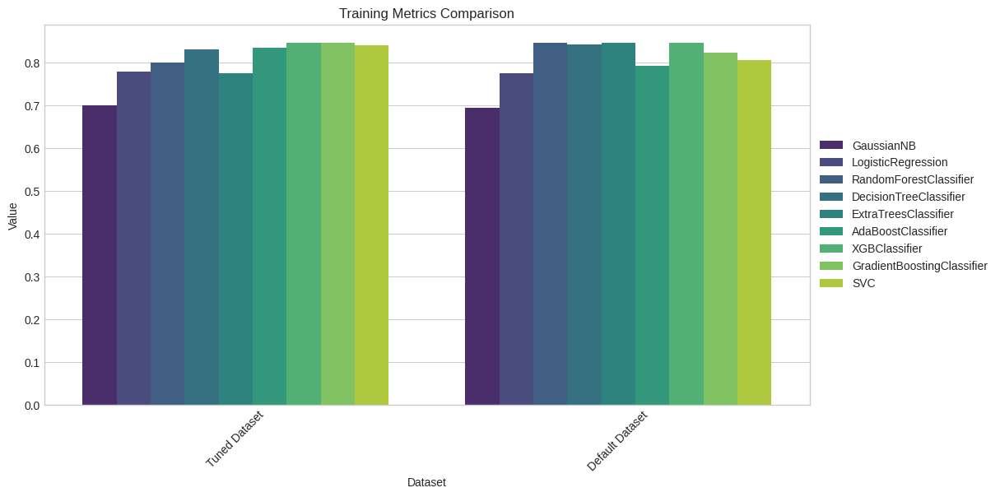

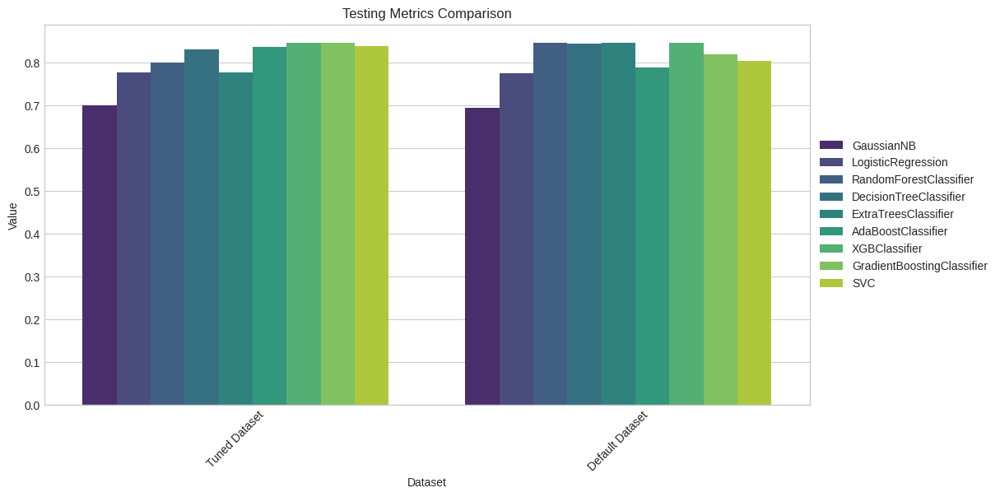

In [ ]:
# Combine metrics for training and testing results
training_results_combined_dnn = combine_metrics(training_results_dnn)
testing_results_combined_dnn = combine_metrics(testing_results_dnn)

# Plot all metrics for training and testing
plot_metrics(training_results_combined_dnn, 'Training Metrics Comparison')
plot_metrics(testing_results_combined_dnn, 'Testing Metrics Comparison')

CNN : Comparison between Tuned and Default Dataset

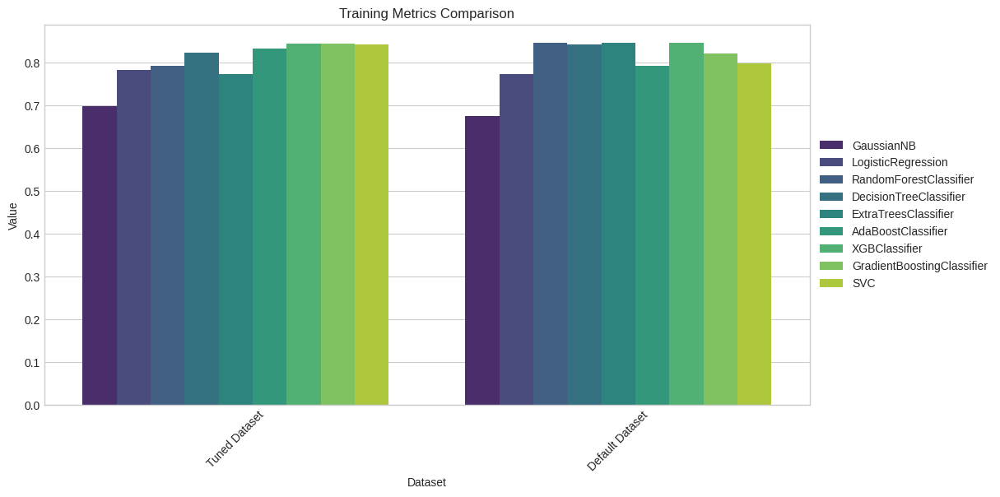

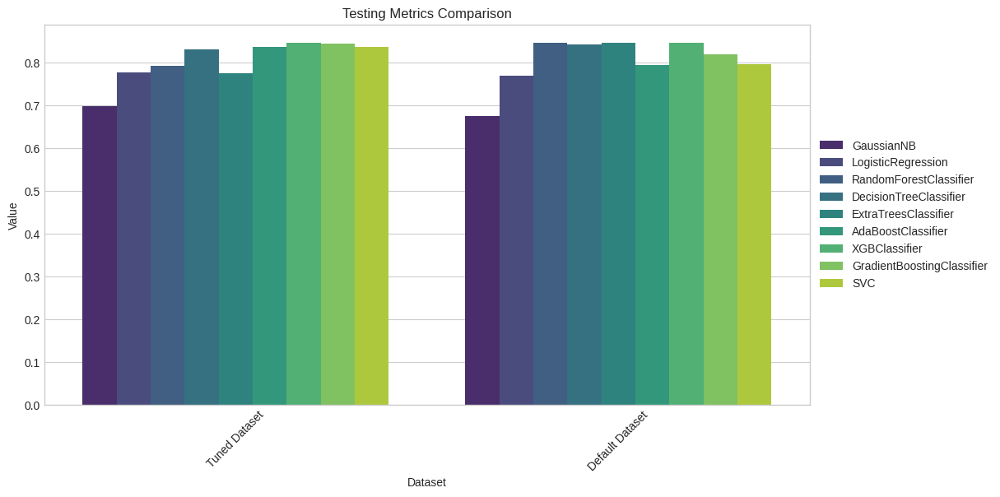

In [ ]:
# Combine metrics for training and testing results
training_results_combined_cnn = combine_metrics(training_results_cnn)
testing_results_combined_cnn = combine_metrics(testing_results_cnn)

# Plot all metrics for training and testing
plot_metrics(training_results_combined_cnn, 'Training Metrics Comparison')
plot_metrics(testing_results_combined_cnn, 'Testing Metrics Comparison')

RNN

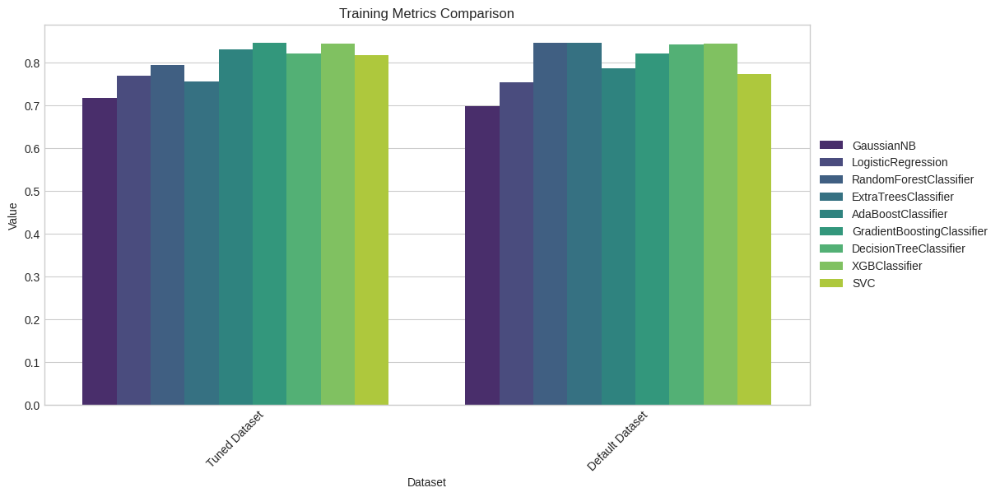

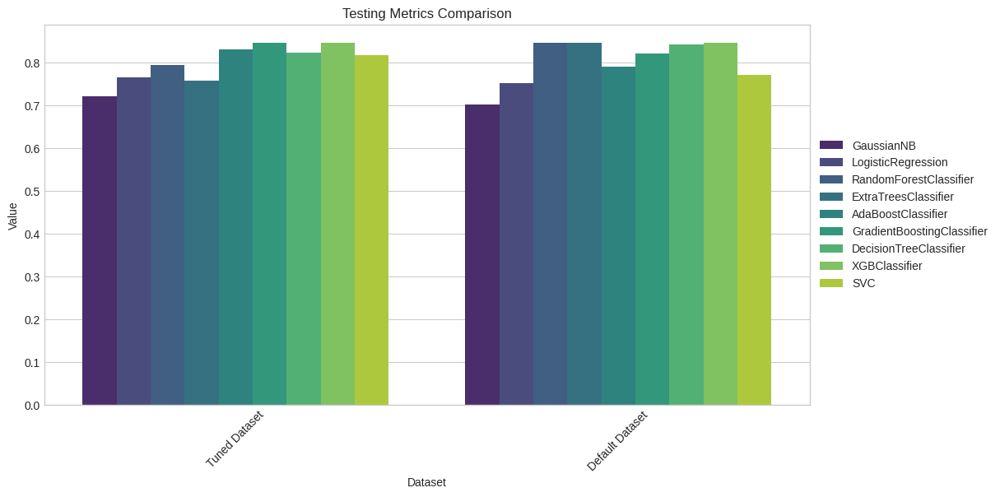

In [ ]:
# Combine metrics for training and testing results
training_results_combined_rnn = combine_metrics(training_results_rnn)
testing_results_combined_rnn = combine_metrics(testing_results_rnn)

# Plot all metrics for training and testing
plot_metrics(training_results_combined_rnn, 'Training Metrics Comparison')
plot_metrics(testing_results_combined_rnn, 'Testing Metrics Comparison')

### Ranking based on Different Metrics

DNN

Create DataFrames for to contain the best models for F1 Score, Accuracy

Accuracy

In [ ]:
training_results_dnn_acc = training_results_dnn.sort_values(by='Accuracy', ascending=False)
# Select the top 9 unique models
top_models_training_dnn_acc = training_results_dnn_acc.drop_duplicates(subset='Model').head(9)
top_models_training_dnn_acc

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset,NN_Model
10,RandomForestClassifier,0.985275,0.985272,0.985275,0.985269,39411,589,39411,589,0.985275,0.984325,0.015675,Default Dataset,DNN
13,ExtraTreesClassifier,0.985075,0.985074,0.985075,0.985067,39403,597,39403,597,0.985075,0.984022,0.015978,Default Dataset,DNN
6,XGBClassifier,0.984675,0.984671,0.984675,0.984669,39387,613,39387,613,0.984675,0.983752,0.016248,Tuned Dataset,DNN
7,GradientBoostingClassifier,0.983875,0.983871,0.983875,0.983869,39355,645,39355,645,0.983875,0.982924,0.017076,Tuned Dataset,DNN
11,DecisionTreeClassifier,0.979850,0.979846,0.979850,0.979847,39194,806,39194,806,0.979850,0.979000,0.021000,Default Dataset,DNN
16,SVC,0.978125,0.978120,0.978125,0.978110,39125,875,39125,875,0.978125,0.976682,0.023318,Tuned Dataset,DNN
5,AdaBoostClassifier,0.967675,0.967675,0.967675,0.967634,38707,1293,38707,1293,0.967675,0.965295,0.034705,Tuned Dataset,DNN
1,LogisticRegression,0.889900,0.889628,0.889900,0.889653,35596,4404,35596,4404,0.889900,0.883880,0.116120,Tuned Dataset,DNN
0,GaussianNB,0.774350,0.798883,0.774350,0.776170,30974,9026,30974,9026,0.774350,0.788591,0.211409,Tuned Dataset,DNN


In [ ]:
testing_results_dnn_acc = testing_results_dnn.sort_values(by='Accuracy', ascending=False)

# Select the top 8 unique models
top_models_testing_dnn_acc = testing_results_dnn_acc.drop_duplicates(subset='Model').head(9)

top_models_testing_dnn_acc

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset,NN_Model
6,XGBClassifier,0.9855,0.985500,0.9855,0.985493,9855,145,9855,145,0.9855,0.984507,0.015493,Tuned Dataset,DNN
10,RandomForestClassifier,0.9852,0.985200,0.9852,0.985192,9852,148,9852,148,0.9852,0.984178,0.015822,Default Dataset,DNN
13,ExtraTreesClassifier,0.9847,0.984697,0.9847,0.984693,9847,153,9847,153,0.9847,0.983755,0.016245,Default Dataset,DNN
7,GradientBoostingClassifier,0.9844,0.984401,0.9844,0.984391,9844,156,9844,156,0.9844,0.983314,0.016686,Tuned Dataset,DNN
11,DecisionTreeClassifier,0.9816,0.981595,0.9816,0.981596,9816,184,9816,184,0.9816,0.980756,0.019244,Default Dataset,DNN
16,SVC,0.9733,0.973291,0.9733,0.973280,9733,267,9733,267,0.9733,0.971672,0.028328,Tuned Dataset,DNN
5,AdaBoostClassifier,0.9705,0.970561,0.9705,0.970447,9705,295,9705,295,0.9705,0.967807,0.032193,Tuned Dataset,DNN
1,LogisticRegression,0.8883,0.888026,0.8883,0.888010,8883,1117,8883,1117,0.8883,0.882126,0.117874,Tuned Dataset,DNN
0,GaussianNB,0.7757,0.797958,0.7757,0.777452,7757,2243,7757,2243,0.7757,0.788655,0.211345,Tuned Dataset,DNN


F1_Score

In [ ]:
training_results_dnn_f1 = training_results_dnn.sort_values(by='F1 score', ascending=False)
# Select the top 8 unique models
top_models_training_dnn_f1 = training_results_dnn_f1.drop_duplicates(subset='Model').head(9)
top_models_training_dnn_f1

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset,NN_Model
10,RandomForestClassifier,0.985275,0.985272,0.985275,0.985269,39411,589,39411,589,0.985275,0.984325,0.015675,Default Dataset,DNN
13,ExtraTreesClassifier,0.985075,0.985074,0.985075,0.985067,39403,597,39403,597,0.985075,0.984022,0.015978,Default Dataset,DNN
6,XGBClassifier,0.984675,0.984671,0.984675,0.984669,39387,613,39387,613,0.984675,0.983752,0.016248,Tuned Dataset,DNN
7,GradientBoostingClassifier,0.983875,0.983871,0.983875,0.983869,39355,645,39355,645,0.983875,0.982924,0.017076,Tuned Dataset,DNN
11,DecisionTreeClassifier,0.979850,0.979846,0.979850,0.979847,39194,806,39194,806,0.979850,0.979000,0.021000,Default Dataset,DNN
16,SVC,0.978125,0.978120,0.978125,0.978110,39125,875,39125,875,0.978125,0.976682,0.023318,Tuned Dataset,DNN
5,AdaBoostClassifier,0.967675,0.967675,0.967675,0.967634,38707,1293,38707,1293,0.967675,0.965295,0.034705,Tuned Dataset,DNN
1,LogisticRegression,0.889900,0.889628,0.889900,0.889653,35596,4404,35596,4404,0.889900,0.883880,0.116120,Tuned Dataset,DNN
0,GaussianNB,0.774350,0.798883,0.774350,0.776170,30974,9026,30974,9026,0.774350,0.788591,0.211409,Tuned Dataset,DNN


In [ ]:
testing_results_dnn_f1 = testing_results_dnn.sort_values(by='F1 score', ascending=False)

# Select the top 8 unique models
top_models_testing_dnn_f1 = testing_results_dnn_f1.drop_duplicates(subset='Model').head(9)

top_models_testing_dnn_f1

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset,NN_Model
6,XGBClassifier,0.9855,0.985500,0.9855,0.985493,9855,145,9855,145,0.9855,0.984507,0.015493,Tuned Dataset,DNN
10,RandomForestClassifier,0.9852,0.985200,0.9852,0.985192,9852,148,9852,148,0.9852,0.984178,0.015822,Default Dataset,DNN
13,ExtraTreesClassifier,0.9847,0.984697,0.9847,0.984693,9847,153,9847,153,0.9847,0.983755,0.016245,Default Dataset,DNN
7,GradientBoostingClassifier,0.9844,0.984401,0.9844,0.984391,9844,156,9844,156,0.9844,0.983314,0.016686,Tuned Dataset,DNN
11,DecisionTreeClassifier,0.9816,0.981595,0.9816,0.981596,9816,184,9816,184,0.9816,0.980756,0.019244,Default Dataset,DNN
16,SVC,0.9733,0.973291,0.9733,0.973280,9733,267,9733,267,0.9733,0.971672,0.028328,Tuned Dataset,DNN
5,AdaBoostClassifier,0.9705,0.970561,0.9705,0.970447,9705,295,9705,295,0.9705,0.967807,0.032193,Tuned Dataset,DNN
1,LogisticRegression,0.8883,0.888026,0.8883,0.888010,8883,1117,8883,1117,0.8883,0.882126,0.117874,Tuned Dataset,DNN
0,GaussianNB,0.7757,0.797958,0.7757,0.777452,7757,2243,7757,2243,0.7757,0.788655,0.211345,Tuned Dataset,DNN


CNN

In [ ]:
training_results_cnn_acc = training_results_cnn.sort_values(by='Accuracy', ascending=False)
# Select the top 8 unique models
top_models_training_cnn_acc = training_results_cnn_acc.drop_duplicates(subset='Model').head(9)
top_models_training_cnn_acc

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset,NN_Model
13,ExtraTreesClassifier,0.986000,0.985998,0.986000,0.985994,39440,560,39440,560,0.986000,0.985062,0.014938,Default Dataset,CNN
10,RandomForestClassifier,0.985600,0.985598,0.985600,0.985594,39424,576,39424,576,0.985600,0.984647,0.015353,Default Dataset,CNN
14,XGBClassifier,0.985000,0.984996,0.985000,0.984995,39400,600,39400,600,0.985000,0.984122,0.015878,Default Dataset,CNN
7,GradientBoostingClassifier,0.982825,0.982822,0.982825,0.982816,39313,687,39313,687,0.982825,0.981683,0.018317,Tuned Dataset,CNN
11,DecisionTreeClassifier,0.980725,0.980721,0.980725,0.980722,39229,771,39229,771,0.980725,0.979911,0.020089,Default Dataset,CNN
16,SVC,0.979750,0.979747,0.979750,0.979736,39190,810,39190,810,0.979750,0.978360,0.021640,Tuned Dataset,CNN
5,AdaBoostClassifier,0.968075,0.968063,0.968075,0.968043,38723,1277,38723,1277,0.968075,0.965968,0.034032,Tuned Dataset,CNN
1,LogisticRegression,0.895525,0.895307,0.895525,0.895162,35821,4179,35821,4179,0.895525,0.888645,0.111355,Tuned Dataset,CNN
0,GaussianNB,0.774625,0.794229,0.774625,0.776556,30985,9015,30985,9015,0.774625,0.785966,0.214034,Tuned Dataset,CNN


In [ ]:
testing_results_cnn_acc = testing_results_cnn.sort_values(by='Accuracy', ascending=False)
# Select the top 9 unique models
top_models_testing_cnn_acc = testing_results_cnn_acc.drop_duplicates(subset='Model').head(9)

top_models_testing_cnn_acc

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset,NN_Model
10,RandomForestClassifier,0.9862,0.986203,0.9862,0.986192,9862,138,9862,138,0.9862,0.985175,0.014825,Default Dataset,CNN
13,ExtraTreesClassifier,0.9854,0.985398,0.9854,0.985393,9854,146,9854,146,0.9854,0.984460,0.015540,Default Dataset,CNN
6,XGBClassifier,0.9846,0.984605,0.9846,0.984589,9846,154,9846,154,0.9846,0.983409,0.016591,Tuned Dataset,CNN
7,GradientBoostingClassifier,0.9831,0.983110,0.9831,0.983086,9831,169,9831,169,0.9831,0.981727,0.018273,Tuned Dataset,CNN
11,DecisionTreeClassifier,0.9793,0.979297,0.9793,0.979286,9793,207,9793,207,0.9793,0.977949,0.022051,Default Dataset,CNN
16,SVC,0.9731,0.973117,0.9731,0.973066,9731,269,9731,269,0.9731,0.970980,0.029020,Tuned Dataset,CNN
5,AdaBoostClassifier,0.9713,0.971316,0.9713,0.971263,9713,287,9713,287,0.9713,0.969082,0.030918,Tuned Dataset,CNN
1,LogisticRegression,0.8877,0.887497,0.8877,0.887233,8877,1123,8877,1123,0.8877,0.880199,0.119801,Tuned Dataset,CNN
0,GaussianNB,0.7744,0.792107,0.7744,0.776248,7744,2256,7744,2256,0.7744,0.784566,0.215434,Tuned Dataset,CNN


In [ ]:
training_results_cnn_f1 = training_results_cnn.sort_values(by='F1 score', ascending=False)
# Select the top 9 unique models
top_models_training_cnn_f1 = training_results_cnn_f1.drop_duplicates(subset='Model').head(9)
top_models_training_cnn_f1

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset,NN_Model
13,ExtraTreesClassifier,0.986000,0.985998,0.986000,0.985994,39440,560,39440,560,0.986000,0.985062,0.014938,Default Dataset,CNN
10,RandomForestClassifier,0.985600,0.985598,0.985600,0.985594,39424,576,39424,576,0.985600,0.984647,0.015353,Default Dataset,CNN
14,XGBClassifier,0.985000,0.984996,0.985000,0.984995,39400,600,39400,600,0.985000,0.984122,0.015878,Default Dataset,CNN
7,GradientBoostingClassifier,0.982825,0.982822,0.982825,0.982816,39313,687,39313,687,0.982825,0.981683,0.018317,Tuned Dataset,CNN
11,DecisionTreeClassifier,0.980725,0.980721,0.980725,0.980722,39229,771,39229,771,0.980725,0.979911,0.020089,Default Dataset,CNN
16,SVC,0.979750,0.979747,0.979750,0.979736,39190,810,39190,810,0.979750,0.978360,0.021640,Tuned Dataset,CNN
5,AdaBoostClassifier,0.968075,0.968063,0.968075,0.968043,38723,1277,38723,1277,0.968075,0.965968,0.034032,Tuned Dataset,CNN
1,LogisticRegression,0.895525,0.895307,0.895525,0.895162,35821,4179,35821,4179,0.895525,0.888645,0.111355,Tuned Dataset,CNN
0,GaussianNB,0.774625,0.794229,0.774625,0.776556,30985,9015,30985,9015,0.774625,0.785966,0.214034,Tuned Dataset,CNN


In [ ]:
testing_results_cnn_f1 = testing_results_cnn.sort_values(by='F1 score', ascending=False)
# Select the top 9 unique models
top_models_testing_cnn_f1 = testing_results_cnn_f1.drop_duplicates(subset='Model').head(9)
top_models_testing_cnn_f1

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset,NN_Model
10,RandomForestClassifier,0.9862,0.986203,0.9862,0.986192,9862,138,9862,138,0.9862,0.985175,0.014825,Default Dataset,CNN
13,ExtraTreesClassifier,0.9854,0.985398,0.9854,0.985393,9854,146,9854,146,0.9854,0.984460,0.015540,Default Dataset,CNN
14,XGBClassifier,0.9846,0.984597,0.9846,0.984594,9846,154,9846,154,0.9846,0.983707,0.016293,Default Dataset,CNN
7,GradientBoostingClassifier,0.9831,0.983110,0.9831,0.983086,9831,169,9831,169,0.9831,0.981727,0.018273,Tuned Dataset,CNN
11,DecisionTreeClassifier,0.9793,0.979297,0.9793,0.979286,9793,207,9793,207,0.9793,0.977949,0.022051,Default Dataset,CNN
16,SVC,0.9731,0.973117,0.9731,0.973066,9731,269,9731,269,0.9731,0.970980,0.029020,Tuned Dataset,CNN
5,AdaBoostClassifier,0.9713,0.971316,0.9713,0.971263,9713,287,9713,287,0.9713,0.969082,0.030918,Tuned Dataset,CNN
1,LogisticRegression,0.8877,0.887497,0.8877,0.887233,8877,1123,8877,1123,0.8877,0.880199,0.119801,Tuned Dataset,CNN
0,GaussianNB,0.7744,0.792107,0.7744,0.776248,7744,2256,7744,2256,0.7744,0.784566,0.215434,Tuned Dataset,CNN


RNN

In [ ]:
training_results_rnn_acc = training_results_rnn.sort_values(by='Accuracy', ascending=False)
# Select the top 9 unique models
top_models_training_rnn_acc = training_results_rnn_acc.drop_duplicates(subset='Model').head(9)
top_models_training_rnn_acc

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset,NN_Model
9,ExtraTreesClassifier,0.986275,0.986276,0.986275,0.986268,39451,549,39451,549,0.986275,0.985255,0.014745,Default Dataset,RNN
13,RandomForestClassifier,0.985500,0.985499,0.985500,0.985493,39420,580,39420,580,0.985500,0.984506,0.015494,Default Dataset,RNN
5,GradientBoostingClassifier,0.984675,0.984672,0.984675,0.984669,39387,613,39387,613,0.984675,0.983714,0.016286,Tuned Dataset,RNN
12,XGBClassifier,0.984275,0.984271,0.984275,0.984271,39371,629,39371,629,0.984275,0.983472,0.016528,Tuned Dataset,RNN
14,DecisionTreeClassifier,0.980600,0.980594,0.980600,0.980596,39224,776,39224,776,0.980600,0.979710,0.020290,Default Dataset,RNN
4,AdaBoostClassifier,0.963725,0.963713,0.963725,0.963680,38549,1451,38549,1451,0.963725,0.961233,0.038767,Tuned Dataset,RNN
16,SVC,0.945225,0.945172,0.945225,0.945184,37809,2191,37809,2191,0.945225,0.942556,0.057444,Tuned Dataset,RNN
1,LogisticRegression,0.878975,0.878650,0.878975,0.878700,35159,4841,35159,4841,0.878975,0.872543,0.127457,Tuned Dataset,RNN
0,GaussianNB,0.805675,0.806190,0.805675,0.805900,32227,7773,32227,7773,0.805675,0.799977,0.200023,Tuned Dataset,RNN


In [ ]:
testing_results_rnn_acc = testing_results_rnn.sort_values(by='Accuracy', ascending=False)
# Select the top 9 unique models
top_models_testing_rnn_acc = testing_results_rnn_acc.drop_duplicates(subset='Model').head(9)
top_models_testing_rnn_acc

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset,NN_Model
9,ExtraTreesClassifier,0.9859,0.985900,0.9859,0.985893,9859,141,9859,141,0.9859,0.984921,0.015079,Default Dataset,RNN
12,XGBClassifier,0.9859,0.985899,0.9859,0.985893,9859,141,9859,141,0.9859,0.984958,0.015042,Tuned Dataset,RNN
13,RandomForestClassifier,0.9857,0.985698,0.9857,0.985694,9857,143,9857,143,0.9857,0.984788,0.015212,Default Dataset,RNN
5,GradientBoostingClassifier,0.9848,0.984800,0.9848,0.984792,9848,152,9848,152,0.9848,0.983765,0.016235,Tuned Dataset,RNN
14,DecisionTreeClassifier,0.9815,0.981494,0.9815,0.981495,9815,185,9815,185,0.9815,0.980634,0.019366,Default Dataset,RNN
4,AdaBoostClassifier,0.9637,0.963720,0.9637,0.963641,9637,363,9637,363,0.9637,0.960927,0.039073,Tuned Dataset,RNN
16,SVC,0.9440,0.943941,0.9440,0.943931,9440,560,9440,560,0.9440,0.940917,0.059083,Tuned Dataset,RNN
1,LogisticRegression,0.8729,0.872555,0.8729,0.872608,8729,1271,8729,1271,0.8729,0.866468,0.133532,Tuned Dataset,RNN
0,GaussianNB,0.8090,0.809241,0.8090,0.809112,8090,1910,8090,1910,0.8090,0.803158,0.196842,Tuned Dataset,RNN


In [ ]:
training_results_rnn_f1 = training_results_rnn.sort_values(by='F1 score', ascending=False)
# Select the top 9 unique models
top_models_training_rnn_f1 = training_results_rnn_f1.drop_duplicates(subset='Model').head(9)
top_models_training_rnn_f1

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset,NN_Model
9,ExtraTreesClassifier,0.986275,0.986276,0.986275,0.986268,39451,549,39451,549,0.986275,0.985255,0.014745,Default Dataset,RNN
13,RandomForestClassifier,0.985500,0.985499,0.985500,0.985493,39420,580,39420,580,0.985500,0.984506,0.015494,Default Dataset,RNN
5,GradientBoostingClassifier,0.984675,0.984672,0.984675,0.984669,39387,613,39387,613,0.984675,0.983714,0.016286,Tuned Dataset,RNN
12,XGBClassifier,0.984275,0.984271,0.984275,0.984271,39371,629,39371,629,0.984275,0.983472,0.016528,Tuned Dataset,RNN
14,DecisionTreeClassifier,0.980600,0.980594,0.980600,0.980596,39224,776,39224,776,0.980600,0.979710,0.020290,Default Dataset,RNN
4,AdaBoostClassifier,0.963725,0.963713,0.963725,0.963680,38549,1451,38549,1451,0.963725,0.961233,0.038767,Tuned Dataset,RNN
16,SVC,0.945225,0.945172,0.945225,0.945184,37809,2191,37809,2191,0.945225,0.942556,0.057444,Tuned Dataset,RNN
1,LogisticRegression,0.878975,0.878650,0.878975,0.878700,35159,4841,35159,4841,0.878975,0.872543,0.127457,Tuned Dataset,RNN
0,GaussianNB,0.805675,0.806190,0.805675,0.805900,32227,7773,32227,7773,0.805675,0.799977,0.200023,Tuned Dataset,RNN


In [ ]:
testing_results_rnn_f1 = testing_results_rnn.sort_values(by='F1 score', ascending=False)
top_models_testing_rnn_f1 = testing_results_rnn_f1.drop_duplicates(subset='Model').head(9)

top_models_testing_rnn_f1

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset,NN_Model
12,XGBClassifier,0.9859,0.985899,0.9859,0.985893,9859,141,9859,141,0.9859,0.984958,0.015042,Tuned Dataset,RNN
9,ExtraTreesClassifier,0.9859,0.985900,0.9859,0.985893,9859,141,9859,141,0.9859,0.984921,0.015079,Default Dataset,RNN
13,RandomForestClassifier,0.9857,0.985698,0.9857,0.985694,9857,143,9857,143,0.9857,0.984788,0.015212,Default Dataset,RNN
5,GradientBoostingClassifier,0.9848,0.984800,0.9848,0.984792,9848,152,9848,152,0.9848,0.983765,0.016235,Tuned Dataset,RNN
14,DecisionTreeClassifier,0.9815,0.981494,0.9815,0.981495,9815,185,9815,185,0.9815,0.980634,0.019366,Default Dataset,RNN
4,AdaBoostClassifier,0.9637,0.963720,0.9637,0.963641,9637,363,9637,363,0.9637,0.960927,0.039073,Tuned Dataset,RNN
16,SVC,0.9440,0.943941,0.9440,0.943931,9440,560,9440,560,0.9440,0.940917,0.059083,Tuned Dataset,RNN
1,LogisticRegression,0.8729,0.872555,0.8729,0.872608,8729,1271,8729,1271,0.8729,0.866468,0.133532,Tuned Dataset,RNN
0,GaussianNB,0.8090,0.809241,0.8090,0.809112,8090,1910,8090,1910,0.8090,0.803158,0.196842,Tuned Dataset,RNN


Plotting all these values

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def combine_metrics_nn(df):
    # Combine all metrics into a single column
    df_combined = pd.melt(df, id_vars=['Model', 'NN_Model'], value_vars=[
        'Accuracy', 'Precision', 'Recall', 'F1 score',
        'Sensitivity (TPR)', 'Specificity', 'False Positive Rate'
    ], var_name='Metric', value_name='Value')
    return df_combined

def plot_metrics_nn(df, title):
    plt.figure(figsize=(12, 6))
    sns.barplot(x='NN_Model', y='Value', hue='Model', data=df, palette='viridis', ci=None)
    plt.title(title)
    plt.ylabel('Value')
    plt.xticks(rotation=45)

    # Place legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()

Combining our results

In [ ]:
f1_training_top_models = pd.concat([top_models_training_dnn_f1, top_models_training_cnn_f1, top_models_training_rnn_f1])
f1_testing_top_models = pd.concat([top_models_testing_dnn_f1, top_models_testing_cnn_f1, top_models_testing_rnn_f1])

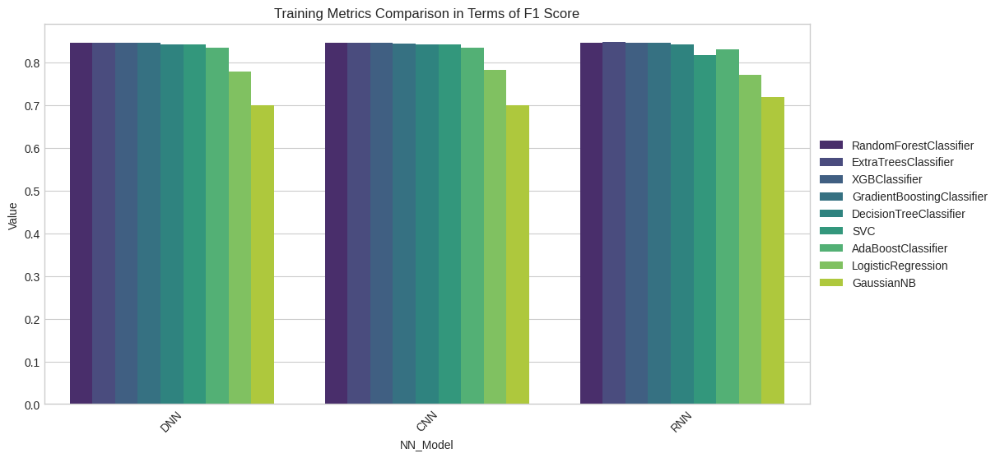

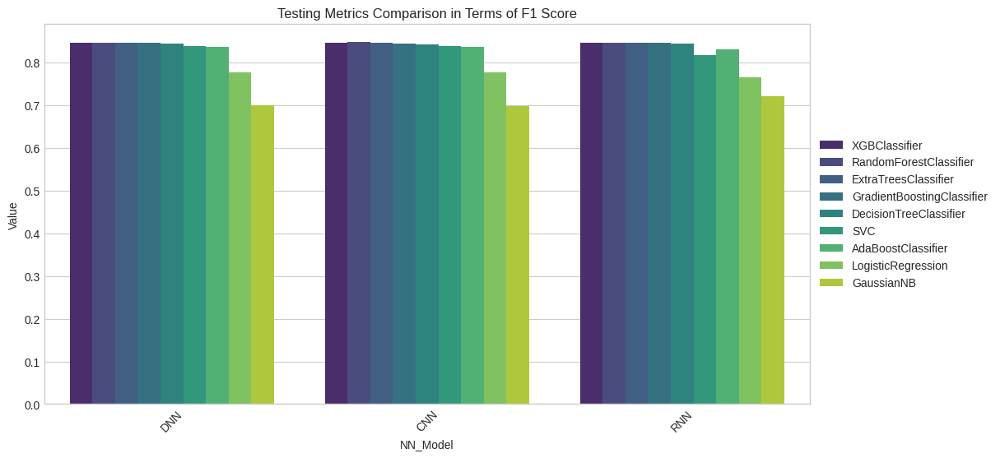

In [ ]:
# Combine metrics for training and testing results
f1_training_top_models_combined = combine_metrics_nn(f1_training_top_models)
f1_testing_top_models_combined = combine_metrics_nn(f1_testing_top_models)

# Plot all metrics for training and testing
plot_metrics_nn(f1_training_top_models_combined, 'Training Metrics Comparison in Terms of F1 Score')
plot_metrics_nn(f1_testing_top_models_combined, 'Testing Metrics Comparison in Terms of F1 Score')

In [ ]:
acc_training_top_models = pd.concat([top_models_training_dnn_acc, top_models_training_cnn_acc, top_models_training_rnn_acc])
acc_testing_top_models = pd.concat([top_models_testing_dnn_acc, top_models_testing_cnn_acc, top_models_testing_rnn_acc])

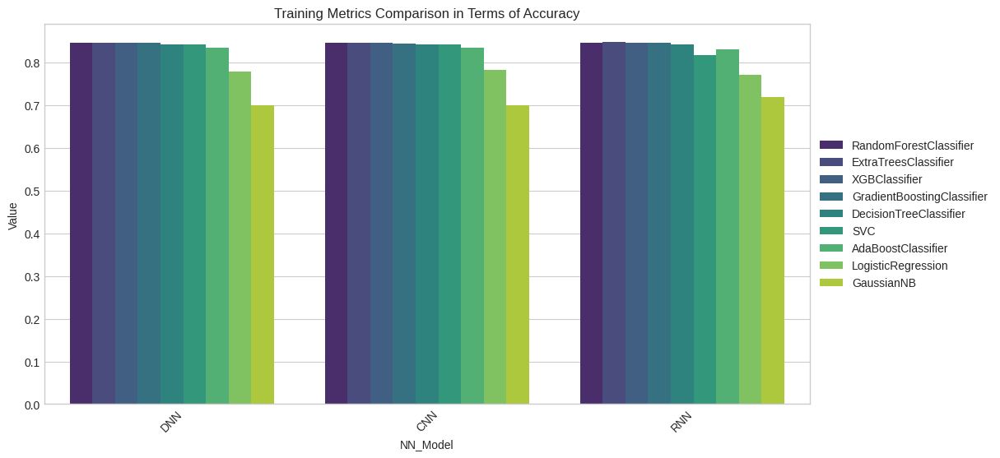

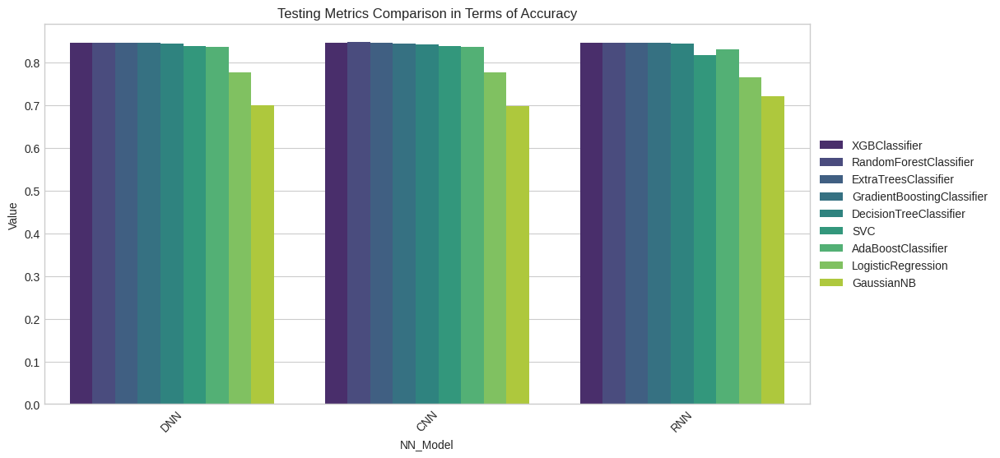

In [ ]:
# Combine metrics for training and testing results
acc_training_top_models_combined = combine_metrics_nn(acc_training_top_models)
acc_testing_top_models_combined = combine_metrics_nn(acc_testing_top_models)

# Plot all metrics for training and testing
plot_metrics_nn(acc_training_top_models_combined, 'Training Metrics Comparison in Terms of Accuracy')
plot_metrics_nn(acc_testing_top_models_combined, 'Testing Metrics Comparison in Terms of Accuracy')

Final Proposed Approach

In [ ]:
new_df = acc_training_top_models.sort_values(by='Accuracy', ascending=False)
new_df.head(5)

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset,NN_Model
9,ExtraTreesClassifier,0.986275,0.986276,0.986275,0.986268,39451,549,39451,549,0.986275,0.985255,0.014745,Default Dataset,RNN
13,ExtraTreesClassifier,0.986000,0.985998,0.986000,0.985994,39440,560,39440,560,0.986000,0.985062,0.014938,Default Dataset,CNN
10,RandomForestClassifier,0.985600,0.985598,0.985600,0.985594,39424,576,39424,576,0.985600,0.984647,0.015353,Default Dataset,CNN
13,RandomForestClassifier,0.985500,0.985499,0.985500,0.985493,39420,580,39420,580,0.985500,0.984506,0.015494,Default Dataset,RNN
10,RandomForestClassifier,0.985275,0.985272,0.985275,0.985269,39411,589,39411,589,0.985275,0.984325,0.015675,Default Dataset,DNN


In [ ]:
print(acc_testing_top_models)

                         Model  Accuracy  Precision  Recall  F1 score  \
6                XGBClassifier    0.9855   0.985500  0.9855  0.985493   
10      RandomForestClassifier    0.9852   0.985200  0.9852  0.985192   
13        ExtraTreesClassifier    0.9847   0.984697  0.9847  0.984693   
7   GradientBoostingClassifier    0.9844   0.984401  0.9844  0.984391   
11      DecisionTreeClassifier    0.9816   0.981595  0.9816  0.981596   
16                         SVC    0.9733   0.973291  0.9733  0.973280   
5           AdaBoostClassifier    0.9705   0.970561  0.9705  0.970447   
1           LogisticRegression    0.8883   0.888026  0.8883  0.888010   
0                   GaussianNB    0.7757   0.797958  0.7757  0.777452   
10      RandomForestClassifier    0.9862   0.986203  0.9862  0.986192   
13        ExtraTreesClassifier    0.9854   0.985398  0.9854  0.985393   
6                XGBClassifier    0.9846   0.984605  0.9846  0.984589   
7   GradientBoostingClassifier    0.9831   0.983110

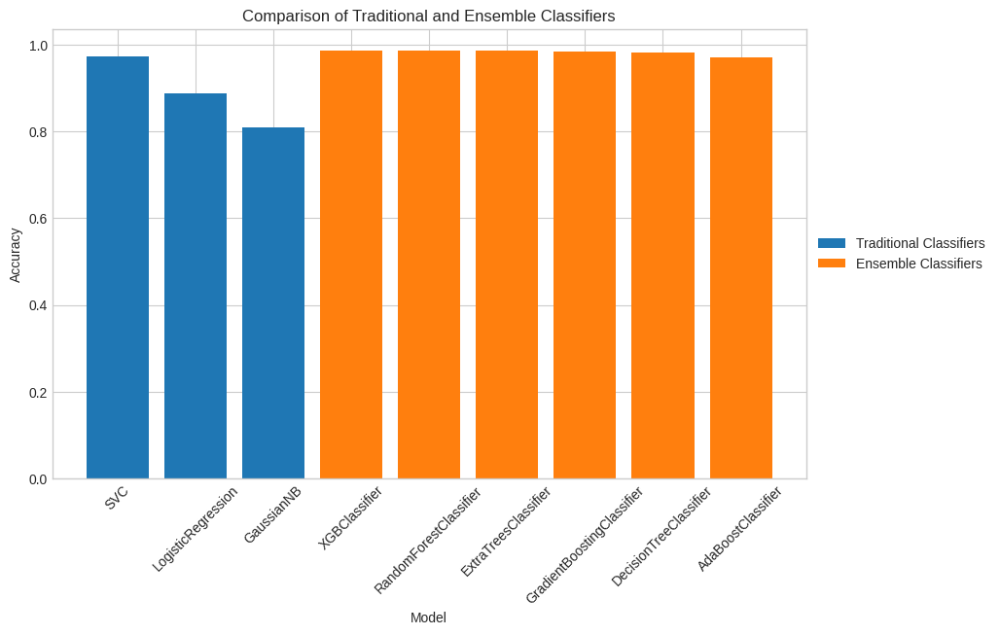

<Figure size 640x480 with 0 Axes>

In [ ]:
df_temp = acc_testing_top_models.copy()

# Split the data into two dataframes
traditional_classifiers = df_temp[df_temp['Model'].isin(['SVC', 'LogisticRegression', 'GaussianNB'])]
ensemble_classifiers = df_temp[~df_temp['Model'].isin(['SVC', 'LogisticRegression', 'GaussianNB'])]

# Plot the data
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.bar(traditional_classifiers['Model'], traditional_classifiers['Accuracy'], label='Traditional Classifiers')
plt.bar(ensemble_classifiers['Model'], ensemble_classifiers['Accuracy'], label='Ensemble Classifiers', )
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Comparison of Traditional and Ensemble Classifiers')
plt.xticks(rotation=45)
# Place legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()
plt.tight_layout()
plt.show()

In [ ]:
new_df_02 = acc_testing_top_models.sort_values(by='Accuracy', ascending=False)
new_df_02.head(5)

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset,NN_Model
10,RandomForestClassifier,0.9862,0.986203,0.9862,0.986192,9862,138,9862,138,0.9862,0.985175,0.014825,Default Dataset,CNN
9,ExtraTreesClassifier,0.9859,0.985900,0.9859,0.985893,9859,141,9859,141,0.9859,0.984921,0.015079,Default Dataset,RNN
12,XGBClassifier,0.9859,0.985899,0.9859,0.985893,9859,141,9859,141,0.9859,0.984958,0.015042,Tuned Dataset,RNN
13,RandomForestClassifier,0.9857,0.985698,0.9857,0.985694,9857,143,9857,143,0.9857,0.984788,0.015212,Default Dataset,RNN
6,XGBClassifier,0.9855,0.985500,0.9855,0.985493,9855,145,9855,145,0.9855,0.984507,0.015493,Tuned Dataset,DNN


In [ ]:
new_df_03 = f1_training_top_models.sort_values(by='F1 score', ascending=False)
new_df_03.head(5)

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset,NN_Model
9,ExtraTreesClassifier,0.986275,0.986276,0.986275,0.986268,39451,549,39451,549,0.986275,0.985255,0.014745,Default Dataset,RNN
13,ExtraTreesClassifier,0.986000,0.985998,0.986000,0.985994,39440,560,39440,560,0.986000,0.985062,0.014938,Default Dataset,CNN
10,RandomForestClassifier,0.985600,0.985598,0.985600,0.985594,39424,576,39424,576,0.985600,0.984647,0.015353,Default Dataset,CNN
13,RandomForestClassifier,0.985500,0.985499,0.985500,0.985493,39420,580,39420,580,0.985500,0.984506,0.015494,Default Dataset,RNN
10,RandomForestClassifier,0.985275,0.985272,0.985275,0.985269,39411,589,39411,589,0.985275,0.984325,0.015675,Default Dataset,DNN


In [ ]:
new_df_04 = f1_testing_top_models.sort_values(by='F1 score', ascending=False)
new_df_04.head(5)

,Model,Accuracy,Precision,Recall,F1 score,True Positive,False Positive,True Negative,False Negative,Sensitivity (TPR),Specificity,False Positive Rate,Dataset,NN_Model
10,RandomForestClassifier,0.9862,0.986203,0.9862,0.986192,9862,138,9862,138,0.9862,0.985175,0.014825,Default Dataset,CNN
12,XGBClassifier,0.9859,0.985899,0.9859,0.985893,9859,141,9859,141,0.9859,0.984958,0.015042,Tuned Dataset,RNN
9,ExtraTreesClassifier,0.9859,0.985900,0.9859,0.985893,9859,141,9859,141,0.9859,0.984921,0.015079,Default Dataset,RNN
13,RandomForestClassifier,0.9857,0.985698,0.9857,0.985694,9857,143,9857,143,0.9857,0.984788,0.015212,Default Dataset,RNN
6,XGBClassifier,0.9855,0.985500,0.9855,0.985493,9855,145,9855,145,0.9855,0.984507,0.015493,Tuned Dataset,DNN


## Proposed Model Results Summary

Parameter Tuned XGBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation
------------------------------------------------------------------------------------------------
Overall Metrics for Training set:
------------------------------------------------------------------------------------------------
Accuracy: 0.984675
Precision: 0.9846712159048826
Recall (TPR): 0.984675
False Positive Rate (FPR): 0.016248062961436882
F1 score (F-measure): 0.9846691291142384
Specificity: 0.9837519370385631
------------------------------------------------------------------------------------------------

Classwise Metrics for Training Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.984675,0.985452,0.988736,0.021232,0.987091,23437,346,15950,267
1,1,0.984675,0.983536,0.978768,0.011264,0.981146,15950,267,23437,346


------------------------------------------------------------------------------------------------
Confusion Matrix for Train Set
------------------------------------------------------------------------------------------------


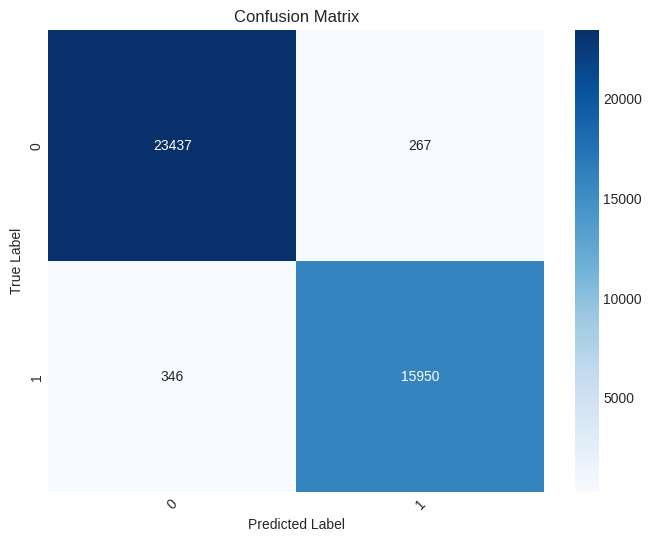

------------------------------------------------------------------------------------------------

Overall Metrics for Test set:
------------------------------------------------------------------------------------------------
Accuracy: 0.9855
Precision: 0.9855000167805396
Recall (TPR): 0.9855
False Positive Rate (FPR): 0.015492943420047922
F1 score (F-measure): 0.9854925743100607
Specificity: 0.9845070565799521
------------------------------------------------------------------------------------------------

Classwise Metrics for Test Set:


,Class,Accuracy,Precision,Recall (TPR),FPR,F1 Score (F-measure),TP,FP,TN,FN
0,0,0.9855,0.985497,0.990005,0.020991,0.987746,5844,86,4011,59
1,1,0.9855,0.985504,0.979009,0.009995,0.982246,4011,59,5844,86


------------------------------------------------------------------------------------------------
Confusion Matrix for Test Set
------------------------------------------------------------------------------------------------


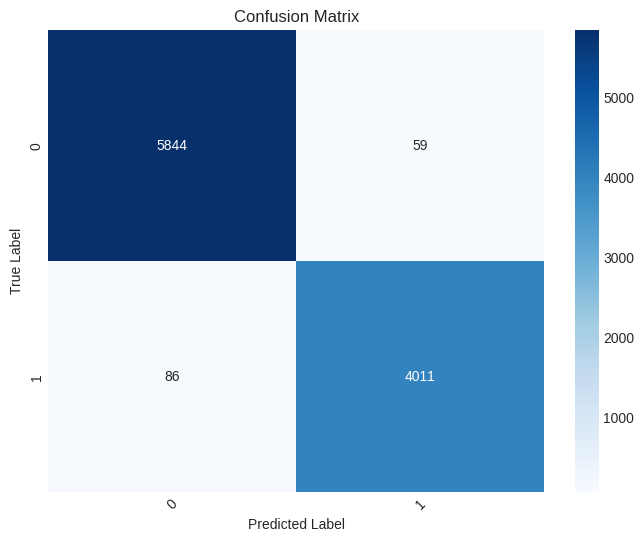

In [ ]:
print("Parameter Tuned XGBoost performance for Selected Training and Testing dataset with 10-fold crossvalidation")
print("------------------------------------------------------------------------------------------------")
xgb_dnn_result_1 = runclassifier(model_xgb,X_train_selected_dnn_ga, y_train_dnn_ga,X_test_selected_dnn_ga, y_test_dnn_ga)

ROC Curve for Train Set
------------------------------------------------------------------------------------------------


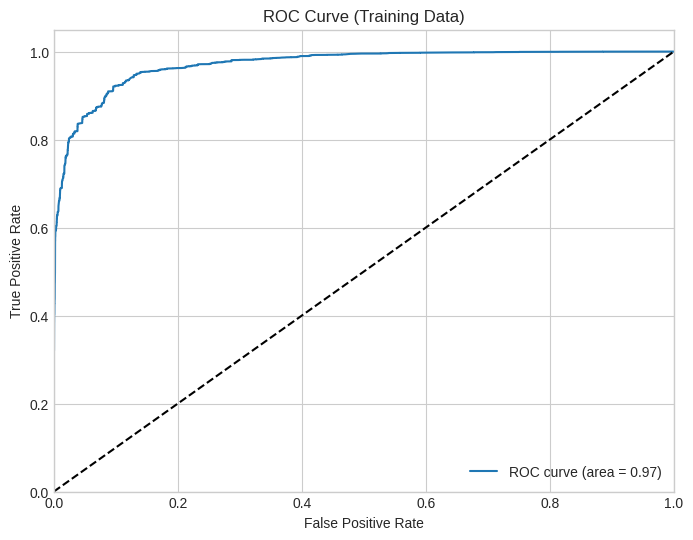

------------------------------------------------------------------------------------------------
ROC Curve for Test Set
------------------------------------------------------------------------------------------------


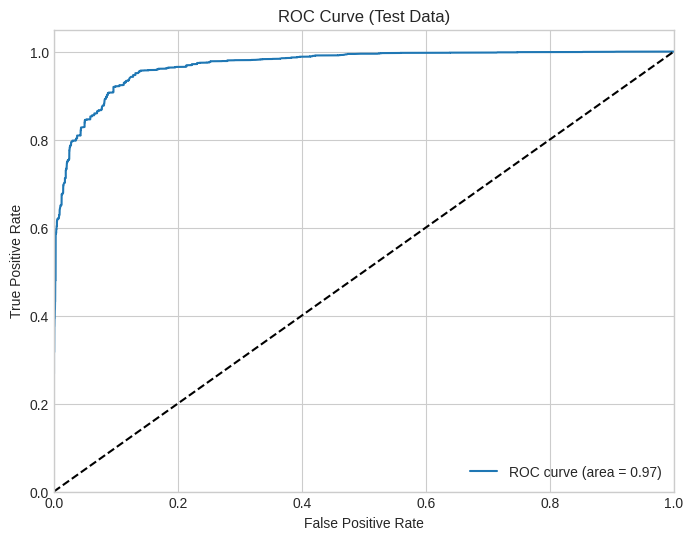

In [ ]:
#print("------------------------------------------------------------------------------------------------")
print("ROC Curve for Train Set")
print("------------------------------------------------------------------------------------------------")
plot_roc_for_classes(y_train_bin, model_xgb.predict_proba(X_train_selected_dnn_ga)[:, 1], unique_labels, title="ROC Curve (Training Data)")
print("------------------------------------------------------------------------------------------------")
print("ROC Curve for Test Set")
print("------------------------------------------------------------------------------------------------")
plot_roc_for_classes(y_test_bin, model_xgb.predict_proba(X_test_selected_dnn_ga)[:, 1], unique_labels, title="ROC Curve (Test Data)")
